In [19]:
#!/usr/bin/env python

#import pyfits, os, re, glob, sys
import  os, re, glob, sys
from scipy.optimize import leastsq
from numpy import *
from pylab import *
from scipy import *
from scipy import optimize
import numpy as N
import pylab as P

import numpy as np
from scipy.optimize import curve_fit

𝑦=𝑀(1−𝑒**−𝑎𝑥)

In [20]:
import numpy as np
import matplotlib.pyplot as plt

from sklearn import linear_model
from scipy.special import expit
from numpy import math
import pandas as pd

As a quick and dirty alternative to the perhaps more principled approach, here is something you could try. Ultimately, it could be merged with an direct estimation approach.
If you assume your responses are governed by two exponential processes characterizing the rise and decay of your calcium signal,
you could see a solution of this form:

2:20
y = K1*(1-e^(t/tau1)) - K2*(1-e(t/tau2))
If you plot this out, you'll see that the first term gives you a simple asymptotic rise to a plateau at K1 (according to time constant tau1), and the second term can account for a slow decay according to tau2.
2:22
Here is some simple characteristics of model:
If your muscle rises to a steady plateau, K2 is likely to be zero, the exception being if the rise time is not well fir by a single exponential, in which case you might have a situation where K1>K2.
If your muscle rises and then decays back to zero and steady state, then K1=K2.

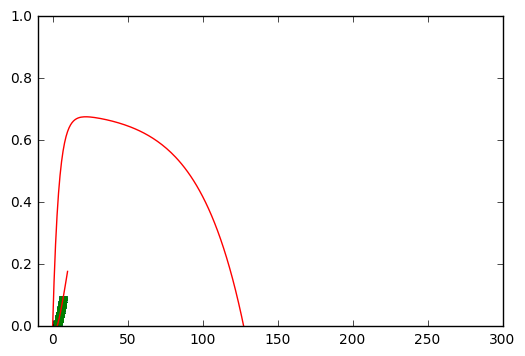

In [315]:
#y = K1*(1-e^(t/tau1)) - K2*(1-e(t/tau2))

plt.figure(1, figsize=(4, 3))
t = np.arange(0,300)
K1 = 0.7
K2 = 0.01
tau1 = 4.
tau2 = 30.
#y = K1*(1-math.e**(t/tau1)) - K2*(1-math.e**(t/tau2))
y = K1*(1-math.e**(-t/tau1)) - K2*(math.e**((t)/tau2)) ##wrong
plt.plot(t, y)

plt.xlim(-10., 300.)
plt.ylim(0., 1.0)

plt.show()

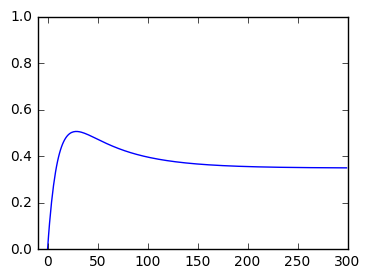

In [316]:
#y = K1*(1-e^(t/tau1)) - K2*(1-e(t/tau2))

plt.figure(1, figsize=(4, 3))
t = np.arange(0,300)
K1 = 0.7
K2 = 0.35
tau1 = 10.
tau2 = 50.
#y = K1*(1-math.e**(t/tau1)) - K2*(1-math.e**(t/tau2))
y = K1*(1-math.e**(-t/tau1)) - K2*(1-math.e**(-(t)/tau2))
plt.plot(t, y)

plt.xlim(-10., 300.)
plt.ylim(0., 1.0)

plt.show()

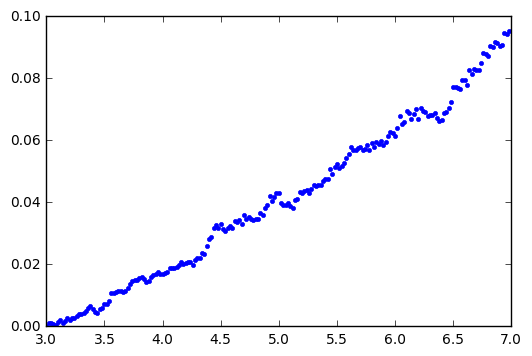

RuntimeError: Optimal parameters not found: Number of calls to function has reached maxfev = 1000.

In [586]:
yaw_left_df = pd.read_csv('yaw_left_df_nrm.csv')
yaw_right_df = pd.read_csv('yaw_right_df_nrm.csv')
pitch_up_df = pd.read_csv('pitch_up_df_nrm.csv')
pitch_down_df = pd.read_csv('pitch_down_df_nrm.csv')
roll_cw_df = pd.read_csv('roll_cw_df_nrm.csv')
roll_ccw_df = pd.read_csv('roll_ccw_df_nrm.csv')


times = np.arange(350)*0.02
colors = times[150:350]

#plt.plot(times,yaw_left_df['i1_l'],clip_on = False,color = 'b')

x = times[150:350]
y = yaw_left_df['hg3_l'][150:350]-(yaw_left_df['hg3_l'][150])

plt.plot(x, y, '.')
plt.show()


def exponential_f(t, K1, K2, tau1, tau2):
    return K1*(1-math.e**(-t/tau1)) - K2*(1-math.e**(-(t)/tau2))
    #K1*(1-math.e**(-t/tau1)) - K2*(math.e**((t)/tau2))

e = np.repeat(0.003, len(y))
plt.errorbar(x, y, yerr=e, fmt="none")


popt, pcov = curve_fit(exponential_f, x, y, sigma=e)

print("K1 =", popt[0], "+/-", pcov[0,0]**0.5)
print("k2 =", popt[1], "+/-", pcov[1,1]**0.5)
print("tau_1 =", popt[2], "+/-", pcov[0,0]**0.5)
print("tau_2 =", popt[3], "+/-", pcov[1,1]**0.5)

plt.errorbar(x, y, yerr=e, fmt="none")
xfine = np.linspace(0.01, 10., 100)  # define values to plot the function for
plt.plot(xfine, exponential_f(xfine, popt[0], popt[1], popt[2], popt[3]), 'r-')
plt.xlim(3, 6)
plt.ylim(0.00, 0.4)

/home/imager/.local/lib/python2.7/site-packages/ipykernel/__main__.py:10: RuntimeWarning: divide by zero encountered in divide
/home/imager/.local/lib/python2.7/site-packages/ipykernel/__main__.py:10: RuntimeWarning: invalid value encountered in divide


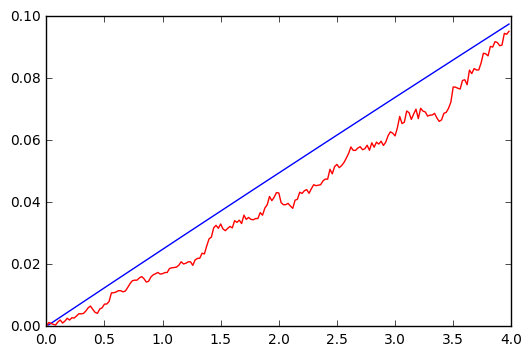

In [320]:

times = np.arange(350)*0.02
t = times[150:350]
x = t - times[150]
y_data =yaw_left_df['hg3_l'][150:350]-(yaw_left_df['hg3_l'][150])
K1 = 2.5
K2 = 0
tau1 = 100
tau2 = 0
y= K1*(1-math.e**(-x/tau1)) - K2*(1-math.e**(-(x)/tau2))

plt.plot(x, y)
plt.plot(x, y_data, 'r')
plt.xlim(0, 4)
plt.ylim(0, 0.1)

plt.show()

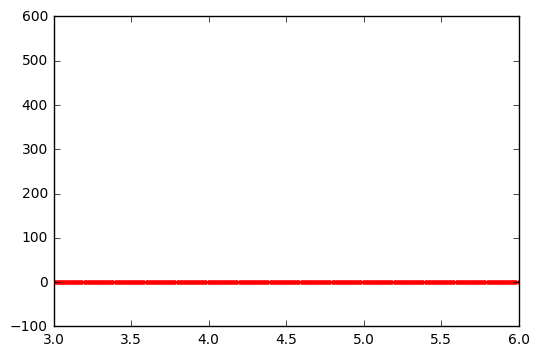

('K1 =', 1549.4172312620942, '+/-', inf)
('k2 =', 1549.6195780566723, '+/-', inf)
('tau_1 =', 0.11500700302183028, '+/-', inf)
('tau_2 =', 0.3433366439304027, '+/-', inf)


(0.0, 0.4)

In [327]:
yaw_left_df = pd.read_csv('yaw_left_df_nrm.csv')
yaw_right_df = pd.read_csv('yaw_right_df_nrm.csv')
pitch_up_df = pd.read_csv('pitch_up_df_nrm.csv')
pitch_down_df = pd.read_csv('pitch_down_df_nrm.csv')
roll_cw_df = pd.read_csv('roll_cw_df_nrm.csv')
roll_ccw_df = pd.read_csv('roll_ccw_df_nrm.csv')


times = np.arange(350)*0.02
colors = times[150:350]

#plt.plot(times,yaw_left_df['i1_l'],clip_on = False,color = 'b')

x = times[150:350]
y = yaw_left_df['iii3_l'][150:350]-(yaw_left_df['iii3_l'][150])

plt.plot(x, y, '.')
plt.show()


def exponential_f(t, K1, K2, tau1, tau2):
    return K1*(1-math.e**(-t/tau1)) - K2*(1-math.e**(-(t)/tau2))
    #K1*(1-math.e**(-t/tau1)) - K2*(math.e**((t)/tau2))

e = np.repeat(0.003, len(y))
plt.errorbar(x, y, yerr=e, fmt="none")


popt, pcov = curve_fit(exponential_f, x, y, sigma=e)

print("K1 =", popt[0], "+/-", pcov[0,0]**0.5)
print("k2 =", popt[1], "+/-", pcov[1,1]**0.5)
print("tau_1 =", popt[2], "+/-", pcov[0,0]**0.5)
print("tau_2 =", popt[3], "+/-", pcov[1,1]**0.5)

plt.errorbar(x, y, yerr=e, fmt="none")
xfine = np.linspace(0.01, 10., 100)  # define values to plot the function for
plt.plot(xfine, exponential_f(xfine, popt[0], popt[1], popt[2], popt[3]), 'r-')
plt.xlim(3, 6)
plt.ylim(0.00, 0.4)

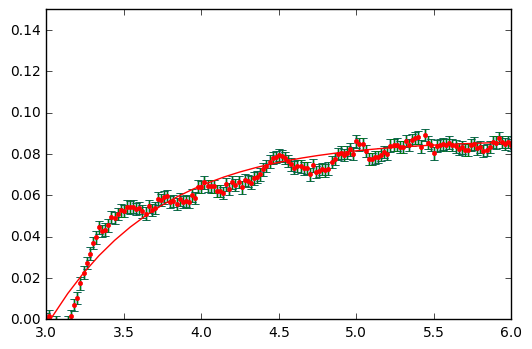

('K1 =', -5.9385583780335605, '+/-', inf)
('k2 =', -6.02567546025284, '+/-', inf)
('tau_1 =', 0.088965151982786789, '+/-', inf)
('tau_2 =', 0.71455194260491861, '+/-', inf)


(0.0, 0.15)

In [329]:
yaw_left_df = pd.read_csv('yaw_left_df_nrm.csv')
yaw_right_df = pd.read_csv('yaw_right_df_nrm.csv')
pitch_up_df = pd.read_csv('pitch_up_df_nrm.csv')
pitch_down_df = pd.read_csv('pitch_down_df_nrm.csv')
roll_cw_df = pd.read_csv('roll_cw_df_nrm.csv')
roll_ccw_df = pd.read_csv('roll_ccw_df_nrm.csv')


times = np.arange(350)*0.02
colors = times[150:350]

#plt.plot(times,yaw_left_df['i1_l'],clip_on = False,color = 'b')

x = times[150:350]
y = yaw_left_df['iii3_r'][150:350]-(yaw_left_df['iii3_r'][150])

plt.plot(x, y, '.')
plt.show()


def exponential_f(t, K1, K2, tau1, tau2):
    return K1*(1-math.e**(-t/tau1)) - K2*(1-math.e**(-(t)/tau2))
    #K1*(1-math.e**(-t/tau1)) - K2*(math.e**((t)/tau2))

e = np.repeat(0.003, len(y))
plt.errorbar(x, y, yerr=e, fmt="none")


popt, pcov = curve_fit(exponential_f, x, y, sigma=e, maxfev=10000)

print("K1 =", popt[0], "+/-", pcov[0,0]**0.5)
print("k2 =", popt[1], "+/-", pcov[1,1]**0.5)
print("tau_1 =", popt[2], "+/-", pcov[0,0]**0.5)
print("tau_2 =", popt[3], "+/-", pcov[1,1]**0.5)

plt.errorbar(x, y, yerr=e, fmt="none")
xfine = np.linspace(0.01, 10., 100)  # define values to plot the function for
plt.plot(xfine, exponential_f(xfine, popt[0], popt[1], popt[2], popt[3]), 'r-')
plt.xlim(3, 6)
plt.ylim(0.00, 0.15)

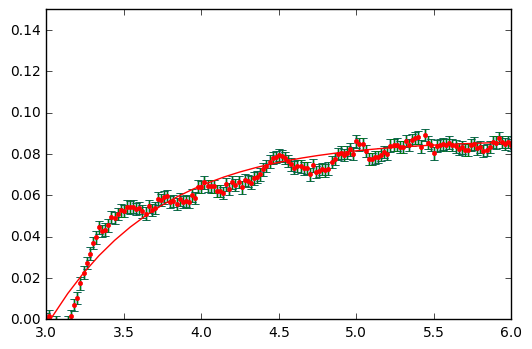

('K1 =', -5.9385583780335605, '+/-', inf)
('k2 =', -6.02567546025284, '+/-', inf)
('tau_1 =', 0.088965151982786789, '+/-', inf)
('tau_2 =', 0.71455194260491861, '+/-', inf)


(0.0, 0.15)

In [331]:
yaw_left_df = pd.read_csv('yaw_left_df_nrm.csv')
yaw_right_df = pd.read_csv('yaw_right_df_nrm.csv')
pitch_up_df = pd.read_csv('pitch_up_df_nrm.csv')
pitch_down_df = pd.read_csv('pitch_down_df_nrm.csv')
roll_cw_df = pd.read_csv('roll_cw_df_nrm.csv')
roll_ccw_df = pd.read_csv('roll_ccw_df_nrm.csv')


times = np.arange(350)*0.02
colors = times[150:350]

#plt.plot(times,yaw_left_df['i1_l'],clip_on = False,color = 'b')

x = times[150:350]
y = yaw_left_df['iii3_r'][150:350]-(yaw_left_df['iii3_r'][150])

plt.plot(x, y, '.')
plt.show()


def exponential_f(t, K1, K2, tau1, tau2):
    return K1*(1-math.e**(-t/tau1)) - K2*(1-math.e**(-(t)/tau2))
    #K1*(1-math.e**(-t/tau1)) - K2*(math.e**((t)/tau2))

e = np.repeat(0.003, len(y))
plt.errorbar(x, y, yerr=e, fmt="none")


popt, pcov = curve_fit(exponential_f, x, y, sigma=e, maxfev=10000)

print("K1 =", popt[0], "+/-", pcov[0,0]**0.5)
print("k2 =", popt[1], "+/-", pcov[1,1]**0.5)
print("tau_1 =", popt[2], "+/-", pcov[0,0]**0.5)
print("tau_2 =", popt[3], "+/-", pcov[1,1]**0.5)

plt.errorbar(x, y, yerr=e, fmt="none")
xfine = np.linspace(0.01, 10., 100)  # define values to plot the function for
plt.plot(xfine, exponential_f(xfine, popt[0], popt[1], popt[2], popt[3]), 'r-')
plt.xlim(3, 6)
plt.ylim(0.00, 0.15)

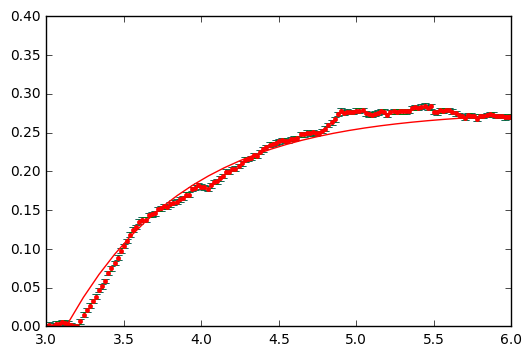

('K1 =', 16.156402205041044, '+/-', inf)
('k2 =', 15.877415214011057, '+/-', inf)
('tau_1 =', 0.77063431136236493, '+/-', inf)
('tau_2 =', 0.11722612477661246, '+/-', inf)


(0.0, 0.4)

In [20]:
yaw_left_df = pd.read_csv('yaw_left_df_nrm.csv')
yaw_right_df = pd.read_csv('yaw_right_df_nrm.csv')
pitch_up_df = pd.read_csv('pitch_up_df_nrm.csv')
pitch_down_df = pd.read_csv('pitch_down_df_nrm.csv')
roll_cw_df = pd.read_csv('roll_cw_df_nrm.csv')
roll_ccw_df = pd.read_csv('roll_ccw_df_nrm.csv')


times = np.arange(350)*0.02
colors = times[150:350]

#plt.plot(times,yaw_left_df['i1_l'],clip_on = False,color = 'b')

x = times[150:350]
y = yaw_left_df['i1_l'][150:350]-(yaw_left_df['i1_l'][150])

plt.plot(x, y, '.')
plt.show()


def exponential_f(t, K1, K2, tau1, tau2):
    return K1*(1-math.e**(-t/tau1)) - K2*(1-math.e**(-(t)/tau2))
    #K1*(1-math.e**(-t/tau1)) - K2*(math.e**((t)/tau2))

e = np.repeat(0.003, len(y))
plt.errorbar(x, y, yerr=e, fmt="none")


popt, pcov = curve_fit(exponential_f, x, y, sigma=e)

print("K1 =", popt[0], "+/-", pcov[0,0]**0.5)
print("k2 =", popt[1], "+/-", pcov[1,1]**0.5)
print("tau_1 =", popt[2], "+/-", pcov[0,0]**0.5)
print("tau_2 =", popt[3], "+/-", pcov[1,1]**0.5)

plt.errorbar(x, y, yerr=e, fmt="none")
xfine = np.linspace(0.01, 10., 100)  # define values to plot the function for
plt.plot(xfine, exponential_f(xfine, popt[0], popt[1], popt[2], popt[3]), 'r-')
plt.xlim(3, 6)
plt.ylim(0.00, 0.4)

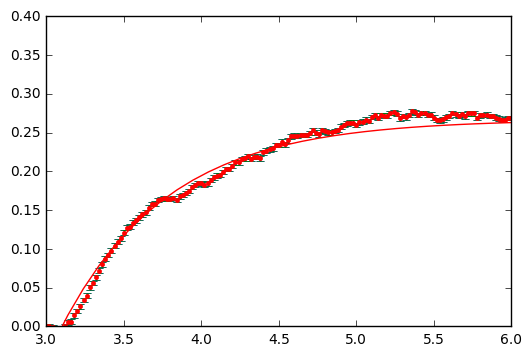

('K1 =', 24.084263766088341, '+/-', inf)
('k2 =', 23.817253849465285, '+/-', inf)
('tau_1 =', 0.68868648949133149, '+/-', inf)
('tau_2 =', 0.12339765490617498, '+/-', inf)


(0.0, 0.4)

In [22]:
yaw_left_df = pd.read_csv('yaw_left_df_nrm.csv')
yaw_right_df = pd.read_csv('yaw_right_df_nrm.csv')
pitch_up_df = pd.read_csv('pitch_up_df_nrm.csv')
pitch_down_df = pd.read_csv('pitch_down_df_nrm.csv')
roll_cw_df = pd.read_csv('roll_cw_df_nrm.csv')
roll_ccw_df = pd.read_csv('roll_ccw_df_nrm.csv')


times = np.arange(350)*0.02
colors = times[150:350]

#plt.plot(times,yaw_left_df['i1_l'],clip_on = False,color = 'b')

x = times[150:350]
y = yaw_left_df['i2_l'][150:350]-(yaw_left_df['i2_l'][150])

plt.plot(x, y, '.')
plt.show()


def exponential_f(t, K1, K2, tau1, tau2):
    return K1*(1-math.e**(-t/tau1)) - K2*(1-math.e**(-(t)/tau2))
    #K1*(1-math.e**(-t/tau1)) - K2*(math.e**((t)/tau2))

e = np.repeat(0.003, len(y))
plt.errorbar(x, y, yerr=e, fmt="none")


popt, pcov = curve_fit(exponential_f, x, y, sigma=e)

print("K1 =", popt[0], "+/-", pcov[0,0]**0.5)
print("k2 =", popt[1], "+/-", pcov[1,1]**0.5)
print("tau_1 =", popt[2], "+/-", pcov[0,0]**0.5)
print("tau_2 =", popt[3], "+/-", pcov[1,1]**0.5)

plt.errorbar(x, y, yerr=e, fmt="none")
xfine = np.linspace(0.01, 10., 100)  # define values to plot the function for
plt.plot(xfine, exponential_f(xfine, popt[0], popt[1], popt[2], popt[3]), 'r-')
plt.xlim(3, 6)
plt.ylim(0.00, 0.4)

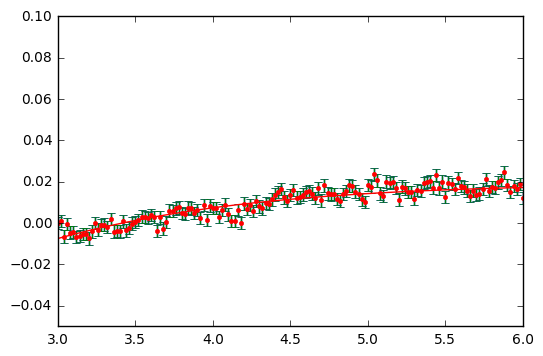

('K1 =', 16.884909936529276, '+/-', nan)
('k2 =', 16.865690467312593, '+/-', nan)
('tau_1 =', 0.91948758374133122, '+/-', nan)
('tau_2 =', 0.90807880576545319, '+/-', nan)


/home/imager/.local/lib/python2.7/site-packages/ipykernel/__main__.py:31: RuntimeWarning: invalid value encountered in double_scalars
/home/imager/.local/lib/python2.7/site-packages/ipykernel/__main__.py:32: RuntimeWarning: invalid value encountered in double_scalars
/home/imager/.local/lib/python2.7/site-packages/ipykernel/__main__.py:33: RuntimeWarning: invalid value encountered in double_scalars
/home/imager/.local/lib/python2.7/site-packages/ipykernel/__main__.py:34: RuntimeWarning: invalid value encountered in double_scalars


(-0.05, 0.1)

In [335]:
yaw_left_df = pd.read_csv('yaw_left_df_nrm.csv')
yaw_right_df = pd.read_csv('yaw_right_df_nrm.csv')
pitch_up_df = pd.read_csv('pitch_up_df_nrm.csv')
pitch_down_df = pd.read_csv('pitch_down_df_nrm.csv')
roll_cw_df = pd.read_csv('roll_cw_df_nrm.csv')
roll_ccw_df = pd.read_csv('roll_ccw_df_nrm.csv')


times = np.arange(350)*0.02
colors = times[150:350]

#plt.plot(times,yaw_left_df['i1_l'],clip_on = False,color = 'b')

x = times[150:350]
y = yaw_left_df['b1_l'][150:350]-(yaw_left_df['b1_l'][150])

plt.plot(x, y, '.')
plt.show()


def exponential_f(t, K1, K2, tau1, tau2):
    return K1*(1-math.e**(-t/tau1)) - K2*(1-math.e**(-(t)/tau2))
    #K1*(1-math.e**(-t/tau1)) - K2*(math.e**((t)/tau2))

e = np.repeat(0.003, len(y))
plt.errorbar(x, y, yerr=e, fmt="none")


popt, pcov = curve_fit(exponential_f, x, y, sigma=e, maxfev=10000)

print("K1 =", popt[0], "+/-", pcov[0,0]**0.5)
print("k2 =", popt[1], "+/-", pcov[1,1]**0.5)
print("tau_1 =", popt[2], "+/-", pcov[0,0]**0.5)
print("tau_2 =", popt[3], "+/-", pcov[1,1]**0.5)

plt.errorbar(x, y, yerr=e, fmt="none")
xfine = np.linspace(0.01, 10., 100)  # define values to plot the function for
plt.plot(xfine, exponential_f(xfine, popt[0], popt[1], popt[2], popt[3]), 'r-')
plt.xlim(3, 6)
plt.ylim(-0.05, 0.1)

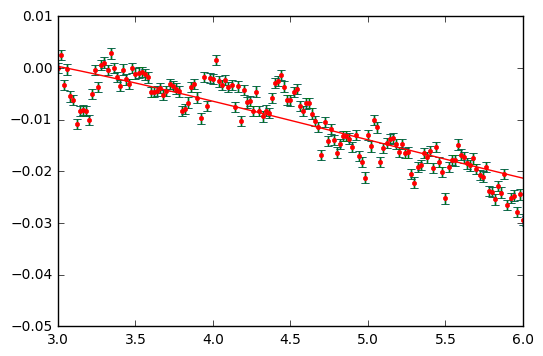

('K1 =', 4.000841847250606, '+/-', nan)
('k2 =', 4.0675972486510084, '+/-', nan)
('tau_1 =', 3.5197871478451921, '+/-', nan)
('tau_2 =', 3.6131774781846873, '+/-', nan)


/home/imager/.local/lib/python2.7/site-packages/ipykernel/__main__.py:31: RuntimeWarning: invalid value encountered in double_scalars
/home/imager/.local/lib/python2.7/site-packages/ipykernel/__main__.py:32: RuntimeWarning: invalid value encountered in double_scalars
/home/imager/.local/lib/python2.7/site-packages/ipykernel/__main__.py:33: RuntimeWarning: invalid value encountered in double_scalars
/home/imager/.local/lib/python2.7/site-packages/ipykernel/__main__.py:34: RuntimeWarning: invalid value encountered in double_scalars


(-0.05, 0.01)

In [346]:
yaw_left_df = pd.read_csv('yaw_left_df_nrm.csv')
yaw_right_df = pd.read_csv('yaw_right_df_nrm.csv')
pitch_up_df = pd.read_csv('pitch_up_df_nrm.csv')
pitch_down_df = pd.read_csv('pitch_down_df_nrm.csv')
roll_cw_df = pd.read_csv('roll_cw_df_nrm.csv')
roll_ccw_df = pd.read_csv('roll_ccw_df_nrm.csv')


times = np.arange(350)*0.02
colors = times[150:350]

#plt.plot(times,yaw_left_df['i1_l'],clip_on = False,color = 'b')

x = times[150:350]
y = yaw_left_df['b1_r'][150:350] -(yaw_left_df['b1_r'][150])

plt.plot(x, y, '.')
plt.show()


def exponential_f(t, K1, K2, tau1, tau2):
    return K1*(1-math.e**(-t/tau1)) - K2*(1-math.e**(-(t)/tau2))
    #K1*(1-math.e**(-t/tau1)) - K2*(math.e**((t)/tau2))

e = np.repeat(0.001, len(y))
plt.errorbar(x, y, yerr=e, fmt="none")


popt, pcov = curve_fit(exponential_f, x, y, sigma=e, maxfev=10000)

print("K1 =", popt[0], "+/-", pcov[0,0]**0.5)
print("k2 =", popt[1], "+/-", pcov[1,1]**0.5)
print("tau_1 =", popt[2], "+/-", pcov[0,0]**0.5)
print("tau_2 =", popt[3], "+/-", pcov[1,1]**0.5)

plt.errorbar(x, y, yerr=e, fmt="none")
xfine = np.linspace(0.01, 10., 100)  # define values to plot the function for
plt.plot(xfine, exponential_f(xfine, popt[0], popt[1], popt[2], popt[3]), 'r-')
plt.xlim(3, 6)
plt.ylim(-0.05, 0.010)

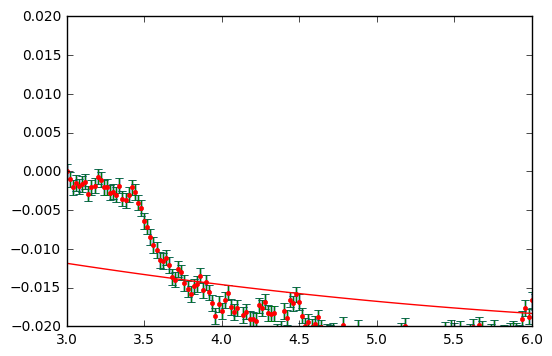

('K1 =', 683.63312852345018, '+/-', 285500.79983508086)
('k2 =', 208.35879501425296, '+/-', 151448.32173473749)
('tau_1 =', 1635.4576117802926, '+/-', 285500.79983508086)
('tau_2 =', 492.7379795055457, '+/-', 151448.32173473749)


(-0.02, 0.02)

In [363]:
yaw_left_df = pd.read_csv('yaw_left_df_nrm.csv')
yaw_right_df = pd.read_csv('yaw_right_df_nrm.csv')
pitch_up_df = pd.read_csv('pitch_up_df_nrm.csv')
pitch_down_df = pd.read_csv('pitch_down_df_nrm.csv')
roll_cw_df = pd.read_csv('roll_cw_df_nrm.csv')
roll_ccw_df = pd.read_csv('roll_ccw_df_nrm.csv')


times = np.arange(350)*0.02
colors = times[150:350]

#plt.plot(times,yaw_left_df['i1_l'],clip_on = False,color = 'b')

x = times[150:350]
y = yaw_left_df['b2_l'][150:350]-(yaw_left_df['b2_l'][150])

plt.plot(x, y, '.')
plt.show()


def exponential_f(t, K1, K2, tau1, tau2):
    return K1*(1-math.e**(-t/tau1)) - K2*(1-math.e**(-(t)/tau2))
    #K1*(1-math.e**(-t/tau1)) - K2*(math.e**((t)/tau2))

e = np.repeat(0.001, len(y))
plt.errorbar(x, y, yerr=e, fmt="none")


popt, pcov = curve_fit(exponential_f, x, y, sigma=e, maxfev=10000)

print("K1 =", popt[0], "+/-", pcov[0,0]**0.5)
print("k2 =", popt[1], "+/-", pcov[1,1]**0.5)
print("tau_1 =", popt[2], "+/-", pcov[0,0]**0.5)
print("tau_2 =", popt[3], "+/-", pcov[1,1]**0.5)

plt.errorbar(x, y, yerr=e, fmt="none")
xfine = np.linspace(0.01, 10., 100)  # define values to plot the function for
plt.plot(xfine, exponential_f(xfine, popt[0], popt[1], popt[2], popt[3]), 'r-')
plt.xlim(3, 6)
plt.ylim(-0.02, 0.02)

('K1 =', 4.7422945033763462, '+/-', 28441.402009803784)
('k2 =', 4.761506574312957, '+/-', 28441.402021325095)
('tau_1 =', 0.26605662468142194, '+/-', 28441.402009803784)
('tau_2 =', 0.2675991283258945, '+/-', 28441.402021325095)
('Parameters', array([-6.54690563, -7.06954683,  8.16637392,  9.05811593]))
('RMSE:', 0.0017408456064120037)
('R-squared:', 0.92272948265522325)
()


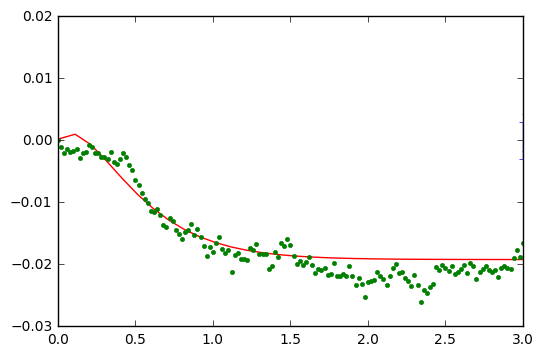

In [587]:
import numpy, scipy, matplotlib
import matplotlib.pyplot as plt
from scipy.optimize import curve_fit
from scipy.optimize import differential_evolution
import warnings

yaw_left_df = pd.read_csv('yaw_left_df_nrm.csv')
yaw_right_df = pd.read_csv('yaw_right_df_nrm.csv')
pitch_up_df = pd.read_csv('pitch_up_df_nrm.csv')
pitch_down_df = pd.read_csv('pitch_down_df_nrm.csv')
roll_cw_df = pd.read_csv('roll_cw_df_nrm.csv')
roll_ccw_df = pd.read_csv('roll_ccw_df_nrm.csv')


times = np.arange(350)*0.02

colors = times[150:350]

#plt.plot(times,yaw_left_df['i1_l'],clip_on = False,color = 'b')

x1 = times[150:350]
x=x1-x1[0]

y = yaw_left_df['b2_l'][150:350]-(yaw_left_df['b2_l'][150])


# power law function
#def func_power_law(x,a,b,c):
#    return a*(x**b)+c

def exponential_f(t, K1, K2, tau1, tau2):
    return K1*(1-math.e**(-t/tau1)) - K2*(1-math.e**(-(t)/tau2))
    #K1*(1-math.e**(-t/tau1)) - K2*(math.e**((t)/tau2))
    
def exponential_fit(t, parameters):
    K1 = parameters[0]
    K2 = parameters[1]
    tau1= parameters[2]
    tau2 = parameters[3]
    return K1*(1-math.e**(-t/tau1)) - K2*(1-math.e**(-(t)/tau2))
    #K1*(1-math.e**(-t/tau1)) - K2*(math.e**((t)/tau2))


# function for genetic algorithm to minimize (sum of squared error)
def sumOfSquaredError(parameterTuple):
    warnings.filterwarnings("ignore") # do not print warnings by genetic algorithm
    val = exponential_f(x, *parameterTuple)
    return numpy.sum((y - val) ** 2.0)


def generate_Initial_Parameters():
    # min and max used for bounds
    #maxK = max(100)
    #minK = min(-10)
    #maxtau = max(100)
    #mintau = min(-10)
    #maxXY = max(maxK, maxtau)
    maxXY = 50

    parameterBounds = []
    parameterBounds.append([-10, 10]) # seach bounds for k1
    parameterBounds.append([-10, 10]) # seach bounds for k2
    parameterBounds.append([-10, 10]) # seach bounds for tau1
    parameterBounds.append([-10, 10]) # seach bounds for tau2

    # "seed" the numpy random number generator for repeatable results
    result = differential_evolution(sumOfSquaredError, parameterBounds, seed=0)
    return result.x

# generate initial parameter values
geneticParameters = generate_Initial_Parameters()

# curve fit the test data
fittedParameters, pcov = curve_fit(exponential_f, x, y, geneticParameters, maxfev = 10000)


#popt, pcov = curve_fit(exponential_f, x, y, geneticParameters, maxfev=10000, bounds=(-10, [100., 100., 100., 100.]))

popt, pcov = curve_fit(exponential_f, x, y, p0=np.asarray([0.09,0.07,0.25,0.9]), maxfev=20000)

#K1 = 0.09
#K2 = 0.07
#tau1 = .25
#tau2 = .9

print("K1 =", popt[0], "+/-", pcov[0,0]**0.5)
print("k2 =", popt[1], "+/-", pcov[1,1]**0.5)
print("tau_1 =", popt[2], "+/-", pcov[0,0]**0.5)
print("tau_2 =", popt[3], "+/-", pcov[1,1]**0.5)


print('Parameters', fittedParameters)

modelPredictions = exponential_f(x, *fittedParameters) 

absError = modelPredictions - y

SE = numpy.square(absError) # squared errors
MSE = numpy.mean(SE) # mean squared errors
RMSE = numpy.sqrt(MSE) # Root Mean Squared Error, RMSE
Rsquared = 1.0 - (numpy.var(absError) / numpy.var(y))
print('RMSE:', RMSE)
print('R-squared:', Rsquared)

print()

'''
##########################################################
# graphics output section
def ModelAndScatterPlot(graphWidth, graphHeight):
    f = plt.figure(figsize=(graphWidth/100.0, graphHeight/100.0), dpi=100)
    axes = f.add_subplot(111)

    # first the raw data as a scatter plot
    axes.plot(x, y,  'D')

    # create data for the fitted equation plot
    xModel = numpy.linspace(min(x), max(y))
    yModel = exponential_f(xModel, *fittedParameters)

    # now the model as a line plot
    axes.plot(xModel, yModel)

    axes.set_xlabel('X Data') # X axis data label
    axes.set_ylabel('Y Data') # Y axis data label

    plt.show()
    plt.close('all') # clean up after using pyplot

graphWidth = 800
graphHeight = 600
ModelAndScatterPlot(graphWidth, graphHeight)
'''

#plt.errorbar(x, y, yerr=e, fmt="none")
xfine = np.linspace(0.01, 10., 100)  # define values to plot the function for
plt.plot(xfine, exponential_f(xfine, popt[0], popt[1], popt[2], popt[3]), 'r-')
plt.plot(x, y, '.')
plt.xlim(0, 3)
plt.ylim(-0.03, 0.02)
plt.show()

In [ ]:
## put together table 


('K1 =', 12.058620700947371, '+/-', 42602.234212750533)
('k2 =', 14.046573660322943, '+/-', 42472.687369726998)
('tau_1 =', 10.633175404306469, '+/-', 42602.234212750533)
('tau_2 =', 12.875587124228447, '+/-', 42472.687369726998)
('Parameters', array([-16.56637171, -14.58338607,  12.65904679,  10.78837872]))
('RMSE:', 0.0058809254352554284)
('R-squared:', 0.86492888450060335)
()


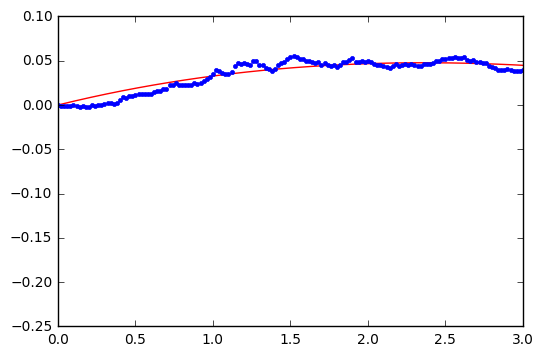

In [3]:
import numpy, scipy, matplotlib
import matplotlib.pyplot as plt
from scipy.optimize import curve_fit
from scipy.optimize import differential_evolution
import warnings

yaw_left_df = pd.read_csv('yaw_left_df_nrm.csv')
yaw_right_df = pd.read_csv('yaw_right_df_nrm.csv')
pitch_up_df = pd.read_csv('pitch_up_df_nrm.csv')
pitch_down_df = pd.read_csv('pitch_down_df_nrm.csv')
roll_cw_df = pd.read_csv('roll_cw_df_nrm.csv')
roll_ccw_df = pd.read_csv('roll_ccw_df_nrm.csv')


times = np.arange(350)*0.02

colors = times[150:350]

#plt.plot(times,yaw_left_df['i1_l'],clip_on = False,color = 'b')

x1 = times[150:350]
x=x1-x1[0]

y = yaw_left_df['b2_r'][150:350]-(yaw_left_df['b2_r'][150])


# power law function
#def func_power_law(x,a,b,c):
#    return a*(x**b)+c

def exponential_f(t, K1, K2, tau1, tau2):
    return K1*(1-math.e**(-t/tau1)) - K2*(1-math.e**(-(t)/tau2))
    #K1*(1-math.e**(-t/tau1)) - K2*(math.e**((t)/tau2))
    
def exponential_fit(t, parameters):
    K1 = parameters[0]
    K2 = parameters[1]
    tau1= parameters[2]
    tau2 = parameters[3]
    return K1*(1-math.e**(-t/tau1)) - K2*(1-math.e**(-(t)/tau2))
    #K1*(1-math.e**(-t/tau1)) - K2*(math.e**((t)/tau2))


# function for genetic algorithm to minimize (sum of squared error)
def sumOfSquaredError(parameterTuple):
    warnings.filterwarnings("ignore") # do not print warnings by genetic algorithm
    val = exponential_f(x, *parameterTuple)
    return numpy.sum((y - val) ** 2.0)


def generate_Initial_Parameters():
    # min and max used for bounds
    #maxK = max(100)
    #minK = min(-10)
    #maxtau = max(100)
    #mintau = min(-10)
    #maxXY = max(maxK, maxtau)
    maxXY = 50

    parameterBounds = []
    parameterBounds.append([-10, 10]) # seach bounds for k1
    parameterBounds.append([-10, 10]) # seach bounds for k2
    parameterBounds.append([-10, 10]) # seach bounds for tau1
    parameterBounds.append([-10, 10]) # seach bounds for tau2

    # "seed" the numpy random number generator for repeatable results
    result = differential_evolution(sumOfSquaredError, parameterBounds, seed=0)
    return result.x

# generate initial parameter values
geneticParameters = generate_Initial_Parameters()

# curve fit the test data
fittedParameters, pcov = curve_fit(exponential_f, x, y, geneticParameters, maxfev = 10000)


#popt, pcov = curve_fit(exponential_f, x, y, geneticParameters, maxfev=10000, bounds=(-10, [100., 100., 100., 100.]))

popt, pcov = curve_fit(exponential_f, x, y, p0=np.asarray([0.09,0.07,0.25,0.9]), maxfev=20000)

#K1 = 0.09
#K2 = 0.07
#tau1 = .25
#tau2 = .9

print("K1 =", popt[0], "+/-", pcov[0,0]**0.5)
print("k2 =", popt[1], "+/-", pcov[1,1]**0.5)
print("tau_1 =", popt[2], "+/-", pcov[0,0]**0.5)
print("tau_2 =", popt[3], "+/-", pcov[1,1]**0.5)


print('Parameters', fittedParameters)

modelPredictions = exponential_f(x, *fittedParameters) 

absError = modelPredictions - y

SE = numpy.square(absError) # squared errors
MSE = numpy.mean(SE) # mean squared errors
RMSE = numpy.sqrt(MSE) # Root Mean Squared Error, RMSE
Rsquared = 1.0 - (numpy.var(absError) / numpy.var(y))
print('RMSE:', RMSE)
print('R-squared:', Rsquared)

print()

'''
##########################################################
# graphics output section
def ModelAndScatterPlot(graphWidth, graphHeight):
    f = plt.figure(figsize=(graphWidth/100.0, graphHeight/100.0), dpi=100)
    axes = f.add_subplot(111)

    # first the raw data as a scatter plot
    axes.plot(x, y,  'D')

    # create data for the fitted equation plot
    xModel = numpy.linspace(min(x), max(y))
    yModel = exponential_f(xModel, *fittedParameters)

    # now the model as a line plot
    axes.plot(xModel, yModel)

    axes.set_xlabel('X Data') # X axis data label
    axes.set_ylabel('Y Data') # Y axis data label

    plt.show()
    plt.close('all') # clean up after using pyplot

graphWidth = 800
graphHeight = 600
ModelAndScatterPlot(graphWidth, graphHeight)
'''

#plt.errorbar(x, y, yerr=e, fmt="none")
xfine = np.linspace(0.01, 10., 100)  # define values to plot the function for
plt.plot(xfine, exponential_f(xfine, popt[0], popt[1], popt[2], popt[3]), 'r-')
plt.plot(x, y, '.')
plt.xlim(0, 3)
#plt.ylim(-0.05, 0.075)
plt.show()

('K1 =', -0.046574995320444942, '+/-', 50937.808315331138)
('k2 =', 0.15670939077524934, '+/-', 50937.808394676016)
('tau_1 =', 0.41406620619780771, '+/-', 50937.808315331138)
('tau_2 =', 0.41406272534080657, '+/-', 50937.808394676016)
('Parameters', array([ 0.2189997 ,  0.27955676,  6.77247862,  0.63240212]))
('RMSE:', 0.0126776134173756)
('R-squared:', 0.93673418066985792)
()


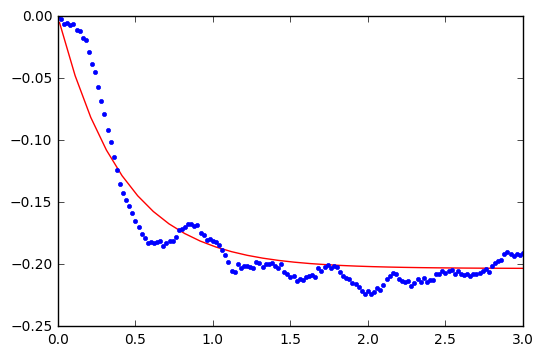

In [414]:
import numpy, scipy, matplotlib
import matplotlib.pyplot as plt
from scipy.optimize import curve_fit
from scipy.optimize import differential_evolution
import warnings

yaw_left_df = pd.read_csv('yaw_left_df_nrm.csv')
yaw_right_df = pd.read_csv('yaw_right_df_nrm.csv')
pitch_up_df = pd.read_csv('pitch_up_df_nrm.csv')
pitch_down_df = pd.read_csv('pitch_down_df_nrm.csv')
roll_cw_df = pd.read_csv('roll_cw_df_nrm.csv')
roll_ccw_df = pd.read_csv('roll_ccw_df_nrm.csv')


times = np.arange(350)*0.02

colors = times[150:350]

#plt.plot(times,yaw_left_df['i1_l'],clip_on = False,color = 'b')

x1 = times[150:350]
x=x1-x1[0]

y = yaw_left_df['iii3_l'][150:350]-(yaw_left_df['iii3_l'][150])


# power law function
#def func_power_law(x,a,b,c):
#    return a*(x**b)+c

def exponential_f(t, K1, K2, tau1, tau2):
    return K1*(1-math.e**(-t/tau1)) - K2*(1-math.e**(-(t)/tau2))
    #K1*(1-math.e**(-t/tau1)) - K2*(math.e**((t)/tau2))
    
def exponential_fit(t, parameters):
    K1 = parameters[0]
    K2 = parameters[1]
    tau1= parameters[2]
    tau2 = parameters[3]
    return K1*(1-math.e**(-t/tau1)) - K2*(1-math.e**(-(t)/tau2))
    #K1*(1-math.e**(-t/tau1)) - K2*(math.e**((t)/tau2))


# function for genetic algorithm to minimize (sum of squared error)
def sumOfSquaredError(parameterTuple):
    warnings.filterwarnings("ignore") # do not print warnings by genetic algorithm
    val = exponential_f(x, *parameterTuple)
    return numpy.sum((y - val) ** 2.0)


def generate_Initial_Parameters():
    # min and max used for bounds
    #maxK = max(100)
    #minK = min(-10)
    #maxtau = max(100)
    #mintau = min(-10)
    #maxXY = max(maxK, maxtau)
    maxXY = 50

    parameterBounds = []
    parameterBounds.append([-10, 10]) # seach bounds for k1
    parameterBounds.append([-10, 10]) # seach bounds for k2
    parameterBounds.append([-10, 10]) # seach bounds for tau1
    parameterBounds.append([-10, 10]) # seach bounds for tau2

    # "seed" the numpy random number generator for repeatable results
    result = differential_evolution(sumOfSquaredError, parameterBounds, seed=0)
    return result.x

# generate initial parameter values
geneticParameters = generate_Initial_Parameters()

# curve fit the test data
fittedParameters, pcov = curve_fit(exponential_f, x, y, geneticParameters, maxfev = 10000)


#popt, pcov = curve_fit(exponential_f, x, y, geneticParameters, maxfev=10000, bounds=(-10, [100., 100., 100., 100.]))

popt, pcov = curve_fit(exponential_f, x, y, p0=np.asarray([0.09,0.07,0.25,0.9]), maxfev=20000)

#K1 = 0.09
#K2 = 0.07
#tau1 = .25
#tau2 = .9

print("K1 =", popt[0], "+/-", pcov[0,0]**0.5)
print("k2 =", popt[1], "+/-", pcov[1,1]**0.5)
print("tau_1 =", popt[2], "+/-", pcov[0,0]**0.5)
print("tau_2 =", popt[3], "+/-", pcov[1,1]**0.5)


print('Parameters', fittedParameters)

modelPredictions = exponential_f(x, *fittedParameters) 

absError = modelPredictions - y

SE = numpy.square(absError) # squared errors
MSE = numpy.mean(SE) # mean squared errors
RMSE = numpy.sqrt(MSE) # Root Mean Squared Error, RMSE
Rsquared = 1.0 - (numpy.var(absError) / numpy.var(y))
print('RMSE:', RMSE)
print('R-squared:', Rsquared)

print()

'''
##########################################################
# graphics output section
def ModelAndScatterPlot(graphWidth, graphHeight):
    f = plt.figure(figsize=(graphWidth/100.0, graphHeight/100.0), dpi=100)
    axes = f.add_subplot(111)

    # first the raw data as a scatter plot
    axes.plot(x, y,  'D')

    # create data for the fitted equation plot
    xModel = numpy.linspace(min(x), max(y))
    yModel = exponential_f(xModel, *fittedParameters)

    # now the model as a line plot
    axes.plot(xModel, yModel)

    axes.set_xlabel('X Data') # X axis data label
    axes.set_ylabel('Y Data') # Y axis data label

    plt.show()
    plt.close('all') # clean up after using pyplot

graphWidth = 800
graphHeight = 600
ModelAndScatterPlot(graphWidth, graphHeight)
'''

#plt.errorbar(x, y, yerr=e, fmt="none")
xfine = np.linspace(0.01, 10., 100)  # define values to plot the function for
plt.plot(xfine, exponential_f(xfine, popt[0], popt[1], popt[2], popt[3]), 'r-')
plt.plot(x, y, '.')
plt.xlim(0, 3)
#plt.ylim(-0.03, 0.02)
plt.show()

In [21]:
muscle_list = ('b1_l', 'b2_l', 'b3_l', 'i1_l', 'i2_l', 'iii1_l', 'iii3_l', 'hg1_l', 'hg2_l', 'hg3_l', 'hg4_l', 'b1_r', 'b2_r', 'b3_r', 'i1_r', 'i2_r', 'iii1_r', 'iii3_r', 'hg1_r', 'hg2_r', 'hg3_r', 'hg4_r')

In [22]:
stimuli_list = (yaw_left_df, yaw_right_df, pitch_up_df, pitch_down_df, roll_cw_df, roll_ccw_df)

In [6]:
def exponential_f(t, K1, K2, tau1, tau2):
    return K1*(1-math.e**(-t/tau1)) - K2*(1-math.e**(-(t)/tau2))
    #K1*(1-math.e**(-t/tau1)) - K2*(math.e**((t)/tau2))
    
def exponential_fit(t, parameters):
    K1 = parameters[0]
    K2 = parameters[1]
    tau1= parameters[2]
    tau2 = parameters[3]
    return K1*(1-math.e**(-t/tau1)) - K2*(1-math.e**(-(t)/tau2))
    #K1*(1-math.e**(-t/tau1)) - K2*(math.e**((t)/tau2))


# function for genetic algorithm to minimize (sum of squared error)
def sumOfSquaredError(parameterTuple):
    warnings.filterwarnings("ignore") # do not print warnings by genetic algorithm
    val = exponential_f(x, *parameterTuple)
    return numpy.sum((y - val) ** 2.0)


def generate_Initial_Parameters():
    # min and max used for bounds
    #maxK = max(100)
    #minK = min(-10)
    #maxtau = max(100)
    #mintau = min(-10)
    #maxXY = max(maxK, maxtau)
    maxXY = 50

    parameterBounds = []
    parameterBounds.append([-10, 10]) # seach bounds for k1
    parameterBounds.append([-10, 10]) # seach bounds for k2
    parameterBounds.append([-10, 10]) # seach bounds for tau1
    parameterBounds.append([-10, 10]) # seach bounds for tau2

    # "seed" the numpy random number generator for repeatable results
    result = differential_evolution(sumOfSquaredError, parameterBounds, seed=0)
    return result.x

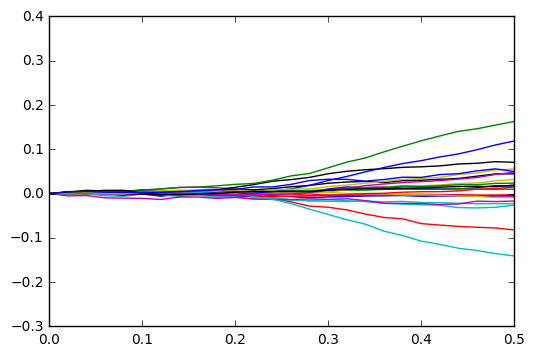

In [30]:
stimulus_df = pd.DataFrame()
stimulus = yaw_right_df



for muscle in muscle_list: 
        
        times = np.arange(350)*0.02
        muscle_choice = stimulus[muscle]
        y = muscle_choice[150:350]-muscle_choice[150]
        d_y = np.gradient(y)
        x1 = times[150:350]
        x=x1-x1[0]
        
        #plt.plot(x, d_y)
        plt.plot(x, y)
        plt.xlim(0, 0.5)
        
plt.show()

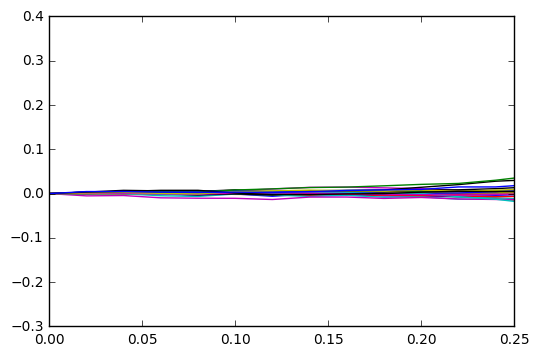

In [31]:
stimulus_df = pd.DataFrame()
stimulus = yaw_right_df



for muscle in muscle_list: 
        
        times = np.arange(350)*0.02
        muscle_choice = stimulus[muscle]
        y = muscle_choice[150:350]-muscle_choice[150]
        d_y = np.gradient(y)
        x1 = times[150:350]
        x=x1-x1[0]
        
        #plt.plot(x, d_y)
        plt.plot(x, y)
        plt.xlim(0, 0.25)
        
plt.show()

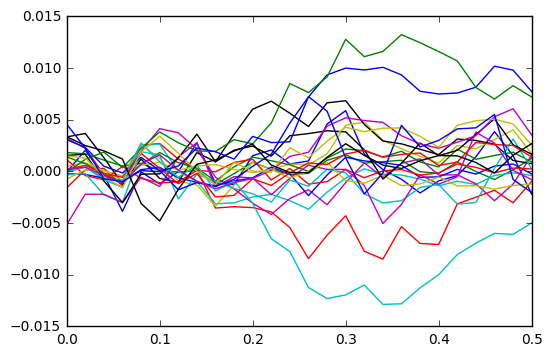

In [29]:
stimulus_df = pd.DataFrame()
stimulus = yaw_right_df



for muscle in muscle_list: 
        
        times = np.arange(350)*0.02
        muscle_choice = stimulus[muscle]
        y = muscle_choice[150:350]-muscle_choice[150]
        d_y = np.gradient(y)
        x1 = times[150:350]
        x=x1-x1[0]
        
        plt.plot(x, d_y)
        #plt.plot(x, y, '.')
        plt.xlim(0, 0.5)
        
plt.show()



In [ ]:
def find_S(func):
    y = func[0:50]
    d_y = np.gradient(y)
    y0 = y[0] 
    y20 = y[20]
    time = np.arange(len(func))
    for t in time:
        if d_y[t] < theta 

In [37]:
### with delay term 
'''
def populate_S(func, thresh):
    y = func[0:50]
    d_y = np.gradient(y)
    y0 = y[0] 
    y20 = y[20]
    S= np.empty(200)
    for i in range(len(t)):
        if t[i] < thresh:
            S[i] = y0
        else:
             S[i] =1
    return S*z
'''    
S= np.empty(200)    

def exponential_f(t, K1, K2, tau1, tau2, theta): #, S, y0, thresh):
    z= K1*(1-math.e**(-(t-theta)/tau1)) - K2*(1-math.e**(-(t-theta)/tau2))
    #K1*(1-math.e**(-t/tau1)) - K2*(math.e**((t)/tau2))
    for i in range(len(t)):
        if t[i] < theta:
            S[i] = 0
        else:
             S[i] =1
    return S*z
    
def exponential_fit(t, parameters):
    K1 = parameters[0]
    K2 = parameters[1]
    tau1= parameters[2]
    tau2 = parameters[3]
    return K1*(1-math.e**(-(t-theta)/tau1)) - K2*(1-math.e**(-(t-theta)/tau2))
    #K1*(1-math.e**(-t/tau1)) - K2*(math.e**((t)/tau2))


# function for genetic algorithm to minimize (sum of squared error)
def sumOfSquaredError(parameterTuple):
    warnings.filterwarnings("ignore") # do not print warnings by genetic algorithm
    val = exponential_f(x, *parameterTuple)
    return numpy.sum((y - val) ** 2.0)


def generate_Initial_Parameters():
    # min and max used for bounds
    #maxK = max(100)
    #minK = min(-10)
    #maxtau = max(100)
    #mintau = min(-10)
    #maxXY = max(maxK, maxtau)
    maxXY = 50

    parameterBounds = []
    parameterBounds.append([-10, 10]) # seach bounds for k1
    parameterBounds.append([-10, 10]) # seach bounds for k2
    parameterBounds.append([-10, 10]) # seach bounds for tau1
    parameterBounds.append([-10, 10]) # seach bounds for tau2
    parameterBounds.append([-10, 10]) # seach bounds for theta

    # "seed" the numpy random number generator for repeatable results
    result = differential_evolution(sumOfSquaredError, parameterBounds, seed=0)
    return result.x





In [24]:
df_exponential_constants = pd.DataFrame()

In [161]:
#stimulus_df = pd.DataFrame({'K1':0,'K2': 0, 'tau1': 0, 'tau2': 0},

###with theta

#                  index=[0])
stimulus_df = pd.DataFrame()
stimulus = yaw_left_df

for muscle in muscle_list: 
        
        times = np.arange(350)*0.02
        colors = times[150:350]
        x1 = times[150:350]
        x=x1-x1[0]
        muscle_choice = stimulus[muscle]
        y = muscle_choice[150:350]-muscle_choice[150]
        
        popt, pcov = curve_fit(exponential_f, x, y, p0=np.asarray([0.1,0.1,0.25,0.9, 0.1]), maxfev=2000000)
        
        df =pd.DataFrame({'K1': popt[0],'K2': popt[1], 'tau1': popt[2], 'tau2': popt[3], 'theta': popt[4]},
                  index=[muscle])
        stimulus_df = stimulus_df.append(df)
        '''
        print("K1 =", popt[0], "+/-", pcov[0,0]**0.5)
        print("k2 =", popt[1], "+/-", pcov[1,1]**0.5)
        print("tau_1 =", popt[2], "+/-", pcov[0,0]**0.5)
        print("tau_2 =", popt[3], "+/-", pcov[1,1]**0.5)

        df =pd.DataFrame({'K1': popt[0],'K2': popt[1], 'tau1': popt[2], 'tau2': popt[3]},
                  index=[muscle])
        #df =pd.DataFrame
    
        df_1.append(df)
        #plt.errorbar(x, y, yerr=e, fmt="none")
        xfine = np.linspace(0.01, 10., 100)  # define values to plot the function for
        plt.plot(xfine, exponential_f(xfine, popt[0], popt[1], popt[2], popt[3]), 'r-')
        plt.plot(x, y, '.')
        plt.xlim(0, 3)
        plt.show()
        '''
stimulus_df.to_csv('yaw_left_constants_theta.csv') 

In [14]:
df_1 = pd.DataFrame()

('K1 =', 8.4248063140969833, '+/-', nan)
('k2 =', 8.4348280693772537, '+/-', nan)
('tau_1 =', 0.75368176950276677, '+/-', nan)
('tau_2 =', 0.76010707690347901, '+/-', nan)
('theta =', 0.21217883880201305, '+/-', nan)
muscle
b1_l


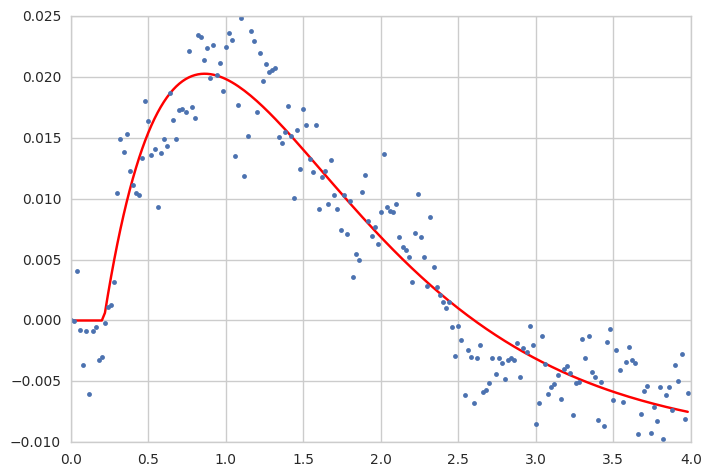

('K1 =', 0.17071136736893602, '+/-', 0.051208209727378835)
('k2 =', 160.82679324921716, '+/-', 126527.32263054835)
('tau_1 =', 1.1588455708059333, '+/-', 0.051208209727378835)
('tau_2 =', 5041.7182683266728, '+/-', 126527.32263054835)
('theta =', 0.44233760648097376, '+/-', 126527.32263054835)
muscle
b2_l


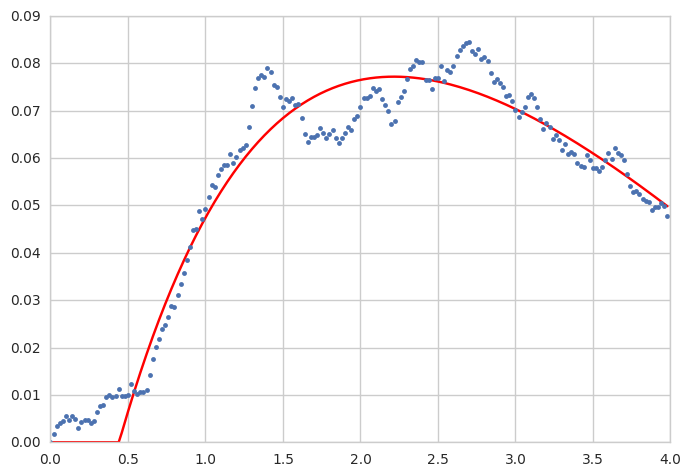

('K1 =', -0.026695681616509044, '+/-', 79168.91635152018)
('k2 =', 0.019086877564966031, '+/-', 79168.916528998423)
('tau_1 =', 0.044555658452982129, '+/-', 79168.91635152018)
('tau_2 =', 0.044545758040992402, '+/-', 79168.916528998423)
('theta =', 0.21996519938743142, '+/-', 79168.916528998423)
muscle
b3_l


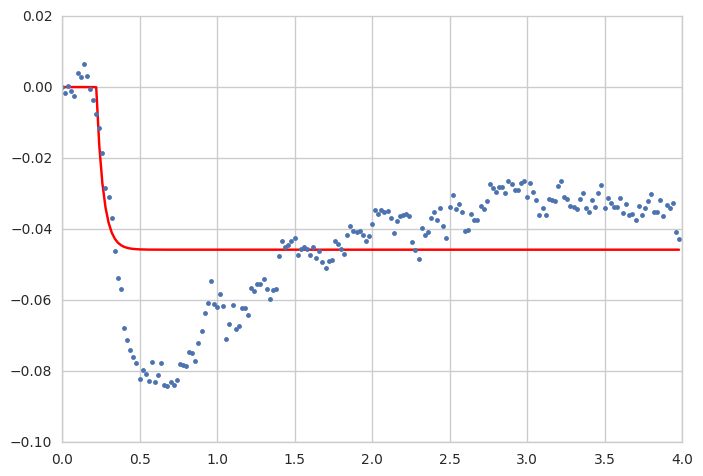

('K1 =', 0.56627452569820758, '+/-', 3640.5995428868837)
('k2 =', 0.55961000668993155, '+/-', 3640.5752844028134)
('tau_1 =', 0.77655816633714192, '+/-', 3640.5995428868837)
('tau_2 =', 0.80858619982337399, '+/-', 3640.5752844028134)
('theta =', 1.146668285155221, '+/-', 3640.5752844028134)
muscle
i1_l


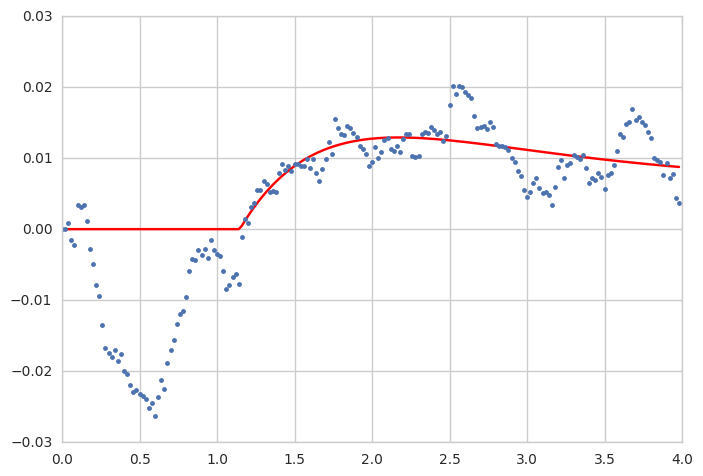

('K1 =', 0.014515952448725391, '+/-', 0.0095343884332341547)
('k2 =', 0.036723630838785527, '+/-', 0.006362394441365468)
('tau_1 =', 0.21081308101359336, '+/-', 0.0095343884332341547)
('tau_2 =', 1.3208128894468685, '+/-', 0.006362394441365468)
('theta =', 1.0553196335183648, '+/-', 0.006362394441365468)
muscle
i2_l


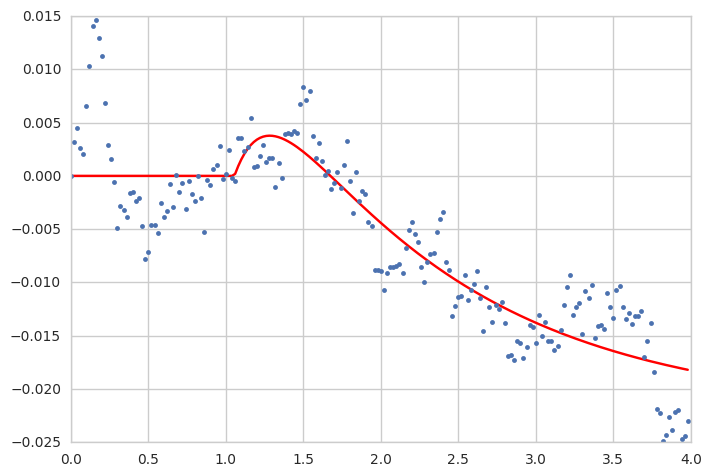

('K1 =', -0.48564000373189503, '+/-', 4.1143804686266341)
('k2 =', -0.63467522839031143, '+/-', 4.1137078026289036)
('tau_1 =', 0.40193198148693787, '+/-', 4.1143804686266341)
('tau_2 =', 0.48958475370953797, '+/-', 4.1137078026289036)
('theta =', 0.23999998498245276, '+/-', 4.1137078026289036)
muscle
iii1_l


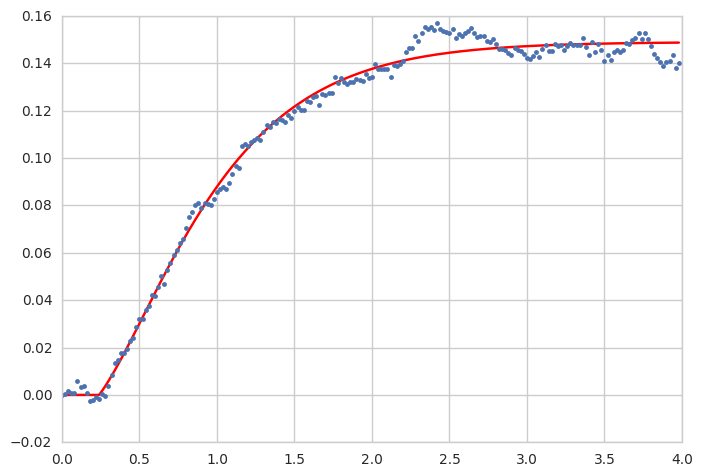

('K1 =', -0.0029479120041550565, '+/-', 1146.194144853848)
('k2 =', -0.13813157826247588, '+/-', 1146.1941803577142)
('tau_1 =', 0.55816466319607694, '+/-', 1146.194144853848)
('tau_2 =', 0.55811060784573929, '+/-', 1146.1941803577142)
('theta =', 0.10549353217252748, '+/-', 1146.1941803577142)
muscle
iii3_l


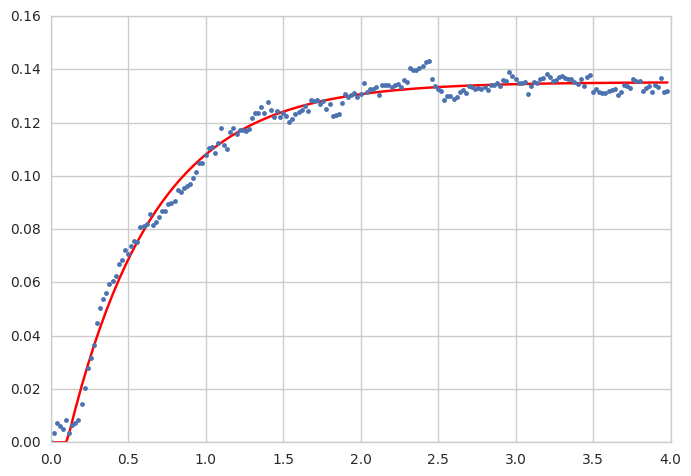

('K1 =', -1.9109550707807583, '+/-', 1596.3467900536418)
('k2 =', -1.9268450387576914, '+/-', 1596.3465914067106)
('tau_1 =', 0.3140550703589049, '+/-', 1596.3467900536418)
('tau_2 =', 0.32136678619123016, '+/-', 1596.3465914067106)
('theta =', 0.10833966060134842, '+/-', 1596.3465914067106)
muscle
hg1_l


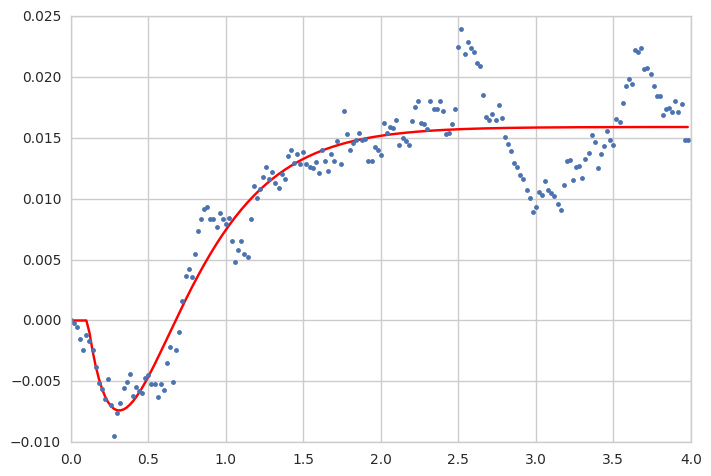

('K1 =', -0.65249584669746041, '+/-', 9.9596258161468878)
('k2 =', -0.7286060976234171, '+/-', 9.9593658276875949)
('tau_1 =', 0.40409176440406724, '+/-', 9.9596258161468878)
('tau_2 =', 0.45104385564212857, '+/-', 9.9593658276875949)
('theta =', 0.036135448168574301, '+/-', 9.9593658276875949)
muscle
hg2_l


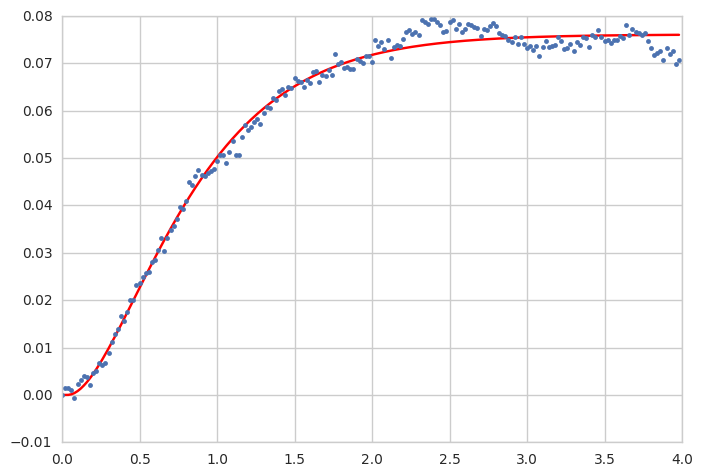

('K1 =', -0.0066776302205281907, '+/-', 0.010685065954500545)
('k2 =', 0.010464459989468679, '+/-', 0.014870719608563296)
('tau_1 =', 0.66891493380238543, '+/-', 0.010685065954500545)
('tau_2 =', 4.8022008237966745, '+/-', 0.014870719608563296)
('theta =', 0.020000078910180432, '+/-', 0.014870719608563296)
muscle
hg3_l


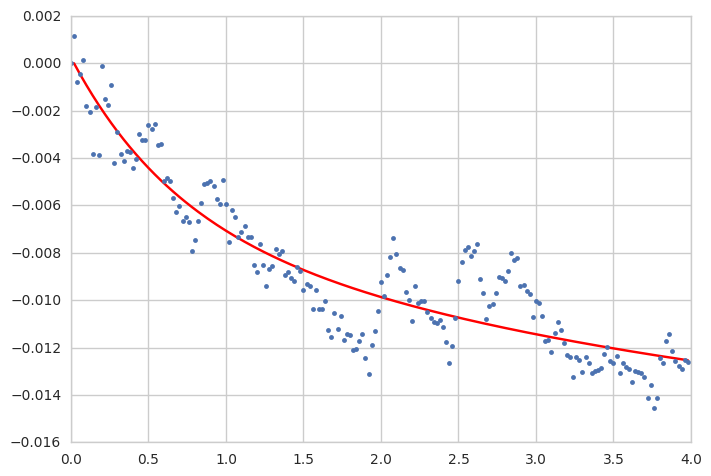

('K1 =', -0.023762169194172348, '+/-', 0.0013498242535314208)
('k2 =', 0.058431127346099135, '+/-', 0.012410009276631198)
('tau_1 =', 0.11214163715378811, '+/-', 0.0013498242535314208)
('tau_2 =', 4.9168767587842739, '+/-', 0.012410009276631198)
('theta =', 0.15114646650151115, '+/-', 0.012410009276631198)
muscle
hg4_l


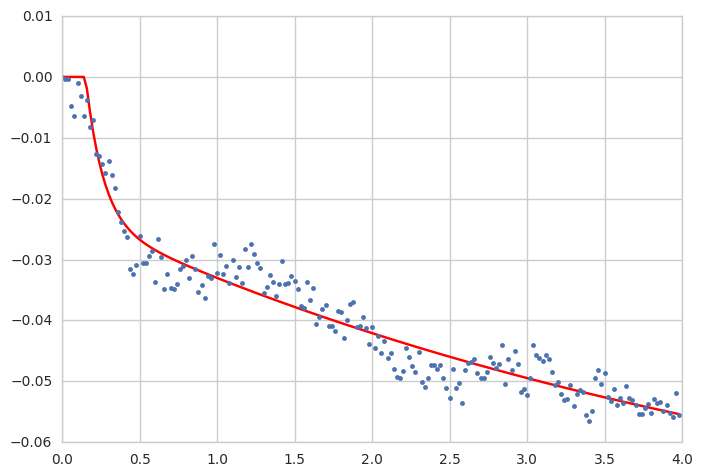

('K1 =', -8.0167253557896778, '+/-', nan)
('k2 =', -8.0279216277504517, '+/-', nan)
('tau_1 =', 0.8693162651038806, '+/-', nan)
('tau_2 =', 0.8777335464811078, '+/-', nan)
('theta =', -0.015133439539798692, '+/-', nan)
muscle
b1_r


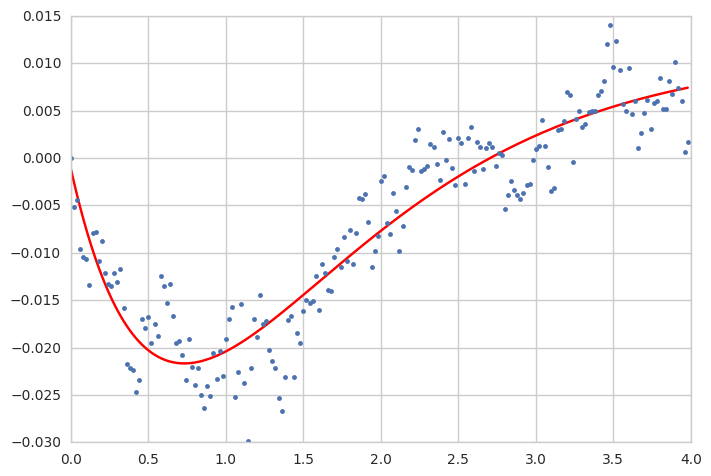

('K1 =', -0.019446540707418261, '+/-', 0.01068420328238537)
('k2 =', 0.012197931604043545, '+/-', 0.010810068896897026)
('tau_1 =', 0.53222481935026811, '+/-', 0.01068420328238537)
('tau_2 =', 0.20656192894430869, '+/-', 0.010810068896897026)
('theta =', 0.36889224156466549, '+/-', 0.010810068896897026)
muscle
b2_r


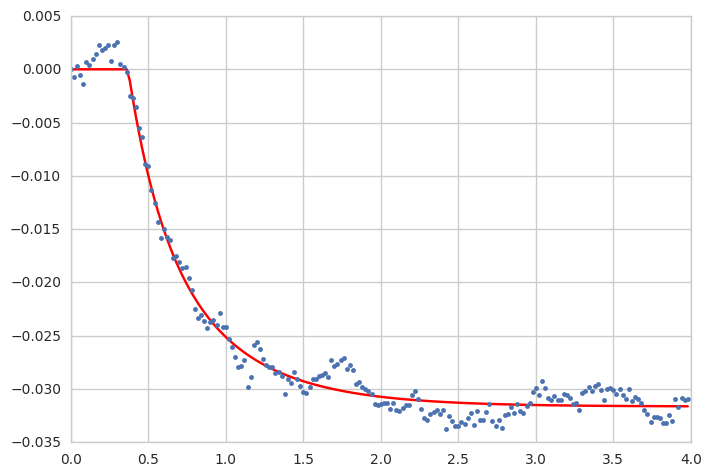

('K1 =', 0.073614938463423304, '+/-', 7213.9528576181101)
('k2 =', -0.0064488860198470702, '+/-', 7213.9529159370177)
('tau_1 =', 0.35767507858471065, '+/-', 7213.9528576181101)
('tau_2 =', 0.35768422626161511, '+/-', 7213.9529159370177)
('theta =', 0.19460274511950773, '+/-', 7213.9529159370177)
muscle
b3_r


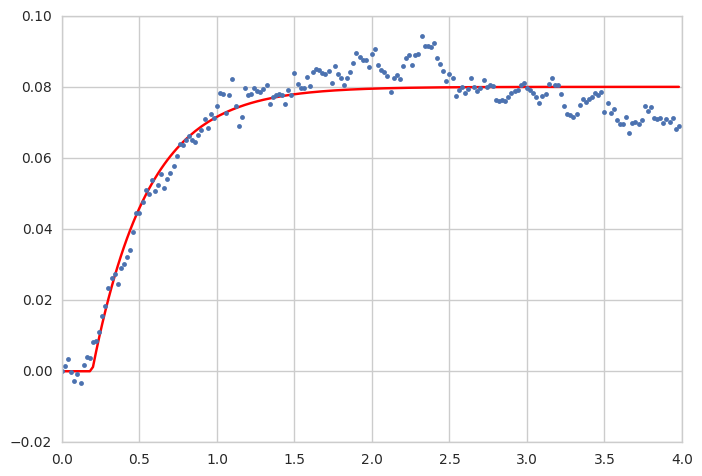

('K1 =', 0.056048666872958376, '+/-', 33520.059307503892)
('k2 =', -0.23815778088820683, '+/-', 33520.059254159154)
('tau_1 =', 0.37323376471124831, '+/-', 33520.059307503892)
('tau_2 =', 0.37323377206533082, '+/-', 33520.059254159154)
('theta =', 0.29256981476317689, '+/-', 33520.059254159154)
muscle
i1_r


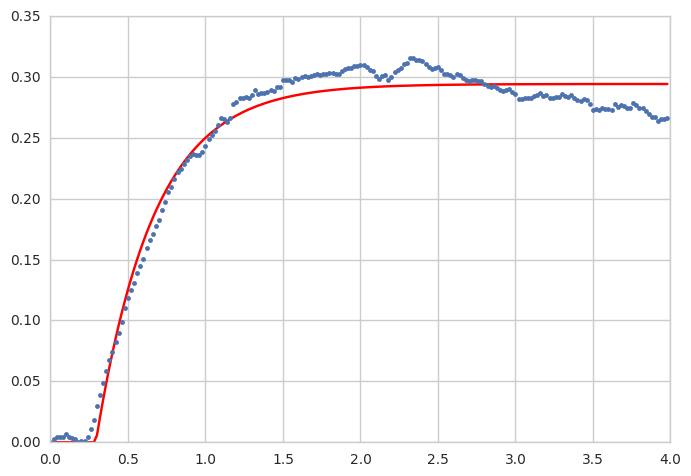

('K1 =', 35.348104577546941, '+/-', nan)
('k2 =', 35.059697979475295, '+/-', nan)
('tau_1 =', 0.63483435442336256, '+/-', nan)
('tau_2 =', 0.63859188081464613, '+/-', nan)
('theta =', 0.21247720794060934, '+/-', nan)
muscle
i2_r


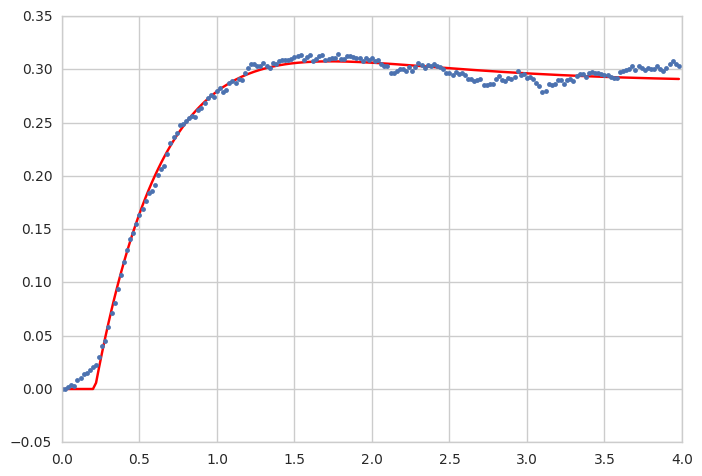

('K1 =', 8.8993859116473324, '+/-', nan)
('k2 =', 8.886646681224228, '+/-', nan)
('tau_1 =', 1.485035781379149, '+/-', nan)
('tau_2 =', 1.5122715536265381, '+/-', nan)
('theta =', 0.38924060172006314, '+/-', nan)
muscle
iii1_r


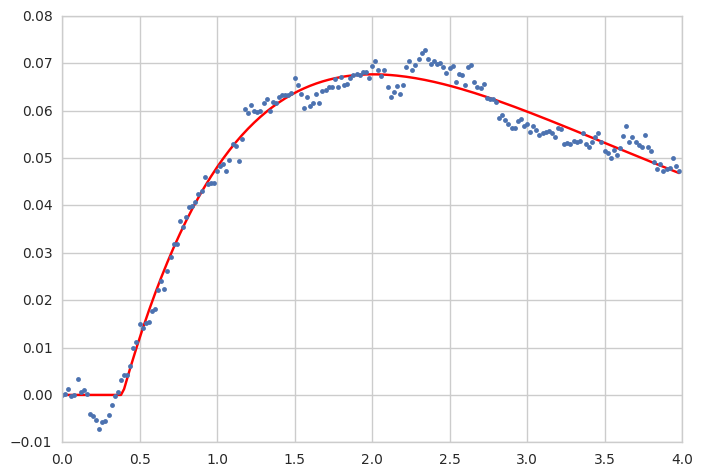

('K1 =', 226.88106544399628, '+/-', 139948.42299592358)
('k2 =', 0.25559011090677569, '+/-', 0.0050169766593571204)
('tau_1 =', 10109.933065697574, '+/-', 139948.42299592358)
('tau_2 =', 0.34805057745474188, '+/-', 0.0050169766593571204)
('theta =', 0.21712462071054586, '+/-', 0.0050169766593571204)
muscle
iii3_r


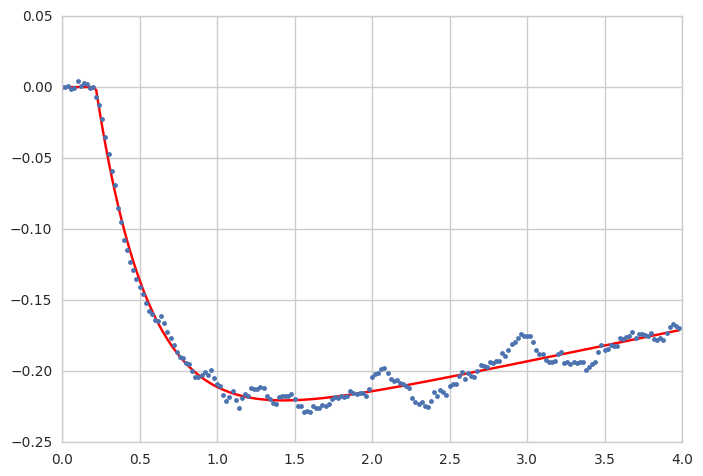

('K1 =', 0.23041721030693224, '+/-', 0.011509692737606391)
('k2 =', -151.69559559585412, '+/-', 65075.176421615142)
('tau_1 =', 0.68055234994061575, '+/-', 0.011509692737606391)
('tau_2 =', -5991.3289807166466, '+/-', 65075.176421615142)
('theta =', 0.32187570246133257, '+/-', 65075.176421615142)
muscle
hg1_r


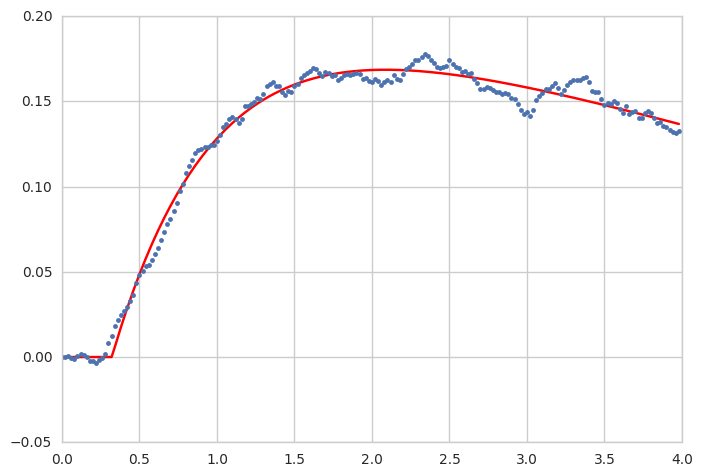

('K1 =', 0.20068438525636301, '+/-', 14455.115765707586)
('k2 =', 0.030611308355072815, '+/-', 14455.115901826282)
('tau_1 =', 0.65731282455417361, '+/-', 14455.115765707586)
('tau_2 =', 0.65731606624276839, '+/-', 14455.115901826282)
('theta =', 0.23319061782478942, '+/-', 14455.115901826282)
muscle
hg2_r


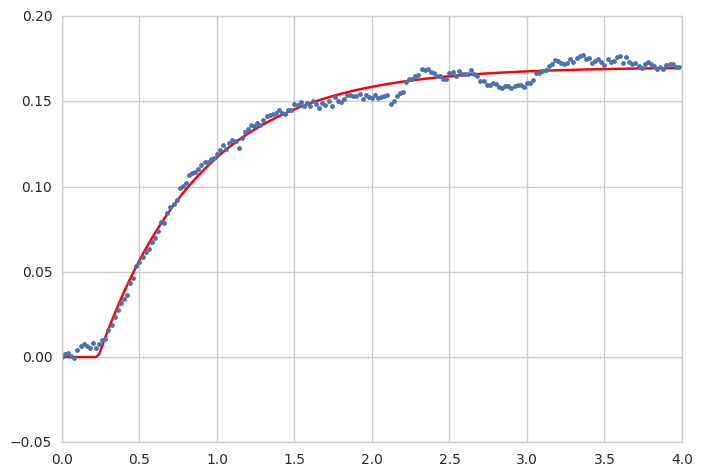

('K1 =', 1.7778434274425825, '+/-', 20375.394618388043)
('k2 =', 1.6443191161368376, '+/-', 20375.56247110563)
('tau_1 =', 2.3627382047888936, '+/-', 20375.394618388043)
('tau_2 =', 2.2852579857396633, '+/-', 20375.56247110563)
('theta =', 0.0088514076417273435, '+/-', 20375.56247110563)
muscle
hg3_r


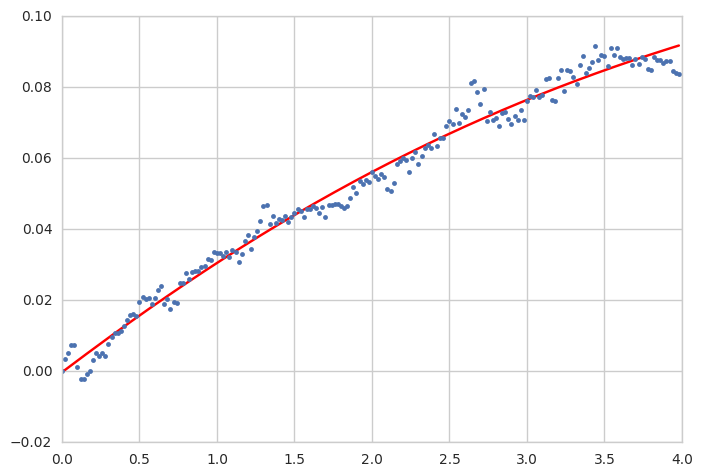

('K1 =', 0.14347819985186458, '+/-', 0.041493384004865685)
('k2 =', 0.12100409272242867, '+/-', 0.027904830128756716)
('tau_1 =', 0.57840173488460189, '+/-', 0.041493384004865685)
('tau_2 =', 3.7967272890898998, '+/-', 0.027904830128756716)
('theta =', 0.14811100024970442, '+/-', 0.027904830128756716)
muscle
hg4_r


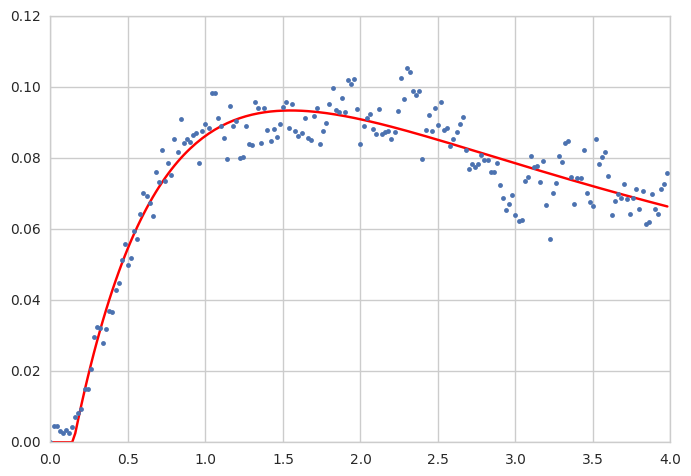

In [193]:
#stimulus_df = pd.DataFrame({'K1':0,'K2': 0, 'tau1': 0, 'tau2': 0},
#                  index=[0])
stimulus_df = pd.DataFrame()
stimulus = yaw_right_df

for muscle in muscle_list: 
        
        times = np.arange(350)*0.02
        colors = times[150:350]
        x1 = times[150:350]
        x=x1-x1[0]
        muscle_choice = stimulus[muscle]
        y = muscle_choice[150:350]-muscle_choice[150]   #from 150
        
        popt, pcov = curve_fit(exponential_f, x, y, p0=np.asarray([0.1,0.1,0.25,0.9, 0.1]), maxfev=2000000)
        
        df =pd.DataFrame({'K1': popt[0],'K2': popt[1], 'tau1': popt[2], 'tau2': popt[3], 'theta': popt[4]},
                  index=[muscle])
        stimulus_df = stimulus_df.append(df)
        
        print("K1 =", popt[0], "+/-", pcov[0,0]**0.5)
        print("k2 =", popt[1], "+/-", pcov[1,1]**0.5)
        print("tau_1 =", popt[2], "+/-", pcov[0,0]**0.5)
        print("tau_2 =", popt[3], "+/-", pcov[1,1]**0.5)
        print("theta =", popt[4], "+/-", pcov[1,1]**0.5)
        print('muscle')
        print(muscle)

        df =pd.DataFrame({'K1': popt[0],'K2': popt[1], 'tau1': popt[2], 'tau2': popt[3], 'theta': popt[4]},
                  index=[muscle])
        #df =pd.DataFrame
    
        df_1.append(df)
        #plt.errorbar(x, y, yerr=e, fmt="none")
        #xfine = np.linspace(0.01, 10., 100)  # define values to plot the function for
        plt.plot(x, exponential_f(x, popt[0], popt[1], popt[2], popt[3], popt[4]), 'r-')
        plt.plot(x, y, '.')
        plt.xlim(0, 4.0)
        plt.show()
        
stimulus_df.to_csv('yaw_right_constants_theta.csv') 

b1_l
b2_l
b3_l
i1_l
i2_l
iii1_l
iii3_l
hg1_l
hg2_l
hg3_l
hg4_l
b1_r
b2_r
b3_r
i1_r
i2_r
iii1_r
iii3_r
hg1_r
hg2_r
hg3_r
hg4_r


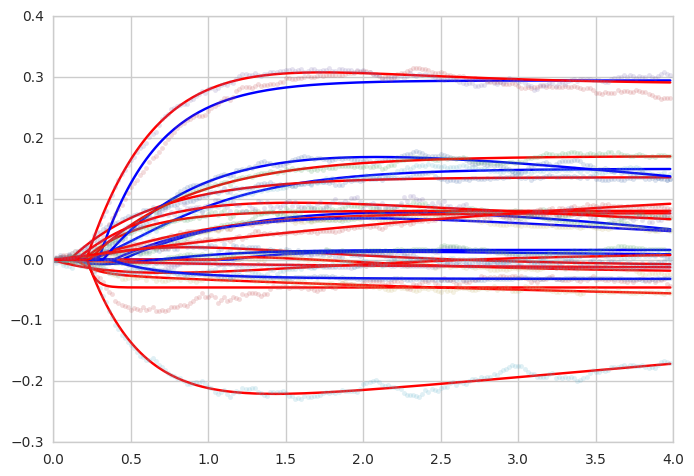

In [175]:
muscle_list = ('b1_l', 'b2_l', 'b3_l', 'i1_l', 'i2_l', 'iii1_l', 'iii3_l', 'hg1_l', 'hg2_l', 'hg3_l', 'hg4_l', 'b1_r', 'b2_r', 'b3_r', 'i1_r', 'i2_r', 'iii1_r', 'iii3_r', 'hg1_r', 'hg2_r', 'hg3_r', 'hg4_r')
muscle_assign = ('R', 'B', 'R', 'B', 'R', 'B', 'R', 'B', 'R', 'R', 'R', 'R', 'B', 'R', 'B', 'R', 'B', 'R', 'B', 'R', 'R', 'R')


#stimulus_df = pd.DataFrame({'K1':0,'K2': 0, 'tau1': 0, 'tau2': 0},
#                  index=[0])
stimulus_df = pd.DataFrame()
stimulus = yaw_right_df
counter = 0
for muscle in muscle_list: 
        
        times = np.arange(350)*0.02
        colors = times[150:350]
        x1 = times[150:350]
        x=x1-x1[0]
        muscle_choice = stimulus[muscle]
        y = muscle_choice[150:350]-muscle_choice[150]   #from 150
        
        popt, pcov = curve_fit(exponential_f, x, y, p0=np.asarray([0.1,0.1,0.25,0.9, 0.1]), maxfev=2000000)
        
        df =pd.DataFrame({'K1': popt[0],'K2': popt[1], 'tau1': popt[2], 'tau2': popt[3], 'theta': popt[4]},
                  index=[muscle])
        stimulus_df = stimulus_df.append(df)
        


        df =pd.DataFrame({'K1': popt[0],'K2': popt[1], 'tau1': popt[2], 'tau2': popt[3], 'theta': popt[4]},
                  index=[muscle])
        #df =pd.DataFrame
    
        df_1.append(df)
        #plt.errorbar(x, y, yerr=e, fmt="none")
        #xfine = np.linspace(0.01, 10., 100)  # define values to plot the function for
        plt.plot(x, exponential_f(x, popt[0], popt[1], popt[2], popt[3], popt[4]), color = muscle_assign[counter])
        plt.plot(x, y, '.', alpha = 0.2)
        counter = counter + 1
        
        
plt.xlim(0, 4.0)
plt.show()

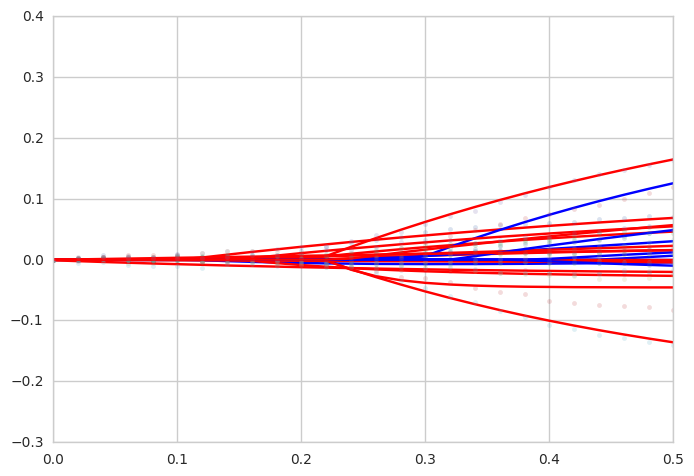

In [176]:
muscle_list = ('b1_l', 'b2_l', 'b3_l', 'i1_l', 'i2_l', 'iii1_l', 'iii3_l', 'hg1_l', 'hg2_l', 'hg3_l', 'hg4_l', 'b1_r', 'b2_r', 'b3_r', 'i1_r', 'i2_r', 'iii1_r', 'iii3_r', 'hg1_r', 'hg2_r', 'hg3_r', 'hg4_r')
muscle_assign = ('R', 'B', 'R', 'B', 'R', 'B', 'R', 'B', 'R', 'R', 'R', 'R', 'B', 'R', 'B', 'R', 'B', 'R', 'B', 'R', 'R', 'R')


#stimulus_df = pd.DataFrame({'K1':0,'K2': 0, 'tau1': 0, 'tau2': 0},
#                  index=[0])
stimulus_df = pd.DataFrame()
stimulus = yaw_right_df
counter = 0
for muscle in muscle_list: 
        
        times = np.arange(350)*0.02
        colors = times[150:350]
        x1 = times[150:350]
        x=x1-x1[0]
        muscle_choice = stimulus[muscle]
        y = muscle_choice[150:350]-muscle_choice[150]   #from 150
        
        popt, pcov = curve_fit(exponential_f, x, y, p0=np.asarray([0.1,0.1,0.25,0.9, 0.1]), maxfev=2000000)
        
        df =pd.DataFrame({'K1': popt[0],'K2': popt[1], 'tau1': popt[2], 'tau2': popt[3], 'theta': popt[4]},
                  index=[muscle])
        stimulus_df = stimulus_df.append(df)
        


        df =pd.DataFrame({'K1': popt[0],'K2': popt[1], 'tau1': popt[2], 'tau2': popt[3], 'theta': popt[4]},
                  index=[muscle])
        #df =pd.DataFrame
    
        df_1.append(df)
        #plt.errorbar(x, y, yerr=e, fmt="none")
        #xfine = np.linspace(0.01, 10., 100)  # define values to plot the function for
        plt.plot(x, exponential_f(x, popt[0], popt[1], popt[2], popt[3], popt[4]), color = muscle_assign[counter])
        plt.plot(x, y, '.', alpha = 0.2)
        counter = counter + 1
        
        
plt.xlim(0, 0.5)
plt.show()



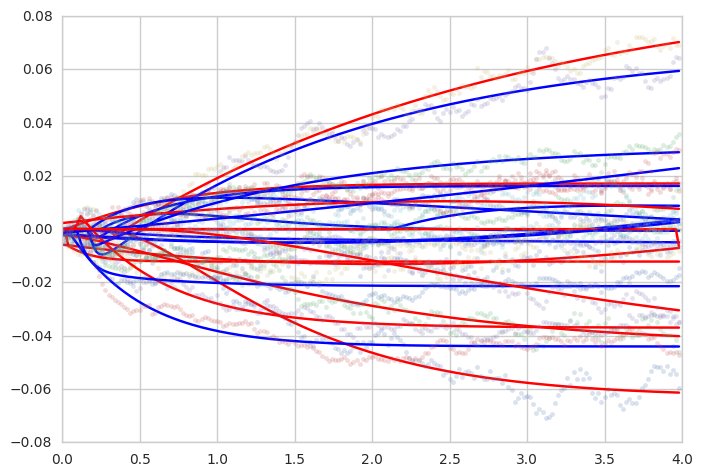

In [191]:
muscle_list = ('b1_l', 'b2_l', 'b3_l', 'i1_l', 'i2_l', 'iii1_l', 'iii3_l', 'hg1_l', 'hg2_l', 'hg3_l', 'hg4_l', 'b1_r', 'b2_r', 'b3_r', 'i1_r', 'i2_r', 'iii1_r', 'iii3_r', 'hg1_r', 'hg2_r', 'hg3_r', 'hg4_r')
#muscle_assign = ('R', 'B', 'R', 'B', 'R', 'B', 'R', 'B', 'R', 'R', 'R', 'R', 'B', 'R', 'B', 'R', 'B', 'R', 'B', 'R', 'R', 'R')
muscle_assign = ('R', 'B', 'R', 'B', 'R', 'B', 'R', 'B', 'B', 'B', 'R', 'R', 'B', 'R', 'B', 'R', 'B', 'R', 'B', 'B', 'B', 'R')


#stimulus_df = pd.DataFrame({'K1':0,'K2': 0, 'tau1': 0, 'tau2': 0},
#                  index=[0])
stimulus_df = pd.DataFrame()
stimulus = roll_ccw_df
counter = 0
for muscle in muscle_list: 
        
        times = np.arange(350)*0.02
        colors = times[150:350]
        x1 = times[150:350]
        x=x1-x1[0]
        muscle_choice = stimulus[muscle]
        y = muscle_choice[150:350]-muscle_choice[150]   #from 150
        
        popt, pcov = curve_fit(exponential_f, x, y, p0=np.asarray([0.1,0.1,0.25,0.9, 0.1]), maxfev=2000000)
        
        df =pd.DataFrame({'K1': popt[0],'K2': popt[1], 'tau1': popt[2], 'tau2': popt[3], 'theta': popt[4]},
                  index=[muscle])
        stimulus_df = stimulus_df.append(df)
        


        df =pd.DataFrame({'K1': popt[0],'K2': popt[1], 'tau1': popt[2], 'tau2': popt[3], 'theta': popt[4]},
                  index=[muscle])
        #df =pd.DataFrame
    
        df_1.append(df)
        #plt.errorbar(x, y, yerr=e, fmt="none")
        #xfine = np.linspace(0.01, 10., 100)  # define values to plot the function for
        plt.plot(x, exponential_f(x, popt[0], popt[1], popt[2], popt[3], popt[4]), color = muscle_assign[counter])
        plt.plot(x, y, '.', alpha = 0.2)
        counter = counter + 1
        
        
plt.xlim(0, 4.0)
plt.show()

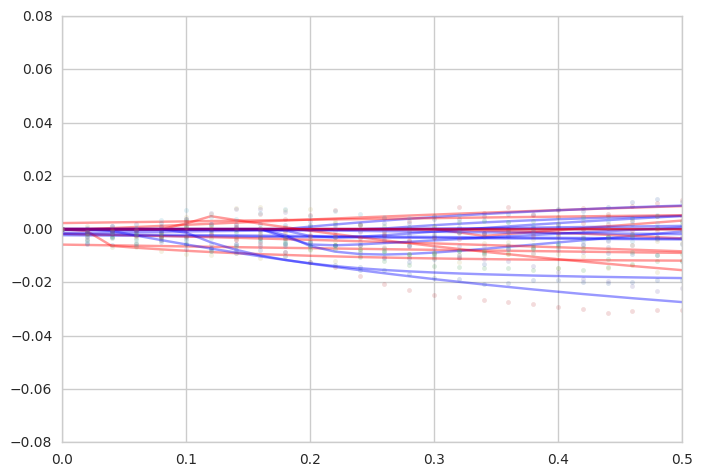

In [192]:
muscle_list = ('b1_l', 'b2_l', 'b3_l', 'i1_l', 'i2_l', 'iii1_l', 'iii3_l', 'hg1_l', 'hg2_l', 'hg3_l', 'hg4_l', 'b1_r', 'b2_r', 'b3_r', 'i1_r', 'i2_r', 'iii1_r', 'iii3_r', 'hg1_r', 'hg2_r', 'hg3_r', 'hg4_r')
muscle_assign = ('R', 'B', 'R', 'B', 'R', 'B', 'R', 'B', 'B', 'B', 'R', 'R', 'B', 'R', 'B', 'R', 'B', 'R', 'B', 'B', 'B', 'R')


#stimulus_df = pd.DataFrame({'K1':0,'K2': 0, 'tau1': 0, 'tau2': 0},
#                  index=[0])
stimulus_df = pd.DataFrame()
stimulus = roll_ccw_df
counter = 0
for muscle in muscle_list: 
        
        times = np.arange(350)*0.02
        colors = times[150:350]
        x1 = times[150:350]
        x=x1-x1[0]
        muscle_choice = stimulus[muscle]
        y = muscle_choice[150:350]-muscle_choice[150]   #from 150
        
        popt, pcov = curve_fit(exponential_f, x, y, p0=np.asarray([0.1,0.1,0.25,0.9, 0.1]), maxfev=2000000)
        
        df =pd.DataFrame({'K1': popt[0],'K2': popt[1], 'tau1': popt[2], 'tau2': popt[3], 'theta': popt[4]},
                  index=[muscle])
        stimulus_df = stimulus_df.append(df)
        


        df =pd.DataFrame({'K1': popt[0],'K2': popt[1], 'tau1': popt[2], 'tau2': popt[3], 'theta': popt[4]},
                  index=[muscle])
        #df =pd.DataFrame
    
        df_1.append(df)
        #plt.errorbar(x, y, yerr=e, fmt="none")
        #xfine = np.linspace(0.01, 10., 100)  # define values to plot the function for
        plt.plot(x, exponential_f(x, popt[0], popt[1], popt[2], popt[3], popt[4]), color = muscle_assign[counter], alpha = 0.4)
        plt.plot(x, y, '.', alpha = 0.2)
        counter = counter + 1
        
        
plt.xlim(0, 0.5)
plt.show()



In [ ]:
#stimulus_df = pd.DataFrame({'K1':0,'K2': 0, 'tau1': 0, 'tau2': 0},
#                  index=[0])
stimulus_df = pd.DataFrame()
stimulus = yaw_right_df

for muscle in muscle_list: 
        
        times = np.arange(350)*0.02
        colors = times[150:350]
        x1 = times[150:350]
        x=x1-x1[0]
        muscle_choice = stimulus[muscle]
        y = muscle_choice[150:350]-muscle_choice[150]   #from 150
        
        popt, pcov = curve_fit(exponential_f, x, y, p0=np.asarray([0.1,0.1,0.25,0.9, 0.1]), maxfev=2000000)
        
        df =pd.DataFrame({'K1': popt[0],'K2': popt[1], 'tau1': popt[2], 'tau2': popt[3], 'theta': popt[4]},
                  index=[muscle])
        stimulus_df_ = stimulus_df.append(df)
        
        print("K1 =", popt[0], "+/-", pcov[0,0]**0.5)
        print("k2 =", popt[1], "+/-", pcov[1,1]**0.5)
        print("tau_1 =", popt[2], "+/-", pcov[0,0]**0.5)
        print("tau_2 =", popt[3], "+/-", pcov[1,1]**0.5)
        print("theta =", popt[4], "+/-", pcov[1,1]**0.5)
        print('muscle')
        print(muscle)

        df =pd.DataFrame({'K1': popt[0],'K2': popt[1], 'tau1': popt[2], 'tau2': popt[3], 'theta': popt[4]},
                  index=[muscle])
        #df =pd.DataFrame
    
        df_1.append(df)
        
        #plt.errorbar(x, y, yerr=e, fmt="none")
        #xfine = np.linspace(0.01, 10., 100)  # define values to plot the function for
        plt.plot(x, exponential_f(x, popt[0], popt[1], popt[2], popt[3], popt[4]), 'r-')
        plt.plot(x, y, '.')
        plt.xlim(0, 4.0)
        plt.show()
        
stimulus_df.to_csv('yaw_right_constants_theta.csv') 

('K1 =', -3.0773145330734111, '+/-', 13078.39631356819)
('k2 =', -3.0950395748068655, '+/-', 13078.395843952143)
('tau_1 =', 0.49805089623186083, '+/-', 13078.39631356819)
('tau_2 =', 0.5037332803651452, '+/-', 13078.395843952143)
('theta =', -0.078544340810191779, '+/-', 13078.395843952143)
muscle
b1_l


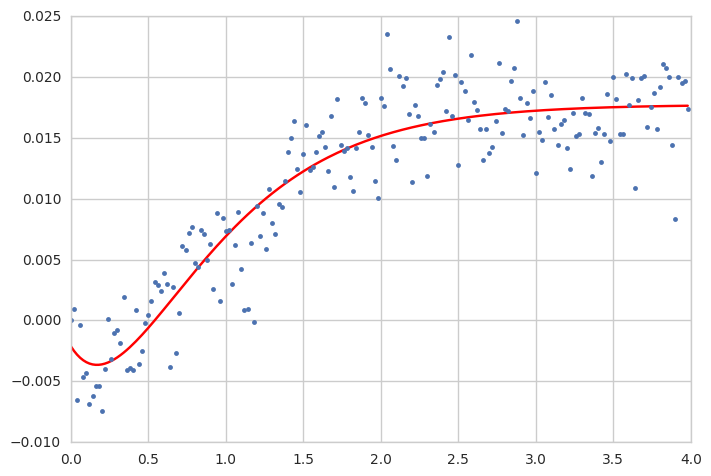

('K1 =', -0.049572692761615189, '+/-', 0.040059100890859227)
('k2 =', -20.704688529262572, '+/-', 19020.374288814324)
('tau_1 =', 1.2089716156942996, '+/-', 0.040059100890859227)
('tau_2 =', 2247.7938558262831, '+/-', 19020.374288814324)
('theta =', 0.22856163682269176, '+/-', 19020.374288814324)
muscle
b2_l


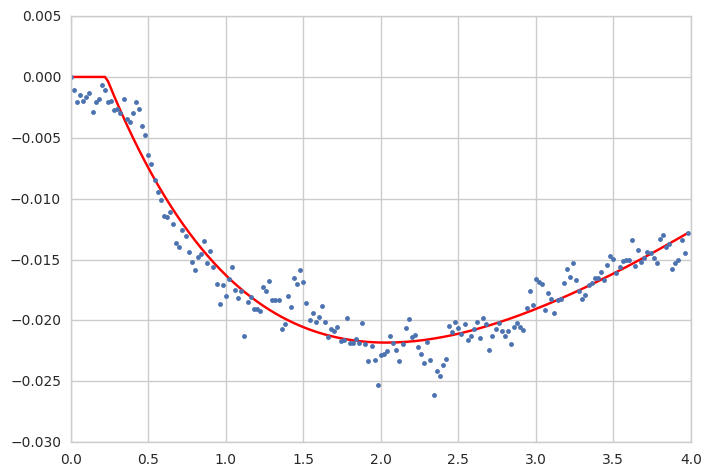

('K1 =', 0.068075883288386291, '+/-', 0.0032261335036049906)
('k2 =', 65.779084741295165, '+/-', 82447.990162247865)
('tau_1 =', 0.50205488375435914, '+/-', 0.0032261335036049906)
('tau_2 =', 11631.013638950906, '+/-', 82447.990162247865)
('theta =', 0.091428246714770331, '+/-', 82447.990162247865)
muscle
b3_l


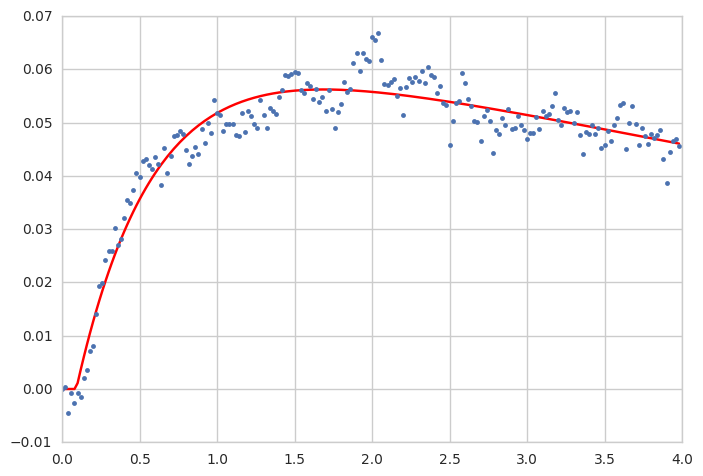

('K1 =', 0.44653163357226677, '+/-', 0.17268392377396044)
('k2 =', 33.783091049302385, '+/-', 8718.2458665130725)
('tau_1 =', 1.1778508395353997, '+/-', 0.17268392377396044)
('tau_2 =', 722.63168368434015, '+/-', 8718.2458665130725)
('theta =', 0.1704889538588332, '+/-', 8718.2458665130725)
muscle
i1_l


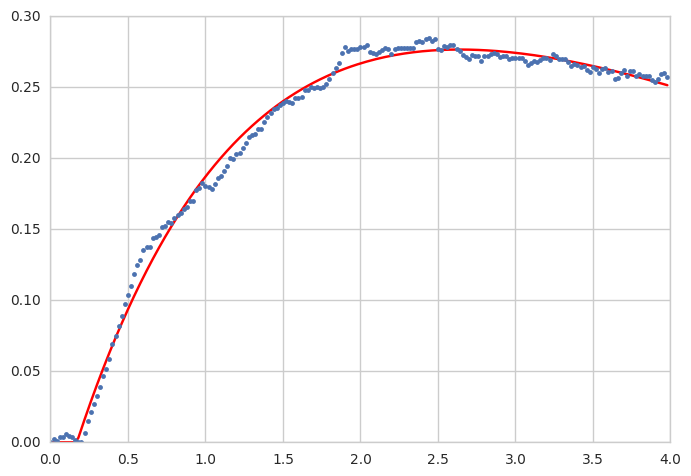

('K1 =', 0.48400175703692105, '+/-', 0.03847788535991653)
('k2 =', 430.68876595427537, '+/-', 156213.20955693536)
('tau_1 =', 1.3063662331829726, '+/-', 0.03847788535991653)
('tau_2 =', 7544.21984527938, '+/-', 156213.20955693536)
('theta =', 0.09108264549358569, '+/-', 156213.20955693536)
muscle
i2_l


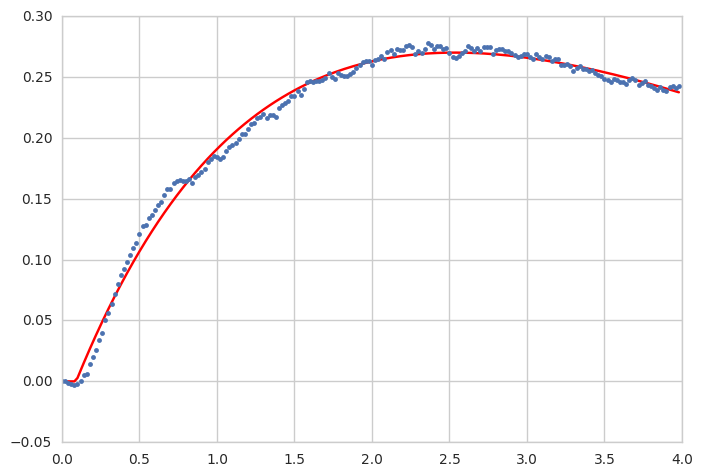

('K1 =', -8.8320634372715077, '+/-', nan)
('k2 =', -8.9172655936598506, '+/-', nan)
('tau_1 =', 0.465406207900882, '+/-', nan)
('tau_2 =', 0.46816626409507583, '+/-', nan)
('theta =', 0.21431242469193829, '+/-', nan)
muscle
iii1_l


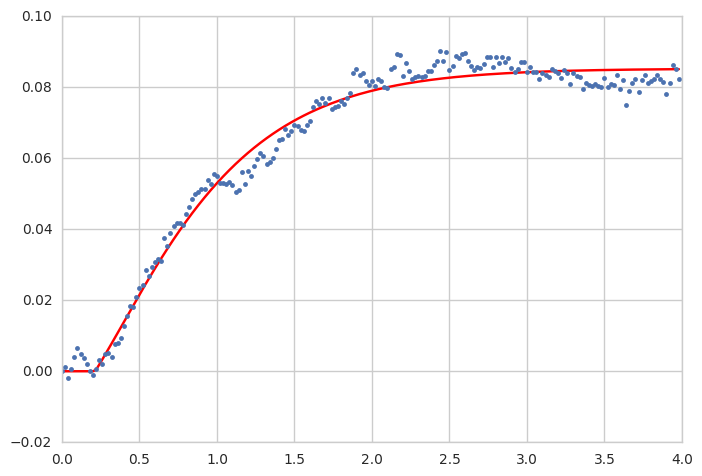

('K1 =', 0.0017843889555713777, '+/-', 2044.2460171057126)
('k2 =', 0.20211135299841618, '+/-', 2044.2460796871565)
('tau_1 =', 0.22586659487391536, '+/-', 2044.2460171057126)
('tau_2 =', 0.22579799190059124, '+/-', 2044.2460796871565)
('theta =', 0.16912020494437549, '+/-', 2044.2460796871565)
muscle
iii3_l


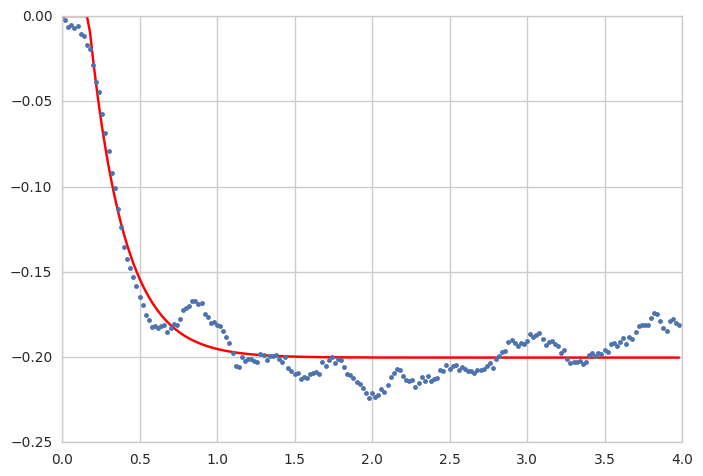

('K1 =', -0.044971864002936041, '+/-', 0.019831682647170033)
('k2 =', -0.17316822025638418, '+/-', 0.019504487431907962)
('tau_1 =', 0.17960710918417572, '+/-', 0.019831682647170033)
('tau_2 =', 0.83259234671967508, '+/-', 0.019504487431907962)
('theta =', 0.10000022709421376, '+/-', 0.019504487431907962)
muscle
hg1_l


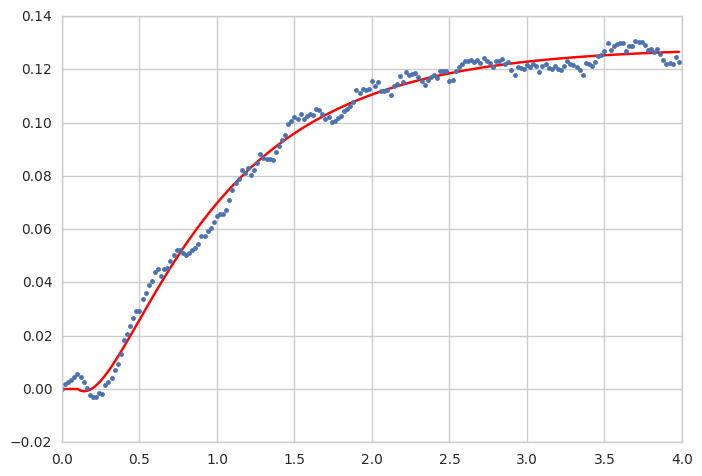

('K1 =', 181.94257502556241, '+/-', 52720.615097265116)
('k2 =', -0.079491610027041096, '+/-', 0.0075407774480216903)
('tau_1 =', 12412.808322127086, '+/-', 52720.615097265116)
('tau_2 =', 1.2340335822416058, '+/-', 0.0075407774480216903)
('theta =', 0.17331631445307946, '+/-', 0.0075407774480216903)
muscle
hg2_l


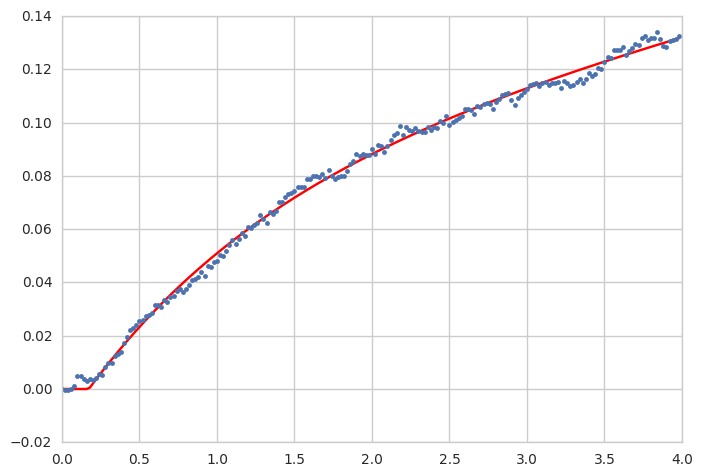

('K1 =', 222.39245802840023, '+/-', 11534.112527082572)
('k2 =', 65.657282852681277, '+/-', 19345.364839142123)
('tau_1 =', 397.04501305252722, '+/-', 11534.112527082572)
('tau_2 =', 120.87407882972168, '+/-', 19345.364839142123)
('theta =', 0.028239186458716245, '+/-', 19345.364839142123)
muscle
hg3_l


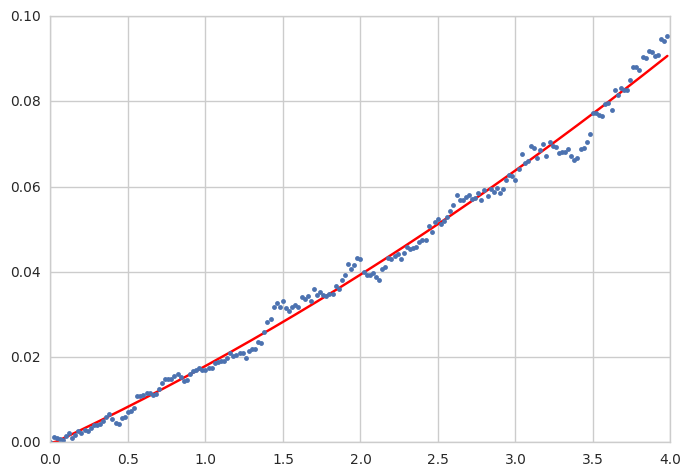

('K1 =', 7.3220601339314424, '+/-', 191921.83540600937)
('k2 =', 7.3211613538907505, '+/-', 191921.82306505539)
('tau_1 =', 0.87789183432289597, '+/-', 191921.83540600937)
('tau_2 =', 0.88617271204660697, '+/-', 191921.82306505539)
('theta =', 0.15657367330239788, '+/-', 191921.82306505539)
muscle
hg4_l


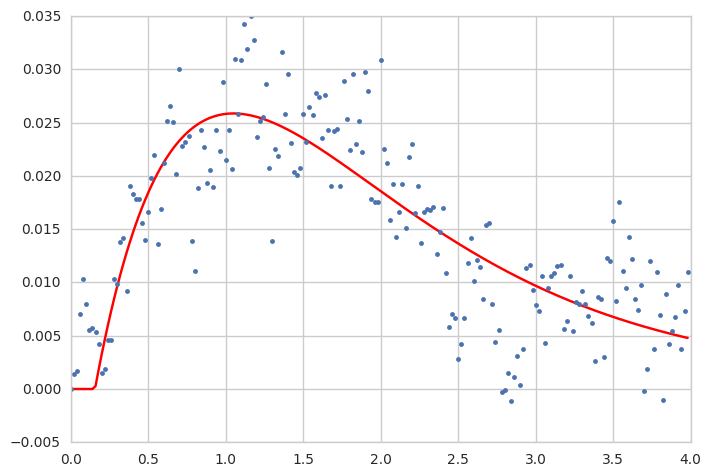

('K1 =', 0.20813711496920567, '+/-', 30.95138230921717)
('k2 =', 0.23940677130642776, '+/-', 30.940978247057171)
('tau_1 =', 1.0206464453120603, '+/-', 30.95138230921717)
('tau_2 =', 1.1738595865502655, '+/-', 30.940978247057171)
('theta =', 0.28616577493043432, '+/-', 30.940978247057171)
muscle
b1_r


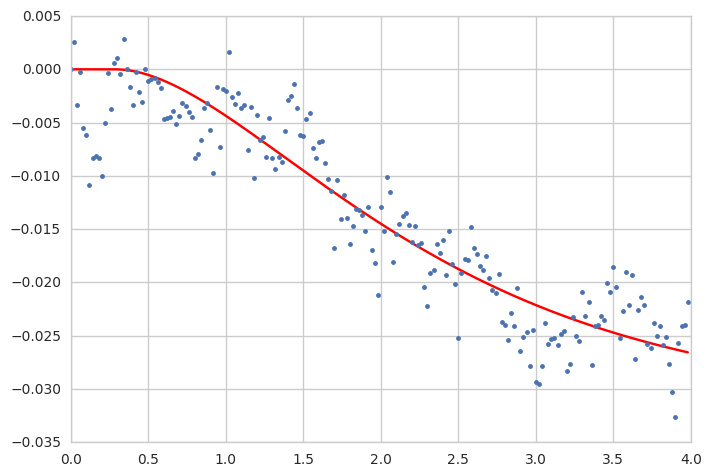

('K1 =', 6.3423706165592266, '+/-', 17424.183618190844)
('k2 =', 6.3271184364544428, '+/-', 17424.17215122679)
('tau_1 =', 1.342962490042626, '+/-', 17424.183618190844)
('tau_2 =', 1.3652989036053029, '+/-', 17424.17215122679)
('theta =', 0.40009689492375444, '+/-', 17424.17215122679)
muscle
b2_r


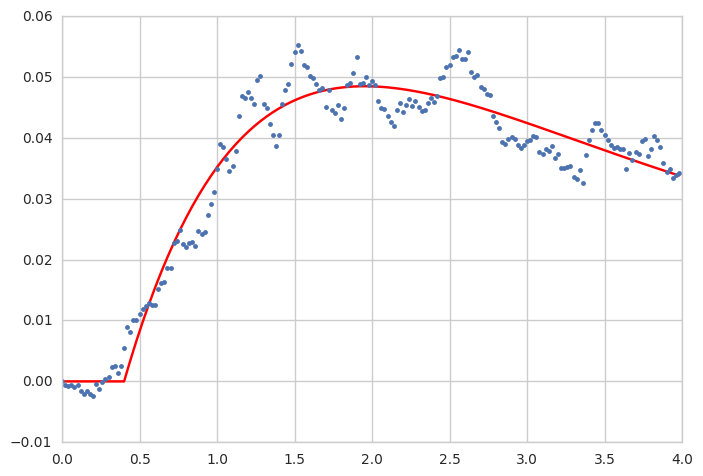

('K1 =', 0.078170776325817037, '+/-', 0.0068574595069969399)
('k2 =', 0.068191516869889335, '+/-', 0.0020559470848203793)
('tau_1 =', 3.3880028373214301, '+/-', 0.0068574595069969399)
('tau_2 =', 0.12537869960088024, '+/-', 0.0020559470848203793)
('theta =', 0.17340502860338872, '+/-', 0.0020559470848203793)
muscle
b3_r


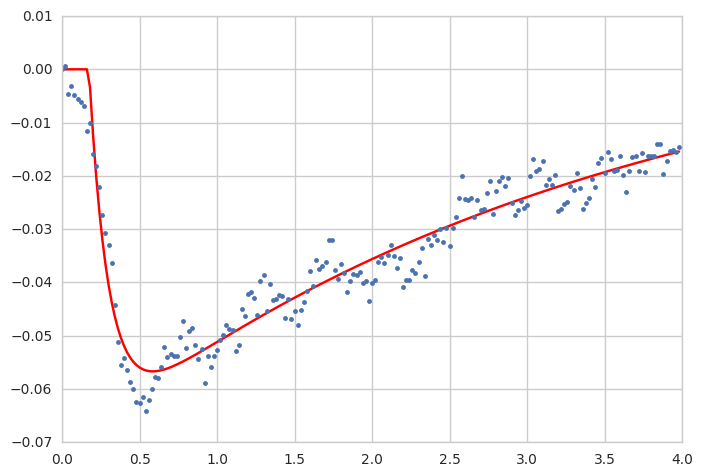

('K1 =', -0.018818835938754639, '+/-', 29532.419371996864)
('k2 =', -0.054709015958237989, '+/-', 29532.419269808353)
('tau_1 =', 0.00055924050631735861, '+/-', 29532.419371996864)
('tau_2 =', 1.2954059344853794, '+/-', 29532.419269808353)
('theta =', 0.39692931389540392, '+/-', 29532.419269808353)
muscle
i1_r


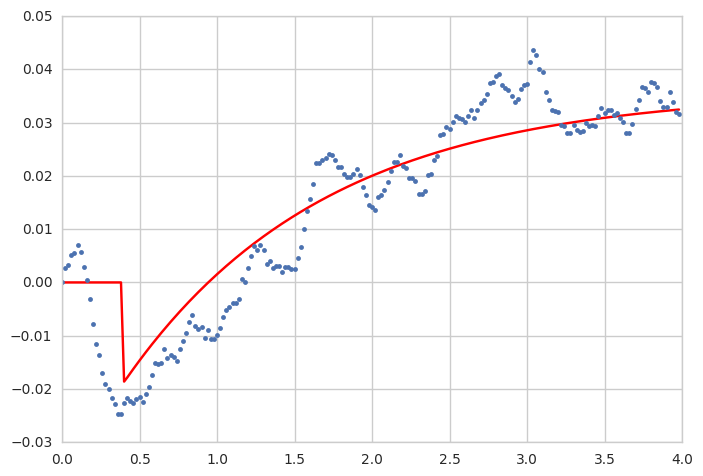

('K1 =', -14.271741561559969, '+/-', 21071.260745870946)
('k2 =', -14.384530932674613, '+/-', 21071.260530679505)
('tau_1 =', 0.58877403051874122, '+/-', 21071.260745870946)
('tau_2 =', 0.592514978617804, '+/-', 21071.260530679505)
('theta =', 0.28118221829218781, '+/-', 21071.260530679505)
muscle
i2_r


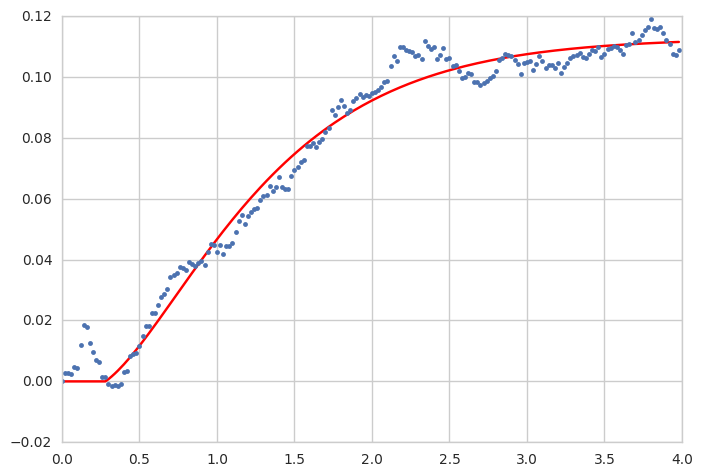

('K1 =', 0.076268917197894998, '+/-', 25528.241786789004)
('k2 =', -0.026038378900830807, '+/-', 25528.241630060911)
('tau_1 =', 1.1662816151389854, '+/-', 25528.241786789004)
('tau_2 =', 1.1662721258718005, '+/-', 25528.241630060911)
('theta =', 0.2995907804095635, '+/-', 25528.241630060911)
muscle
iii1_r


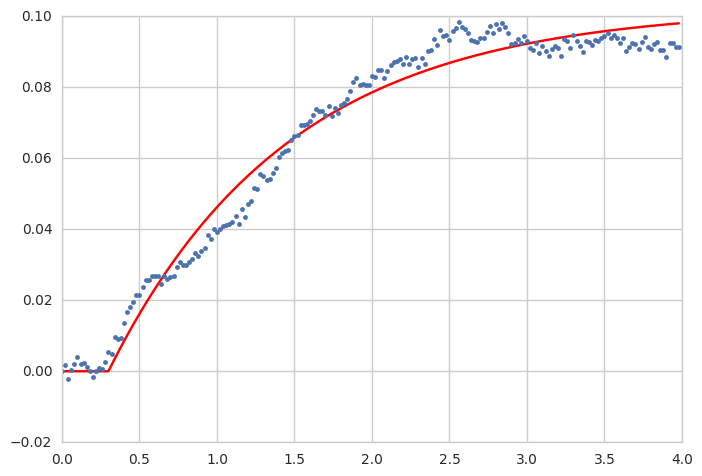

('K1 =', 0.038797097456065285, '+/-', 0.001426111960807955)
('k2 =', -0.054870843190895566, '+/-', 0.0010346082103830359)
('tau_1 =', 0.075742660394223962, '+/-', 0.001426111960807955)
('tau_2 =', 1.3835440747949013, '+/-', 0.0010346082103830359)
('theta =', 0.17371834528584021, '+/-', 0.0010346082103830359)
muscle
iii3_r


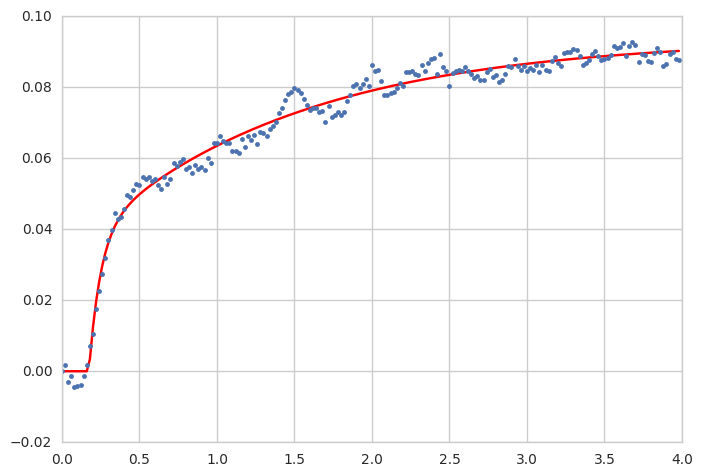

('K1 =', -0.026739281199793932, '+/-', 0.0058589453387145746)
('k2 =', -0.075377540532318668, '+/-', 0.0049009670293613857)
('tau_1 =', 0.20388193101489088, '+/-', 0.0058589453387145746)
('tau_2 =', 1.3006058594912451, '+/-', 0.0049009670293613857)
('theta =', 0.14000025256739432, '+/-', 0.0049009670293613857)
muscle
hg1_r


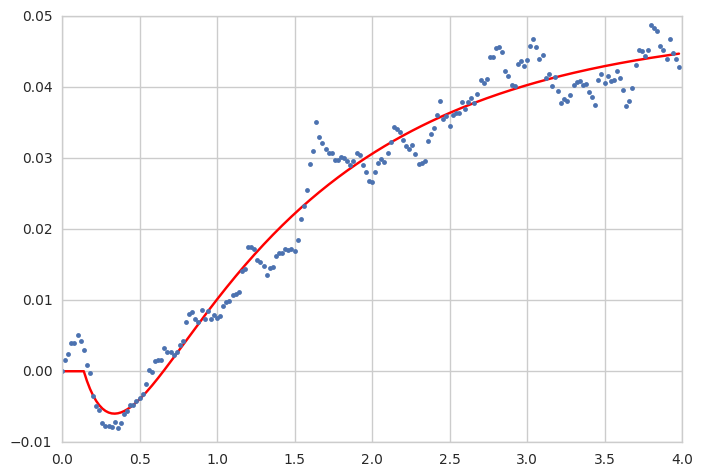

('K1 =', 23.15301578637802, '+/-', 34402.78704810061)
('k2 =', 45.973558019156769, '+/-', 25833.312981143972)
('tau_1 =', 23.014856062703444, '+/-', 34402.78704810061)
('tau_2 =', 48.924160510485358, '+/-', 25833.312981143972)
('theta =', 0.29051728689673323, '+/-', 25833.312981143972)
muscle
hg2_r


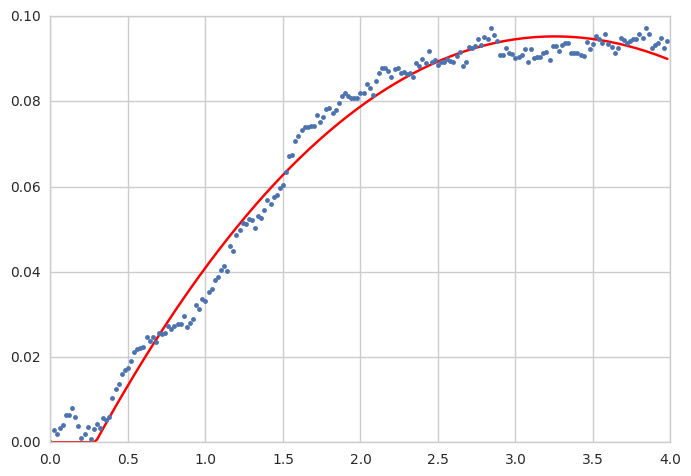

('K1 =', -0.0048486149738530097, '+/-', 0.0017441678228441307)
('k2 =', 0.010631962001096036, '+/-', 0.00094775114764195751)
('tau_1 =', 0.22824333294391841, '+/-', 0.0017441678228441307)
('tau_2 =', 1.7873199923792411, '+/-', 0.00094775114764195751)
('theta =', 0.13391184987396071, '+/-', 0.00094775114764195751)
muscle
hg3_r


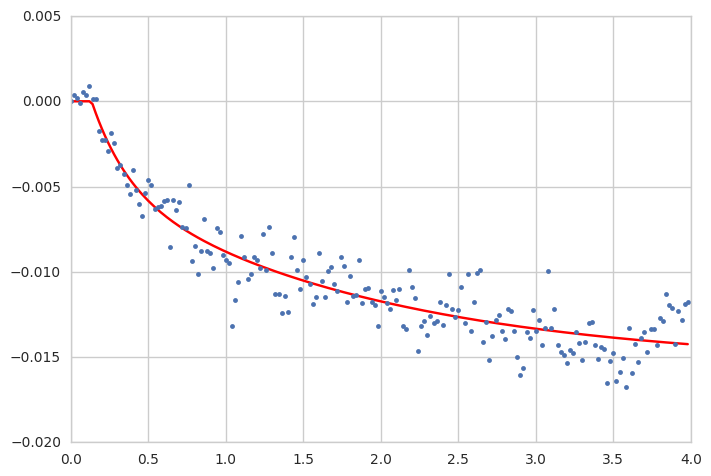

('K1 =', -0.026528054739176653, '+/-', 0.00035947260893897986)
('k2 =', 530.57908348324372, '+/-', 46827.607258720083)
('tau_1 =', 0.077421827457545361, '+/-', 0.00035947260893897986)
('tau_2 =', 42006.929193434524, '+/-', 46827.607258720083)
('theta =', 0.1972214701896548, '+/-', 46827.607258720083)
muscle
hg4_r


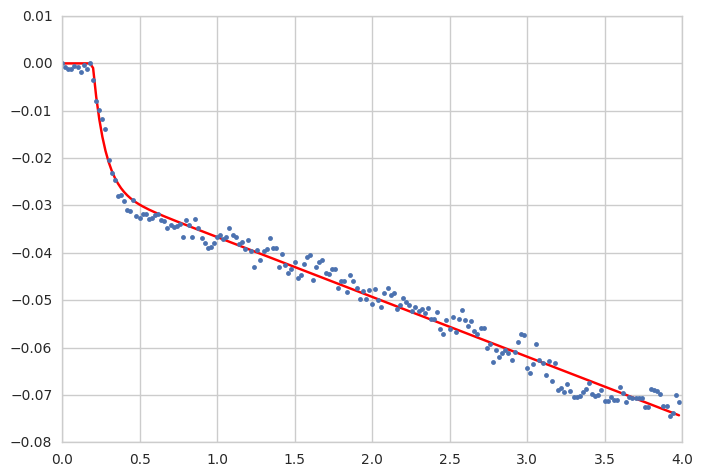

In [163]:
#stimulus_df = pd.DataFrame({'K1':0,'K2': 0, 'tau1': 0, 'tau2': 0},
#                  index=[0])
stimulus_df_yl = pd.DataFrame()
stimulus = yaw_left_df

for muscle in muscle_list: 
        
        times = np.arange(350)*0.02
        colors = times[150:350]
        x1 = times[150:350]
        x=x1-x1[0]
        muscle_choice = stimulus[muscle]
        y = muscle_choice[150:350]-muscle_choice[150]   #from 150
        
        popt, pcov = curve_fit(exponential_f, x, y, p0=np.asarray([0.1,0.1,0.25,0.9, 0.1]), maxfev=2000000)
        
        df =pd.DataFrame({'K1': popt[0],'K2': popt[1], 'tau1': popt[2], 'tau2': popt[3], 'theta': popt[4]},
                  index=[muscle])
        stimulus_df_yl = stimulus_df_yl.append(df)
        
        print("K1 =", popt[0], "+/-", pcov[0,0]**0.5)
        print("k2 =", popt[1], "+/-", pcov[1,1]**0.5)
        print("tau_1 =", popt[2], "+/-", pcov[0,0]**0.5)
        print("tau_2 =", popt[3], "+/-", pcov[1,1]**0.5)
        print("theta =", popt[4], "+/-", pcov[1,1]**0.5)
        print('muscle')
        print(muscle)

        df =pd.DataFrame({'K1': popt[0],'K2': popt[1], 'tau1': popt[2], 'tau2': popt[3], 'theta': popt[4]},
                  index=[muscle])
        #df =pd.DataFrame
    
        df_1.append(df)
        
        #plt.errorbar(x, y, yerr=e, fmt="none")
        #xfine = np.linspace(0.01, 10., 100)  # define values to plot the function for
        plt.plot(x, exponential_f(x, popt[0], popt[1], popt[2], popt[3], popt[4]), 'r-')
        plt.plot(x, y, '.')
        plt.xlim(0, 4.0)
        plt.show()
        
stimulus_df_yl.to_csv('yaw_left_constants_theta.csv') 

In [200]:
stimulus_df_yl

,K1,K2,tau1,tau2,theta
b1_l,-3.077315,-3.095040,0.498051,0.503733,-0.078544
b2_l,-0.049573,-20.704689,1.208972,2247.793856,0.228562
b3_l,0.068076,65.779085,0.502055,11631.013639,0.091428
i1_l,0.446532,33.783091,1.177851,722.631684,0.170489
i2_l,0.484002,430.688766,1.306366,7544.219845,0.091083
iii1_l,-8.832063,-8.917266,0.465406,0.468166,0.214312
iii3_l,0.001784,0.202111,0.225867,0.225798,0.169120
hg1_l,-0.044972,-0.173168,0.179607,0.832592,0.100000
hg2_l,181.942575,-0.079492,12412.808322,1.234034,0.173316
hg3_l,222.392458,65.657283,397.045013,120.874079,0.028239


In [199]:
stimulus_df

,K1,K2,tau1,tau2,theta
b1_l,8.424806,8.434828,0.753682,0.760107,0.212179
b2_l,0.170711,160.826793,1.158846,5041.718268,0.442338
b3_l,-0.026696,0.019087,0.044556,0.044546,0.219965
i1_l,0.566275,0.559610,0.776558,0.808586,1.146668
i2_l,0.014516,0.036724,0.210813,1.320813,1.055320
iii1_l,-0.485640,-0.634675,0.401932,0.489585,0.240000
iii3_l,-0.002948,-0.138132,0.558165,0.558111,0.105494
hg1_l,-1.910955,-1.926845,0.314055,0.321367,0.108340
hg2_l,-0.652496,-0.728606,0.404092,0.451044,0.036135
hg3_l,-0.006678,0.010464,0.668915,4.802201,0.020000


In [195]:
stimulus_df_pu

,K1,K2,tau1,tau2,theta
b1_l,0.424308,0.404592,0.233699,0.253110,0.173951
b2_l,1.054751,0.764656,1.852424,1.343210,1.286080
b3_l,0.206993,0.247497,0.153561,0.182902,0.184051
i1_l,0.207337,0.133497,2.084879,0.460664,0.146573
i2_l,1.054843,0.940477,0.455006,0.405856,0.620510
iii1_l,0.180375,0.047160,11.876753,1.068110,0.079996
iii3_l,11.873495,4.655783,206.460419,80.959236,-6.884669
hg1_l,346.977709,0.041208,24945.163625,0.250923,0.133616
hg2_l,0.101903,0.002806,3.061600,0.091037,0.328985
hg3_l,-0.009725,-0.026862,0.174796,2.737080,-0.020392


In [196]:
stimulus_df_pd

,K1,K2,tau1,tau2,theta
b1_l,5.060809,5.002644,2.299089,2.237496,0.058026
b2_l,12.003161,4.817870,220.777556,88.618179,-5.755229
b3_l,1.101267,1.062428,3.301886,3.074006,0.627064
i1_l,0.009555,0.052191,0.146163,0.146251,0.157471
i2_l,0.207781,0.105809,4.655735,1.804708,0.220000
iii1_l,0.087751,0.102967,0.614947,0.614974,0.827489
iii3_l,0.163672,0.167558,0.334648,0.709582,0.107023
hg1_l,0.014170,0.045350,12.288919,0.224406,0.120000
hg2_l,1.031423,1.023278,0.651119,0.659487,0.442285
hg3_l,0.016375,0.003467,19.322196,0.043734,0.007448


In [198]:
stimulus_df_rcc

,K1,K2,tau1,tau2,theta
b1_l,64.605636,20.091000,209.799922,63.280485,-0.697130
b2_l,2.416217,2.416877,0.460903,0.464131,0.252436
b3_l,-0.018511,-0.035662,0.342953,0.478090,0.020015
i1_l,0.084048,0.015402,1.725561,0.039914,0.172650
i2_l,0.097204,0.003311,2.590880,0.000451,0.319790
iii1_l,319.145842,97.114300,526.131657,158.739038,-0.502936
iii3_l,0.310743,0.373675,0.605669,0.727997,0.252759
hg1_l,0.032176,0.025759,0.821440,1.232553,2.127900
hg2_l,0.022315,0.006080,0.474391,0.024904,0.177260
hg3_l,-0.003445,4.755605,0.526412,12222.954031,0.134948


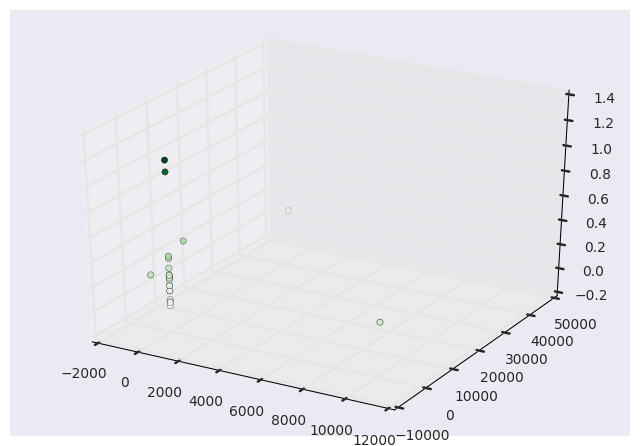

In [81]:
ax = plt.axes(projection='3d')

# Data for a three-dimensional line
#zline = np.linspace(0, 15, 1000)
#xline = np.sin(zline)
#yline = np.cos(zline)
#ax.plot3D(xline, yline, zline, 'gray')

# Data for three-dimensional scattered points
zdata = stimulus_df_yl['theta']
xdata = stimulus_df_yl['tau1']
ydata = stimulus_df_yl['tau2']
   
  
ax.scatter3D(xdata, ydata, zdata, c=zdata, cmap='Greens');
#ax.set_xlim(-1, 1); ax.set_ylim(-1, 1); ax.set_zlim(-1, 1);
plt.show()

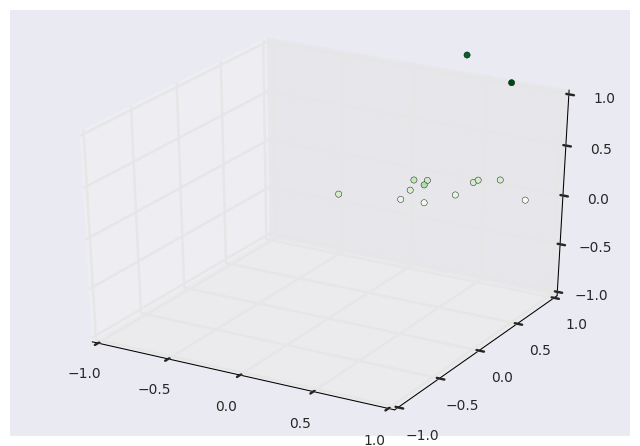

In [82]:
ax = plt.axes(projection='3d')

# Data for a three-dimensional line
#zline = np.linspace(0, 15, 1000)
#xline = np.sin(zline)
#yline = np.cos(zline)
#ax.plot3D(xline, yline, zline, 'gray')

# Data for three-dimensional scattered points
zdata = stimulus_df_yl['theta']
xdata = stimulus_df_yl['tau1']
ydata = stimulus_df_yl['tau2']
   
  
ax.scatter3D(xdata, ydata, zdata, c=zdata, cmap='Greens');
ax.set_xlim(-1, 1); ax.set_ylim(-1, 1); ax.set_zlim(-1, 1);
plt.show()

('K1 =', 0.42430769219573577, '+/-', 154.87556283238001)
('k2 =', 0.40459214343550476, '+/-', 154.87504965100806)
('tau_1 =', 0.23369935300730107, '+/-', 154.87556283238001)
('tau_2 =', 0.25310970570125529, '+/-', 154.87504965100806)
('theta =', 0.17395108286243635, '+/-', 154.87504965100806)
muscle
b1_l


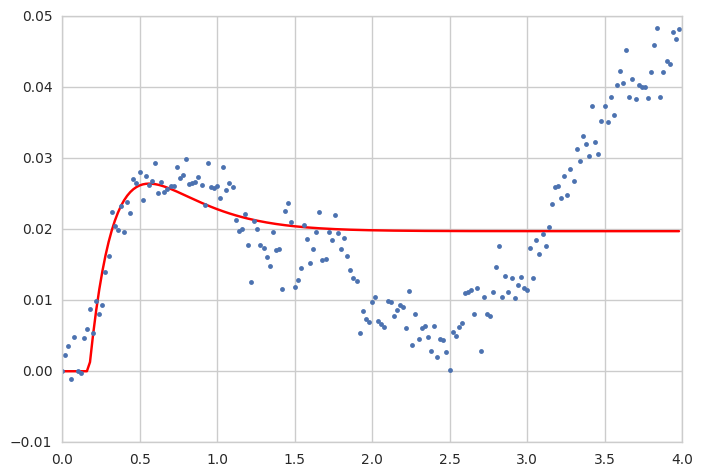

('K1 =', 1.0547505762195697, '+/-', 34.929580069320437)
('k2 =', 0.7646561161896992, '+/-', 35.231373097934195)
('tau_1 =', 1.8524239716520059, '+/-', 34.929580069320437)
('tau_2 =', 1.3432099806525508, '+/-', 35.231373097934195)
('theta =', 1.2860803982935536, '+/-', 35.231373097934195)
muscle
b2_l


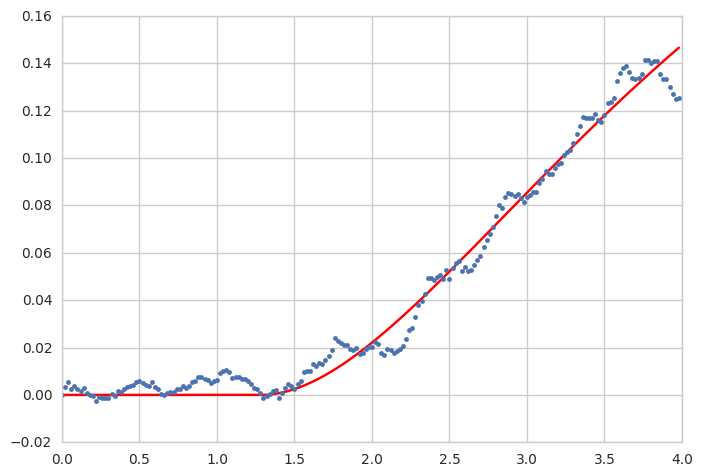

('K1 =', 0.20699299344516139, '+/-', 13.266507028677077)
('k2 =', 0.24749739631360576, '+/-', 13.266216409262281)
('tau_1 =', 0.15356087535352939, '+/-', 13.266507028677077)
('tau_2 =', 0.18290240520945056, '+/-', 13.266216409262281)
('theta =', 0.18405056626058494, '+/-', 13.266216409262281)
muscle
b3_l


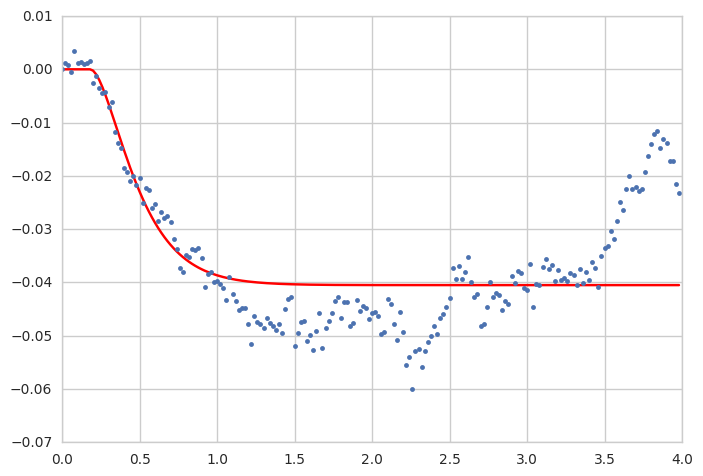

('K1 =', 0.20733706997390061, '+/-', 0.028246262654991694)
('k2 =', 0.13349710977371745, '+/-', 0.044308457664574676)
('tau_1 =', 2.0848786474807661, '+/-', 0.028246262654991694)
('tau_2 =', 0.46066405442491348, '+/-', 0.044308457664574676)
('theta =', 0.14657323286773641, '+/-', 0.044308457664574676)
muscle
i1_l


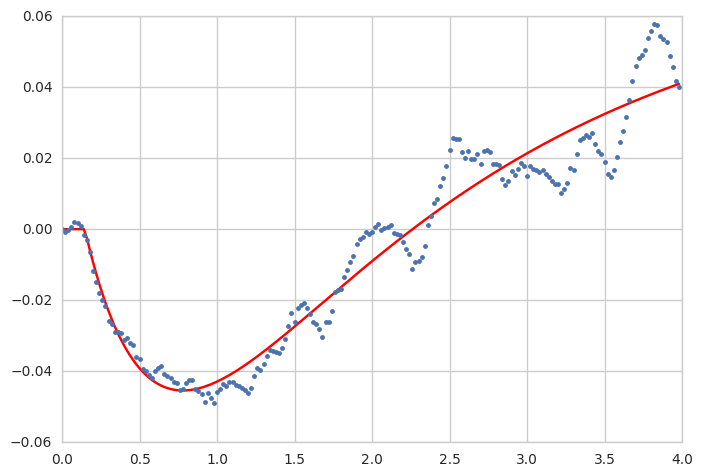

('K1 =', 1.0548426404183842, '+/-', 30.833516746962385)
('k2 =', 0.94047651604609661, '+/-', 30.834790665767354)
('tau_1 =', 0.45500592059405792, '+/-', 30.833516746962385)
('tau_2 =', 0.40585590424329288, '+/-', 30.834790665767354)
('theta =', 0.62051026935376441, '+/-', 30.834790665767354)
muscle
i2_l


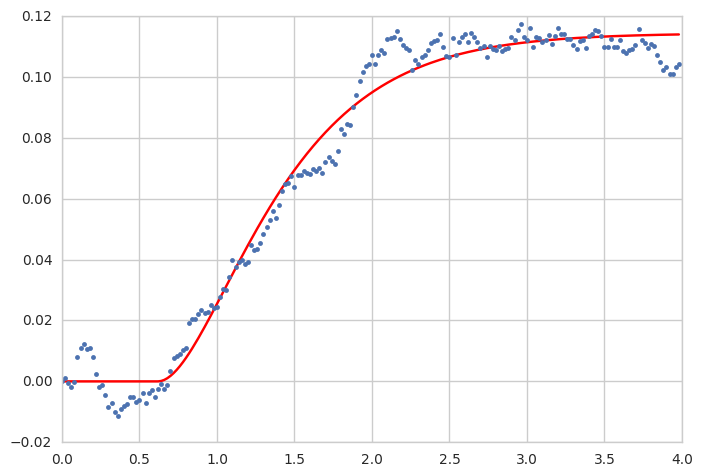

('K1 =', 0.18037505454351904, '+/-', 0.86226945018789336)
('k2 =', 0.047159907515296619, '+/-', 0.084371949948283967)
('tau_1 =', 11.876753078545137, '+/-', 0.86226945018789336)
('tau_2 =', 1.0681103500693461, '+/-', 0.084371949948283967)
('theta =', 0.079995687562055398, '+/-', 0.084371949948283967)
muscle
iii1_l


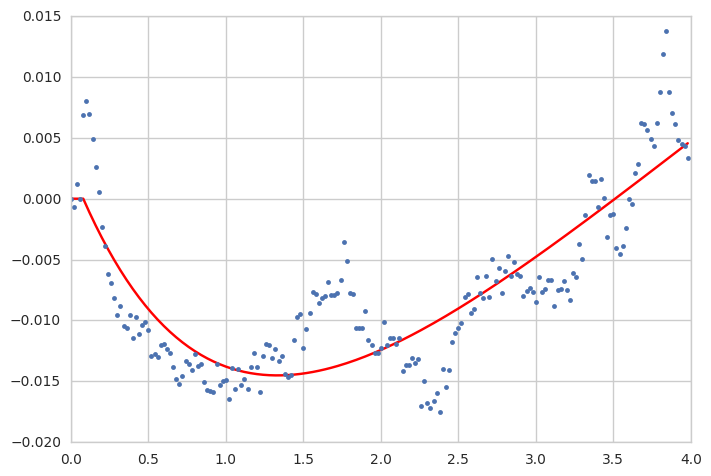

('K1 =', 11.873494770025964, '+/-', 43808.563289467027)
('k2 =', 4.655783214515151, '+/-', 91540.265114555397)
('tau_1 =', 206.46041932562673, '+/-', 43808.563289467027)
('tau_2 =', 80.959235793418117, '+/-', 91540.265114555397)
('theta =', -6.8846691831863431, '+/-', 91540.265114555397)
muscle
iii3_l


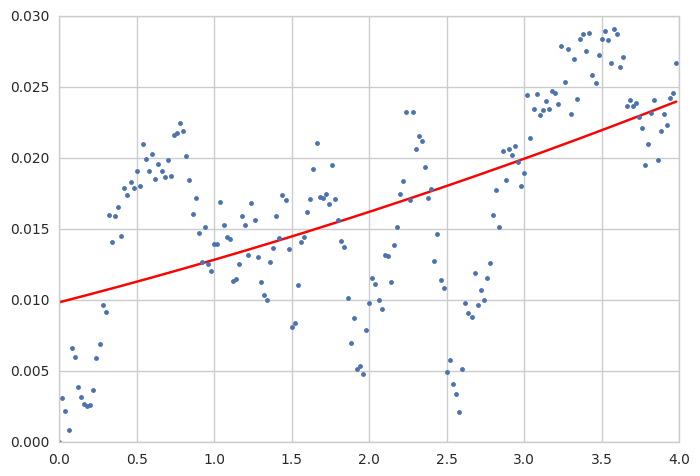

('K1 =', 346.97770912364507, '+/-', 131799.91490367145)
('k2 =', 0.041207605927154001, '+/-', 0.0016368669317905077)
('tau_1 =', 24945.163624512912, '+/-', 131799.91490367145)
('tau_2 =', 0.25092256400737711, '+/-', 0.0016368669317905077)
('theta =', 0.13361579705248219, '+/-', 0.0016368669317905077)
muscle
hg1_l


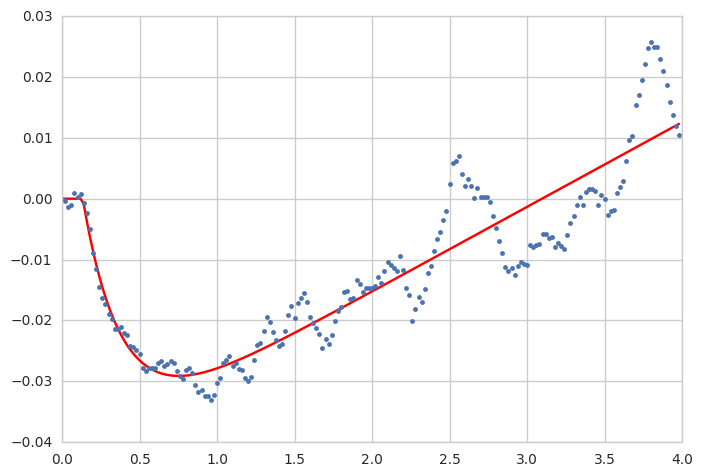

('K1 =', 0.10190282221649004, '+/-', 0.038669435632758146)
('k2 =', 0.0028061233592841994, '+/-', 0.037480476570247633)
('tau_1 =', 3.0616001739156227, '+/-', 0.038669435632758146)
('tau_2 =', 0.091037479843108268, '+/-', 0.037480476570247633)
('theta =', 0.32898487719649883, '+/-', 0.037480476570247633)
muscle
hg2_l


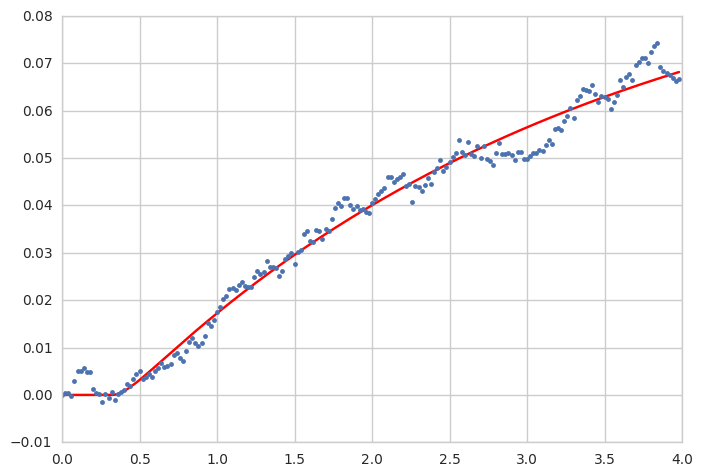

('K1 =', -0.0097250322093509201, '+/-', 0.0014795937342701876)
('k2 =', -0.02686205522945348, '+/-', 0.001635220511803897)
('tau_1 =', 0.17479648529468012, '+/-', 0.0014795937342701876)
('tau_2 =', 2.7370796136895024, '+/-', 0.001635220511803897)
('theta =', -0.020391980991672928, '+/-', 0.001635220511803897)
muscle
hg3_l


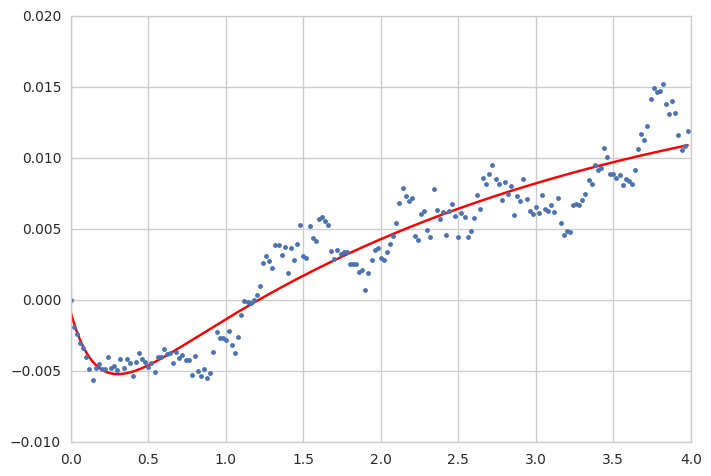

('K1 =', 1.7104782470949176, '+/-', 21969.225219655189)
('k2 =', 1.7209442206513861, '+/-', 21969.357586705886)
('tau_1 =', 2.427606767359106, '+/-', 21969.225219655189)
('tau_2 =', 2.3552345139647826, '+/-', 21969.357586705886)
('theta =', -0.1177855406112268, '+/-', 21969.357586705886)
muscle
hg4_l


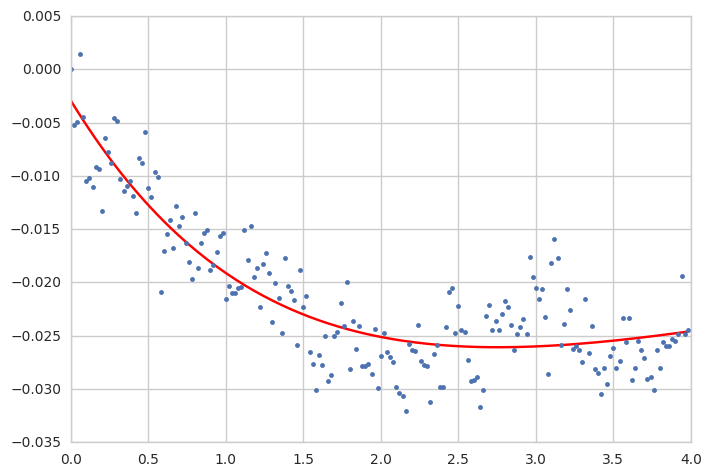

('K1 =', 6.0890986702888803, '+/-', 13262.985616401085)
('k2 =', 6.1205800464136857, '+/-', 13262.984835667243)
('tau_1 =', 0.28387533466262088, '+/-', 13262.985616401085)
('tau_2 =', 0.28916168925675756, '+/-', 13262.984835667243)
('theta =', 0.29335953744462961, '+/-', 13262.984835667243)
muscle
b1_r


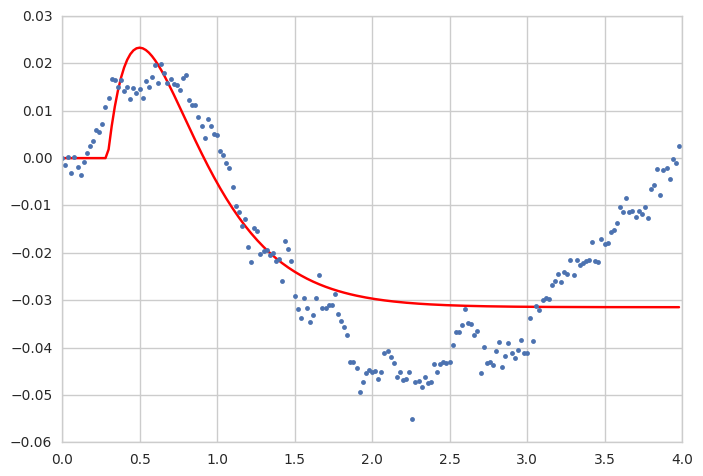

('K1 =', 65.178505212803003, '+/-', 30033.072959606656)
('k2 =', 32.880975422577414, '+/-', 37671.5557839299)
('tau_1 =', 35.507900355837471, '+/-', 30033.072959606656)
('tau_2 =', 17.443802348646198, '+/-', 37671.5557839299)
('theta =', 0.8867129689782004, '+/-', 37671.5557839299)
muscle
b2_r


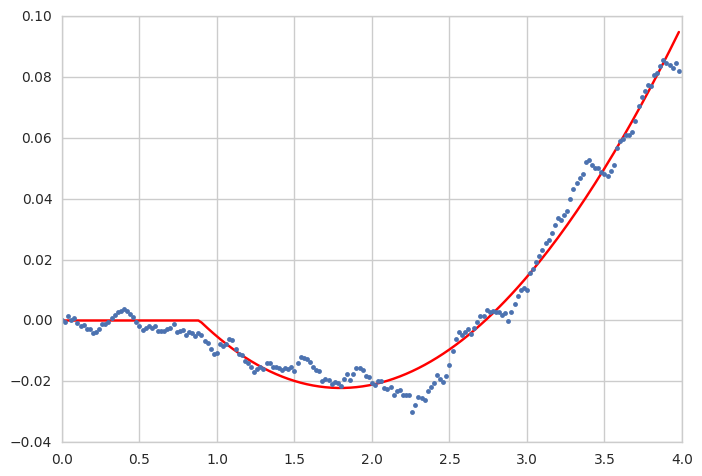

('K1 =', 16.745524491119074, '+/-', 37425.550675138926)
('k2 =', 16.78669712109939, '+/-', 37425.550918657966)
('tau_1 =', 0.21563179360056309, '+/-', 37425.550675138926)
('tau_2 =', 0.21690047910943525, '+/-', 37425.550918657966)
('theta =', 0.44827635912314351, '+/-', 37425.550918657966)
muscle
b3_r


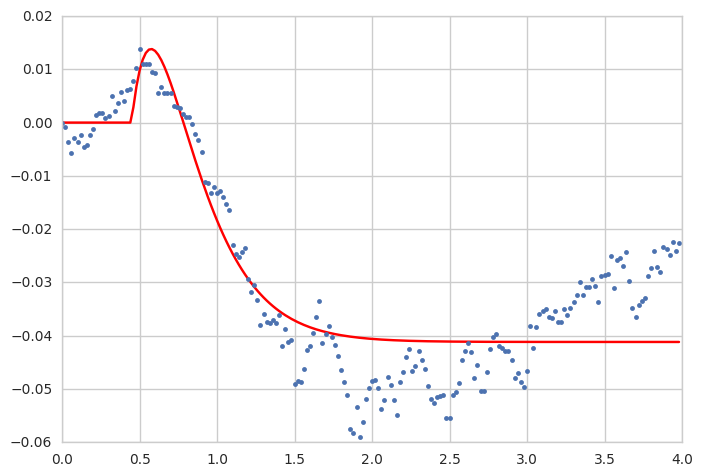

('K1 =', 0.68099057845688438, '+/-', 31.061280888180992)
('k2 =', 0.55197053557965092, '+/-', 31.106350835502148)
('tau_1 =', 1.4790532905944229, '+/-', 31.061280888180992)
('tau_2 =', 1.1989986520976863, '+/-', 31.106350835502148)
('theta =', 0.44529096762588349, '+/-', 31.106350835502148)
muscle
i1_r


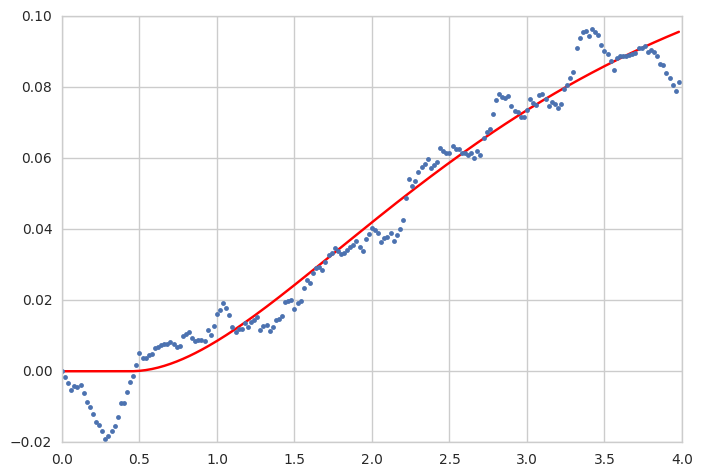

('K1 =', 0.19689216162139045, '+/-', 40411.331701213116)
('k2 =', -0.03715719970643485, '+/-', 40411.332373601748)
('tau_1 =', 0.71114216134075114, '+/-', 40411.331701213116)
('tau_2 =', 0.71114206438530525, '+/-', 40411.332373601748)
('theta =', 0.6779690688434733, '+/-', 40411.332373601748)
muscle
i2_r


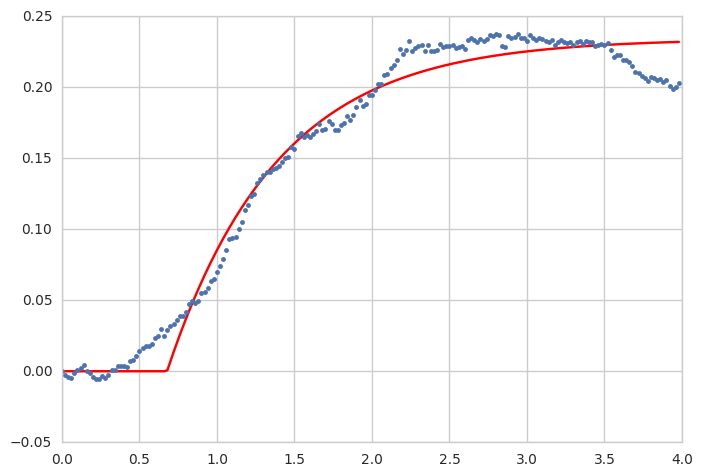

('K1 =', 0.36886385121657717, '+/-', 35.891534405300909)
('k2 =', 0.40345362905868293, '+/-', 35.890956598438763)
('tau_1 =', 0.45938258584164704, '+/-', 35.891534405300909)
('tau_2 =', 0.50214976983336823, '+/-', 35.890956598438763)
('theta =', 0.0060346391506268396, '+/-', 35.890956598438763)
muscle
iii1_r


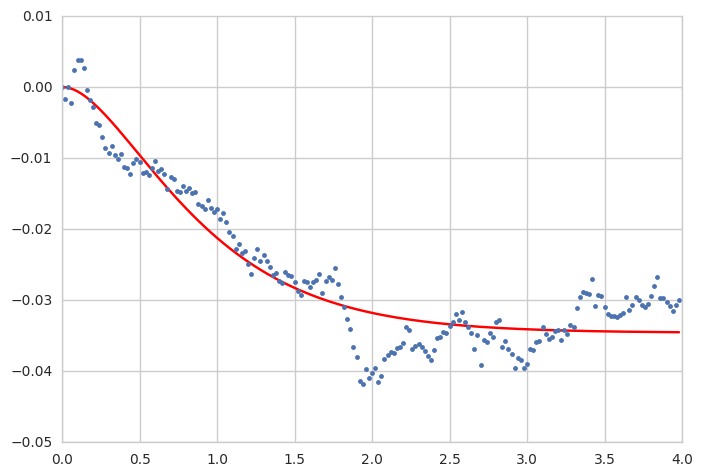

('K1 =', 2.3443922191614535, '+/-', 5573.824549964681)
('k2 =', 2.3700829012599733, '+/-', 5573.8243547883476)
('tau_1 =', 0.1814356945734189, '+/-', 5573.824549964681)
('tau_2 =', 0.18525661230029339, '+/-', 5573.8243547883476)
('theta =', 0.034827197977214848, '+/-', 5573.8243547883476)
muscle
iii3_r


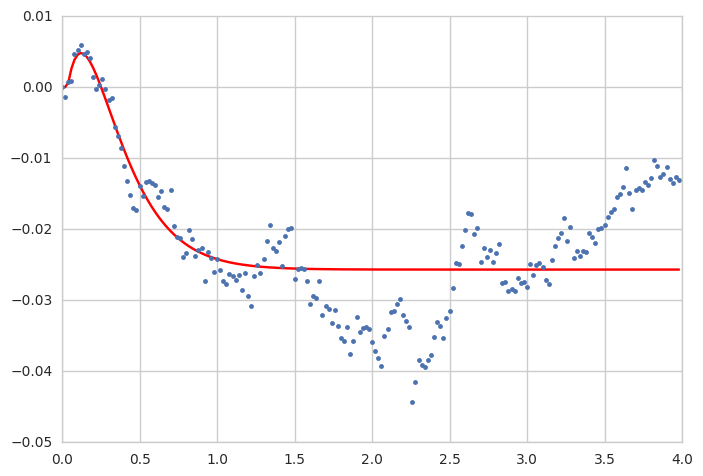

('K1 =', 2.1716353410651537, '+/-', 10767.028767269339)
('k2 =', 2.1020414390740387, '+/-', 10767.334188123394)
('tau_1 =', 2.7486086822885558, '+/-', 10767.028767269339)
('tau_2 =', 2.6097186000245522, '+/-', 10767.334188123394)
('theta =', -0.51592731249436252, '+/-', 10767.334188123394)
muscle
hg1_r


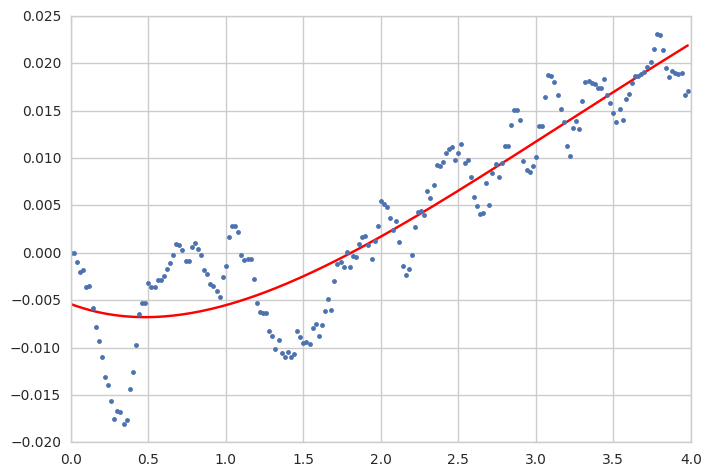

('K1 =', 0.20996824899062419, '+/-', 0.51491562088567056)
('k2 =', 0.094493798894727074, '+/-', 0.51920562642612944)
('tau_1 =', 1.1313105106999206, '+/-', 0.51491562088567056)
('tau_2 =', 0.71460058401027948, '+/-', 0.51920562642612944)
('theta =', 0.34000000439269268, '+/-', 0.51920562642612944)
muscle
hg2_r


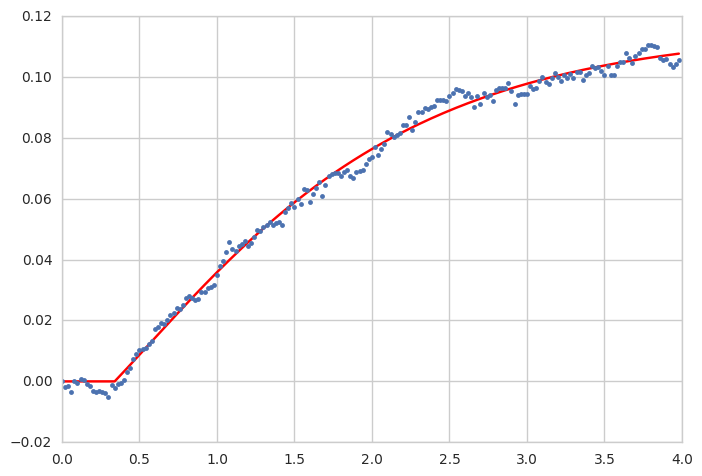

('K1 =', 429.79586206997175, '+/-', 27077.955450640296)
('k2 =', 132.23157595298764, '+/-', 28245.606687169839)
('tau_1 =', 489.96144319943818, '+/-', 27077.955450640296)
('tau_2 =', 149.91748233685175, '+/-', 28245.606687169839)
('theta =', -0.14640037328209327, '+/-', 28245.606687169839)
muscle
hg3_r


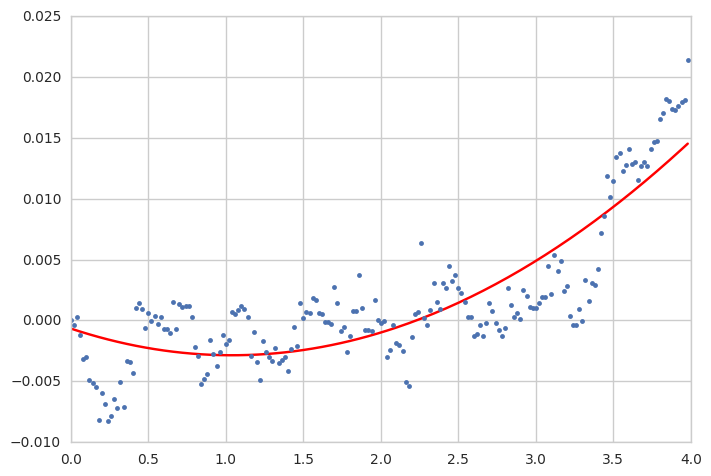

('K1 =', 0.53679364297731091, '+/-', 1040.9506535908224)
('k2 =', 0.54155587818600803, '+/-', 1040.9504898764985)
('tau_1 =', 0.19316793960515222, '+/-', 1040.9506535908224)
('tau_2 =', 0.19949616313701099, '+/-', 1040.9504898764985)
('theta =', 0.17409596298419341, '+/-', 1040.9504898764985)
muscle
hg4_r


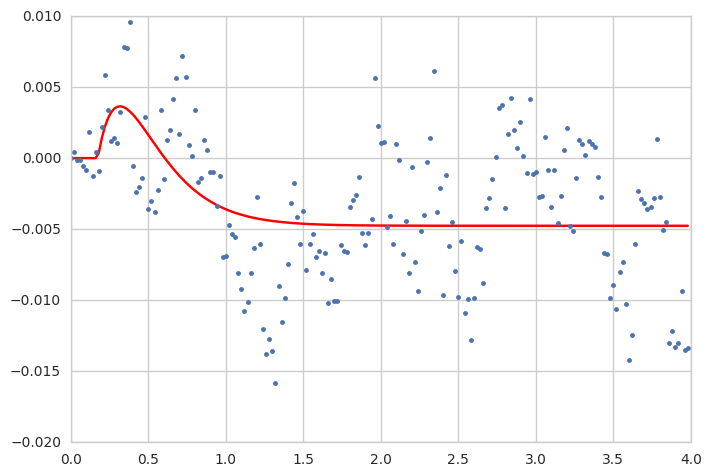

In [164]:
#stimulus_df = pd.DataFrame({'K1':0,'K2': 0, 'tau1': 0, 'tau2': 0},
#                  index=[0])
stimulus_df_pu = pd.DataFrame()
stimulus = pitch_up_df

for muscle in muscle_list: 
        
        times = np.arange(350)*0.02
        colors = times[150:350]
        x1 = times[150:350]
        x=x1-x1[0]
        muscle_choice = stimulus[muscle]
        y = muscle_choice[150:350]-muscle_choice[150]   #from 150
        
        popt, pcov = curve_fit(exponential_f, x, y, p0=np.asarray([0.1,0.1,0.25,0.9, 0.1]), maxfev=2000000)
        
        df =pd.DataFrame({'K1': popt[0],'K2': popt[1], 'tau1': popt[2], 'tau2': popt[3], 'theta': popt[4]},
                  index=[muscle])
        stimulus_df_pu = stimulus_df_pu.append(df)
        
        print("K1 =", popt[0], "+/-", pcov[0,0]**0.5)
        print("k2 =", popt[1], "+/-", pcov[1,1]**0.5)
        print("tau_1 =", popt[2], "+/-", pcov[0,0]**0.5)
        print("tau_2 =", popt[3], "+/-", pcov[1,1]**0.5)
        print("theta =", popt[4], "+/-", pcov[1,1]**0.5)
        print('muscle')
        print(muscle)

        df =pd.DataFrame({'K1': popt[0],'K2': popt[1], 'tau1': popt[2], 'tau2': popt[3], 'theta': popt[4]},
                  index=[muscle])
        #df =pd.DataFrame
    
        df_1.append(df)
        
        #plt.errorbar(x, y, yerr=e, fmt="none")
        #xfine = np.linspace(0.01, 10., 100)  # define values to plot the function for
        plt.plot(x, exponential_f(x, popt[0], popt[1], popt[2], popt[3], popt[4]), 'r-')
        plt.plot(x, y, '.')
        plt.xlim(0, 4.0)
        plt.show()
        
stimulus_df_pu.to_csv('pitch_up_constants_theta.csv') 

In [ ]:
stimulus_df_pu

('K1 =', 5.0608094118590046, '+/-', nan)
('k2 =', 5.0026437287793684, '+/-', nan)
('tau_1 =', 2.2990885704167301, '+/-', nan)
('tau_2 =', 2.2374962737040738, '+/-', nan)
('theta =', 0.05802647022633909, '+/-', nan)
muscle
b1_l


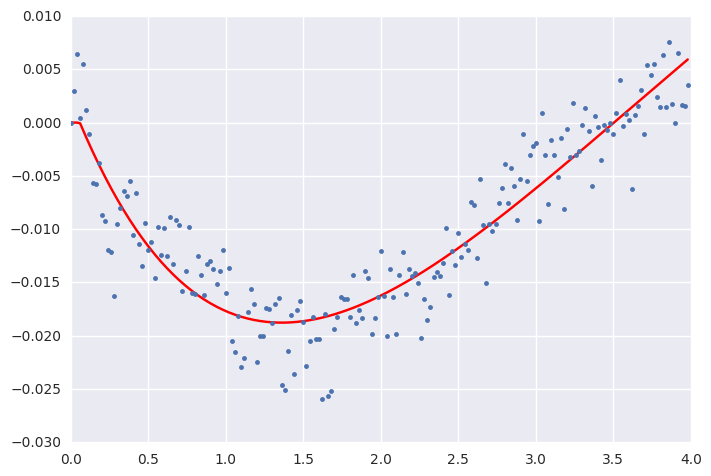

('K1 =', 12.003161322475405, '+/-', 25097.534955107796)
('k2 =', 4.8178697954125855, '+/-', 48475.535393801991)
('tau_1 =', 220.7775556076954, '+/-', 25097.534955107796)
('tau_2 =', 88.618179117982478, '+/-', 48475.535393801991)
('theta =', -5.75522923156087, '+/-', 48475.535393801991)
muscle
b2_l


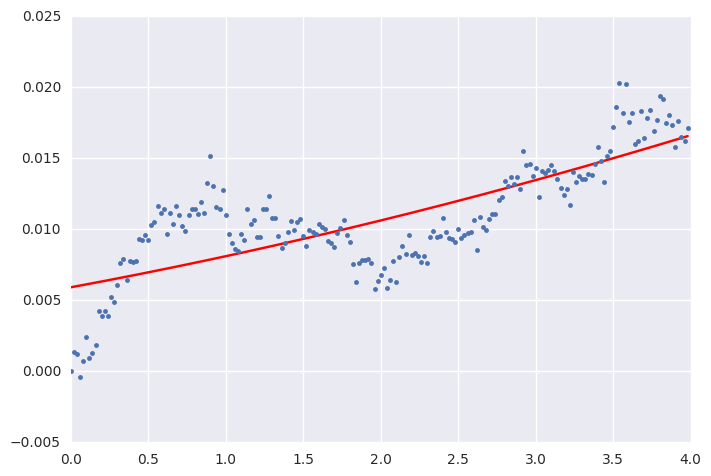

('K1 =', 1.101267153150076, '+/-', 7780.9928840081229)
('k2 =', 1.06242757322552, '+/-', 7781.8497741880346)
('tau_1 =', 3.301886369016771, '+/-', 7780.9928840081229)
('tau_2 =', 3.0740062232096381, '+/-', 7781.8497741880346)
('theta =', 0.62706364217592248, '+/-', 7781.8497741880346)
muscle
b3_l


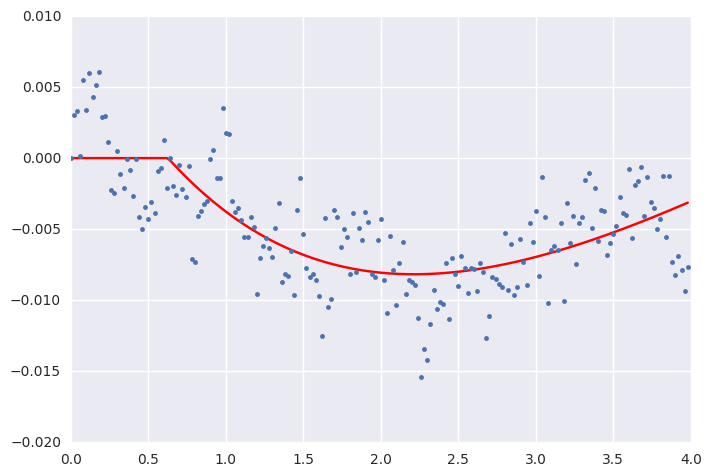

('K1 =', 0.009554577141000227, '+/-', 14323.494612439485)
('k2 =', 0.05219086656491724, '+/-', 14323.494476729154)
('tau_1 =', 0.14616287968480055, '+/-', 14323.494612439485)
('tau_2 =', 0.14625117151301317, '+/-', 14323.494476729154)
('theta =', 0.15747099434683129, '+/-', 14323.494476729154)
muscle
i1_l


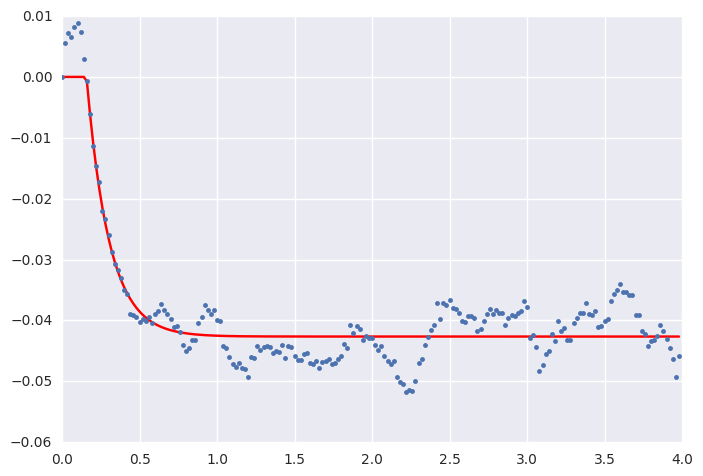

('K1 =', 0.20778115686450563, '+/-', 1.8122955981157614)
('k2 =', 0.10580903128422647, '+/-', 2.5068094681461024)
('tau_1 =', 4.6557347156246669, '+/-', 1.8122955981157614)
('tau_2 =', 1.8047082009809408, '+/-', 2.5068094681461024)
('theta =', 0.21999994747544305, '+/-', 2.5068094681461024)
muscle
i2_l


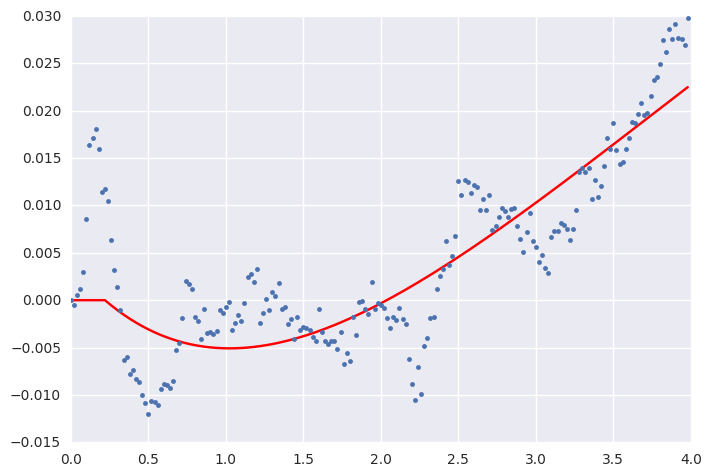

('K1 =', 0.087750894909526728, '+/-', nan)
('k2 =', 0.10296695294502727, '+/-', nan)
('tau_1 =', 0.61494721724442691, '+/-', nan)
('tau_2 =', 0.61497357285922261, '+/-', nan)
('theta =', 0.82748895884081086, '+/-', nan)
muscle
iii1_l


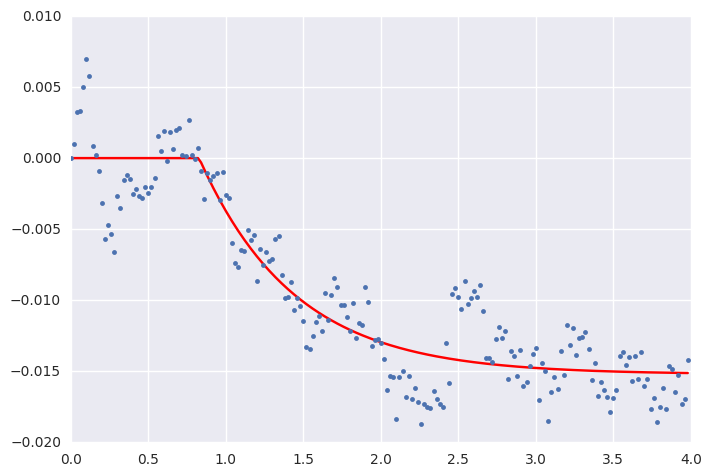

('K1 =', 0.16367195352615585, '+/-', 0.08329670516340032)
('k2 =', 0.16755780894924319, '+/-', 0.082432995492622077)
('tau_1 =', 0.33464775233372596, '+/-', 0.08329670516340032)
('tau_2 =', 0.70958200743231237, '+/-', 0.082432995492622077)
('theta =', 0.10702339169048665, '+/-', 0.082432995492622077)
muscle
iii3_l


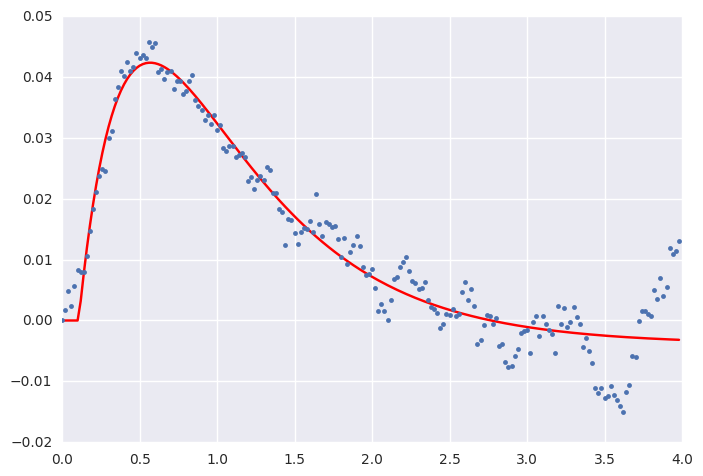

('K1 =', 0.014170309663167046, '+/-', 0.098454489182349406)
('k2 =', 0.045350151366201644, '+/-', 0.0019714628691535289)
('tau_1 =', 12.288919431304004, '+/-', 0.098454489182349406)
('tau_2 =', 0.22440605273268088, '+/-', 0.0019714628691535289)
('theta =', 0.12000002121569481, '+/-', 0.0019714628691535289)
muscle
hg1_l


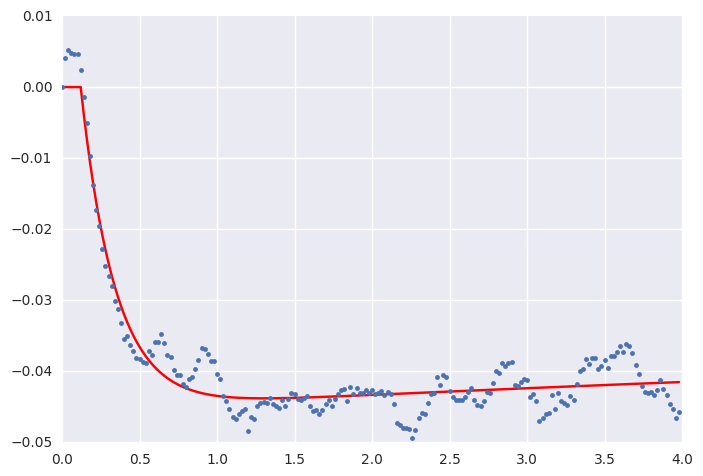

('K1 =', 1.0314233798357644, '+/-', 14364.648244820713)
('k2 =', 1.0232775415841997, '+/-', 14364.646540357346)
('tau_1 =', 0.65111925772921742, '+/-', 14364.648244820713)
('tau_2 =', 0.65948742185592979, '+/-', 14364.646540357346)
('theta =', 0.44228521804658555, '+/-', 14364.646540357346)
muscle
hg2_l


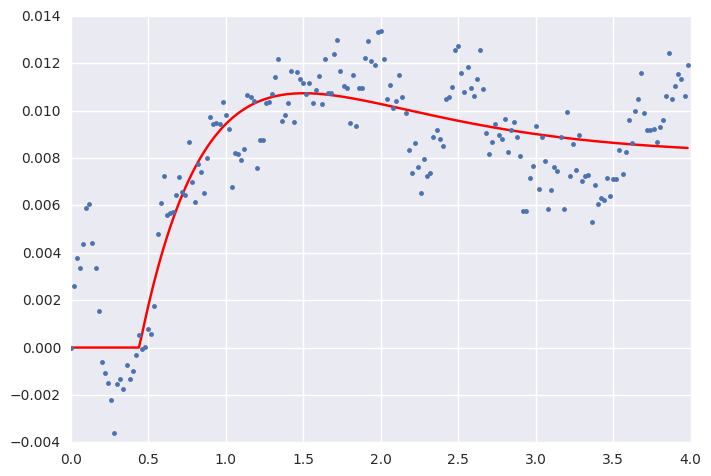

('K1 =', 0.016375308207136618, '+/-', 0.060944473130900068)
('k2 =', 0.0034668160253337253, '+/-', 0.00033675788903809962)
('tau_1 =', 19.322196459348621, '+/-', 0.060944473130900068)
('tau_2 =', 0.043733572438632233, '+/-', 0.00033675788903809962)
('theta =', 0.0074478099576223023, '+/-', 0.00033675788903809962)
muscle
hg3_l


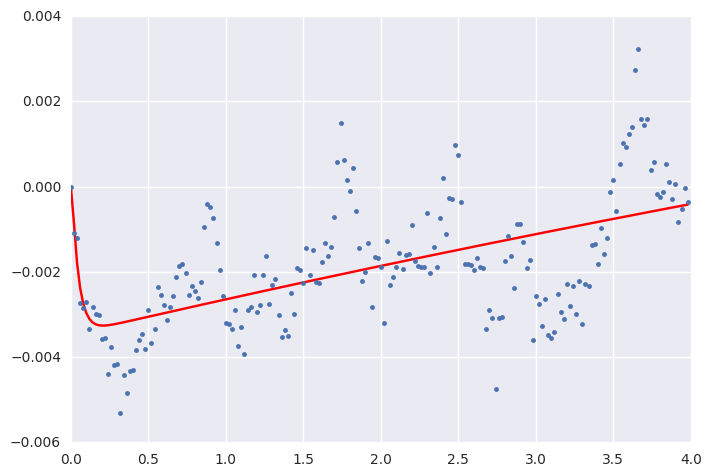

('K1 =', 20.101384417090703, '+/-', 64551.451253743973)
('k2 =', 0.16733499620293329, '+/-', 7.9010012033485024)
('tau_1 =', 901.00634143257594, '+/-', 64551.451253743973)
('tau_2 =', 4.9711543282348796, '+/-', 7.9010012033485024)
('theta =', -0.10809633848599708, '+/-', 7.9010012033485024)
muscle
hg4_l


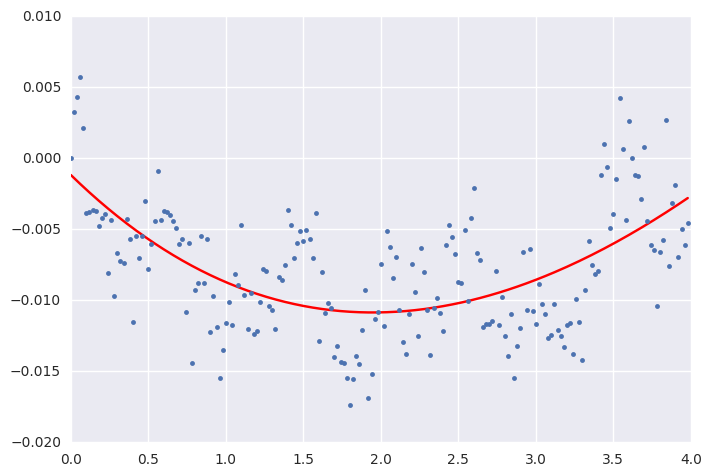

('K1 =', 8.8049608459942057, '+/-', nan)
('k2 =', 8.7913958957973062, '+/-', nan)
('tau_1 =', 1.2353388286765732, '+/-', nan)
('tau_2 =', 1.2172100554818592, '+/-', nan)
('theta =', 0.067107946527864434, '+/-', nan)
muscle
b1_r


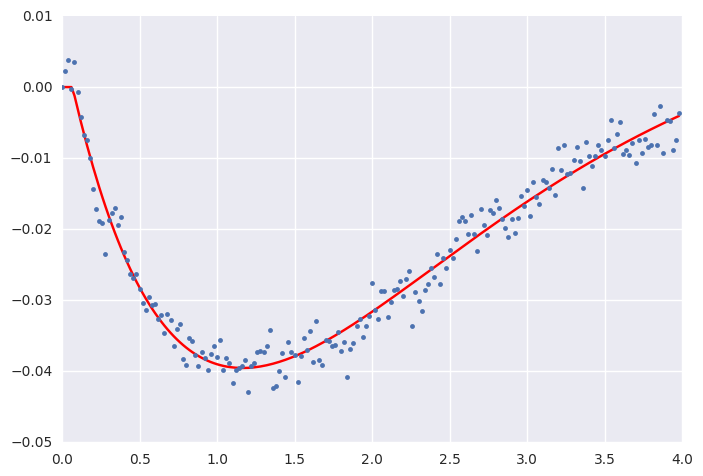

('K1 =', -1.8803521847224329, '+/-', nan)
('k2 =', -1.8854186142185134, '+/-', nan)
('tau_1 =', 0.37952979715978347, '+/-', nan)
('tau_2 =', 0.38301650289390127, '+/-', nan)
('theta =', 0.84722277042432248, '+/-', nan)
muscle
b2_r


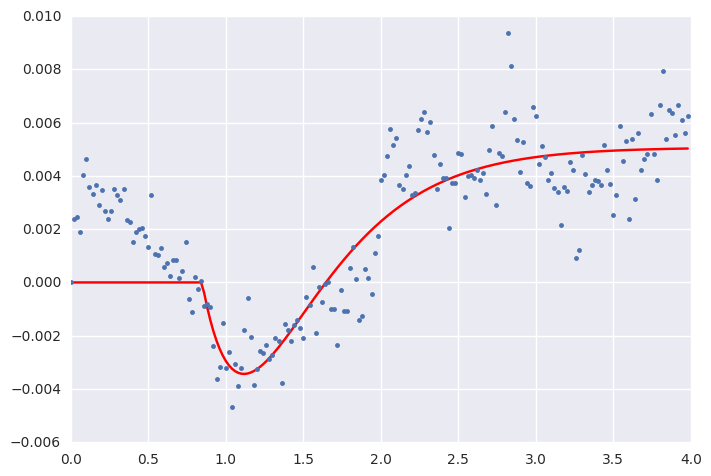

('K1 =', 5.4999826054365899, '+/-', 36239.553117026036)
('k2 =', 5.5176758970610402, '+/-', 36239.552691744146)
('tau_1 =', 0.45742876343428396, '+/-', 36239.553117026036)
('tau_2 =', 0.46123057484225771, '+/-', 36239.552691744146)
('theta =', 0.14038615779652908, '+/-', 36239.552691744146)
muscle
b3_r


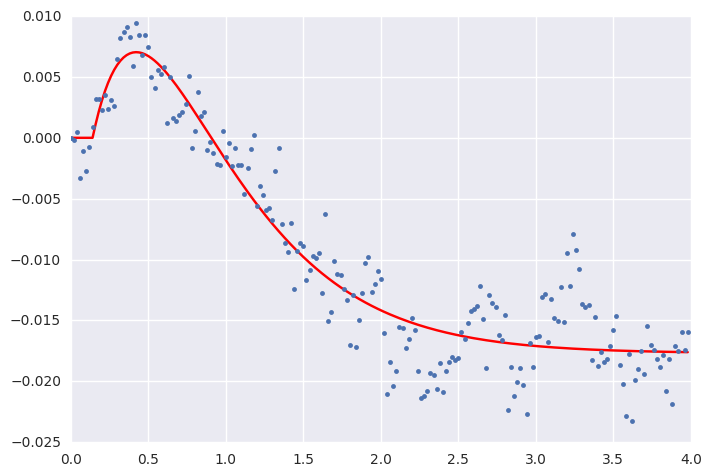

('K1 =', 0.09913859857997806, '+/-', 53.952710224229911)
('k2 =', 0.13945197222330355, '+/-', 53.949797969119182)
('tau_1 =', 0.79076835613255836, '+/-', 53.952710224229911)
('tau_2 =', 0.86943279913938731, '+/-', 53.949797969119182)
('theta =', 0.039999949476347073, '+/-', 53.949797969119182)
muscle
i1_r


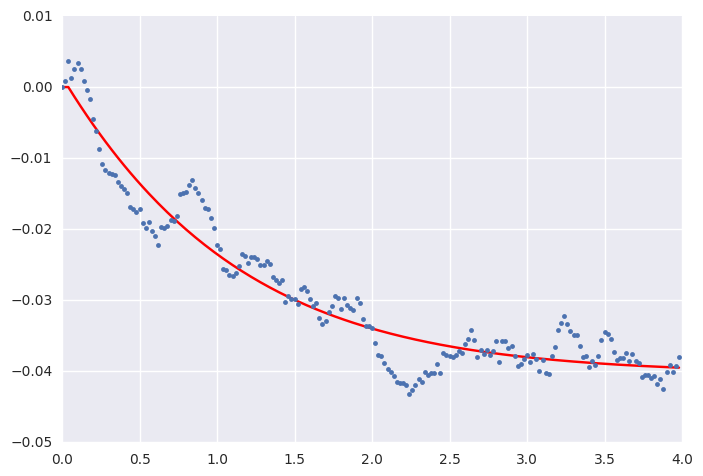

('K1 =', 7.0608729787500044, '+/-', nan)
('k2 =', 7.0896305862895037, '+/-', nan)
('tau_1 =', 0.67124886835944353, '+/-', nan)
('tau_2 =', 0.67639233444239655, '+/-', nan)
('theta =', -0.23756047554279006, '+/-', nan)
muscle
i2_r


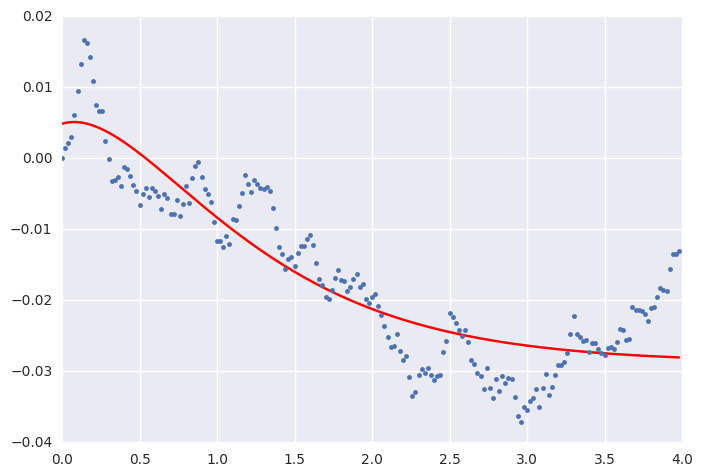

('K1 =', 2.7062344273088046, '+/-', nan)
('k2 =', 2.7023905771810193, '+/-', nan)
('tau_1 =', 0.33597194771351574, '+/-', nan)
('tau_2 =', 0.33814176129664508, '+/-', nan)
('theta =', 0.37851967881265053, '+/-', nan)
muscle
iii1_r


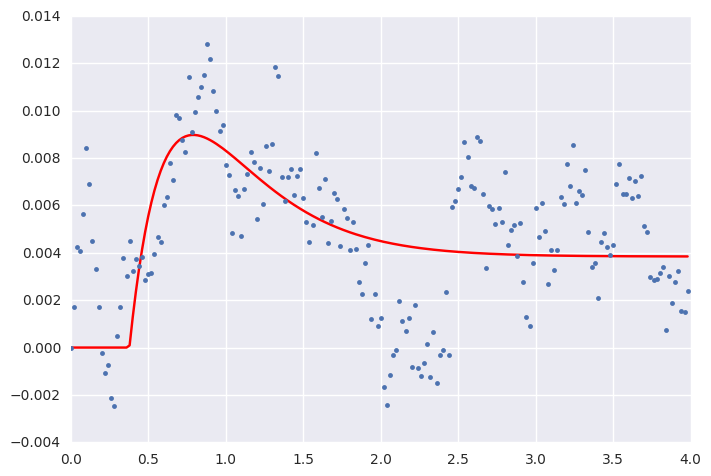

('K1 =', 0.65441708914348917, '+/-', 2358.6626414214243)
('k2 =', 0.63198044003061038, '+/-', 2358.6582911822188)
('tau_1 =', 0.9223701770726821, '+/-', 2358.6626414214243)
('tau_2 =', 0.94939782433534159, '+/-', 2358.6582911822188)
('theta =', -0.010124953397014363, '+/-', 2358.6582911822188)
muscle
iii3_r


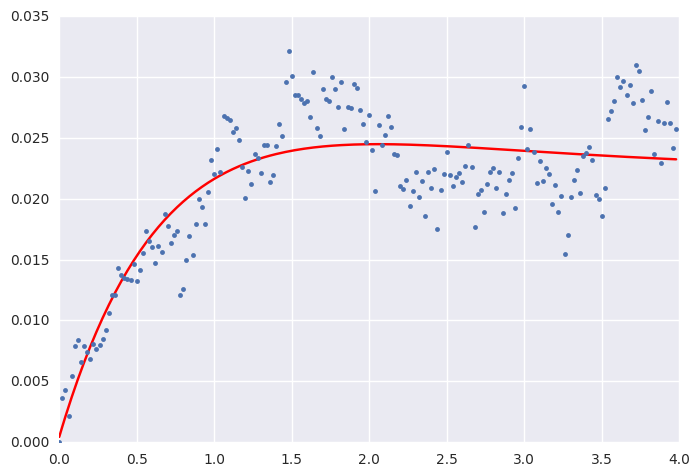

('K1 =', -0.041225171257644272, '+/-', 0.18648073507156751)
('k2 =', -0.013275375026319243, '+/-', 0.18688317522273321)
('tau_1 =', 0.58797894684188801, '+/-', 0.18648073507156751)
('tau_2 =', 0.37166561917973345, '+/-', 0.18688317522273321)
('theta =', 0.079999784190384574, '+/-', 0.18688317522273321)
muscle
hg1_r


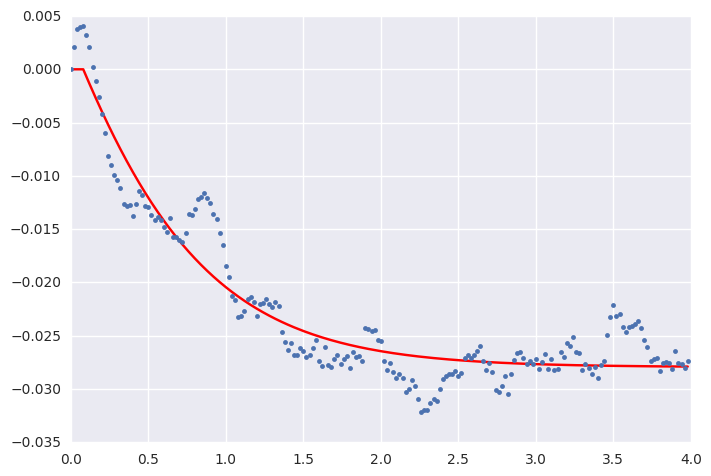

('K1 =', -1.8286807022516511, '+/-', 23216.946982004018)
('k2 =', -1.8331975332337178, '+/-', 23216.946810932321)
('tau_1 =', 0.089474130909624208, '+/-', 23216.946982004018)
('tau_2 =', 0.090507607060946196, '+/-', 23216.946810932321)
('theta =', 0.19317445675056855, '+/-', 23216.946810932321)
muscle
hg2_r


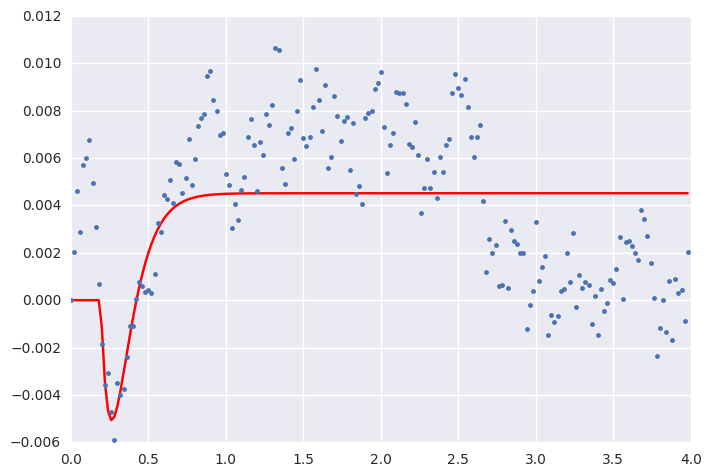

('K1 =', -3.6787968500798929, '+/-', 22930.191845420908)
('k2 =', -9.5095897273431298, '+/-', 10220.447347556383)
('tau_1 =', 107.8914877430464, '+/-', 22930.191845420908)
('tau_2 =', 287.20579388547486, '+/-', 10220.447347556383)
('theta =', -9.7800961034193445, '+/-', 10220.447347556383)
muscle
hg3_r


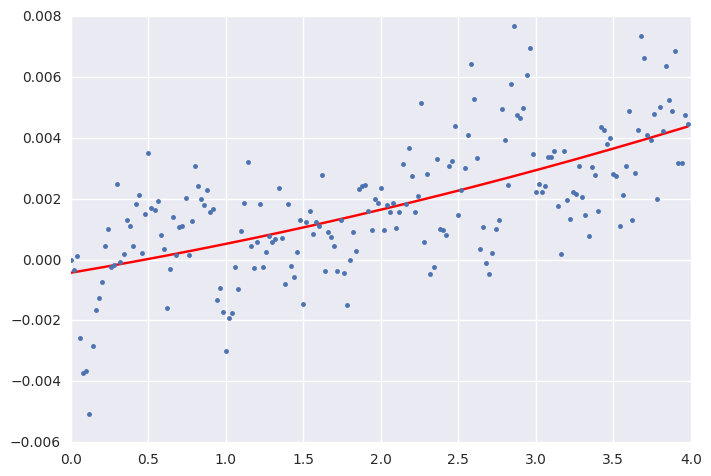

('K1 =', 0.10925109271479222, '+/-', 6.6367526948761375)
('k2 =', 0.12722895219616007, '+/-', 6.6366633452586594)
('tau_1 =', 0.19159781077002727, '+/-', 6.6367526948761375)
('tau_2 =', 0.22304776053967804, '+/-', 6.6366633452586594)
('theta =', 0.79731991543418534, '+/-', 6.6366633452586594)
muscle
hg4_r


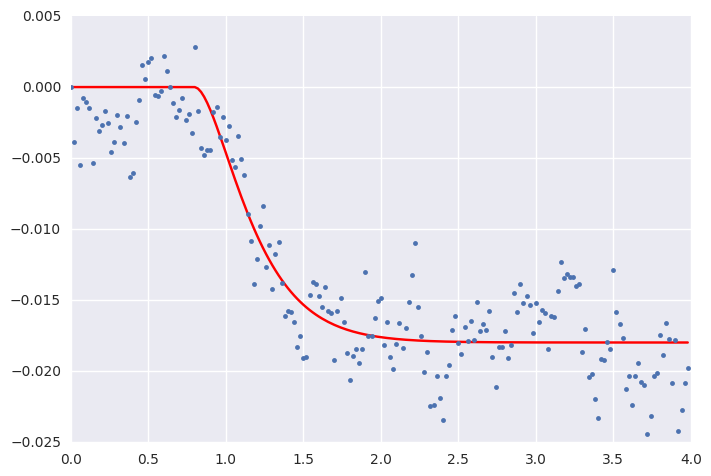

In [88]:
#stimulus_df = pd.DataFrame({'K1':0,'K2': 0, 'tau1': 0, 'tau2': 0},
#                  index=[0])
stimulus_df_pd = pd.DataFrame()
stimulus = pitch_down_df

for muscle in muscle_list: 
        
        times = np.arange(350)*0.02
        colors = times[150:350]
        x1 = times[150:350]
        x=x1-x1[0]
        muscle_choice = stimulus[muscle]
        y = muscle_choice[150:350]-muscle_choice[150]   #from 150
        
        popt, pcov = curve_fit(exponential_f, x, y, p0=np.asarray([0.1,0.1,0.25,0.9, 0.1]), maxfev=2000000)
        
        df =pd.DataFrame({'K1': popt[0],'K2': popt[1], 'tau1': popt[2], 'tau2': popt[3], 'theta': popt[4]},
                  index=[muscle])
        stimulus_df_pd = stimulus_df_pd.append(df)
        
        print("K1 =", popt[0], "+/-", pcov[0,0]**0.5)
        print("k2 =", popt[1], "+/-", pcov[1,1]**0.5)
        print("tau_1 =", popt[2], "+/-", pcov[0,0]**0.5)
        print("tau_2 =", popt[3], "+/-", pcov[1,1]**0.5)
        print("theta =", popt[4], "+/-", pcov[1,1]**0.5)
        print('muscle')
        print(muscle)

        df =pd.DataFrame({'K1': popt[0],'K2': popt[1], 'tau1': popt[2], 'tau2': popt[3], 'theta': popt[4]},
                  index=[muscle])
        #df =pd.DataFrame
    
        df_1.append(df)
        
        #plt.errorbar(x, y, yerr=e, fmt="none")
        #xfine = np.linspace(0.01, 10., 100)  # define values to plot the function for
        plt.plot(x, exponential_f(x, popt[0], popt[1], popt[2], popt[3], popt[4]), 'r-')
        plt.plot(x, y, '.')
        plt.xlim(0, 4.0)
        plt.show()
        
stimulus_df_pd.to_csv('pitch_down_constants_theta.csv') 

('K1 =', 64.605635746308081, '+/-', 7887.4599873190527)
('k2 =', 20.090999518091884, '+/-', 22425.599157371784)
('tau_1 =', 209.79992150522918, '+/-', 7887.4599873190527)
('tau_2 =', 63.280484551351591, '+/-', 22425.599157371784)
('theta =', -0.69713026273069978, '+/-', 22425.599157371784)
muscle
b1_l


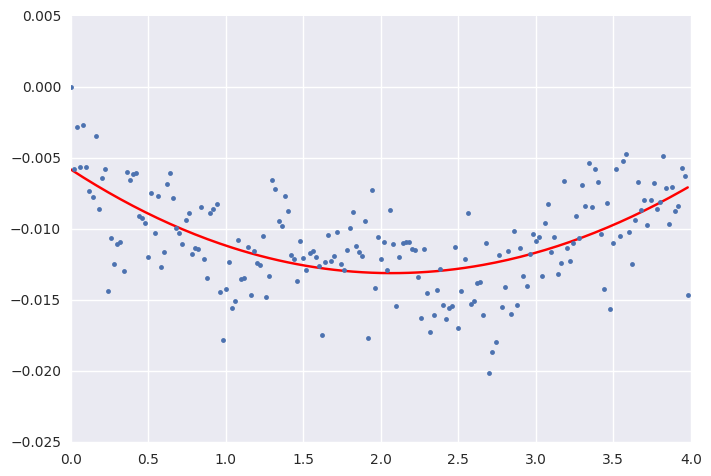

('K1 =', 2.4162167065312792, '+/-', 34699.889188910107)
('k2 =', 2.4168765740691507, '+/-', 34699.888697706599)
('tau_1 =', 0.4609030582625005, '+/-', 34699.889188910107)
('tau_2 =', 0.46413057989074147, '+/-', 34699.888697706599)
('theta =', 0.25243640336832951, '+/-', 34699.888697706599)
muscle
b2_l


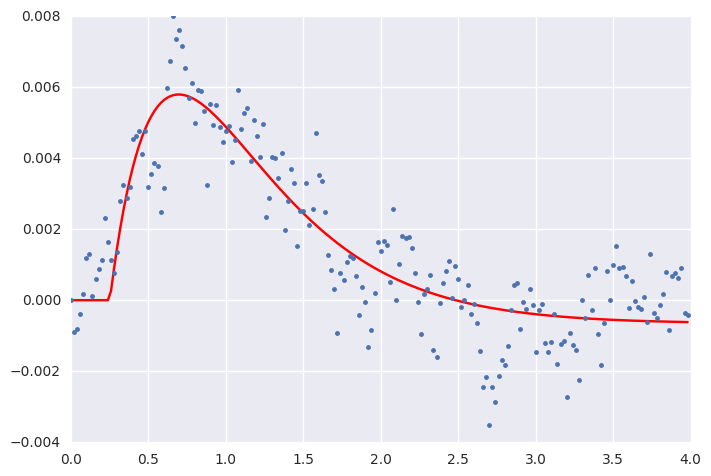

('K1 =', -0.018510850122272073, '+/-', 0.42593394115550759)
('k2 =', -0.035661717163283195, '+/-', 0.42569447857232617)
('tau_1 =', 0.34295338885025473, '+/-', 0.42593394115550759)
('tau_2 =', 0.47809044981308502, '+/-', 0.42569447857232617)
('theta =', 0.020015432403379545, '+/-', 0.42569447857232617)
muscle
b3_l


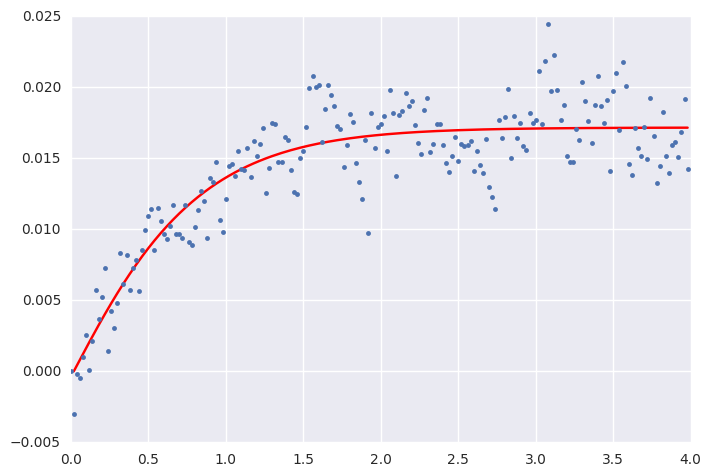

('K1 =', 0.084047611892719448, '+/-', 0.001706533345803489)
('k2 =', 0.01540245570247141, '+/-', 0.0017897226941660698)
('tau_1 =', 1.7255607592376814, '+/-', 0.001706533345803489)
('tau_2 =', 0.039914099838578639, '+/-', 0.0017897226941660698)
('theta =', 0.17265002779604377, '+/-', 0.0017897226941660698)
muscle
i1_l


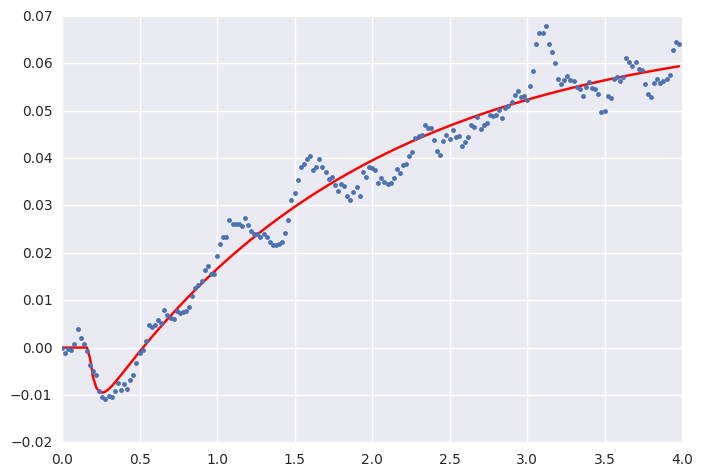

('K1 =', 0.097203743640838197, '+/-', 2152.9103827266395)
('k2 =', 0.0033108623633837861, '+/-', 2152.9101822846014)
('tau_1 =', 2.5908795690605424, '+/-', 2152.9103827266395)
('tau_2 =', 0.00045054849068734427, '+/-', 2152.9101822846014)
('theta =', 0.31979019540521436, '+/-', 2152.9101822846014)
muscle
i2_l


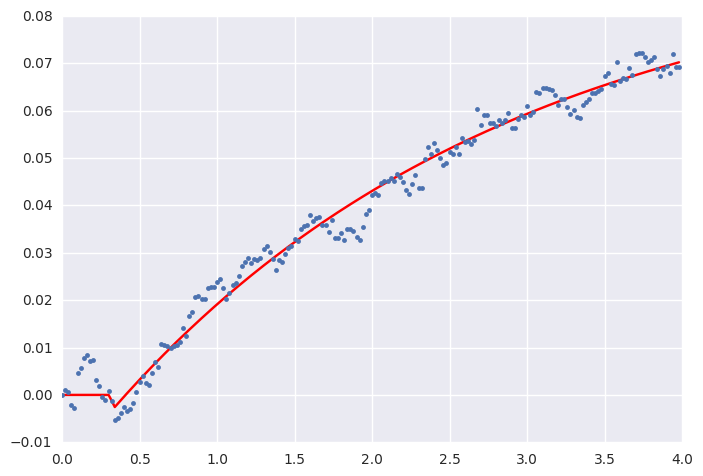

('K1 =', 319.1458420741842, '+/-', 26379.080388037695)
('k2 =', 97.114299533406665, '+/-', 24003.713470126731)
('tau_1 =', 526.13165699581612, '+/-', 26379.080388037695)
('tau_2 =', 158.7390378516663, '+/-', 24003.713470126731)
('theta =', -0.50293561625488026, '+/-', 24003.713470126731)
muscle
iii1_l


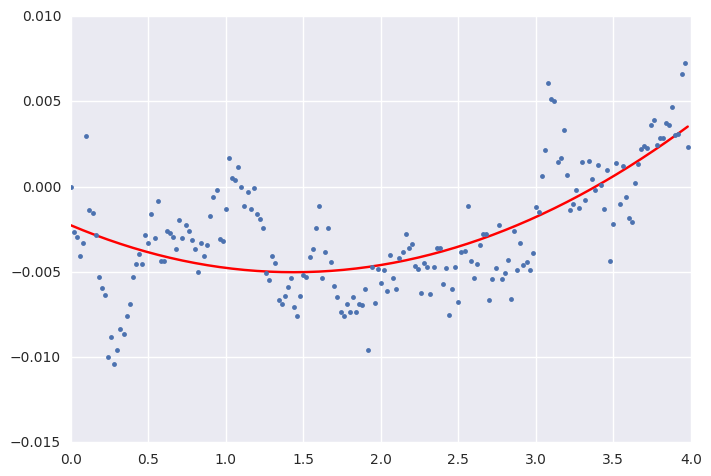

('K1 =', 0.31074349371682686, '+/-', 6.9691383143854857)
('k2 =', 0.37367503960502241, '+/-', 6.9670872105082218)
('tau_1 =', 0.60566908009337073, '+/-', 6.9691383143854857)
('tau_2 =', 0.72799749023525695, '+/-', 6.9670872105082218)
('theta =', 0.25275919571260935, '+/-', 6.9670872105082218)
muscle
iii3_l


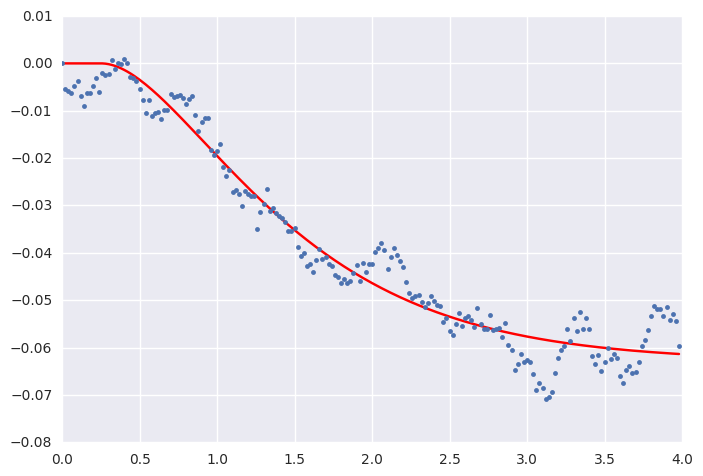

('K1 =', 0.032176156736074817, '+/-', 22.03438777364406)
('k2 =', 0.025759143890816433, '+/-', 21.70162119392165)
('tau_1 =', 0.82143984446475926, '+/-', 22.03438777364406)
('tau_2 =', 1.2325532097143819, '+/-', 21.70162119392165)
('theta =', 2.1279003392724403, '+/-', 21.70162119392165)
muscle
hg1_l


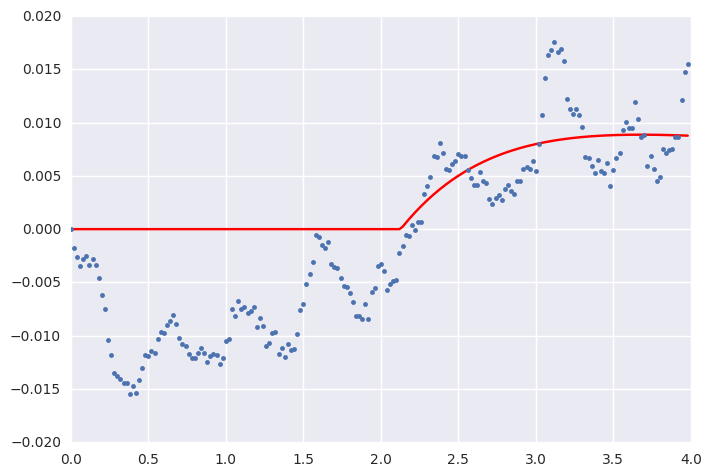

('K1 =', 0.022315116592765971, '+/-', 0.0016415871087801777)
('k2 =', 0.0060797543930929399, '+/-', 0.0016941759386553277)
('tau_1 =', 0.47439087655723383, '+/-', 0.0016415871087801777)
('tau_2 =', 0.024903656724112339, '+/-', 0.0016941759386553277)
('theta =', 0.1772597717805085, '+/-', 0.0016941759386553277)
muscle
hg2_l


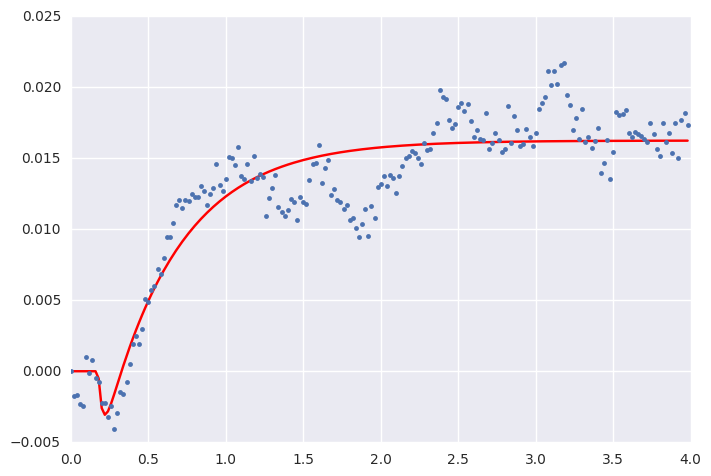

('K1 =', -0.0034448399725114788, '+/-', 0.00077006109749818568)
('k2 =', 4.7556054686869773, '+/-', 19290.331581469516)
('tau_1 =', 0.52641164970051568, '+/-', 0.00077006109749818568)
('tau_2 =', 12222.954031409439, '+/-', 19290.331581469516)
('theta =', 0.1349480338378376, '+/-', 19290.331581469516)
muscle
hg3_l


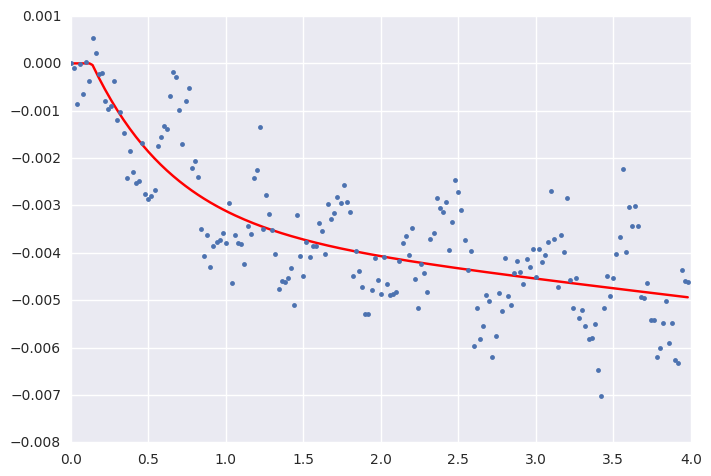

('K1 =', -0.0055218366564565103, '+/-', 7.1696509009872953)
('k2 =', 0.0066440316872633208, '+/-', 7.1696790858033461)
('tau_1 =', 0.0012122831346536459, '+/-', 7.1696509009872953)
('tau_2 =', 0.16154836238303114, '+/-', 7.1696790858033461)
('theta =', 0.019831869433818598, '+/-', 7.1696790858033461)
muscle
hg4_l


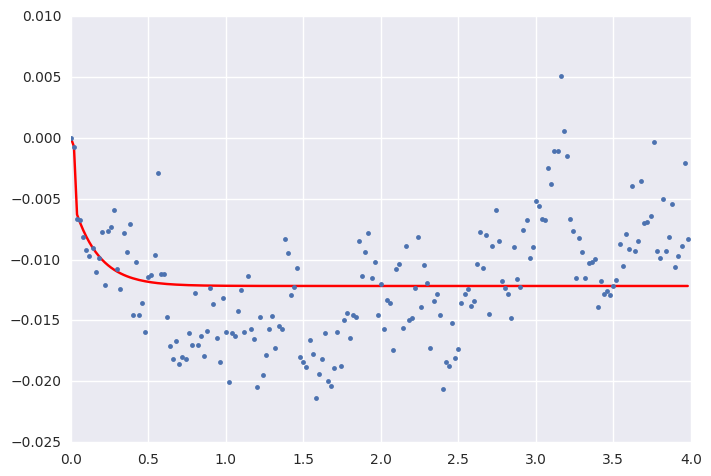

('K1 =', -0.045593928192611273, '+/-', 2297508.9371619741)
('k2 =', 0.0010447935355338931, '+/-', 16270646.681058951)
('tau_1 =', 0.12864290780214926, '+/-', 2297508.9371619741)
('tau_2 =', 2.1151104200129858, '+/-', 16270646.681058951)
('theta =', 3.9600000479215969, '+/-', 16270646.681058951)
muscle
b1_r


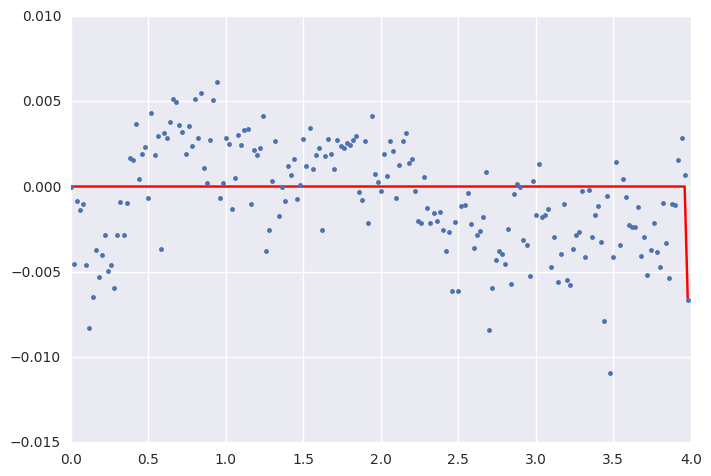

('K1 =', 0.01555680224028347, '+/-', 0.00061239720675505534)
('k2 =', 112.34282517729255, '+/-', 40361.862007997603)
('tau_1 =', 0.31923827778303293, '+/-', 0.00061239720675505534)
('tau_2 =', 35876.608776169865, '+/-', 40361.862007997603)
('theta =', 0.17874419135950026, '+/-', 40361.862007997603)
muscle
b2_r


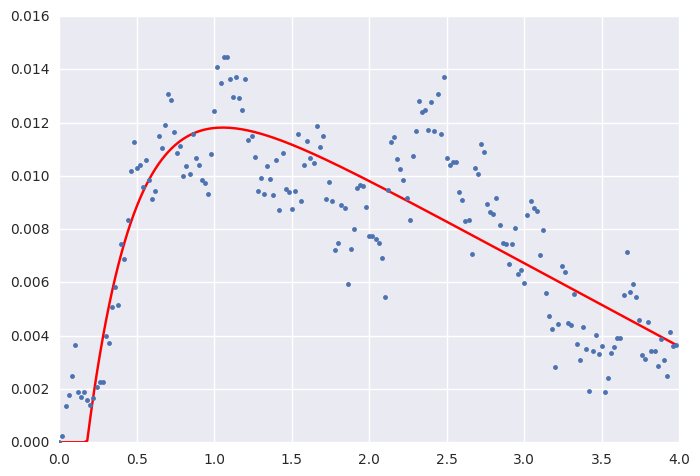

('K1 =', 0.35986143022757511, '+/-', 35.389397555096515)
('k2 =', 0.40346221368061658, '+/-', 35.384951662975595)
('tau_1 =', 0.96621303692153304, '+/-', 35.389397555096515)
('tau_2 =', 1.0831330253510949, '+/-', 35.384951662975595)
('theta =', -0.31554671292748682, '+/-', 35.384951662975595)
muscle
b3_r


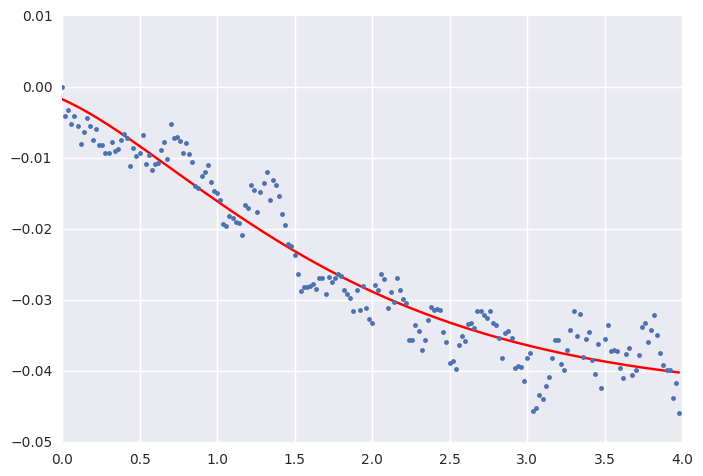

('K1 =', 0.10306938401259859, '+/-', 803.12286906364955)
('k2 =', 0.14712132515637566, '+/-', 803.12240413636152)
('tau_1 =', 0.43276152192257528, '+/-', 803.12286906364955)
('tau_2 =', 0.44669447798838507, '+/-', 803.12240413636152)
('theta =', 0.032706253745647458, '+/-', 803.12240413636152)
muscle
i1_r


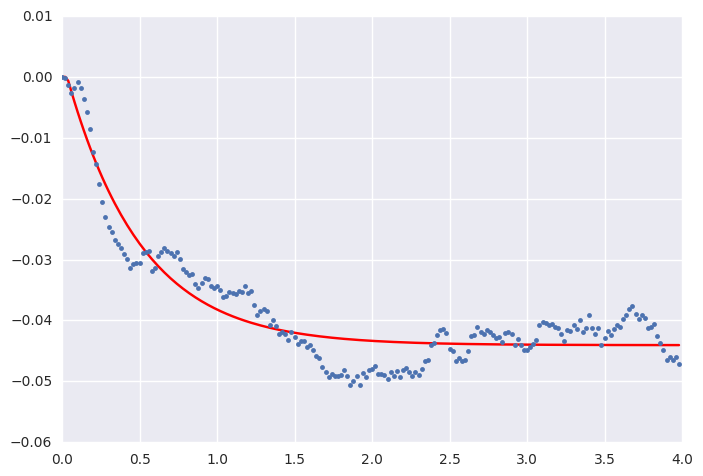

('K1 =', 0.0063702368920097287, '+/-', 1456.4182126719106)
('k2 =', 0.043375132762348161, '+/-', 1456.4182110447241)
('tau_1 =', 0.00084262624794185907, '+/-', 1456.4182126719106)
('tau_2 =', 0.57480008074448063, '+/-', 1456.4182110447241)
('theta =', 0.099655908462404574, '+/-', 1456.4182110447241)
muscle
i2_r


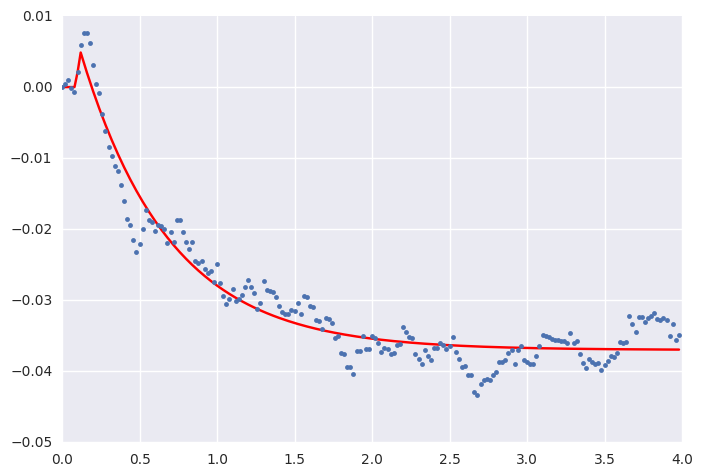

('K1 =', 261.79491003087531, '+/-', 19054.6506642473)
('k2 =', 79.92258707938548, '+/-', 21624.266795322357)
('tau_1 =', 474.20943350187895, '+/-', 19054.6506642473)
('tau_2 =', 143.4042774012041, '+/-', 21624.266795322357)
('theta =', -0.38069719937646684, '+/-', 21624.266795322357)
muscle
iii1_r


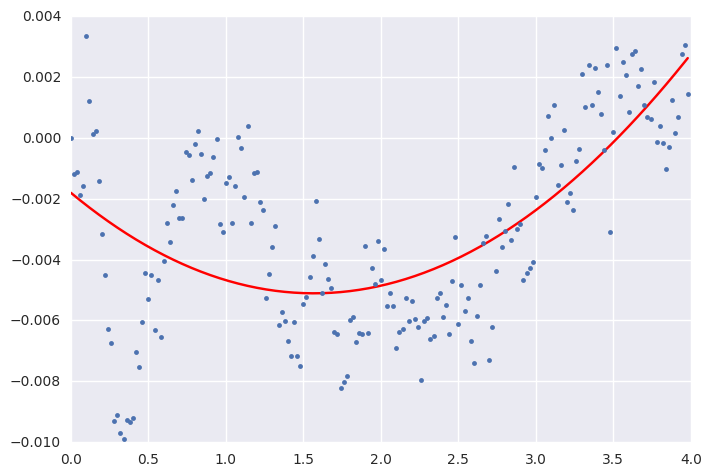

('K1 =', 55.982713593566963, '+/-', 30149.891767781166)
('k2 =', 185.71146664214149, '+/-', 18427.788351474137)
('tau_1 =', 121.49747706051174, '+/-', 30149.891767781166)
('tau_2 =', 409.68274406560062, '+/-', 18427.788351474137)
('theta =', -0.32471199193123279, '+/-', 18427.788351474137)
muscle
iii3_r


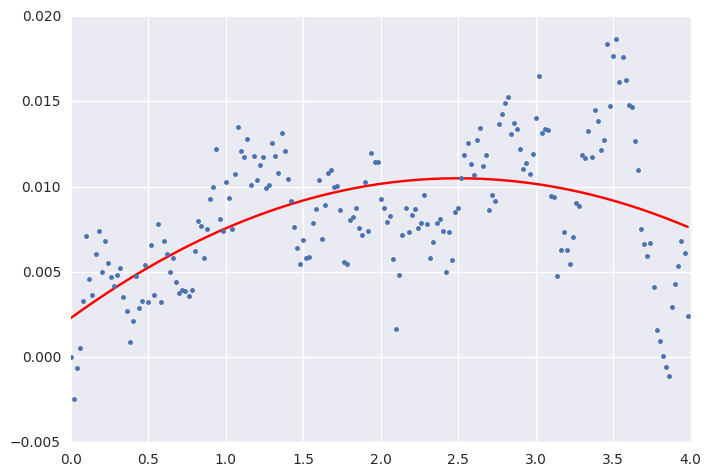

('K1 =', -0.006203207001778446, '+/-', 0.0029299091432900301)
('k2 =', 0.0152124291009769, '+/-', 0.0030616632368428822)
('tau_1 =', 0.55786899245920052, '+/-', 0.0029299091432900301)
('tau_2 =', 0.07141746106490629, '+/-', 0.0030616632368428822)
('theta =', 0.093914240659218343, '+/-', 0.0030616632368428822)
muscle
hg1_r


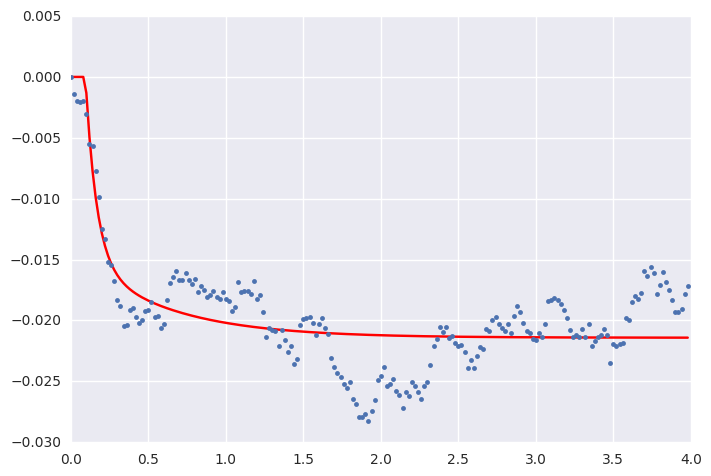

('K1 =', 0.039012193290309485, '+/-', 0.000951696116249727)
('k2 =', 0.0077097801729442382, '+/-', 0.0010528644514184772)
('tau_1 =', 1.3701950871507675, '+/-', 0.000951696116249727)
('tau_2 =', 0.014943445560122897, '+/-', 0.0010528644514184772)
('theta =', 0.17163963146152597, '+/-', 0.0010528644514184772)
muscle
hg2_r


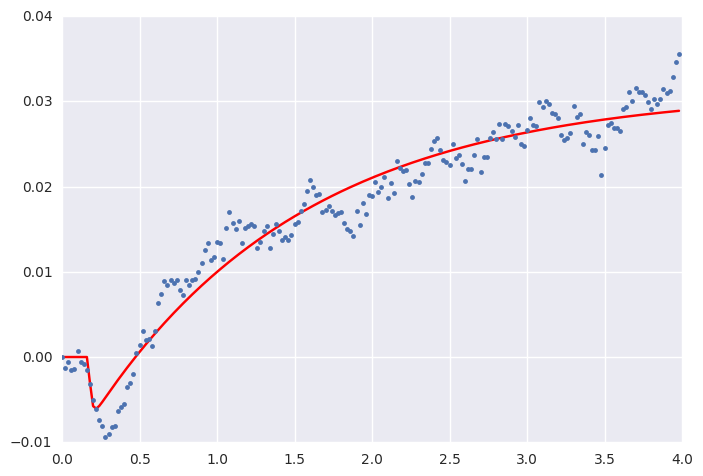

('K1 =', 94.53757763912725, '+/-', 47255.462359260571)
('k2 =', 30.487412558566444, '+/-', 35339.360457038674)
('tau_1 =', 596.79880413693411, '+/-', 47255.462359260571)
('tau_2 =', 186.1111506029211, '+/-', 35339.360457038674)
('theta =', -18.078189120025588, '+/-', 35339.360457038674)
muscle
hg3_r


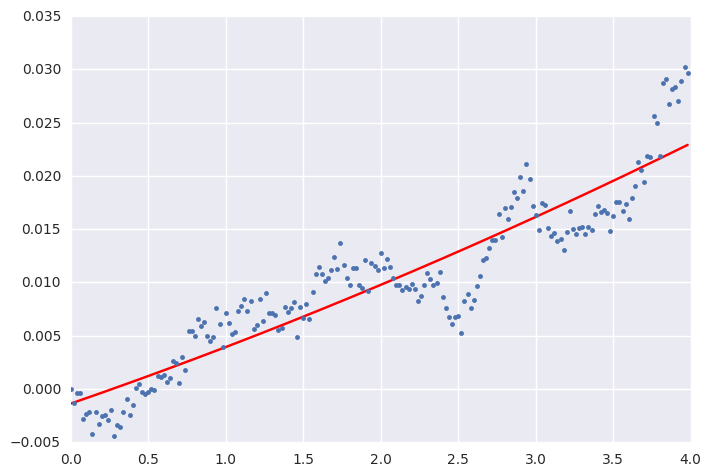

('K1 =', 0.10368369668394004, '+/-', 20.661322084246354)
('k2 =', 0.15212355516200493, '+/-', 20.677991085169165)
('tau_1 =', 1.3458368145749522, '+/-', 20.661322084246354)
('tau_2 =', 1.9744921102363955, '+/-', 20.677991085169165)
('theta =', 0.45690687476494635, '+/-', 20.677991085169165)
muscle
hg4_r


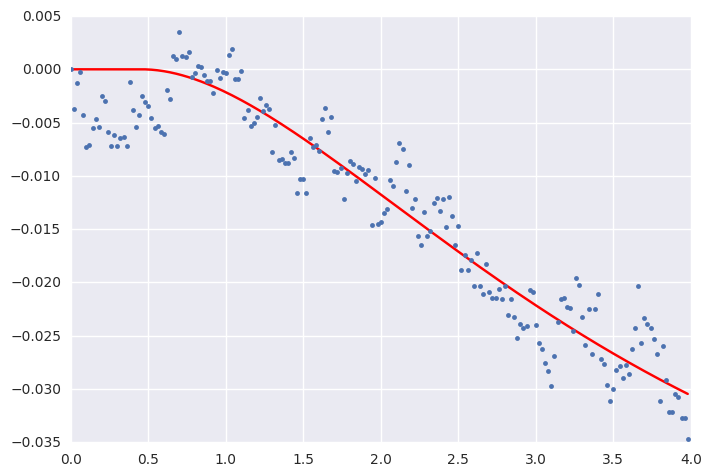

In [89]:
#stimulus_df = pd.DataFrame({'K1':0,'K2': 0, 'tau1': 0, 'tau2': 0},
#                  index=[0])
stimulus_df_rcc = pd.DataFrame()
stimulus = roll_ccw_df

for muscle in muscle_list: 
        
        times = np.arange(350)*0.02
        colors = times[150:350]
        x1 = times[150:350]
        x=x1-x1[0]
        muscle_choice = stimulus[muscle]
        y = muscle_choice[150:350]-muscle_choice[150]   #from 150
        
        popt, pcov = curve_fit(exponential_f, x, y, p0=np.asarray([0.1,0.1,0.25,0.9, 0.1]), maxfev=2000000)
        
        df =pd.DataFrame({'K1': popt[0],'K2': popt[1], 'tau1': popt[2], 'tau2': popt[3], 'theta': popt[4]},
                  index=[muscle])
        stimulus_df_rcc = stimulus_df_rcc.append(df)
        
        print("K1 =", popt[0], "+/-", pcov[0,0]**0.5)
        print("k2 =", popt[1], "+/-", pcov[1,1]**0.5)
        print("tau_1 =", popt[2], "+/-", pcov[0,0]**0.5)
        print("tau_2 =", popt[3], "+/-", pcov[1,1]**0.5)
        print("theta =", popt[4], "+/-", pcov[1,1]**0.5)
        print('muscle')
        print(muscle)

        df =pd.DataFrame({'K1': popt[0],'K2': popt[1], 'tau1': popt[2], 'tau2': popt[3], 'theta': popt[4]},
                  index=[muscle])
        #df =pd.DataFrame
    
        df_1.append(df)
        
        #plt.errorbar(x, y, yerr=e, fmt="none")
        #xfine = np.linspace(0.01, 10., 100)  # define values to plot the function for
        plt.plot(x, exponential_f(x, popt[0], popt[1], popt[2], popt[3], popt[4]), 'r-')
        plt.plot(x, y, '.')
        plt.xlim(0, 4.0)
        plt.show()
        
stimulus_df_rcc.to_csv('roll_ccw_constants_theta.csv') 

('K1 =', 0.018366905613901634, '+/-', 3223.8695701770621)
('k2 =', 0.00046382727571806241, '+/-', 3223.8692128929224)
('tau_1 =', 0.5585334799201932, '+/-', 3223.8695701770621)
('tau_2 =', 0.00025056316027476875, '+/-', 3223.8692128929224)
('theta =', 0.17780138632815029, '+/-', 3223.8692128929224)
muscle
b1_l


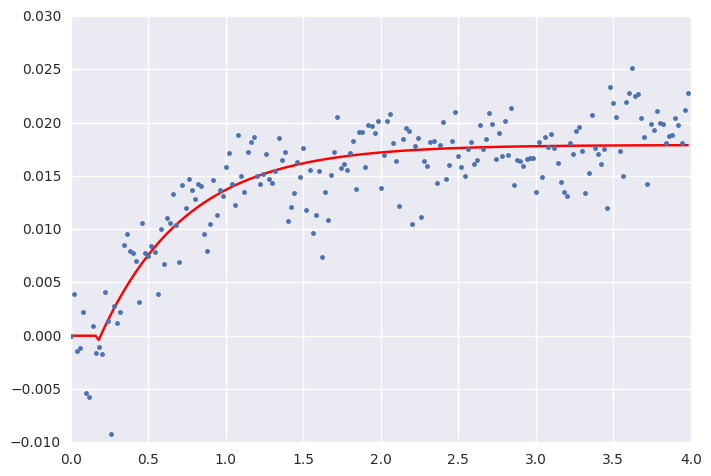

('K1 =', 0.042549630797437857, '+/-', 0.20654767989946612)
('k2 =', 0.32106189617047748, '+/-', 12.8617093094532)
('tau_1 =', 1.855363678627431, '+/-', 0.20654767989946612)
('tau_2 =', 37.853241618497485, '+/-', 12.8617093094532)
('theta =', 0.063026539445666718, '+/-', 12.8617093094532)
muscle
b2_l


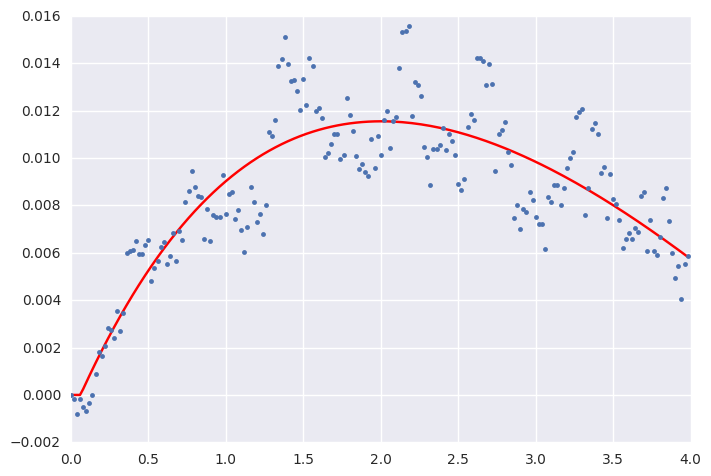

('K1 =', -0.057609127343728285, '+/-', 0.01321018941008064)
('k2 =', 0.017322802034510244, '+/-', 0.007102404134093453)
('tau_1 =', 3.5776345788244148, '+/-', 0.01321018941008064)
('tau_2 =', 0.33757850428234043, '+/-', 0.007102404134093453)
('theta =', 0.31271601234246066, '+/-', 0.007102404134093453)
muscle
b3_l


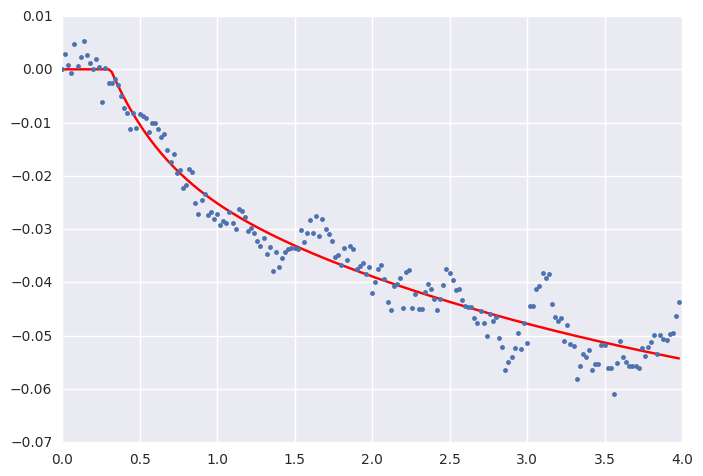

('K1 =', 1.6605000727763388, '+/-', 4616.1217460257767)
('k2 =', 1.7051148512104626, '+/-', 4616.1221855955819)
('tau_1 =', 0.39771698953791357, '+/-', 4616.1217460257767)
('tau_2 =', 0.39061952111694653, '+/-', 4616.1221855955819)
('theta =', 0.16701964881320308, '+/-', 4616.1221855955819)
muscle
i1_l


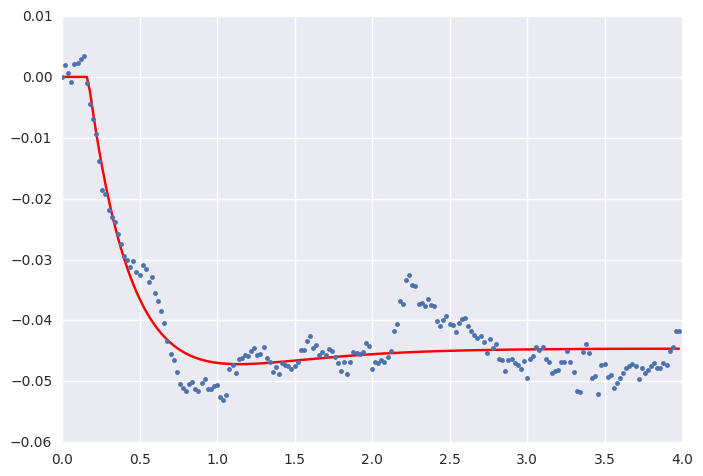

('K1 =', -0.029513374895322811, '+/-', 0.0010405196225724382)
('k2 =', 62.412689875487615, '+/-', 113608.37069119987)
('tau_1 =', 0.20845581952493811, '+/-', 0.0010405196225724382)
('tau_2 =', 30426.730550655902, '+/-', 113608.37069119987)
('theta =', 0.23508156201467886, '+/-', 113608.37069119987)
muscle
i2_l


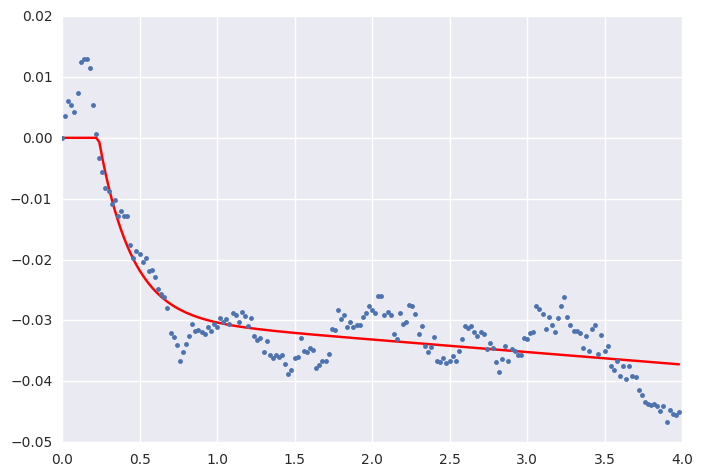

('K1 =', -0.01427568534898295, '+/-', 0.0025562751537549729)
('k2 =', -0.040617328000506103, '+/-', 0.016507068536128908)
('tau_1 =', 0.23677067636130864, '+/-', 0.0025562751537549729)
('tau_2 =', 5.1287167305250367, '+/-', 0.016507068536128908)
('theta =', 0.15332577145535864, '+/-', 0.016507068536128908)
muscle
iii1_l


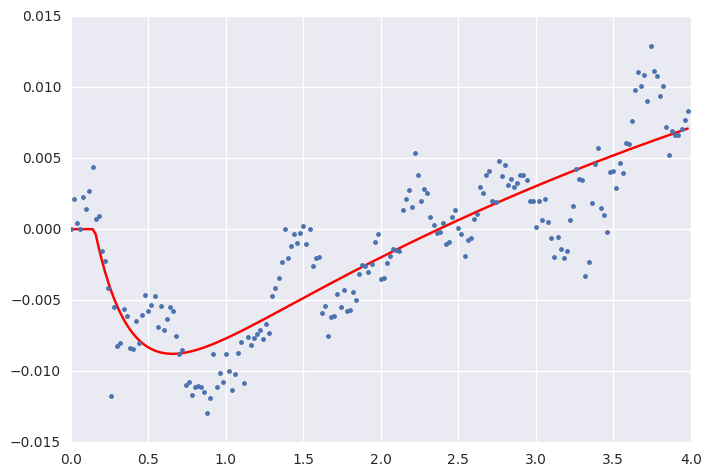

('K1 =', 0.01374289479535796, '+/-', 0.040443298257660042)
('k2 =', 0.011438000778943698, '+/-', 0.047282484488244049)
('tau_1 =', 1.6303034698589227, '+/-', 0.040443298257660042)
('tau_2 =', 0.50685188443399098, '+/-', 0.047282484488244049)
('theta =', 0.17999968838744831, '+/-', 0.047282484488244049)
muscle
iii3_l


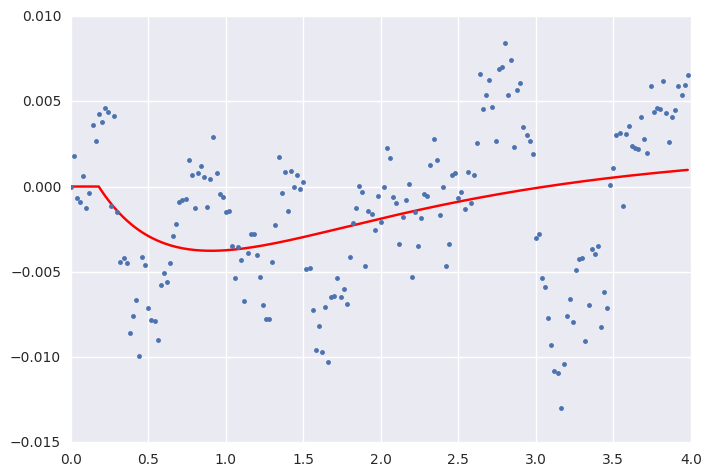

('K1 =', -0.055791487423478385, '+/-', 0.032445327381870455)
('k2 =', -0.041719575871777839, '+/-', 0.031747926350917791)
('tau_1 =', 0.33244797654685337, '+/-', 0.032445327381870455)
('tau_2 =', 0.81524636866357625, '+/-', 0.031747926350917791)
('theta =', 0.16687117628504164, '+/-', 0.031747926350917791)
muscle
hg1_l


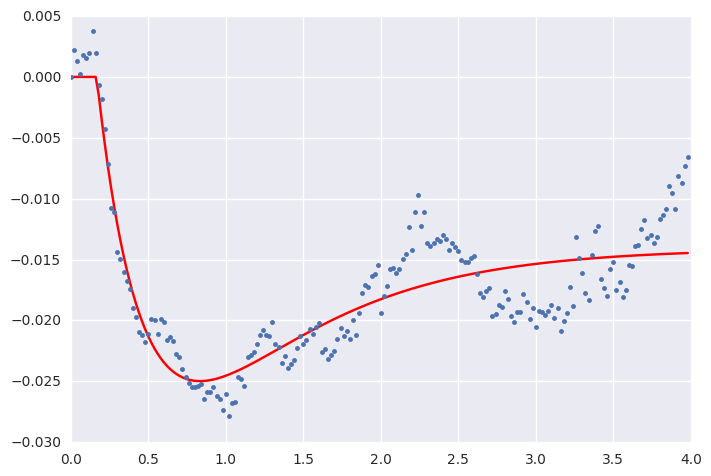

('K1 =', 0.10674738475273526, '+/-', 0.019589696124435698)
('k2 =', 0.0094180310294424054, '+/-', 0.0210293882216313)
('tau_1 =', 4.5481683559729946, '+/-', 0.019589696124435698)
('tau_2 =', 0.37974531372080461, '+/-', 0.0210293882216313)
('theta =', 0.13999970324665639, '+/-', 0.0210293882216313)
muscle
hg2_l


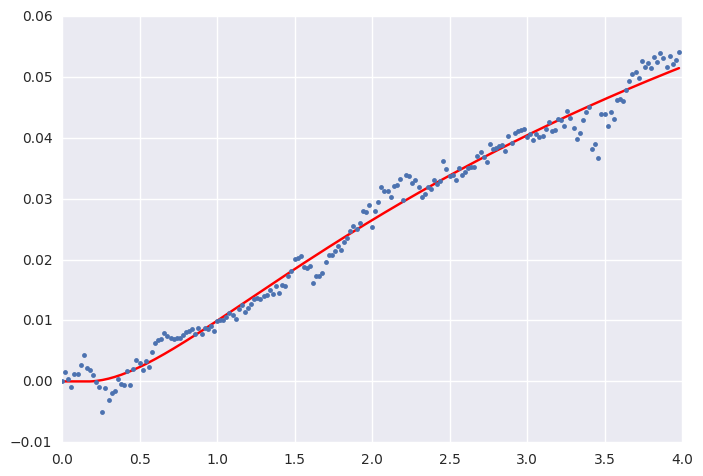

('K1 =', 774.73220682122212, '+/-', 48814.905733476662)
('k2 =', -0.018195800152706762, '+/-', 0.001406206793687333)
('tau_1 =', 34328.107914892586, '+/-', 48814.905733476662)
('tau_2 =', 0.60170023816043861, '+/-', 0.001406206793687333)
('theta =', 0.26875085323332371, '+/-', 0.001406206793687333)
muscle
hg3_l


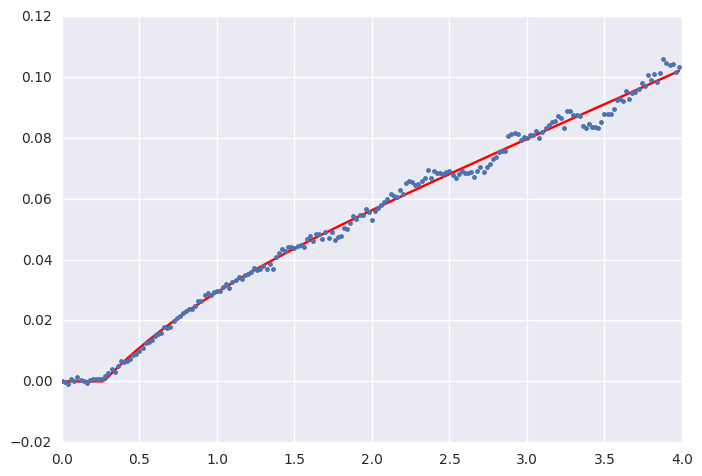

('K1 =', 0.12399972458411934, '+/-', 258.90153258183705)
('k2 =', 0.12419023509676083, '+/-', 258.88246968743437)
('tau_1 =', 1.2498762731885351, '+/-', 258.90153258183705)
('tau_2 =', 1.3734481793032791, '+/-', 258.88246968743437)
('theta =', -0.46286135590214711, '+/-', 258.88246968743437)
muscle
hg4_l


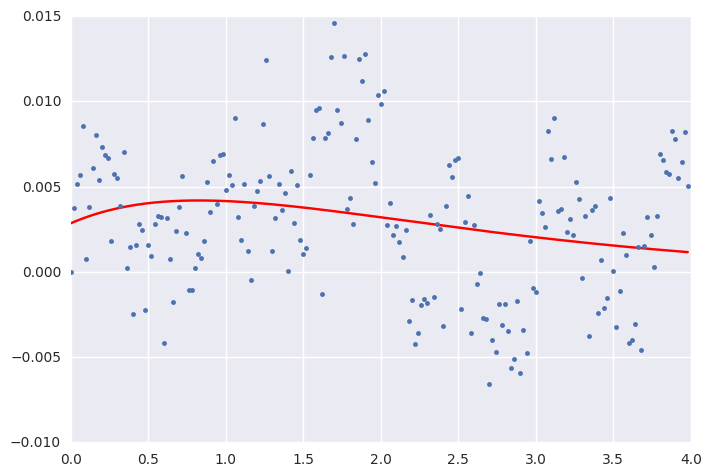

('K1 =', -0.0039117345800113324, '+/-', 0.0010170998579076599)
('k2 =', 0.020404463858696768, '+/-', 0.0013738463123403961)
('tau_1 =', 0.031312336400002069, '+/-', 0.0010170998579076599)
('tau_2 =', 1.9636251531552378, '+/-', 0.0013738463123403961)
('theta =', 0.030760617608691521, '+/-', 0.0013738463123403961)
muscle
b1_r


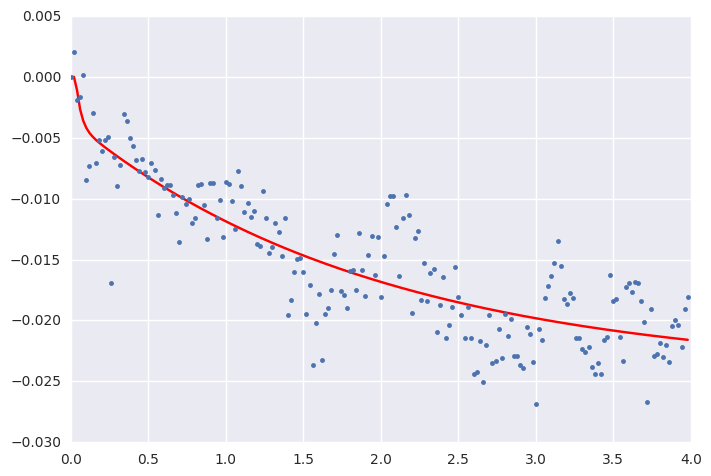

('K1 =', 0.0018080708750457598, '+/-', 0.0015816098340675829)
('k2 =', 0.026163928917087111, '+/-', 0.0015342945768747802)
('tau_1 =', 0.068207752500807475, '+/-', 0.0015816098340675829)
('tau_2 =', 1.9581426949410277, '+/-', 0.0015342945768747802)
('theta =', 0.39885870169240112, '+/-', 0.0015342945768747802)
muscle
b2_r


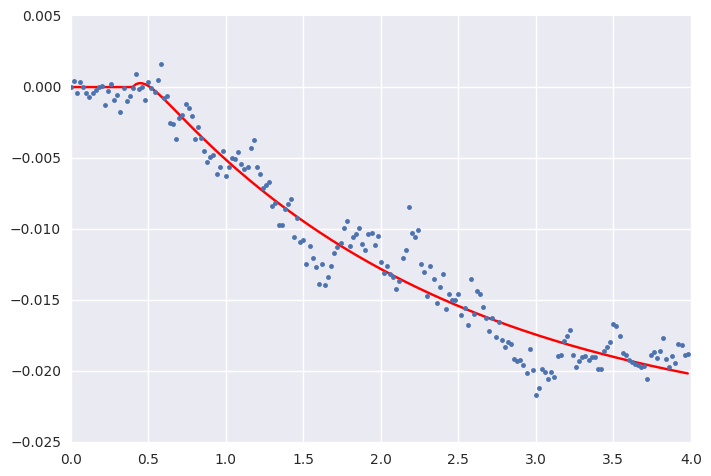

('K1 =', 0.05789687957107334, '+/-', 140583.15298796495)
('k2 =', 0.033337613849513816, '+/-', 140583.15126670181)
('tau_1 =', 2.3998463693229892, '+/-', 140583.15298796495)
('tau_2 =', 2.4002613286755277, '+/-', 140583.15126670181)
('theta =', -0.46058125739623085, '+/-', 140583.15126670181)
muscle
b3_r


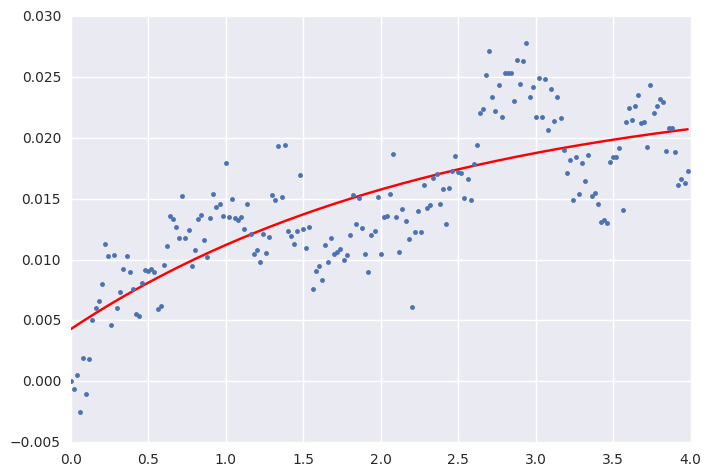

('K1 =', 12.131572608270307, '+/-', 27183.068420065563)
('k2 =', 12.028062165511971, '+/-', 27183.072087791526)
('tau_1 =', 0.84796755697920001, '+/-', 27183.068420065563)
('tau_2 =', 0.83732544269691922, '+/-', 27183.072087791526)
('theta =', 0.073828540206625021, '+/-', 27183.072087791526)
muscle
i1_r


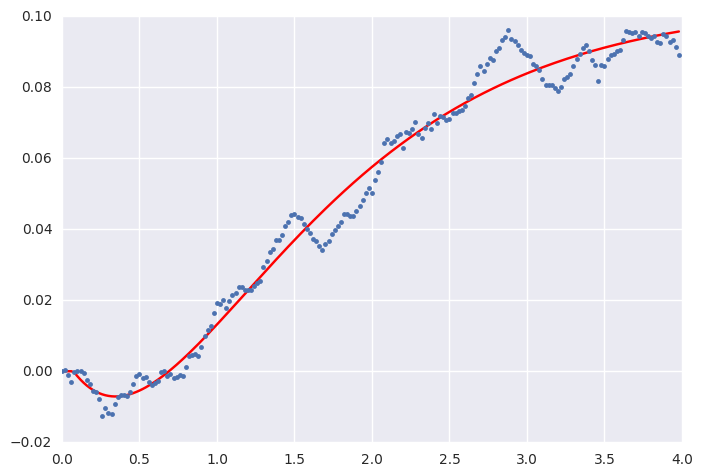

('K1 =', 0.29960312514062271, '+/-', 44052.761822993802)
('k2 =', -0.084213563737251473, '+/-', 44052.753626864469)
('tau_1 =', 4.4135508135361672, '+/-', 44052.761822993802)
('tau_2 =', 4.4126910574378453, '+/-', 44052.753626864469)
('theta =', 0.28065821637882454, '+/-', 44052.753626864469)
muscle
i2_r


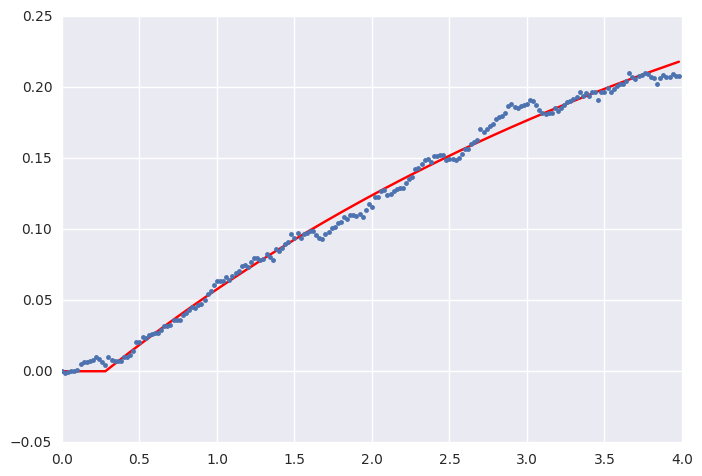

('K1 =', -0.0072613368841728584, '+/-', 0.00064505398299750005)
('k2 =', -0.018183057665939844, '+/-', 0.012651892601128287)
('tau_1 =', 0.036227143988126334, '+/-', 0.00064505398299750005)
('tau_2 =', 6.3256031706313642, '+/-', 0.012651892601128287)
('theta =', 0.15108417905054566, '+/-', 0.012651892601128287)
muscle
iii1_r


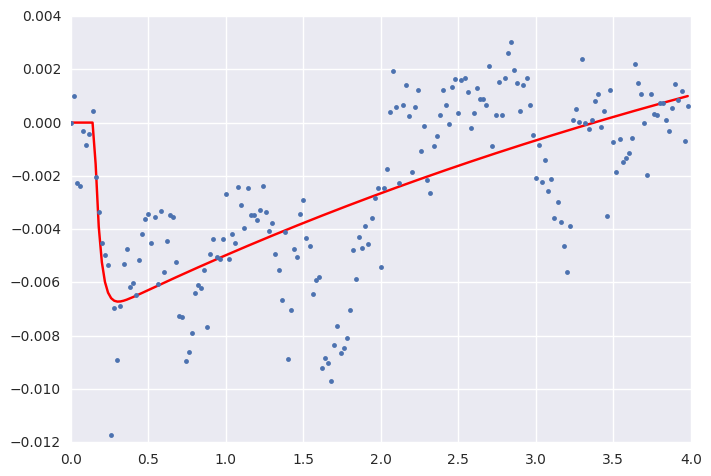

('K1 =', 0.01489984860793743, '+/-', 0.0022595064789656776)
('k2 =', 0.057881093129331485, '+/-', 0.0019733581415050595)
('tau_1 =', 0.044391311960222245, '+/-', 0.0022595064789656776)
('tau_2 =', 1.0305464147317176, '+/-', 0.0019733581415050595)
('theta =', 0.13433925022000814, '+/-', 0.0019733581415050595)
muscle
iii3_r


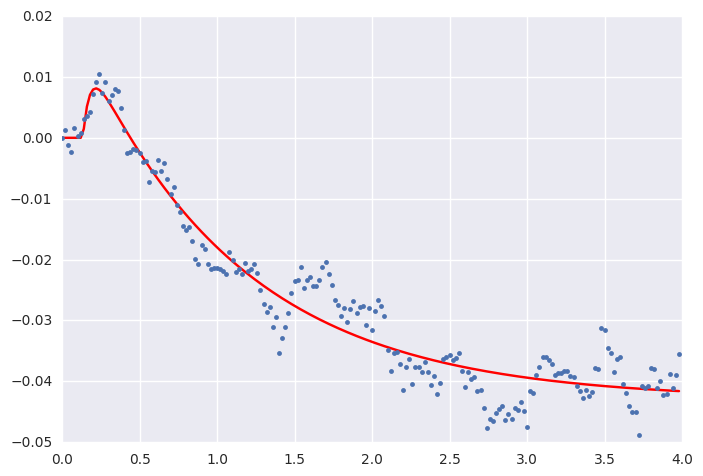

('K1 =', -0.017899623570753389, '+/-', 0.0054330087033476922)
('k2 =', -0.058341726310370705, '+/-', 0.0029455650872893266)
('tau_1 =', 0.25985594226940095, '+/-', 0.0054330087033476922)
('tau_2 =', 2.4503972685675466, '+/-', 0.0029455650872893266)
('theta =', 0.13248767309050125, '+/-', 0.0029455650872893266)
muscle
hg1_r


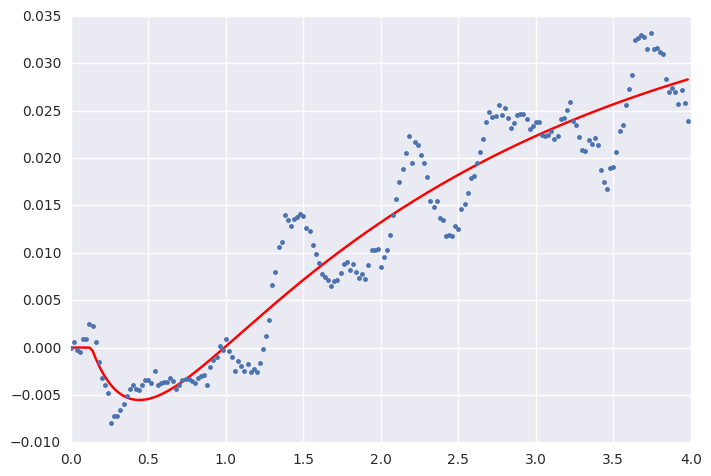

('K1 =', 0.58183297249552079, '+/-', 23.056527056169973)
('k2 =', 0.51215294531147237, '+/-', 23.0611848631487)
('tau_1 =', 1.0663840299300469, '+/-', 23.056527056169973)
('tau_2 =', 0.93880490758871582, '+/-', 23.0611848631487)
('theta =', 0.019154835457226165, '+/-', 23.0611848631487)
muscle
hg2_r


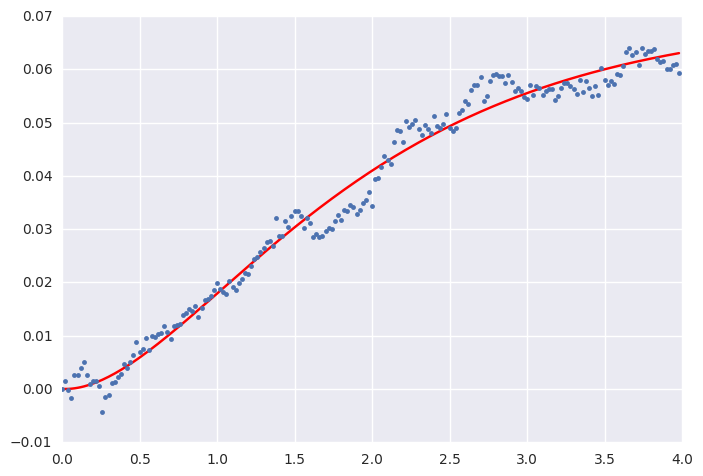

('K1 =', 0.54549166748808886, '+/-', 1717.4124419734185)
('k2 =', 0.5315125776299463, '+/-', 1717.5510931668716)
('tau_1 =', 3.0339078327335738, '+/-', 1717.4124419734185)
('tau_2 =', 2.8306144427026583, '+/-', 1717.5510931668716)
('theta =', -0.23215722801330019, '+/-', 1717.5510931668716)
muscle
hg3_r


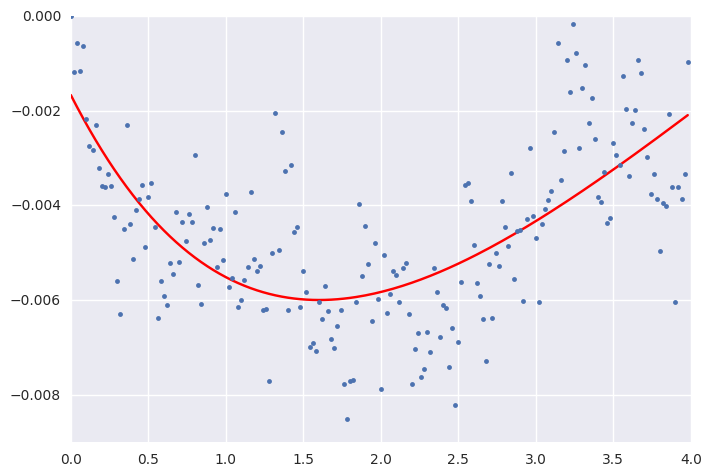

('K1 =', -0.011618277493688137, '+/-', 0.010246274497661974)
('k2 =', 0.015107752044615032, '+/-', 0.0051224753377653864)
('tau_1 =', 3.7664043526814797, '+/-', 0.010246274497661974)
('tau_2 =', 0.32366910493855749, '+/-', 0.0051224753377653864)
('theta =', 0.072950439432842698, '+/-', 0.0051224753377653864)
muscle
hg4_r


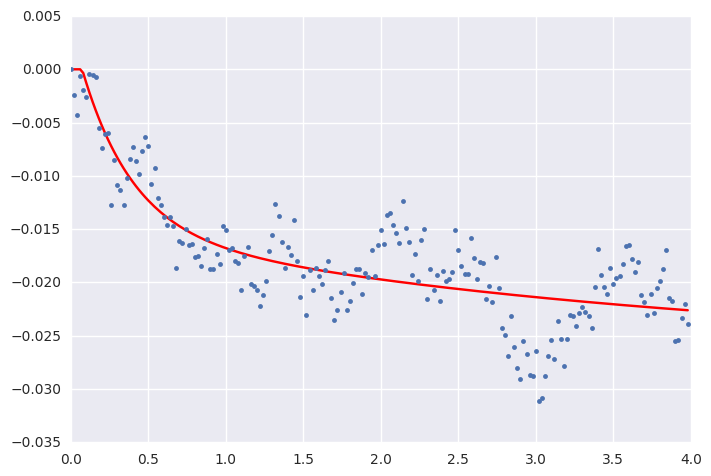

In [90]:
#stimulus_df = pd.DataFrame({'K1':0,'K2': 0, 'tau1': 0, 'tau2': 0},
#                  index=[0])
stimulus_df_rc = pd.DataFrame()
stimulus = roll_cw_df

for muscle in muscle_list: 
        
        times = np.arange(350)*0.02
        colors = times[150:350]
        x1 = times[150:350]
        x=x1-x1[0]
        muscle_choice = stimulus[muscle]
        y = muscle_choice[150:350]-muscle_choice[150]   #from 150
        
        popt, pcov = curve_fit(exponential_f, x, y, p0=np.asarray([0.1,0.1,0.25,0.9, 0.1]), maxfev=2000000)
        
        df =pd.DataFrame({'K1': popt[0],'K2': popt[1], 'tau1': popt[2], 'tau2': popt[3], 'theta': popt[4]},
                  index=[muscle])
        stimulus_df_rc = stimulus_df_rc.append(df)
        
        print("K1 =", popt[0], "+/-", pcov[0,0]**0.5)
        print("k2 =", popt[1], "+/-", pcov[1,1]**0.5)
        print("tau_1 =", popt[2], "+/-", pcov[0,0]**0.5)
        print("tau_2 =", popt[3], "+/-", pcov[1,1]**0.5)
        print("theta =", popt[4], "+/-", pcov[1,1]**0.5)
        print('muscle')
        print(muscle)

        df =pd.DataFrame({'K1': popt[0],'K2': popt[1], 'tau1': popt[2], 'tau2': popt[3], 'theta': popt[4]},
                  index=[muscle])
        #df =pd.DataFrame
    
        df_1.append(df)
        
        #plt.errorbar(x, y, yerr=e, fmt="none")
        #xfine = np.linspace(0.01, 10., 100)  # define values to plot the function for
        plt.plot(x, exponential_f(x, popt[0], popt[1], popt[2], popt[3], popt[4]), 'r-')
        plt.plot(x, y, '.')
        plt.xlim(0, 4.0)
        plt.show()
        
stimulus_df_rc.to_csv('roll_cw_constants_theta.csv') 

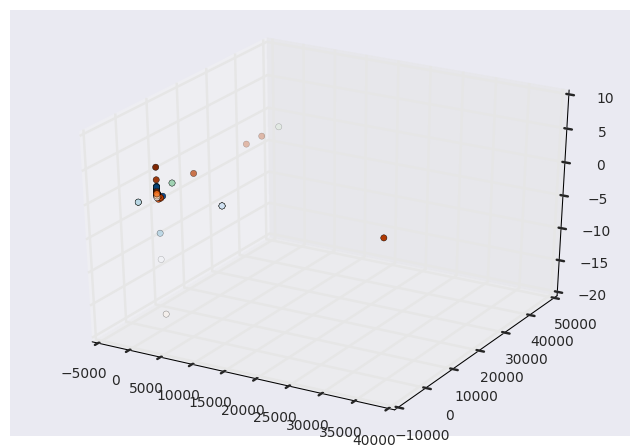

In [94]:
ax = plt.axes(projection='3d')

# Data for a three-dimensional line
#zline = np.linspace(0, 15, 1000)
#xline = np.sin(zline)
#yline = np.cos(zline)
#ax.plot3D(xline, yline, zline, 'gray')

# Data for three-dimensional scattered points
zdata = stimulus_df['theta']
xdata = stimulus_df['tau1']
ydata = stimulus_df['tau2']

zdata_yl = stimulus_df_yl['theta']
xdata_yl = stimulus_df_yl['tau1']
ydata_yl = stimulus_df_yl['tau2']
   
zdata_pu = stimulus_df_pu['theta']
xdata_pu = stimulus_df_pu['tau1']
ydata_pu = stimulus_df_pu['tau2']

zdata_pd = stimulus_df_pd['theta']
xdata_pd = stimulus_df_pd['tau1']
ydata_pd = stimulus_df_pd['tau2']

zdata_rcc = stimulus_df_rcc['theta']
xdata_rcc = stimulus_df_rcc['tau1']
ydata_rcc = stimulus_df_rcc['tau2']
  
zdata_rc = stimulus_df_rc['theta']
xdata_rc = stimulus_df_rc['tau1']
ydata_rc = stimulus_df_rc['tau2']

ax.scatter3D(xdata, ydata, zdata, c=zdata, cmap='Greens');
ax.scatter3D(xdata_yl, ydata_yl, zdata_yl, c=zdata_yl, cmap='Greens');
ax.scatter3D(xdata_pu, ydata_pu, zdata_pu, c=zdata_pu, cmap='Blues');
ax.scatter3D(xdata_pd, ydata_pd, zdata_pd, c=zdata_pd, cmap='Blues');
ax.scatter3D(xdata_rc, ydata_rc, zdata_rc, c=zdata_rc, cmap='Oranges');
ax.scatter3D(xdata_rcc, ydata_rcc, zdata_rcc, c=zdata_rcc, cmap='Oranges');
#ax.set_xlim(-1, 1); ax.set_ylim(-1, 1); ax.set_zlim(-1, 1);
plt.show()

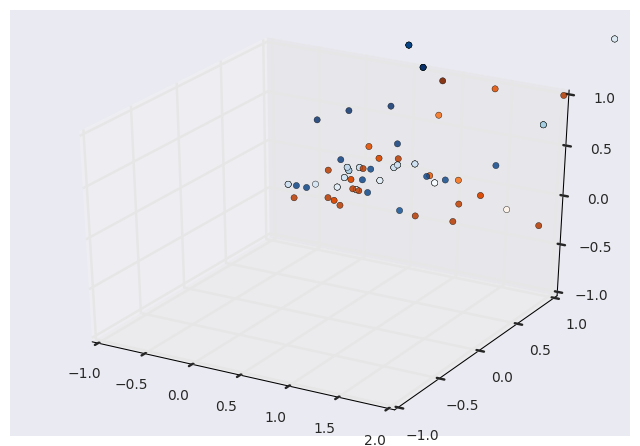

In [96]:
ax = plt.axes(projection='3d')

# Data for a three-dimensional line
#zline = np.linspace(0, 15, 1000)
#xline = np.sin(zline)
#yline = np.cos(zline)
#ax.plot3D(xline, yline, zline, 'gray')

# Data for three-dimensional scattered points
zdata = stimulus_df['theta']
xdata = stimulus_df['tau1']
ydata = stimulus_df['tau2']

zdata_yl = stimulus_df_yl['theta']
xdata_yl = stimulus_df_yl['tau1']
ydata_yl = stimulus_df_yl['tau2']
   
zdata_pu = stimulus_df_pu['theta']
xdata_pu = stimulus_df_pu['tau1']
ydata_pu = stimulus_df_pu['tau2']

zdata_pd = stimulus_df_pd['theta']
xdata_pd = stimulus_df_pd['tau1']
ydata_pd = stimulus_df_pd['tau2']

zdata_rcc = stimulus_df_rcc['theta']
xdata_rcc = stimulus_df_rcc['tau1']
ydata_rcc = stimulus_df_rcc['tau2']
  
zdata_rc = stimulus_df_rc['theta']
xdata_rc = stimulus_df_rc['tau1']
ydata_rc = stimulus_df_rc['tau2']

ax.scatter3D(xdata, ydata, zdata, c=zdata, cmap='Greens');
ax.scatter3D(xdata_yl, ydata_yl, zdata_yl, c=zdata_yl, cmap='Greens');
ax.scatter3D(xdata_pu, ydata_pu, zdata_pu, c=zdata_pu, cmap='Blues');
ax.scatter3D(xdata_pd, ydata_pd, zdata_pd, c=zdata_pd, cmap='Blues');
ax.scatter3D(xdata_rc, ydata_rc, zdata_rc, c=zdata_rc, cmap='Oranges');
ax.scatter3D(xdata_rcc, ydata_rcc, zdata_rcc, c=zdata_rcc, cmap='Oranges');
ax.set_xlim(-1, 2); ax.set_ylim(-1, 1); ax.set_zlim(-1, 1);
plt.show()

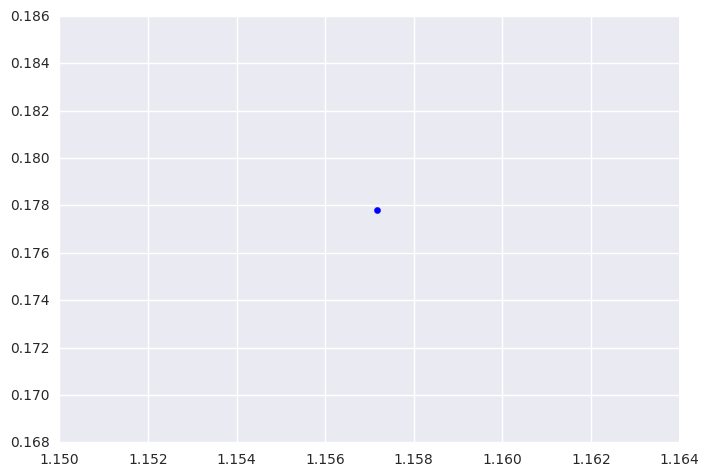

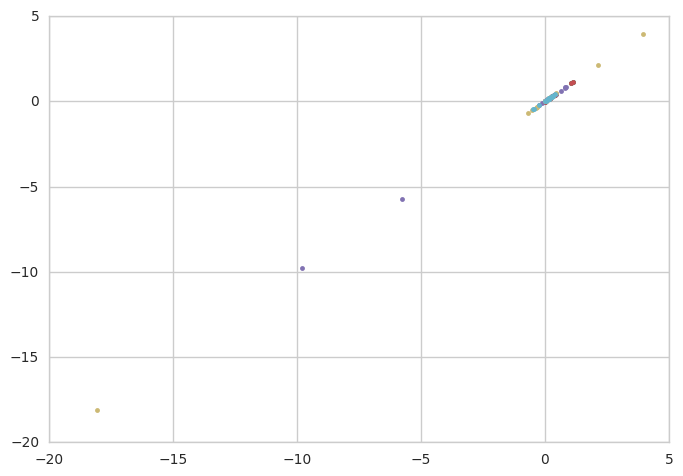

In [129]:
import seaborn as sns, matplotlib.pyplot as plt
sns.set(style="whitegrid")

#tips = sns.load_dataset("tips")

plt.plot(zdata, zdata, '.')
plt.plot(zdata_yl, zdata_yl, '.')
plt.plot(zdata_pu, zdata_pu, '.')
plt.plot(zdata_pd, zdata_pd, '.')
plt.plot(zdata_rcc, zdata_rcc, '.')
plt.plot(zdata_rc, zdata_rc, '.')

plt.show()

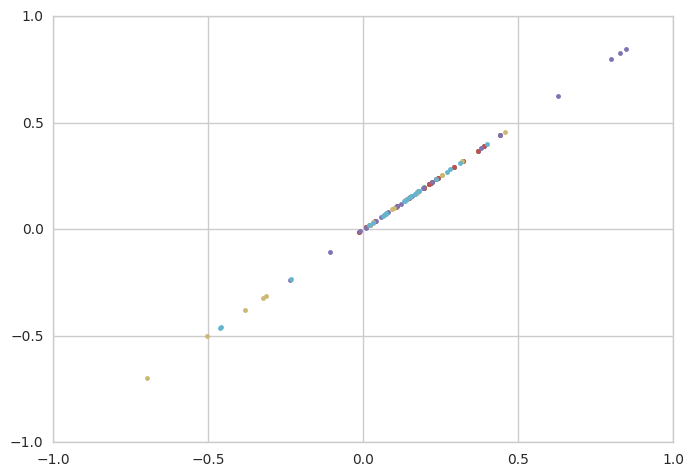

In [132]:
import seaborn as sns, matplotlib.pyplot as plt
sns.set(style="whitegrid")

#tips = sns.load_dataset("tips")

plt.plot(zdata, zdata, '.')
plt.plot(zdata_yl, zdata_yl, '.')
plt.plot(zdata_pu, zdata_pu, '.')
plt.plot(zdata_pd, zdata_pd, '.')
plt.plot(zdata_rcc, zdata_rcc, '.')
plt.plot(zdata_rc, zdata_rc, '.')

plt.xlim(-1,1)
plt.ylim(-1,1)

plt.show()

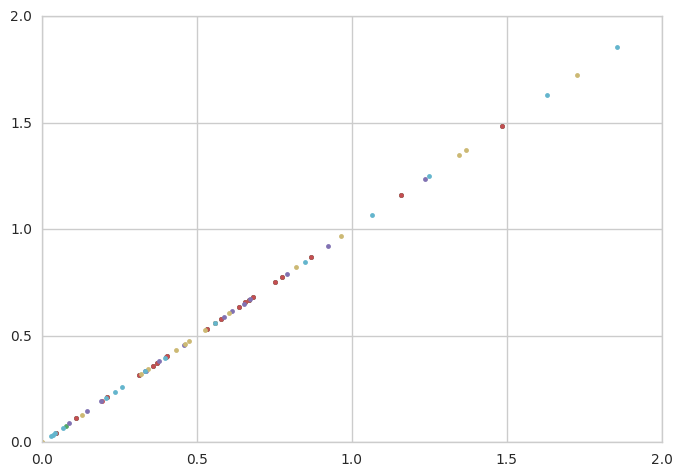

In [134]:
import seaborn as sns, matplotlib.pyplot as plt
sns.set(style="whitegrid")

#tips = sns.load_dataset("tips")

plt.plot(xdata, xdata, '.')
plt.plot(xdata_yl, xdata_yl, '.')
plt.plot(xdata_pu, xdata_pu, '.')
plt.plot(xdata_pd, xdata_pd, '.')
plt.plot(xdata_rcc, xdata_rcc, '.')
plt.plot(xdata_rc, xdata_rc, '.')

plt.xlim(0,2)
plt.ylim(0,2)

plt.show()

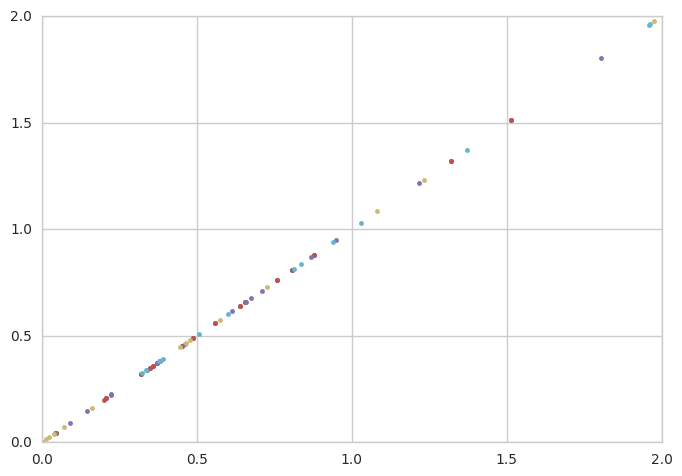

In [136]:
import seaborn as sns, matplotlib.pyplot as plt
sns.set(style="whitegrid")

#tips = sns.load_dataset("tips")

plt.plot(ydata, ydata, '.')
plt.plot(ydata_yl, ydata_yl, '.')
plt.plot(ydata_pu, ydata_pu, '.')
plt.plot(ydata_pd, ydata_pd, '.')
plt.plot(ydata_rcc, ydata_rcc, '.')
plt.plot(ydata_rc, ydata_rc, '.')

plt.xlim(0,2)
plt.ylim(0,2)

plt.show()

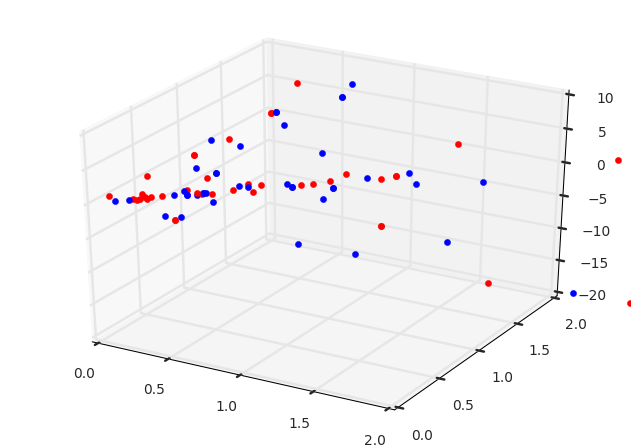

In [190]:
muscle_list = ('b1_l', 'b2_l', 'b3_l', 'i1_l', 'i2_l', 'iii1_l', 'iii3_l', 'hg1_l', 'hg2_l', 'hg3_l', 'hg4_l', 'b1_r', 'b2_r', 'b3_r', 'i1_r', 'i2_r', 'iii1_r', 'iii3_r', 'hg1_r', 'hg2_r', 'hg3_r', 'hg4_r')
#muscle_assign = ('R', 'B', 'R', 'B', 'R', 'B', 'R', 'B', 'R', 'R', 'R', 'R', 'B', 'R', 'B', 'R', 'B', 'R', 'B', 'R', 'R', 'R')
muscle_assign = ('R', 'B', 'R', 'B', 'R', 'B', 'R', 'B', 'B', 'B', 'R', 'R', 'B', 'R', 'B', 'R', 'B', 'R', 'B', 'B', 'B', 'R')

counter = 0
#fig = plt.figure()
ax = plt.axes(projection='3d')

for muscle in muscle_list:
    x = stimulus_df.ix[counter]['tau1']
    y = stimulus_df.ix[counter]['tau2']
    z = stimulus_df.ix[counter]['theta']
    ax.scatter3D(x, y, z, color = muscle_assign[counter], c=muscle_assign[counter])
    counter = counter + 1

counter = 0
    
for muscle in muscle_list:
    x = stimulus_df_pd.ix[counter]['tau1']
    y = stimulus_df_pd.ix[counter]['tau2']
    z = stimulus_df_pd.ix[counter]['theta']
    ax.scatter3D(x, y, z, color = muscle_assign[counter], c=muscle_assign[counter],  marker='o')
    counter = counter + 1
    
counter = 0
    
for muscle in muscle_list:
    x = stimulus_df_rc.ix[counter]['tau1']
    y = stimulus_df_rc.ix[counter]['tau2']
    z = stimulus_df_rc.ix[counter]['theta']
    ax.scatter3D(x, y, z, color = muscle_assign[counter], c=muscle_assign[counter],  marker='o')
    counter = counter + 1
    
counter = 0
    
for muscle in muscle_list:
    x = stimulus_df_yl.ix[counter]['tau1']
    y = stimulus_df_yl.ix[counter]['tau2']
    z = stimulus_df_yl.ix[counter]['theta']
    ax.scatter3D(x, y, z, color = muscle_assign[counter], c=muscle_assign[counter],  marker='o')
    counter = counter + 1
    
counter = 0
    
for muscle in muscle_list:
    x = stimulus_df_pu.ix[counter]['tau1']
    y = stimulus_df_pu.ix[counter]['tau2']
    z = stimulus_df_pu.ix[counter]['theta']
    ax.scatter3D(x, y, z, color = muscle_assign[counter], c=muscle_assign[counter],  marker='o')
    counter = counter + 1   
    
counter = 0
    
for muscle in muscle_list:
    x = stimulus_df_rcc.ix[counter]['tau1']
    y = stimulus_df_rcc.ix[counter]['tau2']
    z = stimulus_df_rcc.ix[counter]['theta']
    ax.scatter3D(x, y, z, color = muscle_assign[counter], c=muscle_assign[counter],  marker='o')
    counter = counter + 1
    
plt.xlim(0,2)
plt.ylim(0,2)
    
plt.show()
 

In [ ]:
 
# Make a list of (eigenvalue, eigenvector) tuples
eig_pairs = [(np.abs(eig_vals[i]), eig_vecs[:,i]) for i in range(len(eig_vals))]
 
# Sort the (eigenvalue, eigenvector) tuples from high to low
eig_pairs.sort(key=lambda x: x[0], reverse=True)
 
# Visually confirm that the list is correctly sorted by decreasing eigenvalues
 
tot = sum(eig_vals)
var_exp = [(i / tot)*100 for i in sorted(eig_vals, reverse=True)]
cum_var_exp = np.cumsum(var_exp)
 
plt.figure(4)
plt.bar(range(65), var_exp)
plt.step(range(65), cum_var_exp)
 
#contruct the projection matrix
matrix_w = np.hstack((eig_pairs[0][1].reshape(65,1),
                      eig_pairs[1][1].reshape(65,1)))
 
plt.figure(5)
plt.plot(matrix_w[:,0],'r')
plt.plot(matrix_w[:,1],'b')
 
plt.figure(6)
proj = []
proj1 = []
proj2 =[]
for i in range(len(wv_mtrx)):
    musc_proj = np.dot(wv_mtrx[i], matrix_w)
    proj.append(musc_proj[0])
    proj1.append(musc_proj[1])
    proj2.append(musc_proj)
    plt.scatter(musc_proj[0], musc_proj[1])
 
     
X = np.array(list(zip(proj, proj1)))
 
#%%
from sklearn.cluster import KMeans
 
# Number of clusters
#kmeans = KMeans(n_clusters=2)
#n_clusters=1
n_clusters=2
kmeans = KMeans(n_clusters=2)
# Fitting the input data
kmeans = kmeans.fit(X)
# Getting the cluster labels
labels = kmeans.predict(X)
# Centroid values
centroids = kmeans.cluster_centers_
 
#print(C) 
print(centroids)
 
plt.figure(7)
plt.scatter(X[:, 0], X[:, 1], c=labels)
 
plt.scatter(centroids[:, 0], centroids[:, 1], c='black', s=200);
 
""" 
test3 = np.argwhere(labels=0)
 
for i in range(len(test3)):
    plt.plot(wv_mtrx[test3[i]])
"""

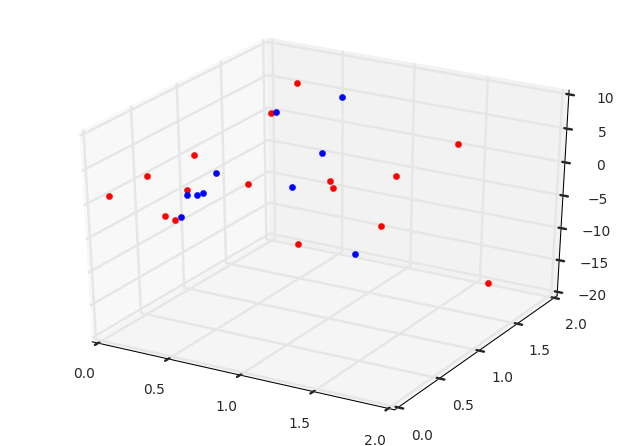

In [173]:
muscle_list = ('b1_l', 'b2_l', 'b3_l', 'i1_l', 'i2_l', 'iii1_l', 'iii3_l', 'hg1_l', 'hg2_l', 'hg3_l', 'hg4_l', 'b1_r', 'b2_r', 'b3_r', 'i1_r', 'i2_r', 'iii1_r', 'iii3_r', 'hg1_r', 'hg2_r', 'hg3_r', 'hg4_r')
muscle_assign = ('R', 'B', 'R', 'B', 'R', 'B', 'R', 'B', 'R', 'R', 'R', 'R', 'B', 'R', 'B', 'R', 'B', 'R', 'B', 'R', 'R', 'R')

counter = 0
#fig = plt.figure()
ax = plt.axes(projection='3d')
'''
for muscle in muscle_list:
    x = stimulus_df.ix[counter]['tau1']
    y = stimulus_df.ix[counter]['tau2']
    z = stimulus_df.ix[counter]['theta']
    ax.scatter3D(x, y, z, color = muscle_assign[counter], c=muscle_assign[counter])
    counter = counter + 1

counter = 0
 
for muscle in muscle_list:
    x = stimulus_df_pd.ix[counter]['tau1']
    y = stimulus_df_pd.ix[counter]['tau2']
    z = stimulus_df_pd.ix[counter]['theta']
    ax.scatter3D(x, y, z, color = muscle_assign[counter], c=muscle_assign[counter],  marker='o')
    counter = counter + 1
'''    
counter = 0
    
for muscle in muscle_list:
    x = stimulus_df_rc.ix[counter]['tau1']
    y = stimulus_df_rc.ix[counter]['tau2']
    z = stimulus_df_rc.ix[counter]['theta']
    ax.scatter3D(x, y, z, color = muscle_assign[counter], c=muscle_assign[counter],  marker='o')
    counter = counter + 1
    
counter = 0 
'''  
for muscle in muscle_list:
    x = stimulus_df_yl.ix[counter]['tau1']
    y = stimulus_df_yl.ix[counter]['tau2']
    z = stimulus_df_yl.ix[counter]['theta']
    ax.scatter3D(x, y, z, color = muscle_assign[counter], c=muscle_assign[counter],  marker='o')
    counter = counter + 1
    
counter = 0

for muscle in muscle_list:
    x = stimulus_df_pu.ix[counter]['tau1']
    y = stimulus_df_pu.ix[counter]['tau2']
    z = stimulus_df_pu.ix[counter]['theta']
    ax.scatter3D(x, y, z, color = muscle_assign[counter], c=muscle_assign[counter],  marker='o')
    counter = counter + 1   
    
counter = 0
'''    
for muscle in muscle_list:
    x = stimulus_df_rcc.ix[counter]['tau1']
    y = stimulus_df_rcc.ix[counter]['tau2']
    z = stimulus_df_rcc.ix[counter]['theta']
    ax.scatter3D(x, y, z, color = muscle_assign[counter], c=muscle_assign[counter],  marker='o')
    counter = counter + 1

plt.xlim(0,2)
plt.ylim(0,2)
    
plt.show()
 

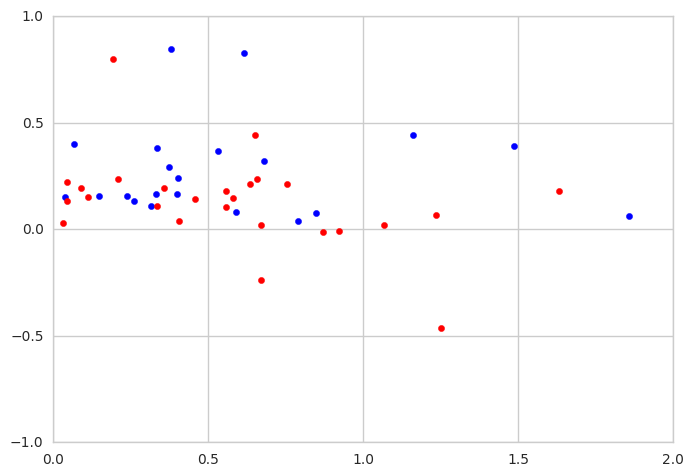

In [158]:
muscle_list = ('b1_l', 'b2_l', 'b3_l', 'i1_l', 'i2_l', 'iii1_l', 'iii3_l', 'hg1_l', 'hg2_l', 'hg3_l', 'hg4_l', 'b1_r', 'b2_r', 'b3_r', 'i1_r', 'i2_r', 'iii1_r', 'iii3_r', 'hg1_r', 'hg2_r', 'hg3_r', 'hg4_r')
muscle_assign = ('R', 'B', 'R', 'B', 'R', 'B', 'R', 'B', 'R', 'R', 'R', 'R', 'B', 'R', 'B', 'R', 'B', 'R', 'B', 'R', 'R', 'R')

counter = 0
fig = plt.figure()
#ax = plt.axes(projection='3d')

for muscle in muscle_list:
    x = stimulus_df.ix[counter]['tau1']
    y = stimulus_df.ix[counter]['tau2']
    z = stimulus_df.ix[counter]['theta']
    plt.scatter(x, z, color = muscle_assign[counter], c=muscle_assign[counter])
    counter = counter + 1

counter = 0
    
for muscle in muscle_list:
    x = stimulus_df_pd.ix[counter]['tau1']
    y = stimulus_df_pd.ix[counter]['tau2']
    z = stimulus_df_pd.ix[counter]['theta']
    plt.scatter(x, z, color = muscle_assign[counter], c=muscle_assign[counter],  marker='o')
    counter = counter + 1
    
counter = 0
    
for muscle in muscle_list:
    x = stimulus_df_rc.ix[counter]['tau1']
    y = stimulus_df_rc.ix[counter]['tau2']
    z = stimulus_df_rc.ix[counter]['theta']
    plt.scatter(x, z, color = muscle_assign[counter], c=muscle_assign[counter],  marker='o')
    counter = counter + 1
    
plt.xlim(0,2)
plt.ylim(-1,1)
    
plt.show()
 

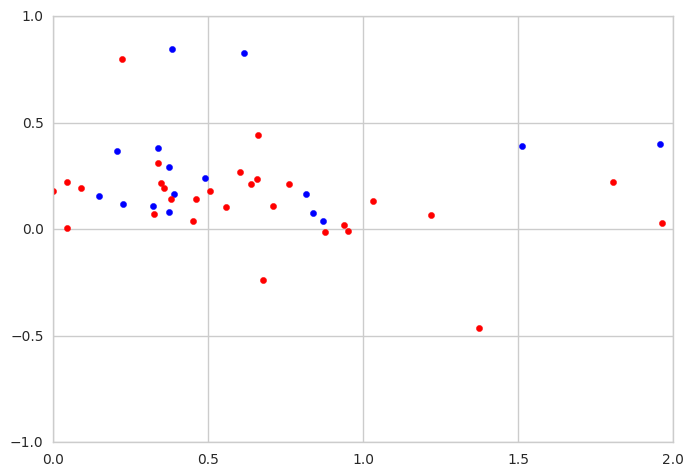

In [157]:
muscle_list = ('b1_l', 'b2_l', 'b3_l', 'i1_l', 'i2_l', 'iii1_l', 'iii3_l', 'hg1_l', 'hg2_l', 'hg3_l', 'hg4_l', 'b1_r', 'b2_r', 'b3_r', 'i1_r', 'i2_r', 'iii1_r', 'iii3_r', 'hg1_r', 'hg2_r', 'hg3_r', 'hg4_r')
muscle_assign = ('R', 'B', 'R', 'B', 'R', 'B', 'R', 'B', 'R', 'R', 'R', 'R', 'B', 'R', 'B', 'R', 'B', 'R', 'B', 'R', 'R', 'R')

counter = 0
fig = plt.figure()
#ax = plt.axes(projection='3d')

for muscle in muscle_list:
    x = stimulus_df.ix[counter]['tau1']
    y = stimulus_df.ix[counter]['tau2']
    z = stimulus_df.ix[counter]['theta']
    plt.scatter(y, z, color = muscle_assign[counter], c=muscle_assign[counter])
    counter = counter + 1

counter = 0
    
for muscle in muscle_list:
    x = stimulus_df_pd.ix[counter]['tau1']
    y = stimulus_df_pd.ix[counter]['tau2']
    z = stimulus_df_pd.ix[counter]['theta']
    plt.scatter(y, z, color = muscle_assign[counter], c=muscle_assign[counter],  marker='o')
    counter = counter + 1
    
counter = 0
    
for muscle in muscle_list:
    x = stimulus_df_rc.ix[counter]['tau1']
    y = stimulus_df_rc.ix[counter]['tau2']
    z = stimulus_df_rc.ix[counter]['theta']
    plt.scatter(y, z, color = muscle_assign[counter], c=muscle_assign[counter],  marker='o')
    counter = counter + 1
    
plt.xlim(0,2)
plt.ylim(-1,1)
    
plt.show()

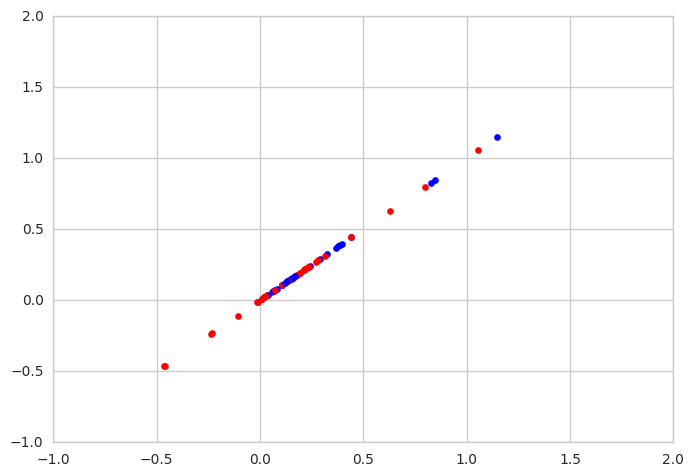

In [159]:
muscle_list = ('b1_l', 'b2_l', 'b3_l', 'i1_l', 'i2_l', 'iii1_l', 'iii3_l', 'hg1_l', 'hg2_l', 'hg3_l', 'hg4_l', 'b1_r', 'b2_r', 'b3_r', 'i1_r', 'i2_r', 'iii1_r', 'iii3_r', 'hg1_r', 'hg2_r', 'hg3_r', 'hg4_r')
muscle_assign = ('R', 'B', 'R', 'B', 'R', 'B', 'R', 'B', 'R', 'R', 'R', 'R', 'B', 'R', 'B', 'R', 'B', 'R', 'B', 'R', 'R', 'R')

counter = 0
fig = plt.figure()
#ax = plt.axes(projection='3d')

for muscle in muscle_list:
    x = stimulus_df.ix[counter]['tau1']
    y = stimulus_df.ix[counter]['tau2']
    z = stimulus_df.ix[counter]['theta']
    plt.scatter(z, z, color = muscle_assign[counter], c=muscle_assign[counter])
    counter = counter + 1

counter = 0
    
for muscle in muscle_list:
    x = stimulus_df_pd.ix[counter]['tau1']
    y = stimulus_df_pd.ix[counter]['tau2']
    z = stimulus_df_pd.ix[counter]['theta']
    plt.scatter(z, z, color = muscle_assign[counter], c=muscle_assign[counter],  marker='o')
    counter = counter + 1
    
counter = 0
    
for muscle in muscle_list:
    x = stimulus_df_rc.ix[counter]['tau1']
    y = stimulus_df_rc.ix[counter]['tau2']
    z = stimulus_df_rc.ix[counter]['theta']
    plt.scatter(z, z, color = muscle_assign[counter], c=muscle_assign[counter],  marker='o')
    counter = counter + 1
    
plt.xlim(-1,2)
plt.ylim(-1,2)
    
plt.show()

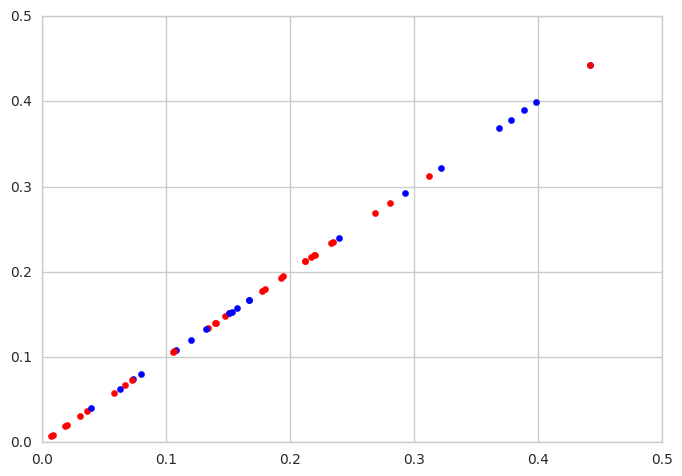

In [160]:
muscle_list = ('b1_l', 'b2_l', 'b3_l', 'i1_l', 'i2_l', 'iii1_l', 'iii3_l', 'hg1_l', 'hg2_l', 'hg3_l', 'hg4_l', 'b1_r', 'b2_r', 'b3_r', 'i1_r', 'i2_r', 'iii1_r', 'iii3_r', 'hg1_r', 'hg2_r', 'hg3_r', 'hg4_r')
muscle_assign = ('R', 'B', 'R', 'B', 'R', 'B', 'R', 'B', 'R', 'R', 'R', 'R', 'B', 'R', 'B', 'R', 'B', 'R', 'B', 'R', 'R', 'R')

counter = 0
fig = plt.figure()
#ax = plt.axes(projection='3d')

for muscle in muscle_list:
    x = stimulus_df.ix[counter]['tau1']
    y = stimulus_df.ix[counter]['tau2']
    z = stimulus_df.ix[counter]['theta']
    plt.scatter(z, z, color = muscle_assign[counter], c=muscle_assign[counter])
    counter = counter + 1

counter = 0
    
for muscle in muscle_list:
    x = stimulus_df_pd.ix[counter]['tau1']
    y = stimulus_df_pd.ix[counter]['tau2']
    z = stimulus_df_pd.ix[counter]['theta']
    plt.scatter(z, z, color = muscle_assign[counter], c=muscle_assign[counter],  marker='o')
    counter = counter + 1
    
counter = 0
    
for muscle in muscle_list:
    x = stimulus_df_rc.ix[counter]['tau1']
    y = stimulus_df_rc.ix[counter]['tau2']
    z = stimulus_df_rc.ix[counter]['theta']
    plt.scatter(z, z, color = muscle_assign[counter], c=muscle_assign[counter],  marker='o')
    counter = counter + 1
    
plt.xlim(0,0.5)
plt.ylim(0,0.5)
    
plt.show()

In [ ]:
k means clustering 


In [44]:
stimulus_df

,K1,K2,tau1,tau2,theta
b1_l,8.424806,8.434828,0.753682,0.760107,0.212179
b2_l,0.170711,160.826793,1.158846,5041.718268,0.442338
b3_l,-0.026696,0.019087,0.044556,0.044546,0.219965
i1_l,0.566275,0.559610,0.776558,0.808586,1.146668
i2_l,0.014516,0.036724,0.210813,1.320813,1.055320
iii1_l,-0.485640,-0.634675,0.401932,0.489585,0.240000
iii3_l,-0.002948,-0.138132,0.558165,0.558111,0.105494
hg1_l,-1.910955,-1.926845,0.314055,0.321367,0.108340
hg2_l,-0.652496,-0.728606,0.404092,0.451044,0.036135
hg3_l,-0.006678,0.010464,0.668915,4.802201,0.020000


In [48]:
import matplotlib.pyplot as plt
from mpl_toolkits.mplot3d import Axes3D

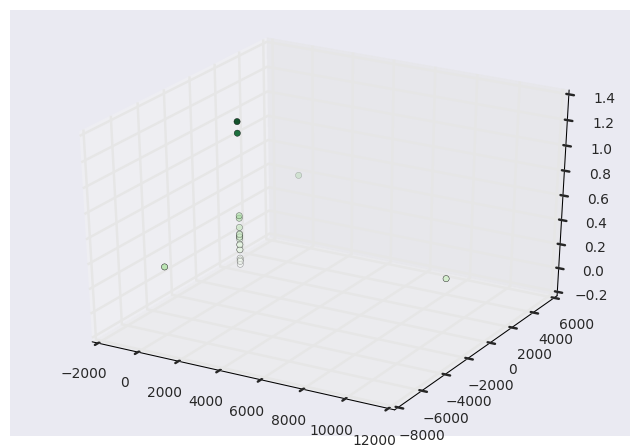

In [77]:
ax = plt.axes(projection='3d')

# Data for a three-dimensional line
#zline = np.linspace(0, 15, 1000)
#xline = np.sin(zline)
#yline = np.cos(zline)
#ax.plot3D(xline, yline, zline, 'gray')

# Data for three-dimensional scattered points
zdata = stimulus_df['theta']
xdata = stimulus_df['tau1']
ydata = stimulus_df['tau2']
   
  
ax.scatter3D(xdata, ydata, zdata, c=zdata, cmap='Greens');
#ax.set_xlim(-1, 1); ax.set_ylim(-1, 1); ax.set_zlim(-1, 1);
plt.show()

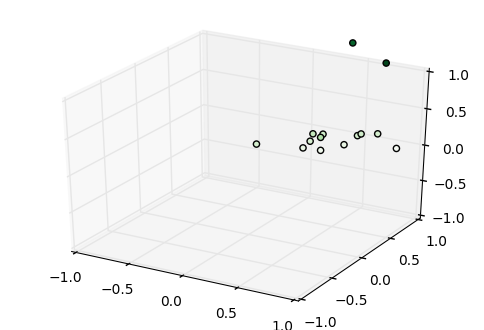

In [57]:
ax = plt.axes(projection='3d')

# Data for a three-dimensional line
#zline = np.linspace(0, 15, 1000)
#xline = np.sin(zline)
#yline = np.cos(zline)
#ax.plot3D(xline, yline, zline, 'gray')

# Data for three-dimensional scattered points
zdata = stimulus_df['theta']
xdata = stimulus_df['tau1']
ydata = stimulus_df['tau2']
   
  
ax.scatter3D(xdata, ydata, zdata, c=zdata, cmap='Greens');
ax.set_xlim(-1, 1); ax.set_ylim(-1, 1); ax.set_zlim(-1, 1);
plt.show()

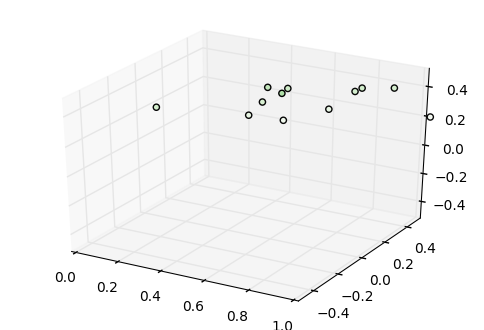

In [69]:
ax = plt.axes(projection='3d')

# Data for a three-dimensional line
#zline = np.linspace(0, 15, 1000)
#xline = np.sin(zline)
#yline = np.cos(zline)
#ax.plot3D(xline, yline, zline, 'gray')

# Data for three-dimensional scattered points
zdata = stimulus_df['theta']
xdata = stimulus_df['tau1']
ydata = stimulus_df['tau2']
   
  
ax.scatter3D(xdata, ydata, zdata, c=zdata, cmap='Greens');
ax.set_xlim(0, 1); ax.set_ylim(-0.5, 0.5); ax.set_zlim(-0.5, 0.5);

#df.apply(ax.annotate(r['x'].astype(str)+'|'+r['y'].astype(str), 
#                                       (r.x*1.02, r.y*1.02)), axis=1)
#for p in ax.scatter3D:
#ax.annotate(str(df.index()), (p.get_x() * 1.005, p.get_height() * 1.005))


plt.show()

In [ ]:
print(__doc__)


# Code source: Gaël Varoquaux
# Modified for documentation by Jaques Grobler
# License: BSD 3 clause

import numpy as np
import matplotlib.pyplot as plt
# Though the following import is not directly being used, it is required
# for 3D projection to work
from mpl_toolkits.mplot3d import Axes3D

from sklearn.cluster import KMeans
from sklearn import datasets

np.random.seed(5)

iris = datasets.load_iris()
X = iris.data
y = iris.target

estimators = [('k_means_iris_8', KMeans(n_clusters=8)),
              ('k_means_iris_3', KMeans(n_clusters=3)),
              ('k_means_iris_bad_init', KMeans(n_clusters=3, n_init=1,
                                               init='random'))]

fignum = 1
titles = ['8 clusters', '3 clusters', '3 clusters, bad initialization']
for name, est in estimators:
    fig = plt.figure(fignum, figsize=(4, 3))
    ax = Axes3D(fig, rect=[0, 0, .95, 1], elev=48, azim=134)
    est.fit(X)
    labels = est.labels_

    ax.scatter(X[:, 3], X[:, 0], X[:, 2],
               c=labels.astype(np.float), edgecolor='k')

    ax.w_xaxis.set_ticklabels([])
    ax.w_yaxis.set_ticklabels([])
    ax.w_zaxis.set_ticklabels([])
    ax.set_xlabel('Petal width')
    ax.set_ylabel('Sepal length')
    ax.set_zlabel('Petal length')
    ax.set_title(titles[fignum - 1])
    ax.dist = 12
    fignum = fignum + 1

# Plot the ground truth
fig = plt.figure(fignum, figsize=(4, 3))
ax = Axes3D(fig, rect=[0, 0, .95, 1], elev=48, azim=134)

for name, label in [('Setosa', 0),
                    ('Versicolour', 1),
                    ('Virginica', 2)]:
    ax.text3D(X[y == label, 3].mean(),
              X[y == label, 0].mean(),
              X[y == label, 2].mean() + 2, name,
              horizontalalignment='center',
              bbox=dict(alpha=.2, edgecolor='w', facecolor='w'))
# Reorder the labels to have colors matching the cluster results
y = np.choose(y, [1, 2, 0]).astype(np.float)
ax.scatter(X[:, 3], X[:, 0], X[:, 2], c=y, edgecolor='k')

ax.w_xaxis.set_ticklabels([])
ax.w_yaxis.set_ticklabels([])
ax.w_zaxis.set_ticklabels([])
ax.set_xlabel('Petal width')
ax.set_ylabel('Sepal length')
ax.set_zlabel('Petal length')
ax.set_title('Ground Truth')
ax.dist = 12

fig.show()

In [75]:
import pandas as pd
import matplotlib.pylab as plt
import seaborn as sns

# Create example dataframe
df = pd.DataFrame


plt.figure(figsize = (15,10))
    
# Data for three-dimensional scattered points
#zdata = stimulus_df['theta']
#xdata = stimulus_df['tau1']
#ydata = stimulus_df['tau2']
   


ax = Axes3D(fig)

# Create scatterplot. alpha controls the opacity and s controls the size.
ax = sns.scatterplot(stimulus_df.theta, stimulus_df.tau1, stimulus_df.tau2, alpha = 0.5)

#ax.set_xlim(0,6)
#ax.set_ylim(-2, 18)
ax.set_xlim(0, 1); ax.set_ylim(-0.5, 0.5); ax.set_zlim(-0.5, 0.5);



#For each point, we add a text inside the bubble
for line in range(0,df.shape[0]):
     ax.text(df.x[line], df.y[line], df.group[line], horizontalalignment='center', size='medium', color='black', weight='semibold')

NameError: name 'fig' is not defined

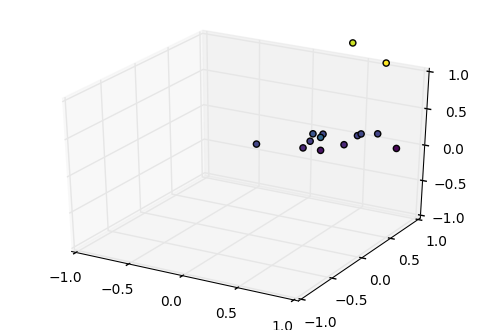

In [60]:
ax = plt.axes(projection='3d')

# Data for a three-dimensional line
#zline = np.linspace(0, 15, 1000)
#xline = np.sin(zline)
#yline = np.cos(zline)
#ax.plot3D(xline, yline, zline, 'gray')

# Data for three-dimensional scattered points
zdata = stimulus_df['theta']
xdata = stimulus_df['tau1']
ydata = stimulus_df['tau2']
   
  
ax.scatter3D(xdata, ydata, zdata, c=zdata, cmap='viridis');
ax.set_xlim(-1, 1); ax.set_ylim(-1, 1); ax.set_zlim(-1, 1);
plt.show()

In [472]:
#stimulus_df = pd.DataFrame({'K1':0,'K2': 0, 'tau1': 0, 'tau2': 0},
#                  index=[0])
stimulus_df = pd.DataFrame()
stimulus = yaw_left_df

for muscle in muscle_list: 
        
        times = np.arange(350)*0.02
        colors = times[150:350]
        x1 = times[150:350]
        x=x1-x1[0]
        muscle_choice = stimulus[muscle]
        y = muscle_choice[150:350]-muscle_choice[150]
        
        popt, pcov = curve_fit(exponential_f, x, y, p0=np.asarray([0.1,0.1,0.25,0.9]), maxfev=200000)
        
        df =pd.DataFrame({'K1': popt[0],'K2': popt[1], 'tau1': popt[2], 'tau2': popt[3]},
                  index=[muscle])
        stimulus_df = stimulus_df.append(df)
        '''
        print("K1 =", popt[0], "+/-", pcov[0,0]**0.5)
        print("k2 =", popt[1], "+/-", pcov[1,1]**0.5)
        print("tau_1 =", popt[2], "+/-", pcov[0,0]**0.5)
        print("tau_2 =", popt[3], "+/-", pcov[1,1]**0.5)

        df =pd.DataFrame({'K1': popt[0],'K2': popt[1], 'tau1': popt[2], 'tau2': popt[3]},
                  index=[muscle])
        #df =pd.DataFrame
    
        df_1.append(df)
        #plt.errorbar(x, y, yerr=e, fmt="none")
        xfine = np.linspace(0.01, 10., 100)  # define values to plot the function for
        plt.plot(xfine, exponential_f(xfine, popt[0], popt[1], popt[2], popt[3]), 'r-')
        plt.plot(x, y, '.')
        plt.xlim(0, 3)
        plt.show()
        '''
stimulus_df.to_csv('yaw_left_constants.csv') 

In [599]:
#stimulus_df = pd.DataFrame({'K1':0,'K2': 0, 'tau1': 0, 'tau2': 0},
#                  index=[0])
stimulus_df = pd.DataFrame()
stimulus = yaw_left_df

for muscle in muscle_list: 
        
        times = np.arange(350)*0.02
        colors = times[175:350]
        x1 = times[175:350]
        x=x1-x1[0]
        muscle_choice = stimulus[muscle]
        y = muscle_choice[175:350]-muscle_choice[175]
        
        popt, pcov = curve_fit(exponential_f, x, y, p0=np.asarray([0.1,0.1,0.25,0.9]), maxfev=200000)
        
        df =pd.DataFrame({'K1': popt[0],'K2': popt[1], 'tau1': popt[2], 'tau2': popt[3]},
                  index=[muscle])
        stimulus_df = stimulus_df.append(df)
        '''
        print("K1 =", popt[0], "+/-", pcov[0,0]**0.5)
        print("k2 =", popt[1], "+/-", pcov[1,1]**0.5)
        print("tau_1 =", popt[2], "+/-", pcov[0,0]**0.5)
        print("tau_2 =", popt[3], "+/-", pcov[1,1]**0.5)

        df =pd.DataFrame({'K1': popt[0],'K2': popt[1], 'tau1': popt[2], 'tau2': popt[3]},
                  index=[muscle])
        #df =pd.DataFrame
    
        df_1.append(df)
        #plt.errorbar(x, y, yerr=e, fmt="none")
        xfine = np.linspace(0.01, 10., 100)  # define values to plot the function for
        plt.plot(xfine, exponential_f(xfine, popt[0], popt[1], popt[2], popt[3]), 'r-')
        plt.plot(x, y, '.')
        plt.xlim(0, 3)
        plt.show()
        '''
stimulus_df.to_csv('yaw_left_constants_minus_delay200.csv') 

In [595]:
stimulus_df

,K1,K2,tau1,tau2
b1_l,-1.985592,-2.002658,0.419115,0.422615
b2_l,94.064111,0.034988,11998.690981,0.995744
b3_l,3.386401,3.416485,2.113523,2.170805
i1_l,31.829067,32.060347,2.965705,3.044294
i2_l,45.934457,47.445231,5.519493,5.813105
iii1_l,8.769530,8.707793,0.430701,0.428868
iii3_l,10.656146,10.356165,3.738748,3.552696
hg1_l,-2.078914,-2.175515,0.496254,0.510635
hg2_l,0.137669,0.001795,2.362053,0.055395
hg3_l,592.937763,174.894306,733.928934,221.877069


('K1 =', 8.6670991947050613, '+/-', 40987.06603851504)
('k2 =', 8.6780266048781254, '+/-', 40987.06482728642)
('tau_1 =', 0.74019264030236431, '+/-', 40987.06603851504)
('tau_2 =', 0.74620872451057341, '+/-', 40987.06482728642)
muscle
b1_l


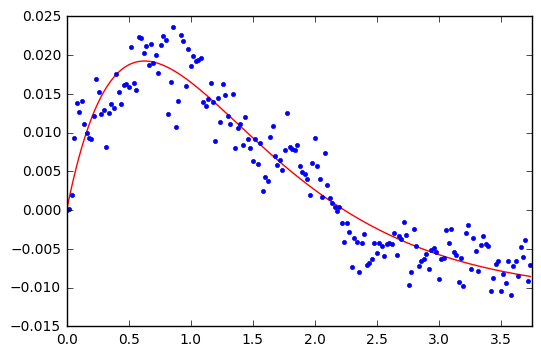

('K1 =', 17.957455122107504, '+/-', 15423.583008872598)
('k2 =', 37.132628100019204, '+/-', 10888.346756875149)
('tau_1 =', 17.531638376561794, '+/-', 15423.583008872598)
('tau_2 =', 38.832032701909775, '+/-', 10888.346756875149)
muscle
b2_l


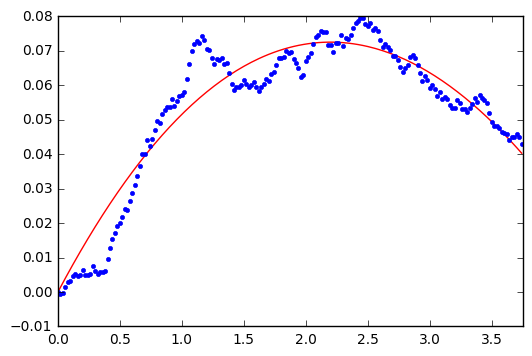

('K1 =', -0.16435466957483413, '+/-', 0.024696165966367985)
('k2 =', -0.14364447452490423, '+/-', 0.024268979711450447)
('tau_1 =', 0.209339034226489, '+/-', 0.024696165966367985)
('tau_2 =', 0.5893360409434959, '+/-', 0.024268979711450447)
muscle
b3_l


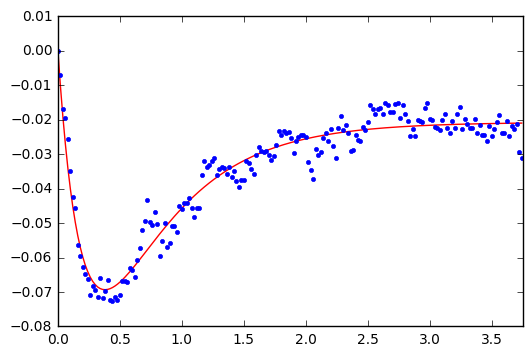

('K1 =', 390.32649710985038, '+/-', 98764.243699114479)
('k2 =', 1319.78307884522, '+/-', 175482.72082697347)
('tau_1 =', 224.28627305696486, '+/-', 98764.243699114479)
('tau_2 =', 765.04240903862546, '+/-', 175482.72082697347)
muscle
i1_l


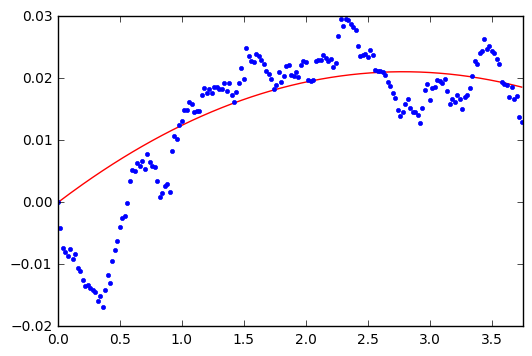

('K1 =', 0.97041445859738873, '+/-', 6817.4812338926977)
('k2 =', 1.0808139790946782, '+/-', 6814.8750368153751)
('tau_1 =', 4.3035871336738305, '+/-', 6817.4812338926977)
('tau_2 =', 4.7728844996005826, '+/-', 6814.8750368153751)
muscle
i2_l


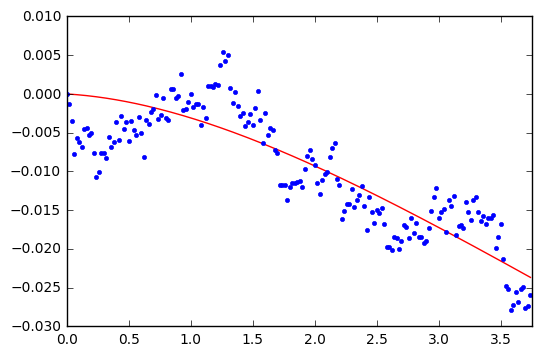

('K1 =', -18.164648750112132, '+/-', nan)
('k2 =', -18.315300076380176, '+/-', nan)
('tau_1 =', 0.45008984135720814, '+/-', nan)
('tau_2 =', 0.45270633598834936, '+/-', nan)
muscle
iii1_l


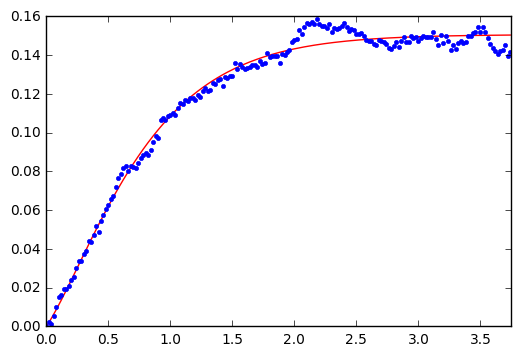

('K1 =', 0.008254231818922474, '+/-', 0.0019331826006043122)
('k2 =', -0.099662045353616113, '+/-', 0.0018074208328135936)
('tau_1 =', 0.035483187084265212, '+/-', 0.0019331826006043122)
('tau_2 =', 0.61150586586145816, '+/-', 0.0018074208328135936)
muscle
iii3_l


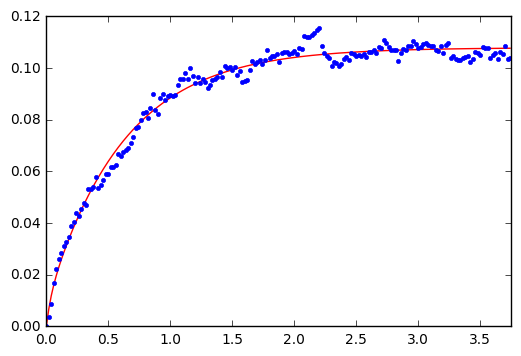

('K1 =', -0.035691542455480792, '+/-', 0.041269223995771466)
('k2 =', -0.05642096126133242, '+/-', 0.041082399966750886)
('tau_1 =', 0.19208310898572445, '+/-', 0.041269223995771466)
('tau_2 =', 0.41404392189674999, '+/-', 0.041082399966750886)
muscle
hg1_l


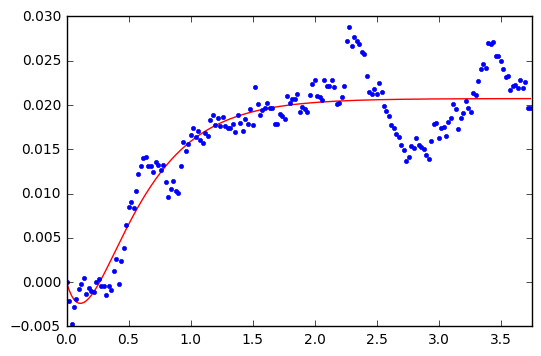

('K1 =', -8.4772765435922857, '+/-', 19551.641017048747)
('k2 =', -8.5465884395922789, '+/-', 19551.641017996561)
('tau_1 =', 0.41890490270059294, '+/-', 19551.641017048747)
('tau_2 =', 0.42131988484960853, '+/-', 19551.641017996561)
muscle
hg2_l


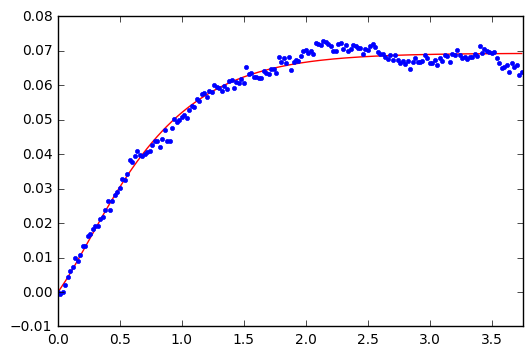

('K1 =', -0.0060849470928928994, '+/-', 0.00085379897008941864)
('k2 =', 35.120060181571233, '+/-', 31570.593524766013)
('tau_1 =', 0.58320542761190075, '+/-', 0.00085379897008941864)
('tau_2 =', 26916.34435389522, '+/-', 31570.593524766013)
muscle
hg3_l


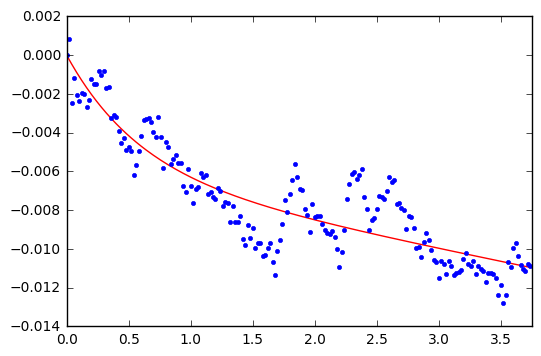

('K1 =', -0.011805718556422078, '+/-', 0.0011931247107898706)
('k2 =', 0.057313499812913123, '+/-', 0.012085663685617943)
('tau_1 =', 0.091170330872518343, '+/-', 0.0011931247107898706)
('tau_2 =', 4.8895082591874219, '+/-', 0.012085663685617943)
muscle
hg4_l


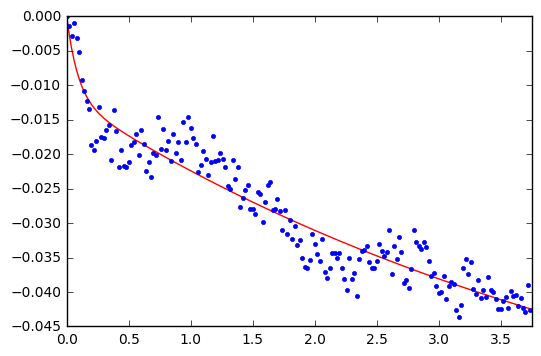

('K1 =', -5.9169340718975416, '+/-', 27613.122487059682)
('k2 =', -5.9405590379276179, '+/-', 27613.120527282477)
('tau_1 =', 0.82279264288921061, '+/-', 27613.122487059682)
('tau_2 =', 0.83105177279701281, '+/-', 27613.120527282477)
muscle
b1_r


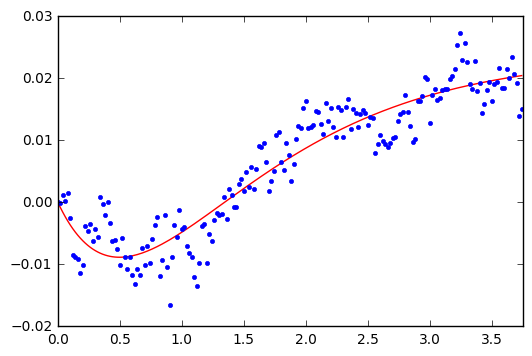

('K1 =', -1.1431871743633015, '+/-', 4153.8636980589654)
('k2 =', -1.1101616706060584, '+/-', 4153.8628009440154)
('tau_1 =', 0.77702258477946295, '+/-', 4153.8636980589654)
('tau_2 =', 0.7884190803398845, '+/-', 4153.8628009440154)
muscle
b2_r


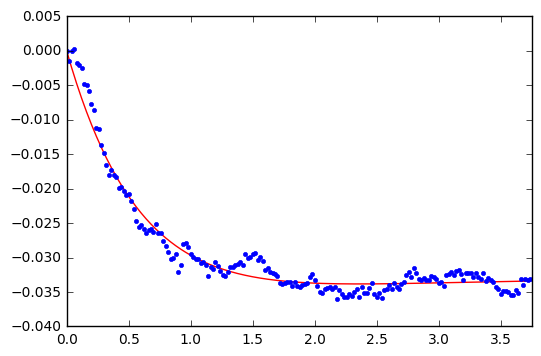

('K1 =', 0.098264041610098704, '+/-', 0.004507016024140653)
('k2 =', 99.474257038805362, '+/-', 76079.972711279159)
('tau_1 =', 0.62062420848219157, '+/-', 0.004507016024140653)
('tau_2 =', 9334.104177030853, '+/-', 76079.972711279159)
muscle
b3_r


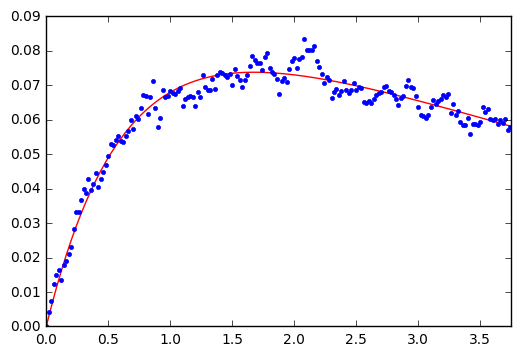

('K1 =', 31.50994089638489, '+/-', 33917.281073564416)
('k2 =', 31.285158979162816, '+/-', 33917.273873490543)
('tau_1 =', 1.1153785923696098, '+/-', 33917.281073564416)
('tau_2 =', 1.1290825279919388, '+/-', 33917.273873490543)
muscle
i1_r


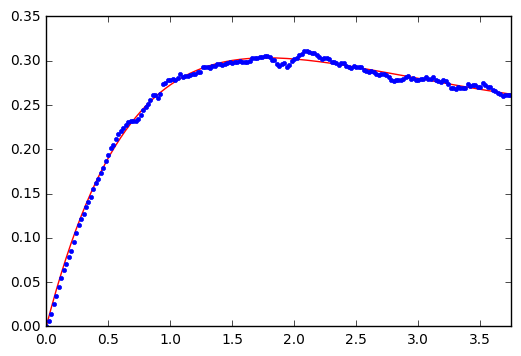

('K1 =', 37.456511723318243, '+/-', nan)
('k2 =', 37.199373482333229, '+/-', nan)
('tau_1 =', 0.66341919216215095, '+/-', nan)
('tau_2 =', 0.66698289830304125, '+/-', nan)
muscle
i2_r


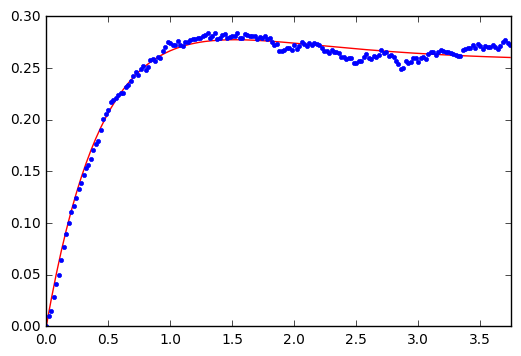

('K1 =', 14.853050444934727, '+/-', nan)
('k2 =', 14.873827227630011, '+/-', nan)
('tau_1 =', 2.0319992769386732, '+/-', nan)
('tau_2 =', 2.0647332259648161, '+/-', nan)
muscle
iii1_r


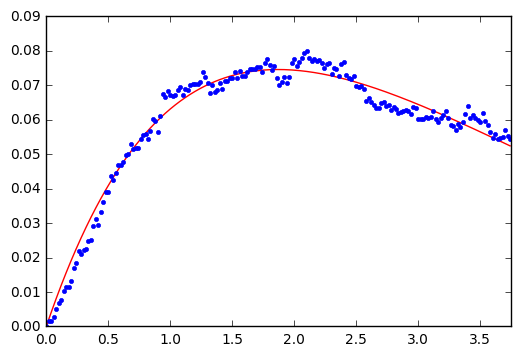

('K1 =', 536.21923649491089, '+/-', 158465.59904184609)
('k2 =', 0.24159673913690244, '+/-', 0.0024011439863453805)
('tau_1 =', 24179.8869101366, '+/-', 158465.59904184609)
('tau_2 =', 0.34121101200364973, '+/-', 0.0024011439863453805)
muscle
iii3_r


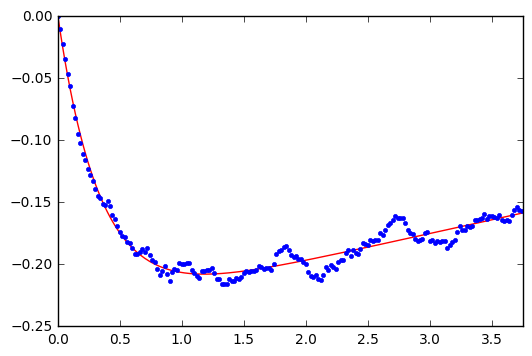

('K1 =', 0.13099061515381533, '+/-', 34335.198850399851)
('k2 =', -0.031599102163786801, '+/-', 34335.199123335784)
('tau_1 =', 0.48848516005122039, '+/-', 34335.198850399851)
('tau_2 =', 0.48847819403738324, '+/-', 34335.199123335784)
muscle
hg1_r


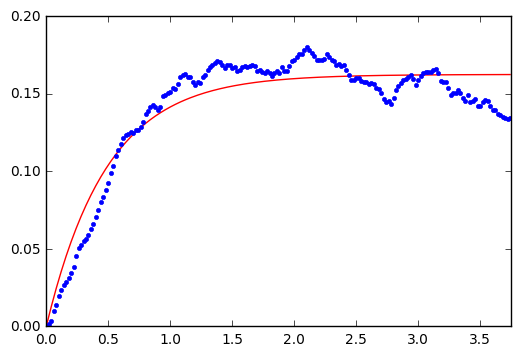

('K1 =', 71.882551586395351, '+/-', 112796.50717279984)
('k2 =', -0.15124510992396964, '+/-', 0.0033708689269251703)
('tau_1 =', 19131.499298998762, '+/-', 112796.50717279984)
('tau_2 =', 0.62517794187165832, '+/-', 0.0033708689269251703)
muscle
hg2_r


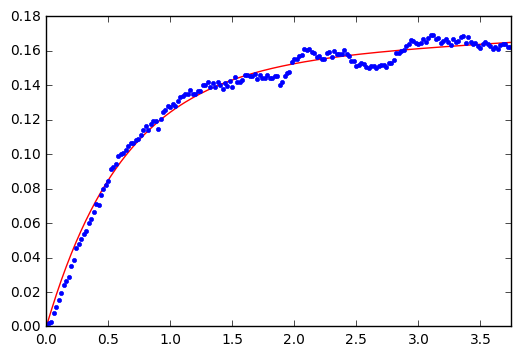

('K1 =', 0.16028996430993964, '+/-', 0.014627606974451)
('k2 =', -0.00447324941690535, '+/-', 0.0013121533228416867)
('tau_1 =', 5.079492928771919, '+/-', 0.014627606974451)
('tau_2 =', 0.088443817716773537, '+/-', 0.0013121533228416867)
muscle
hg3_r


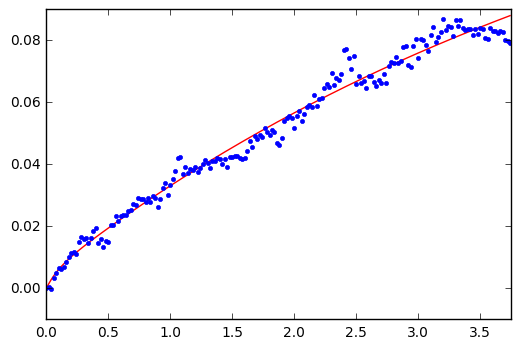

('K1 =', 0.10812277081410243, '+/-', 0.017772553306535394)
('k2 =', 0.18643521264245932, '+/-', 0.37091021428605908)
('tau_1 =', 0.4933681854207555, '+/-', 0.017772553306535394)
('tau_2 =', 10.245980329062624, '+/-', 0.37091021428605908)
muscle
hg4_r


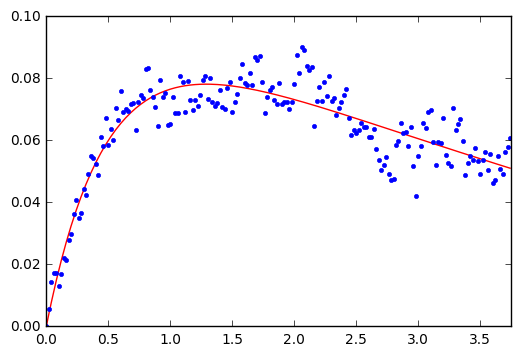

In [632]:
#stimulus_df = pd.DataFrame({'K1':0,'K2': 0, 'tau1': 0, 'tau2': 0},
#                  index=[0])
stimulus_df = pd.DataFrame()
stimulus = yaw_right_df

for muscle in muscle_list: 
        
        times = np.arange(350)*0.02
        colors = times[162:350]
        x1 = times[162:350]
        x=x1-x1[0]
        muscle_choice = stimulus[muscle]
        y = muscle_choice[162:350]-muscle_choice[162]   #from 150
        
        popt, pcov = curve_fit(exponential_f, x, y, p0=np.asarray([0.1,0.1,0.25,0.9]), maxfev=200000)
        
        df =pd.DataFrame({'K1': popt[0],'K2': popt[1], 'tau1': popt[2], 'tau2': popt[3]},
                  index=[muscle])
        stimulus_df = stimulus_df.append(df)
        
        print("K1 =", popt[0], "+/-", pcov[0,0]**0.5)
        print("k2 =", popt[1], "+/-", pcov[1,1]**0.5)
        print("tau_1 =", popt[2], "+/-", pcov[0,0]**0.5)
        print("tau_2 =", popt[3], "+/-", pcov[1,1]**0.5)
        print('muscle')
        print(muscle)

        df =pd.DataFrame({'K1': popt[0],'K2': popt[1], 'tau1': popt[2], 'tau2': popt[3]},
                  index=[muscle])
        #df =pd.DataFrame
    
        df_1.append(df)
        #plt.errorbar(x, y, yerr=e, fmt="none")
        #xfine = np.linspace(0.01, 10., 100)  # define values to plot the function for
        plt.plot(x, exponential_f(x, popt[0], popt[1], popt[2], popt[3]), 'r-')
        plt.plot(x, y, '.')
        plt.xlim(0, 3.75)
        plt.show()
        
stimulus_df.to_csv('yaw_right_constants.csv') 

In [575]:
stimulus_df

,K1,K2,tau1,tau2
b1_l,9.343229,9.359295,1.065784,1.074239
b2_l,2394.611320,8043.843883,261.775049,885.227566
b3_l,24.327530,24.355404,0.617035,0.613712
i1_l,17.050845,17.038317,0.421732,0.420021
i2_l,1.529263,1.596258,2.865755,3.021808
iii1_l,-4952.365291,-1529.090130,578.349441,176.471239
iii3_l,0.068808,-0.068485,0.694531,0.694517
hg1_l,-5.923888,-5.940048,0.372940,0.375674
hg2_l,-14.064042,-14.140168,0.428402,0.430888
hg3_l,-0.008040,45.802124,0.757757,38944.821625


In [609]:
yaw_left_df_c = pd.read_csv('yaw_left_constants.csv')
yaw_right_df_c = pd.read_csv('yaw_right_constants.csv')
pitch_up_df_c = pd.read_csv('pitch_up_constants.csv')
pitch_down_df_c = pd.read_csv('pitch_down_constants.csv')
roll_cw_df_c = pd.read_csv('roll_cw_constants.csv')
roll_ccw_df_c = pd.read_csv('roll_ccw_constants.csv')

In [612]:
yaw_left_df_c .ix[2]

Unnamed: 0         b3_l
K1            0.0517189
K2              61.9298
tau1           0.607986
tau2            9085.66
Name: 2, dtype: object

In [613]:
muscle_list = ('b1_l', 'b2_l', 'b3_l', 'i1_l', 'i2_l', 'iii1_l', 'iii3_l', 'hg1_l', 'hg2_l', 'hg3_l', 'hg4_l', 'b1_r', 'b2_r', 'b3_r', 'i1_r', 'i2_r', 'iii1_r', 'iii3_r', 'hg1_r', 'hg2_r', 'hg3_r', 'hg4_r')

In [ ]:

muscle_list = ('b1_l', 'b2_l', 'b3_l', 'i1_l', 'i2_l', 'iii1_l', 'iii3_l', 'hg1_l', 'hg2_l', 'hg3_l', 'hg4_l', 'b1_r', 'b2_r', 'b3_r', 'i1_r', 'i2_r', 'iii1_r', 'iii3_r', 'hg1_r', 'hg2_r', 'hg3_r', 'hg4_r')
muscle_assign = ('R', 'B', 'R', 'B', 'R', 'B', 'R', 'B', 'R', 'R', 'R', 'R', 'B', 'R', 'B', 'R', 'B', 'R', 'B', 'R', 'R', 'R')

counter = 0
fig = plt.figure()

for muscle in muscle_list:
    x = yaw_left_df_c.ix[counter]['tau1']
    y = yaw_left_df_c.ix[counter]['tau2']
    plt.scatter(x, y, color = muscle_assign[counter])
    counter = counter + 1
    
plt.show()
 


In [619]:
muscle_assign = ('R', 'B', 'R', 'B', 'R', 'B', 'R', 'B', 'R', 'R', 'R', 'R', 'B', 'R', 'B', 'R', 'B', 'R', 'B', 'R', 'R', 'R')

In [620]:
yaw_left_df_c .ix[2]['K1']

0.051718873994800005

In [614]:
len (muscle_list)

22

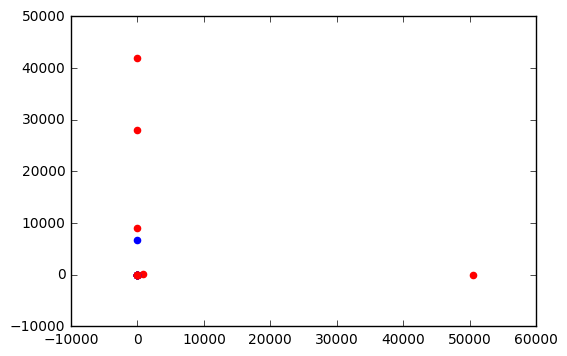

In [625]:
counter = 0
fig = plt.figure()

for muscle in muscle_list:
    x = yaw_left_df_c.ix[counter]['tau1']
    y = yaw_left_df_c.ix[counter]['tau2']
    plt.scatter(x, y, color = muscle_assign[counter])
    counter = counter + 1
    
plt.show()
 

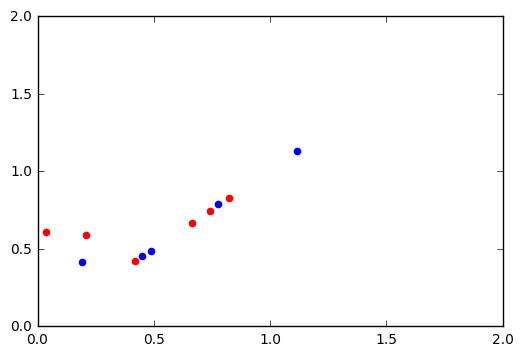

In [634]:
counter = 0
fig = plt.figure()

for muscle in muscle_list:
    x = yaw_right_df_c.ix[counter]['tau1']
    y = yaw_right_df_c.ix[counter]['tau2']
    plt.scatter(x, y, color = muscle_assign[counter])
    counter = counter + 1

plt.xlim(0, 2)    
plt.ylim(0, 2)  
plt.show()
 

Add the delay parameter
Use time to peak 
piecemeal approach to modeling --  constant plus delay to tanught  -- 2 more free parameters

tanguht as inflection point to double exponential 

maybe bound arbitrary k terms, to further normalize tau values 
multidimentional cluster of tau1, tau2, and tnaught 

facile 

In [491]:
#stimulus_df = pd.DataFrame({'K1':0,'K2': 0, 'tau1': 0, 'tau2': 0},
#                  index=[0])
stimulus_df = pd.DataFrame()
stimulus = pitch_up_df

for muscle in muscle_list: 
        
        times = np.arange(350)*0.02
        colors = times[150:350]
        x1 = times[150:350]
        x=x1-x1[0]
        muscle_choice = stimulus[muscle]
        y = muscle_choice[150:350]-muscle_choice[150]
        
        popt, pcov = curve_fit(exponential_f, x, y, p0=np.asarray([0.1,0.1,0.25,0.9]), maxfev=200000)
        
        df =pd.DataFrame({'K1': popt[0],'K2': popt[1], 'tau1': popt[2], 'tau2': popt[3]},
                  index=[muscle])
        stimulus_df = stimulus_df.append(df)
        '''
        print("K1 =", popt[0], "+/-", pcov[0,0]**0.5)
        print("k2 =", popt[1], "+/-", pcov[1,1]**0.5)
        print("tau_1 =", popt[2], "+/-", pcov[0,0]**0.5)
        print("tau_2 =", popt[3], "+/-", pcov[1,1]**0.5)

        df =pd.DataFrame({'K1': popt[0],'K2': popt[1], 'tau1': popt[2], 'tau2': popt[3]},
                  index=[muscle])
        #df =pd.DataFrame
    
        df_1.append(df)
        #plt.errorbar(x, y, yerr=e, fmt="none")
        xfine = np.linspace(0.01, 10., 100)  # define values to plot the function for
        plt.plot(xfine, exponential_f(xfine, popt[0], popt[1], popt[2], popt[3]), 'r-')
        plt.plot(x, y, '.')
        plt.xlim(0, 3)
        plt.show()
        '''
stimulus_df.to_csv('pitch_up_constants.csv') 

In [492]:
stimulus_df

,K1,K2,tau1,tau2
b1_l,0.205235,0.185215,0.327820,0.361908
b2_l,46.700512,28.162824,33.071208,19.747714
b3_l,9.361362,9.401952,0.198410,0.199852
i1_l,12.656147,12.590547,1.132028,1.112830
i2_l,46.550533,46.430883,0.614470,0.611863
iii1_l,258.586391,0.052470,18732.329418,1.377377
iii3_l,2.413915,2.396302,0.115434,0.114352
hg1_l,599.261508,0.046442,40022.609971,0.433032
hg2_l,0.114192,0.015395,3.018998,0.277060
hg3_l,0.026808,0.009287,2.834748,0.152392


In [485]:
#stimulus_df = pd.DataFrame({'K1':0,'K2': 0, 'tau1': 0, 'tau2': 0},
#                  index=[0])
stimulus_df = pd.DataFrame()
stimulus = pitch_down_df

for muscle in muscle_list: 
        
        times = np.arange(350)*0.02
        colors = times[150:350]
        x1 = times[150:350]
        x=x1-x1[0]
        muscle_choice = stimulus[muscle]
        y = muscle_choice[150:350]-muscle_choice[150]
        
        popt, pcov = curve_fit(exponential_f, x, y, p0=np.asarray([0.1,0.1,0.25,0.9]), maxfev=200000)
        
        df =pd.DataFrame({'K1': popt[0],'K2': popt[1], 'tau1': popt[2], 'tau2': popt[3]},
                  index=[muscle])
        stimulus_df = stimulus_df.append(df)
        '''
        print("K1 =", popt[0], "+/-", pcov[0,0]**0.5)
        print("k2 =", popt[1], "+/-", pcov[1,1]**0.5)
        print("tau_1 =", popt[2], "+/-", pcov[0,0]**0.5)
        print("tau_2 =", popt[3], "+/-", pcov[1,1]**0.5)

        df =pd.DataFrame({'K1': popt[0],'K2': popt[1], 'tau1': popt[2], 'tau2': popt[3]},
                  index=[muscle])
        #df =pd.DataFrame
    
        df_1.append(df)
        #plt.errorbar(x, y, yerr=e, fmt="none")
        xfine = np.linspace(0.01, 10., 100)  # define values to plot the function for
        plt.plot(xfine, exponential_f(xfine, popt[0], popt[1], popt[2], popt[3]), 'r-')
        plt.plot(x, y, '.')
        plt.xlim(0, 3)
        plt.show()
        '''
stimulus_df.to_csv('pitch_down_constants.csv') 

In [486]:
#stimulus_df = pd.DataFrame({'K1':0,'K2': 0, 'tau1': 0, 'tau2': 0},
#                  index=[0])
stimulus_df = pd.DataFrame()
stimulus = roll_cw_df

for muscle in muscle_list: 
        
        times = np.arange(350)*0.02
        colors = times[150:350]
        x1 = times[150:350]
        x=x1-x1[0]
        muscle_choice = stimulus[muscle]
        y = muscle_choice[150:350]-muscle_choice[150]
        
        popt, pcov = curve_fit(exponential_f, x, y, p0=np.asarray([0.1,0.1,0.25,0.9]), maxfev=200000)
        
        df =pd.DataFrame({'K1': popt[0],'K2': popt[1], 'tau1': popt[2], 'tau2': popt[3]},
                  index=[muscle])
        stimulus_df = stimulus_df.append(df)
        '''
        print("K1 =", popt[0], "+/-", pcov[0,0]**0.5)
        print("k2 =", popt[1], "+/-", pcov[1,1]**0.5)
        print("tau_1 =", popt[2], "+/-", pcov[0,0]**0.5)
        print("tau_2 =", popt[3], "+/-", pcov[1,1]**0.5)

        df =pd.DataFrame({'K1': popt[0],'K2': popt[1], 'tau1': popt[2], 'tau2': popt[3]},
                  index=[muscle])
        #df =pd.DataFrame
    
        df_1.append(df)
        #plt.errorbar(x, y, yerr=e, fmt="none")
        xfine = np.linspace(0.01, 10., 100)  # define values to plot the function for
        plt.plot(xfine, exponential_f(xfine, popt[0], popt[1], popt[2], popt[3]), 'r-')
        plt.plot(x, y, '.')
        plt.xlim(0, 3)
        plt.show()
        '''
stimulus_df.to_csv('roll_cw_constants.csv') 

In [488]:
stimulus_df

,K1,K2,tau1,tau2
b1_l,0.025318,0.007358,0.568736,0.064545
b2_l,0.894813,0.976394,4.418486,5.149921
b3_l,0.008012,0.065276,0.053992,1.516629
i1_l,0.687177,0.731370,0.666405,0.639275
i2_l,0.106482,0.140602,0.119202,0.223458
iii1_l,-0.023645,-0.038926,0.541919,2.594354
iii3_l,-0.006539,-21.920181,0.592670,10591.506433
hg1_l,-4.310735,-4.298330,0.770281,0.777466
hg2_l,0.110436,0.013462,4.485289,0.442811
hg3_l,0.210948,0.006153,5.675533,0.077954


In [489]:
#stimulus_df = pd.DataFrame({'K1':0,'K2': 0, 'tau1': 0, 'tau2': 0},
#                  index=[0])
stimulus_df = pd.DataFrame()
stimulus = roll_ccw_df

for muscle in muscle_list: 
        
        times = np.arange(350)*0.02
        colors = times[150:350]
        x1 = times[150:350]
        x=x1-x1[0]
        muscle_choice = stimulus[muscle]
        y = muscle_choice[150:350]-muscle_choice[150]
        
        popt, pcov = curve_fit(exponential_f, x, y, p0=np.asarray([0.1,0.1,0.25,0.9]), maxfev=200000)
        
        df =pd.DataFrame({'K1': popt[0],'K2': popt[1], 'tau1': popt[2], 'tau2': popt[3]},
                  index=[muscle])
        stimulus_df = stimulus_df.append(df)
        '''
        print("K1 =", popt[0], "+/-", pcov[0,0]**0.5)
        print("k2 =", popt[1], "+/-", pcov[1,1]**0.5)
        print("tau_1 =", popt[2], "+/-", pcov[0,0]**0.5)
        print("tau_2 =", popt[3], "+/-", pcov[1,1]**0.5)

        df =pd.DataFrame({'K1': popt[0],'K2': popt[1], 'tau1': popt[2], 'tau2': popt[3]},
                  index=[muscle])
        #df =pd.DataFrame
    
        df_1.append(df)
        #plt.errorbar(x, y, yerr=e, fmt="none")
        xfine = np.linspace(0.01, 10., 100)  # define values to plot the function for
        plt.plot(xfine, exponential_f(xfine, popt[0], popt[1], popt[2], popt[3]), 'r-')
        plt.plot(x, y, '.')
        plt.xlim(0, 3)
        plt.show()
        '''
stimulus_df.to_csv('roll_ccw_constants.csv') 

In [490]:
stimulus_df

,K1,K2,tau1,tau2
b1_l,0.012009,0.023367,0.183740,0.183723
b2_l,2.677458,2.678640,0.678072,0.681881
b3_l,-0.669515,-0.686639,0.396503,0.402516
i1_l,0.109209,-0.055562,8.084913,8.087457
i2_l,0.115459,0.013369,3.025123,0.219073
iii1_l,0.643082,0.645505,0.202292,0.198750
iii3_l,9.451668,9.516070,0.745320,0.751404
hg1_l,2.960754,2.947005,0.903509,0.886478
hg2_l,0.027460,0.010930,0.573293,0.098697
hg3_l,-0.003980,4.137972,0.835042,17606.683234


('K1 =', 562.21322257154168, '+/-', 19784097.590519726)
('k2 =', -608.28125837615016, '+/-', 18882888.306884415)
('tau_1 =', 56506.299055044408, '+/-', 19784097.590519726)
('tau_2 =', 53937.179906925347, '+/-', 18882888.306884415)


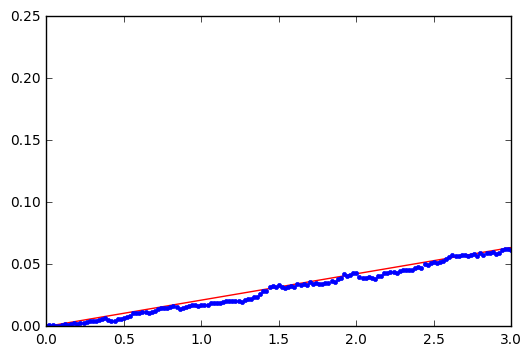

In [566]:
        stimulus = yaw_left_df
        muscle = 'hg3_l'
        
        times = np.arange(350)*0.02
        colors = times[150:350]
        x1 = times[150:350]
        x=x1-x1[0]
        muscle_choice = stimulus[muscle]
        y = muscle_choice[150:350]-muscle_choice[150]
        
        popt, pcov = curve_fit(exponential_f, x, y, p0=np.asarray([0.01,0.07,0.25,0.9]), maxfev=20000)

        print("K1 =", popt[0], "+/-", pcov[0,0]**0.5)
        print("k2 =", popt[1], "+/-", pcov[1,1]**0.5)
        print("tau_1 =", popt[2], "+/-", pcov[0,0]**0.5)
        print("tau_2 =", popt[3], "+/-", pcov[1,1]**0.5)

        df =pd.DataFrame({'K1': popt[0],'K2': popt[1], 'tau1': popt[2], 'tau2': popt[3]},
                  index=[muscle])
        #df =pd.DataFrame
    
        df_1.append(df)
        #plt.errorbar(x, y, yerr=e, fmt="none")
        xfine = np.linspace(0.01, 10., 200)  # define values to plot the function for
        plt.plot(xfine, exponential_f(xfine, popt[0], popt[1], popt[2], popt[3]), 'r-')
        plt.plot(x, y, '.')
        plt.xlim(0, 3)
        plt.show()
        

('K1 =', -2.0884803059732375, '+/-', 4571.1348826070325)
('k2 =', -2.1060915849784458, '+/-', 4571.1343981490572)
('tau_1 =', 0.47090291669793893, '+/-', 4571.1348826070325)
('tau_2 =', 0.47850083957449618, '+/-', 4571.1343981490572)


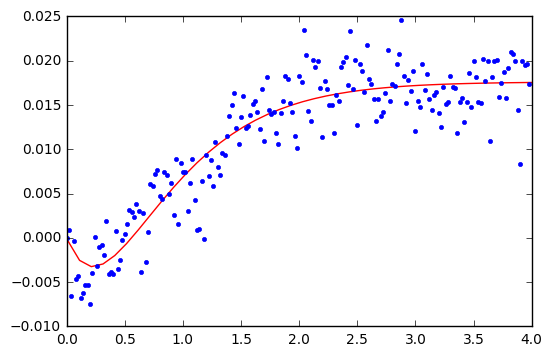

('K1 =', 4.7422945033763462, '+/-', 28441.402009803784)
('k2 =', 4.761506574312957, '+/-', 28441.402021325095)
('tau_1 =', 0.26605662468142194, '+/-', 28441.402009803784)
('tau_2 =', 0.2675991283258945, '+/-', 28441.402021325095)


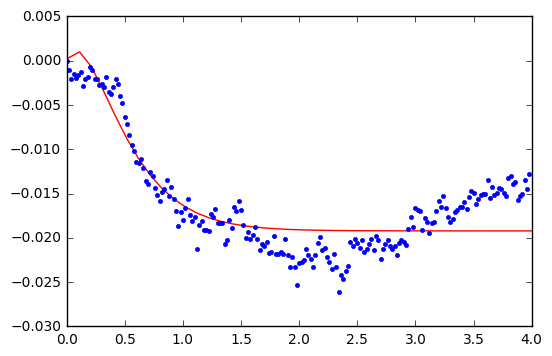

('K1 =', 1.9425371798016373, '+/-', 1178.1747001588933)
('k2 =', 1.9077845072447752, '+/-', 1178.1596486724063)
('tau_1 =', 1.2567976765843552, '+/-', 1178.1747001588933)
('tau_2 =', 1.3161113536279012, '+/-', 1178.1596486724063)


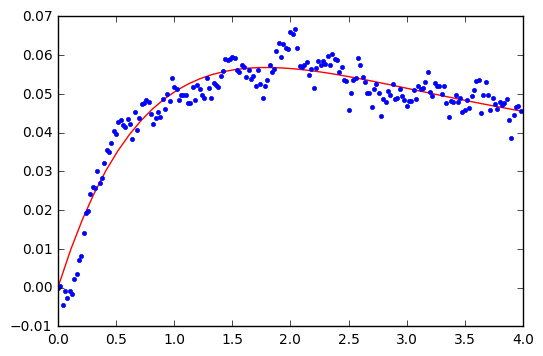

('K1 =', 0.11304516550240218, '+/-', 72048.241829587467)
('k2 =', -0.1720443186303747, '+/-', 72048.241018808825)
('tau_1 =', 0.94780780987615931, '+/-', 72048.241829587467)
('tau_2 =', 0.94783296966942965, '+/-', 72048.241018808825)


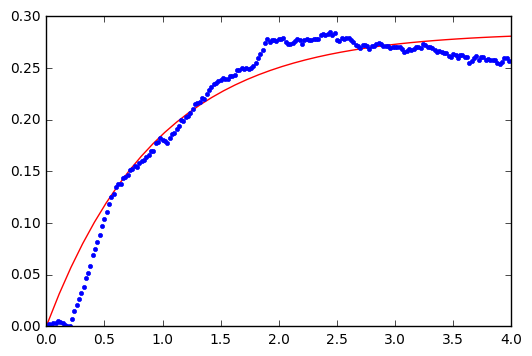

('K1 =', 0.10706706587117773, '+/-', 57302.365761419496)
('k2 =', -0.1638539784335554, '+/-', 57302.365743051938)
('tau_1 =', 0.81775376413823864, '+/-', 57302.365761419496)
('tau_2 =', 0.81777687388114495, '+/-', 57302.365743051938)


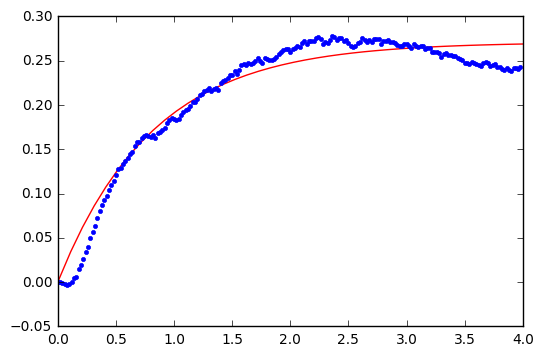

('K1 =', 15.087853521913068, '+/-', nan)
('k2 =', 15.002787151069469, '+/-', nan)
('tau_1 =', 0.44763801961829042, '+/-', nan)
('tau_2 =', 0.44472956092790561, '+/-', nan)


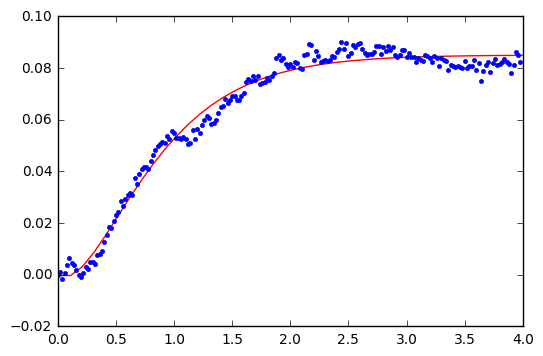

('K1 =', -0.046574995320444942, '+/-', 50937.808315331138)
('k2 =', 0.15670939077524934, '+/-', 50937.808394676016)
('tau_1 =', 0.41406620619780771, '+/-', 50937.808315331138)
('tau_2 =', 0.41406272534080657, '+/-', 50937.808394676016)


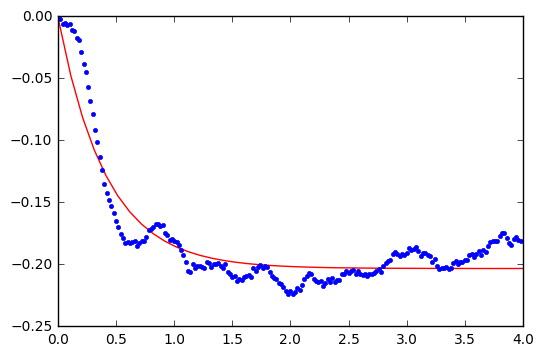

('K1 =', -0.13365955347288216, '+/-', 0.047901428484445299)
('k2 =', -0.2604585203418151, '+/-', 0.047307890277697252)
('tau_1 =', 0.32557209380238533, '+/-', 0.047901428484445299)
('tau_2 =', 0.71445490489815622, '+/-', 0.047307890277697252)


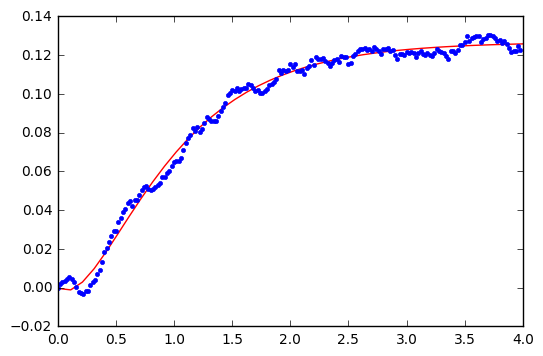

('K1 =', 0.16972912073174407, '+/-', 0.0014005059134754006)
('k2 =', 0.0097942833849975017, '+/-', 0.001103674988082828)
('tau_1 =', 2.3089366361395074, '+/-', 0.0014005059134754006)
('tau_2 =', 0.095801044374574609, '+/-', 0.001103674988082828)


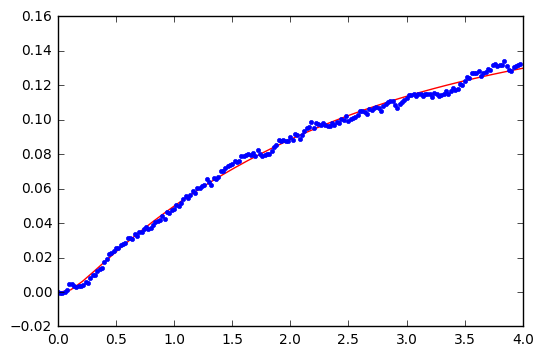

('K1 =', 610.29330791058192, '+/-', 31142.078806200498)
('k2 =', 180.86101064665661, '+/-', 26028.336446555702)
('tau_1 =', 649.68978404565792, '+/-', 31142.078806200498)
('tau_2 =', 195.95243497080685, '+/-', 26028.336446555702)


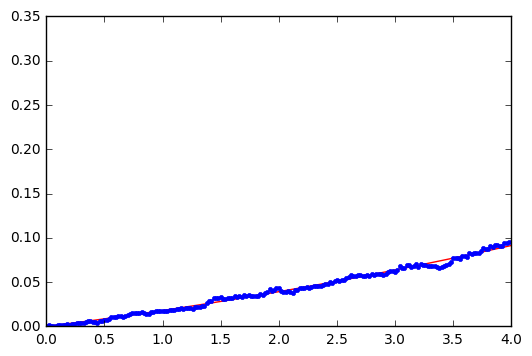

('K1 =', 7.3105617837913783, '+/-', 58777.490906318802)
('k2 =', 7.3144471374804381, '+/-', 58777.485026192095)
('tau_1 =', 1.1316190064357912, '+/-', 58777.490906318802)
('tau_2 =', 1.1429546211204586, '+/-', 58777.485026192095)


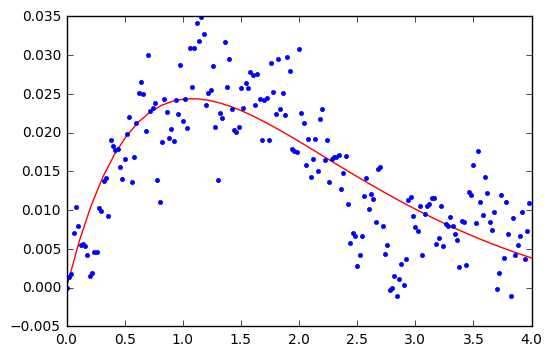

('K1 =', 2.7030353644012277, '+/-', 24514.324646930301)
('k2 =', 2.7377582078030396, '+/-', 24514.316476610617)
('tau_1 =', 1.3612516600375459, '+/-', 24514.324646930301)
('tau_2 =', 1.3796149485995635, '+/-', 24514.316476610617)


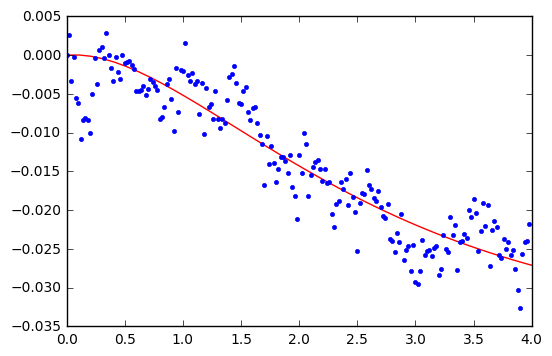

('K1 =', 12.058620700947371, '+/-', 42602.234212750533)
('k2 =', 14.046573660322943, '+/-', 42472.687369726998)
('tau_1 =', 10.633175404306469, '+/-', 42602.234212750533)
('tau_2 =', 12.875587124228447, '+/-', 42472.687369726998)


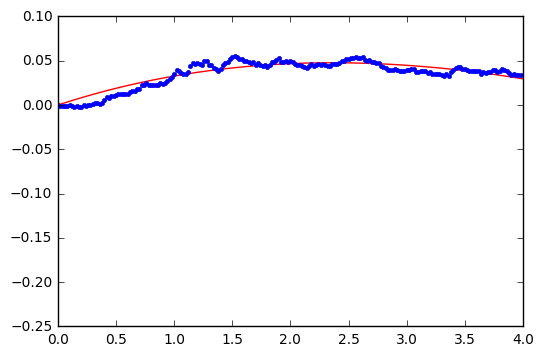

('K1 =', -0.12402819594941326, '+/-', 0.040934379112085015)
('k2 =', -0.11338735839332306, '+/-', 0.036891802753859823)
('tau_1 =', 0.44321225442710904, '+/-', 0.040934379112085015)
('tau_2 =', 1.3712036613602121, '+/-', 0.036891802753859823)


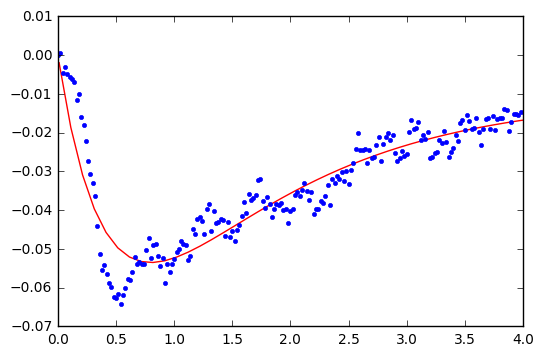

('K1 =', 15.467064359434023, '+/-', nan)
('k2 =', 15.430258705767708, '+/-', nan)
('tau_1 =', 0.64547503943036155, '+/-', nan)
('tau_2 =', 0.64107866170123429, '+/-', nan)


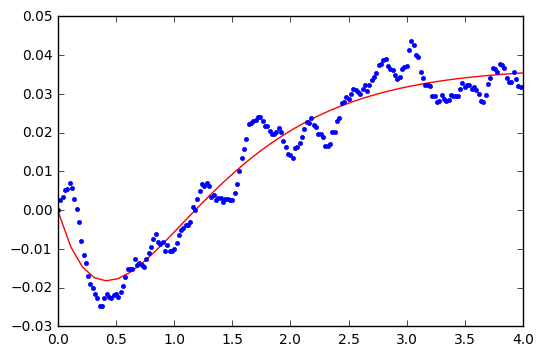

('K1 =', 22.741072125481594, '+/-', 48988.219408196273)
('k2 =', 22.627108170110077, '+/-', 48988.220131367794)
('tau_1 =', 0.63145278789780857, '+/-', 48988.219408196273)
('tau_2 =', 0.62773645019163848, '+/-', 48988.220131367794)


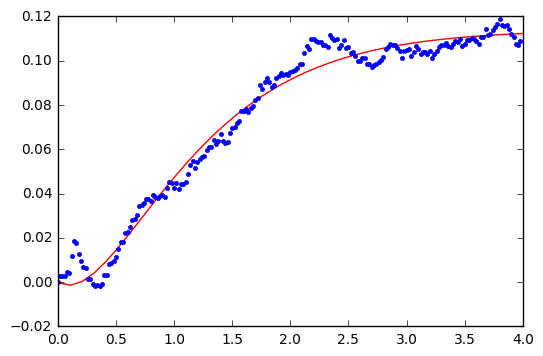

('K1 =', 2538.1612056206563, '+/-', 166792.37491822883)
('k2 =', 8637.6383198214517, '+/-', 313461.05816755944)
('tau_1 =', 336.72036514147476, '+/-', 166792.37491822883)
('tau_2 =', 1154.2929082759911, '+/-', 313461.05816755944)


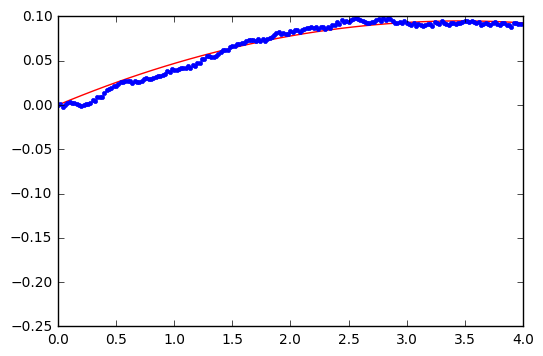

('K1 =', 0.11509738221327241, '+/-', 31455.730926445904)
('k2 =', 0.02746744945058081, '+/-', 31455.730628013589)
('tau_1 =', 0.75682131140544329, '+/-', 31455.730926445904)
('tau_2 =', 0.75680980363432127, '+/-', 31455.730628013589)


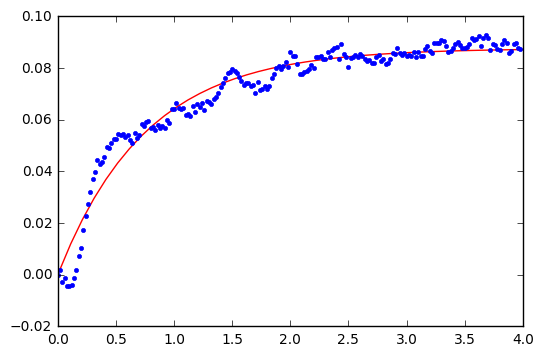

('K1 =', -5.8977387932626328, '+/-', 10164.631589639563)
('k2 =', -5.9434463527327601, '+/-', 10164.630581246518)
('tau_1 =', 0.7031727369176114, '+/-', 10164.631589639563)
('tau_2 =', 0.71190128730106816, '+/-', 10164.630581246518)


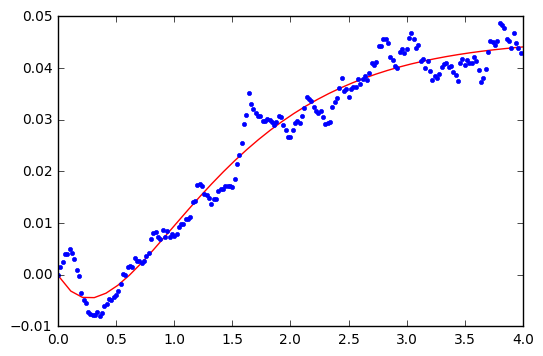

('K1 =', 21.657951995047217, '+/-', nan)
('k2 =', 21.559833587924484, '+/-', nan)
('tau_1 =', 0.63676602845609875, '+/-', nan)
('tau_2 =', 0.63344634771403885, '+/-', nan)


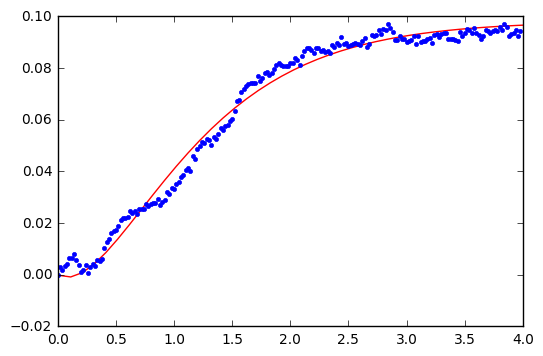

('K1 =', -0.0088257219165376061, '+/-', 0.013335295048555018)
('k2 =', 0.0066387216132515409, '+/-', 0.016959232963294244)
('tau_1 =', 2.0619241565090363, '+/-', 0.013335295048555018)
('tau_2 =', 0.63314026617740271, '+/-', 0.016959232963294244)


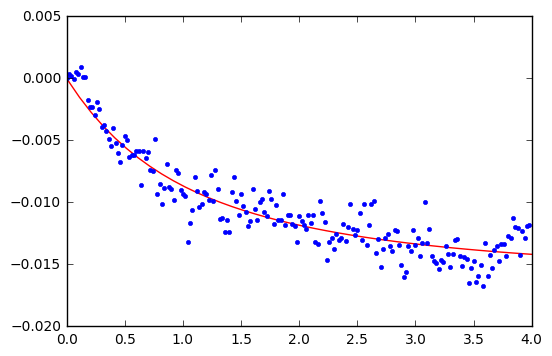

('K1 =', -0.024966782692623261, '+/-', 0.0010252811229309884)
('k2 =', 250.05979364098346, '+/-', 78188.822727168299)
('tau_1 =', 0.29868607730786334, '+/-', 0.0010252811229309884)
('tau_2 =', 20268.667559700469, '+/-', 78188.822727168299)


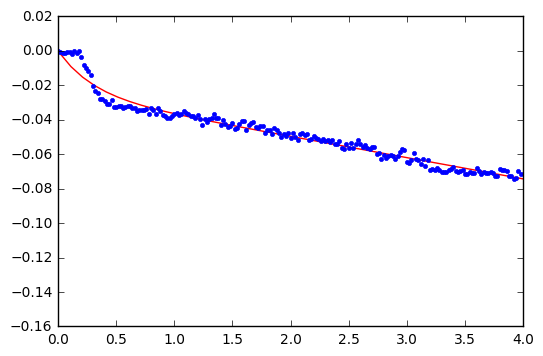

TypeError: Could not compare [None] with block values

In [600]:
for stimulus in stimuli_list:
    df_1 = pd.DataFrame()
    for muscle in muscle_list: 
        
        times = np.arange(350)*0.02
        colors = times[150:350]
        x1 = times[150:350]
        x=x1-x1[0]
        muscle_choice = stimulus[muscle]
        y = muscle_choice[150:350]-muscle_choice[150]
        
        popt, pcov = curve_fit(exponential_f, x, y, p0=np.asarray([0.09,0.07,0.25,0.9]), maxfev=20000)

        print("K1 =", popt[0], "+/-", pcov[0,0]**0.5)
        print("k2 =", popt[1], "+/-", pcov[1,1]**0.5)
        print("tau_1 =", popt[2], "+/-", pcov[0,0]**0.5)
        print("tau_2 =", popt[3], "+/-", pcov[1,1]**0.5)

        df =pd.DataFrame({'K1': popt[0],'K2': popt[1], 'tau1': popt[2], 'tau2': popt[3]},
                  index=[muscle])
        #df =pd.DataFrame
    
        df_1.append(df)
        #plt.errorbar(x, y, yerr=e, fmt="none")
        xfine = np.linspace(0.01, 10., 100)  # define values to plot the function for
        plt.plot(xfine, exponential_f(xfine, popt[0], popt[1], popt[2], popt[3]), 'r-')
        plt.plot(x, y, '.')
        plt.xlim(0, 4)
        plt.show()
    df_1.to_csv('constants' + '%s' + '.csv')  %(stimulus)

,K1,K2,tau1,tau2
hg4_r,-0.024967,250.059794,0.298686,20268.66756


('K1 =', 4.7422945033763462, '+/-', 28441.402009803784)
('k2 =', 4.761506574312957, '+/-', 28441.402021325095)
('tau_1 =', 0.26605662468142194, '+/-', 28441.402009803784)
('tau_2 =', 0.2675991283258945, '+/-', 28441.402021325095)
('Parameters', array([-6.54690563, -7.06954683,  8.16637392,  9.05811593]))
('RMSE:', 0.0017408456064120037)
('R-squared:', 0.92272948265522325)
()


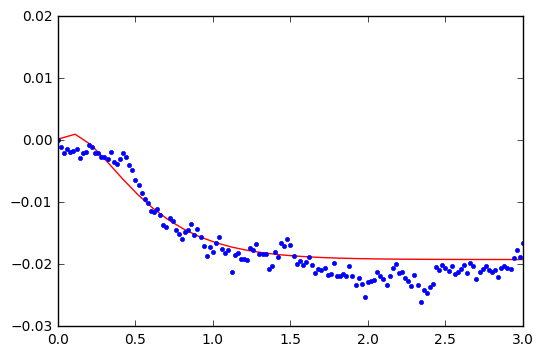

In [415]:
#### edit this method and incorportate into massive figure 

import numpy, scipy, matplotlib
import matplotlib.pyplot as plt
from scipy.optimize import curve_fit
from scipy.optimize import differential_evolution
import warnings

yaw_left_df = pd.read_csv('yaw_left_df_nrm.csv')
yaw_right_df = pd.read_csv('yaw_right_df_nrm.csv')
pitch_up_df = pd.read_csv('pitch_up_df_nrm.csv')
pitch_down_df = pd.read_csv('pitch_down_df_nrm.csv')
roll_cw_df = pd.read_csv('roll_cw_df_nrm.csv')
roll_ccw_df = pd.read_csv('roll_ccw_df_nrm.csv')


times = np.arange(350)*0.02

colors = times[150:350]

#plt.plot(times,yaw_left_df['i1_l'],clip_on = False,color = 'b')

x1 = times[150:350]
x=x1-x1[0]

muscle_choice = yaw_left_df['b2_l']

y = muscle_choice[150:350]-muscle_choice[150]


# power law function
#def func_power_law(x,a,b,c):
#    return a*(x**b)+c

def exponential_f(t, K1, K2, tau1, tau2):
    return K1*(1-math.e**(-t/tau1)) - K2*(1-math.e**(-(t)/tau2))
    #K1*(1-math.e**(-t/tau1)) - K2*(math.e**((t)/tau2))
    
def exponential_fit(t, parameters):
    K1 = parameters[0]
    K2 = parameters[1]
    tau1= parameters[2]
    tau2 = parameters[3]
    return K1*(1-math.e**(-t/tau1)) - K2*(1-math.e**(-(t)/tau2))
    #K1*(1-math.e**(-t/tau1)) - K2*(math.e**((t)/tau2))


# function for genetic algorithm to minimize (sum of squared error)
def sumOfSquaredError(parameterTuple):
    warnings.filterwarnings("ignore") # do not print warnings by genetic algorithm
    val = exponential_f(x, *parameterTuple)
    return numpy.sum((y - val) ** 2.0)


def generate_Initial_Parameters():
    # min and max used for bounds
    #maxK = max(100)
    #minK = min(-10)
    #maxtau = max(100)
    #mintau = min(-10)
    #maxXY = max(maxK, maxtau)
    maxXY = 50

    parameterBounds = []
    parameterBounds.append([-10, 10]) # seach bounds for k1
    parameterBounds.append([-10, 10]) # seach bounds for k2
    parameterBounds.append([-10, 10]) # seach bounds for tau1
    parameterBounds.append([-10, 10]) # seach bounds for tau2

    # "seed" the numpy random number generator for repeatable results
    result = differential_evolution(sumOfSquaredError, parameterBounds, seed=0)
    return result.x

# generate initial parameter values
geneticParameters = generate_Initial_Parameters()

# curve fit the test data
fittedParameters, pcov = curve_fit(exponential_f, x, y, geneticParameters, maxfev = 10000)


#popt, pcov = curve_fit(exponential_f, x, y, geneticParameters, maxfev=10000, bounds=(-10, [100., 100., 100., 100.]))

popt, pcov = curve_fit(exponential_f, x, y, p0=np.asarray([0.09,0.07,0.25,0.9]), maxfev=20000)

#K1 = 0.09
#K2 = 0.07
#tau1 = .25
#tau2 = .9

print("K1 =", popt[0], "+/-", pcov[0,0]**0.5)
print("k2 =", popt[1], "+/-", pcov[1,1]**0.5)
print("tau_1 =", popt[2], "+/-", pcov[0,0]**0.5)
print("tau_2 =", popt[3], "+/-", pcov[1,1]**0.5)


print('Parameters', fittedParameters)

modelPredictions = exponential_f(x, *fittedParameters) 

absError = modelPredictions - y

SE = numpy.square(absError) # squared errors
MSE = numpy.mean(SE) # mean squared errors
RMSE = numpy.sqrt(MSE) # Root Mean Squared Error, RMSE
Rsquared = 1.0 - (numpy.var(absError) / numpy.var(y))
print('RMSE:', RMSE)
print('R-squared:', Rsquared)

print()

'''
##########################################################
# graphics output section
def ModelAndScatterPlot(graphWidth, graphHeight):
    f = plt.figure(figsize=(graphWidth/100.0, graphHeight/100.0), dpi=100)
    axes = f.add_subplot(111)

    # first the raw data as a scatter plot
    axes.plot(x, y,  'D')

    # create data for the fitted equation plot
    xModel = numpy.linspace(min(x), max(y))
    yModel = exponential_f(xModel, *fittedParameters)

    # now the model as a line plot
    axes.plot(xModel, yModel)

    axes.set_xlabel('X Data') # X axis data label
    axes.set_ylabel('Y Data') # Y axis data label

    plt.show()
    plt.close('all') # clean up after using pyplot

graphWidth = 800
graphHeight = 600
ModelAndScatterPlot(graphWidth, graphHeight)
'''

#plt.errorbar(x, y, yerr=e, fmt="none")
xfine = np.linspace(0.01, 10., 100)  # define values to plot the function for
plt.plot(xfine, exponential_f(xfine, popt[0], popt[1], popt[2], popt[3]), 'r-')
plt.plot(x, y, '.')
plt.xlim(0, 3)
plt.ylim(-0.03, 0.02)
plt.show()

In [513]:
#from thllib import flylib as flb
from matplotlib import pyplot as plt
import numpy as np
import scipy
#from thllib import util
import figurefirst as fifi
import scipy.signal
import local_project_functions as lpf
from IPython.display import SVG,display
import networkx as nx


import flylib as flb
#from thllib import flylib as flb
import flylib as flb
from matplotlib import pyplot as plt
import numpy as np
import scipy
from flylib import util
import figurefirst as fifi
import scipy.signal
import local_project_functions as lpf
from IPython.display import SVG,display
import pandas as pd
import networkx as nx

from scipy.stats import norm
import matplotlib.mlab as mlab
import matplotlib.pyplot as plt

In [495]:
#yaw_right_data_avgs = 


yr_b1l = np.median(yaw_right_df['b1_l'][150:350])
yr_b2l =  np.median(yaw_right_df['b2_l'][150:350])
yr_b3l =  np.median(yaw_right_df['b3_l'][150:350])
yr_i1l =  np.median(yaw_right_df['i1_l'][150:350])
yr_i2l =  np.median(yaw_right_df['i2_l'][150:350])
yr_iii1l =  np.median(yaw_right_df['iii1_l'][150:350])
yr_iii3l =  np.median(yaw_right_df['iii3_l'][150:350])
yr_hg1l =  np.median(yaw_right_df['hg1_l'][150:350])
yr_hg2l =  np.median(yaw_right_df['hg2_l'][150:350])
yr_hg3l =  np.median(yaw_right_df['hg3_l'][150:350])
yr_hg4l =  np.median(yaw_right_df['hg4_l'][150:350])
yr_b1r =  np.median(yaw_right_df['b1_r'][150:350])
yr_b2r =  np.median(yaw_right_df['b2_r'][150:350])
yr_b3r =  np.median(yaw_right_df['b3_r'][150:350])
yr_i1r =  np.median(yaw_right_df['i1_r'][150:350])
yr_i2r =  np.median(yaw_right_df['i2_r'][150:350])
yr_iii1r =  np.median(yaw_right_df['iii1_r'][150:350])
yr_iii3r =  np.median(yaw_right_df['iii3_r'][150:350])
yr_hg1r =  np.median(yaw_right_df['hg1_r'][150:350])
yr_hg2r =  np.median(yaw_right_df['hg2_r'][150:350])
yr_hg3r =  np.median(yaw_right_df['hg3_r'][150:350])
yr_hg4r =  np.median(yaw_right_df['hg4_r'][150:350])


yl_b1l = np.median(yaw_left_df['b1_l'][150:350])
yl_b2l =  np.median(yaw_left_df['b2_l'][150:350])
yl_b3l =  np.median(yaw_left_df['b3_l'][150:350])
yl_i1l =  np.median(yaw_left_df['i1_l'][150:350])
yl_i2l =  np.median(yaw_left_df['i2_l'][150:350])
yl_iii1l =  np.median(yaw_left_df['iii1_l'][150:350])
yl_iii3l =  np.median(yaw_left_df['iii3_l'][150:350])
yl_hg1l =  np.median(yaw_left_df['hg1_l'][150:350])
yl_hg2l =  np.median(yaw_left_df['hg2_l'][150:350])
yl_hg3l =  np.median(yaw_left_df['hg3_l'][150:350])
yl_hg4l =  np.median(yaw_left_df['hg4_l'][150:350])
yl_b1r =  np.median(yaw_left_df['b1_r'][150:350])
yl_b2r =  np.median(yaw_left_df['b2_r'][150:350])
yl_b3r =  np.median(yaw_left_df['b3_r'][150:350])
yl_i1r =  np.median(yaw_left_df['i1_r'][150:350])
yl_i2r =  np.median(yaw_left_df['i2_r'][150:350])
yl_iii1r =  np.median(yaw_left_df['iii1_r'][150:350])
yl_iii3r =  np.median(yaw_left_df['iii3_r'][150:350])
yl_hg1r =  np.median(yaw_left_df['hg1_r'][150:350])
yl_hg2r =  np.median(yaw_left_df['hg2_r'][150:350])
yl_hg3r =  np.median(yaw_left_df['hg3_r'][150:350])
yl_hg4r =  np.median(yaw_left_df['hg4_r'][150:350])



pu_b1l = np.median(pitch_up_df['b1_l'][150:350])
pu_b2l =  np.median(pitch_up_df['b2_l'][150:350])
pu_b3l =  np.median(pitch_up_df['b3_l'][150:350])
pu_i1l =  np.median(pitch_up_df['i1_l'][150:350])
pu_i2l =  np.median(pitch_up_df['i2_l'][150:350])
pu_iii1l =  np.median(pitch_up_df['iii1_l'][150:350])
pu_iii3l =  np.median(pitch_up_df['iii3_l'][150:350])
pu_hg1l =  np.median(pitch_up_df['hg1_l'][150:350])
pu_hg2l =  np.median(pitch_up_df['hg2_l'][150:350])
pu_hg3l =  np.median(pitch_up_df['hg3_l'][150:350])
pu_hg4l =  np.median(pitch_up_df['hg4_l'][150:350])
pu_b1r =  np.median(pitch_up_df['b1_r'][150:350])
pu_b2r =  np.median(pitch_up_df['b2_r'][150:350])
pu_b3r =  np.median(pitch_up_df['b3_r'][150:350])
pu_i1r =  np.median(pitch_up_df['i1_r'][150:350])
pu_i2r =  np.median(pitch_up_df['i2_r'][150:350])
pu_iii1r =  np.median(pitch_up_df['iii1_r'][150:350])
pu_iii3r =  np.median(pitch_up_df['iii3_r'][150:350])
pu_hg1r =  np.median(pitch_up_df['hg1_r'][150:350])
pu_hg2r =  np.median(pitch_up_df['hg2_r'][150:350])
pu_hg3r =  np.median(pitch_up_df['hg3_r'][150:350])
pu_hg4r =  np.median(pitch_up_df['hg4_r'][150:350])



pd_b1l = np.median(pitch_down_df['b1_l'][150:350])
pd_b2l =  np.median(pitch_down_df['b2_l'][150:350])
pd_b3l =  np.median(pitch_down_df['b3_l'][150:350])
pd_i1l =  np.median(pitch_down_df['i1_l'][150:350])
pd_i2l =  np.median(pitch_down_df['i2_l'][150:350])
pd_iii1l =  np.median(pitch_down_df['iii1_l'][150:350])
pd_iii3l =  np.median(pitch_down_df['iii3_l'][150:350])
pd_hg1l =  np.median(pitch_down_df['hg1_l'][150:350])
pd_hg2l =  np.median(pitch_down_df['hg2_l'][150:350])
pd_hg3l =  np.median(pitch_down_df['hg3_l'][150:350])
pd_hg4l =  np.median(pitch_down_df['hg4_l'][150:350])
pd_b1r =  np.median(pitch_down_df['b1_r'][150:350])
pd_b2r =  np.median(pitch_down_df['b2_r'][150:350])
pd_b3r =  np.median(pitch_down_df['b3_r'][150:350])
pd_i1r =  np.median(pitch_down_df['i1_r'][150:350])
pd_i2r =  np.median(pitch_down_df['i2_r'][150:350])
pd_iii1r =  np.median(pitch_down_df['iii1_r'][150:350])
pd_iii3r =  np.median(pitch_down_df['iii3_r'][150:350])
pd_hg1r =  np.median(pitch_down_df['hg1_r'][150:350])
pd_hg2r =  np.median(pitch_down_df['hg2_r'][150:350])
pd_hg3r =  np.median(pitch_down_df['hg3_r'][150:350])
pd_hg4r =  np.median(pitch_down_df['hg4_r'][150:350])




rc_b1l = np.median(roll_cw_df['b1_l'][150:350])
rc_b2l =  np.median(roll_cw_df['b2_l'][150:350])
rc_b3l =  np.median(roll_cw_df['b3_l'][150:350])
rc_i1l =  np.median(roll_cw_df['i1_l'][150:350])
rc_i2l =  np.median(roll_cw_df['i2_l'][150:350])
rc_iii1l =  np.median(roll_cw_df['iii1_l'][150:350])
rc_iii3l =  np.median(roll_cw_df['iii3_l'][150:350])
rc_hg1l =  np.median(roll_cw_df['hg1_l'][150:350])
rc_hg2l =  np.median(roll_cw_df['hg2_l'][150:350])
rc_hg3l =  np.median(roll_cw_df['hg3_l'][150:350])
rc_hg4l =  np.median(roll_cw_df['hg4_l'][150:350])
rc_b1r =  np.median(roll_cw_df['b1_r'][150:350])
rc_b2r =  np.median(roll_cw_df['b2_r'][150:350])
rc_b3r =  np.median(roll_cw_df['b3_r'][150:350])
rc_i1r =  np.median(roll_cw_df['i1_r'][150:350])
rc_i2r =  np.median(roll_cw_df['i2_r'][150:350])
rc_iii1r =  np.median(roll_cw_df['iii1_r'][150:350])
rc_iii3r =  np.median(roll_cw_df['iii3_r'][150:350])
rc_hg1r =  np.median(roll_cw_df['hg1_r'][150:350])
rc_hg2r =  np.median(roll_cw_df['hg2_r'][150:350])
rc_hg3r =  np.median(roll_cw_df['hg3_r'][150:350])
rc_hg4r =  np.median(roll_cw_df['hg4_r'][150:350])



rcc_b1l = np.median(roll_ccw_df['b1_l'][150:350])
rcc_b2l =  np.median(roll_ccw_df['b2_l'][150:350])
rcc_b3l =  np.median(roll_ccw_df['b3_l'][150:350])
rcc_i1l =  np.median(roll_ccw_df['i1_l'][150:350])
rcc_i2l =  np.median(roll_ccw_df['i2_l'][150:350])
rcc_iii1l =  np.median(roll_ccw_df['iii1_l'][150:350])
rcc_iii3l =  np.median(roll_ccw_df['iii3_l'][150:350])
rcc_hg1l =  np.median(roll_ccw_df['hg1_l'][150:350])
rcc_hg2l =  np.median(roll_ccw_df['hg2_l'][150:350])
rcc_hg3l =  np.median(roll_ccw_df['hg3_l'][150:350])
rcc_hg4l =  np.median(roll_ccw_df['hg4_l'][150:350])
rcc_b1r =  np.median(roll_ccw_df['b1_r'][150:350])
rcc_b2r =  np.median(roll_ccw_df['b2_r'][150:350])
rcc_b3r =  np.median(roll_ccw_df['b3_r'][150:350])
rcc_i1r =  np.median(roll_ccw_df['i1_r'][150:350])
rcc_i2r =  np.median(roll_ccw_df['i2_r'][150:350])
rcc_iii1r =  np.median(roll_ccw_df['iii1_r'][150:350])
rcc_iii3r =  np.median(roll_ccw_df['iii3_r'][150:350])
rcc_hg1r =  np.median(roll_ccw_df['hg1_r'][150:350])
rcc_hg2r =  np.median(roll_ccw_df['hg2_r'][150:350])
rcc_hg3r =  np.median(roll_ccw_df['hg3_r'][150:350])
rcc_hg4r =  np.median(roll_ccw_df['hg4_r'][150:350])


In [496]:

all_yr_b1l = np.median(yaw_right_df['b1_l'][0:500])
all_yr_b2l =  np.median(yaw_right_df['b2_l'][0:500])
all_yr_b3l =  np.median(yaw_right_df['b3_l'][0:500])
all_yr_i1l =  np.median(yaw_right_df['i1_l'][0:500])
all_yr_i2l =  np.median(yaw_right_df['i2_l'][0:500])
all_yr_iii1l =  np.median(yaw_right_df['iii1_l'][0:500])
all_yr_iii3l =  np.median(yaw_right_df['iii3_l'][0:500])
all_yr_hg1l =  np.median(yaw_right_df['hg1_l'][0:500])
all_yr_hg2l =  np.median(yaw_right_df['hg2_l'][0:500])
all_yr_hg3l =  np.median(yaw_right_df['hg3_l'][0:500])
all_yr_hg4l =  np.median(yaw_right_df['hg4_l'][0:500])
all_yr_b1r =  np.median(yaw_right_df['b1_r'][0:500])
all_yr_b2r =  np.median(yaw_right_df['b2_r'][0:500])
all_yr_b3r =  np.median(yaw_right_df['b3_r'][0:500])
all_yr_i1r =  np.median(yaw_right_df['i1_r'][0:500])
all_yr_i2r =  np.median(yaw_right_df['i2_r'][0:500])
all_yr_iii1r =  np.median(yaw_right_df['iii1_r'][0:500])
all_yr_iii3r =  np.median(yaw_right_df['iii3_r'][0:500])
all_yr_hg1r =  np.median(yaw_right_df['hg1_r'][0:500])
all_yr_hg2r =  np.median(yaw_right_df['hg2_r'][0:500])
all_yr_hg3r =  np.median(yaw_right_df['hg3_r'][0:500])
all_yr_hg4r =  np.median(yaw_right_df['hg4_r'][0:500])


all_yl_b1l = np.median(yaw_left_df['b1_l'][0:500])
all_yl_b2l =  np.median(yaw_left_df['b2_l'][0:500])
all_yl_b3l =  np.median(yaw_left_df['b3_l'][0:500])
all_yl_i1l =  np.median(yaw_left_df['i1_l'][0:500])
all_yl_i2l =  np.median(yaw_left_df['i2_l'][0:500])
all_yl_iii1l =  np.median(yaw_left_df['iii1_l'][0:500])
all_yl_iii3l =  np.median(yaw_left_df['iii3_l'][0:500])
all_yl_hg1l =  np.median(yaw_left_df['hg1_l'][0:500])
all_yl_hg2l =  np.median(yaw_left_df['hg2_l'][0:500])
all_yl_hg3l =  np.median(yaw_left_df['hg3_l'][0:500])
all_yl_hg4l =  np.median(yaw_left_df['hg4_l'][0:500])
all_yl_b1r =  np.median(yaw_left_df['b1_r'][0:500])
vyl_b2r =  np.median(yaw_left_df['b2_r'][0:500])
all_yl_b3r =  np.median(yaw_left_df['b3_r'][0:500])
all_yl_i1r =  np.median(yaw_left_df['i1_r'][0:500])
all_yl_i2r =  np.median(yaw_left_df['i2_r'][0:500])
all_yl_iii1r =  np.median(yaw_left_df['iii1_r'][0:500])
all_yl_iii3r =  np.median(yaw_left_df['iii3_r'][0:500])
all_yl_hg1r =  np.median(yaw_left_df['hg1_r'][0:500])
all_yl_hg2r =  np.median(yaw_left_df['hg2_r'][0:500])
all_yl_hg3r =  np.median(yaw_left_df['hg3_r'][0:500])
all_yl_hg4r =  np.median(yaw_left_df['hg4_r'][0:500])



all_pu_b1l = np.median(pitch_up_df['b1_l'][0:500])
all_pu_b2l =  np.median(pitch_up_df['b2_l'][0:500])
all_pu_b3l =  np.median(pitch_up_df['b3_l'][0:500])
all_pu_i1l =  np.median(pitch_up_df['i1_l'][0:500])
all_pu_i2l =  np.median(pitch_up_df['i2_l'][0:500])
all_pu_iii1l =  np.median(pitch_up_df['iii1_l'][0:500])
all_pu_iii3l =  np.median(pitch_up_df['iii3_l'][0:500])
all_pu_hg1l =  np.median(pitch_up_df['hg1_l'][0:500])
all_pu_hg2l =  np.median(pitch_up_df['hg2_l'][0:500])
all_pu_hg3l =  np.median(pitch_up_df['hg3_l'][0:500])
all_pu_hg4l =  np.median(pitch_up_df['hg4_l'][0:500])
all_pu_b1r =  np.median(pitch_up_df['b1_r'][0:500])
all_pu_b2r =  np.median(pitch_up_df['b2_r'][0:500])
all_pu_b3r =  np.median(pitch_up_df['b3_r'][0:500])
all_pu_i1r =  np.median(pitch_up_df['i1_r'][0:500])
all_pu_i2r =  np.median(pitch_up_df['i2_r'][0:500])
all_pu_iii1r =  np.median(pitch_up_df['iii1_r'][0:500])
all_pu_iii3r =  np.median(pitch_up_df['iii3_r'][0:500])
all_pu_hg1r =  np.median(pitch_up_df['hg1_r'][0:500])
all_pu_hg2r =  np.median(pitch_up_df['hg2_r'][0:500])
all_pu_hg3r =  np.median(pitch_up_df['hg3_r'][0:500])
all_pu_hg4r =  np.median(pitch_up_df['hg4_r'][0:500])



all_pd_b1l = np.median(pitch_down_df['b1_l'][0:500])
all_pd_b2l =  np.median(pitch_down_df['b2_l'][0:500])
all_pd_b3l =  np.median(pitch_down_df['b3_l'][0:500])
all_pd_i1l =  np.median(pitch_down_df['i1_l'][0:500])
all_pd_i2l =  np.median(pitch_down_df['i2_l'][0:500])
all_pd_iii1l =  np.median(pitch_down_df['iii1_l'][0:500])
all_pd_iii3l =  np.median(pitch_down_df['iii3_l'][0:500])
all_pd_hg1l =  np.median(pitch_down_df['hg1_l'][0:500])
all_pd_hg2l =  np.median(pitch_down_df['hg2_l'][0:500])
all_pd_hg3l =  np.median(pitch_down_df['hg3_l'][0:500])
all_pd_hg4l =  np.median(pitch_down_df['hg4_l'][0:500])
all_pd_b1r =  np.median(pitch_down_df['b1_r'][0:500])
all_pd_b2r =  np.median(pitch_down_df['b2_r'][0:500])
all_pd_b3r =  np.median(pitch_down_df['b3_r'][0:500])
all_pd_i1r =  np.median(pitch_down_df['i1_r'][0:500])
all_pd_i2r =  np.median(pitch_down_df['i2_r'][0:500])
all_pd_iii1r =  np.median(pitch_down_df['iii1_r'][0:500])
all_pd_iii3r =  np.median(pitch_down_df['iii3_r'][0:500])
all_pd_hg1r =  np.median(pitch_down_df['hg1_r'][0:500])
all_pd_hg2r =  np.median(pitch_down_df['hg2_r'][0:500])
all_pd_hg3r =  np.median(pitch_down_df['hg3_r'][0:500])
all_pd_hg4r =  np.median(pitch_down_df['hg4_r'][0:500])




all_rc_b1l = np.median(roll_cw_df['b1_l'][0:500])
all_rc_b2l =  np.median(roll_cw_df['b2_l'][0:500])
all_rc_b3l =  np.median(roll_cw_df['b3_l'][0:500])
all_rc_i1l =  np.median(roll_cw_df['i1_l'][0:500])
all_rc_i2l =  np.median(roll_cw_df['i2_l'][0:500])
all_rc_iii1l =  np.median(roll_cw_df['iii1_l'][0:500])
all_rc_iii3l =  np.median(roll_cw_df['iii3_l'][0:500])
all_rc_hg1l =  np.median(roll_cw_df['hg1_l'][0:500])
all_rc_hg2l =  np.median(roll_cw_df['hg2_l'][0:500])
all_rc_hg3l =  np.median(roll_cw_df['hg3_l'][0:500])
all_rc_hg4l =  np.median(roll_cw_df['hg4_l'][0:500])
all_rc_b1r =  np.median(roll_cw_df['b1_r'][0:500])
all_rc_b2r =  np.median(roll_cw_df['b2_r'][0:500])
all_rc_b3r =  np.median(roll_cw_df['b3_r'][0:500])
all_rc_i1r =  np.median(roll_cw_df['i1_r'][0:500])
all_rc_i2r =  np.median(roll_cw_df['i2_r'][0:500])
all_rc_iii1r =  np.median(roll_cw_df['iii1_r'][0:500])
all_rc_iii3r =  np.median(roll_cw_df['iii3_r'][0:500])
all_rc_hg1r =  np.median(roll_cw_df['hg1_r'][0:500])
all_rc_hg2r =  np.median(roll_cw_df['hg2_r'][0:500])
all_rc_hg3r =  np.median(roll_cw_df['hg3_r'][0:500])
all_rc_hg4r =  np.median(roll_cw_df['hg4_r'][0:500])



all_rcc_b1l = np.median(roll_ccw_df['b1_l'][0:500])
all_rcc_b2l =  np.median(roll_ccw_df['b2_l'][0:500])
all_rcc_b3l =  np.median(roll_ccw_df['b3_l'][0:500])
all_rcc_i1l =  np.median(roll_ccw_df['i1_l'][0:500])
all_rcc_i2l =  np.median(roll_ccw_df['i2_l'][0:500])
all_rcc_iii1l =  np.median(roll_ccw_df['iii1_l'][0:500])
all_rcc_iii3l =  np.median(roll_ccw_df['iii3_l'][0:500])
all_rcc_hg1l =  np.median(roll_ccw_df['hg1_l'][0:500])
all_rcc_hg2l =  np.median(roll_ccw_df['hg2_l'][0:500])
all_rcc_hg3l =  np.median(roll_ccw_df['hg3_l'][0:500])
all_rcc_hg4l =  np.median(roll_ccw_df['hg4_l'][0:500])
all_rcc_b1r =  np.median(roll_ccw_df['b1_r'][0:500])
all_rcc_b2r =  np.median(roll_ccw_df['b2_r'][0:500])
all_rcc_b3r =  np.median(roll_ccw_df['b3_r'][0:500])
all_rcc_i1r =  np.median(roll_ccw_df['i1_r'][0:500])
all_rcc_i2r =  np.median(roll_ccw_df['i2_r'][0:500])
all_rcc_iii1r =  np.median(roll_ccw_df['iii1_r'][0:500])
all_rcc_iii3r =  np.median(roll_ccw_df['iii3_r'][0:500])
all_rcc_hg1r =  np.median(roll_ccw_df['hg1_r'][0:500])
all_rcc_hg2r =  np.median(roll_ccw_df['hg2_r'][0:500])
all_rcc_hg3r =  np.median(roll_ccw_df['hg3_r'][0:500])
all_rcc_hg4r =  np.median(roll_ccw_df['hg4_r'][0:500])


In [497]:
grand_mean_b1l = np.median([yr_b1l, yl_b1l, pu_b1l, pd_b1l, rc_b1l, rcc_b1l])
grand_mean_b2l = np.median([yr_b2l, yl_b2l, pu_b2l, pd_b2l, rc_b2l, rcc_b2l])
grand_mean_b3l = np.median([yr_b3l, yl_b3l, pu_b3l, pd_b3l, rc_b3l, rcc_b3l])
grand_mean_i1l = np.median([yr_i1l, yl_i1l, pu_i1l, pd_i1l, rc_i1l, rcc_i1l])
grand_mean_i2l = np.median([yr_i2l, yl_i2l, pu_i2l, pd_i2l, rc_i2l, rcc_i2l])
grand_mean_iii1l = np.median([yr_iii1l, yl_iii1l, pu_iii1l, pd_iii1l, rc_iii1l, rcc_iii1l])
grand_mean_iii3l = np.median([yr_iii3l, yl_iii3l, pu_iii3l, pd_iii3l, rc_iii3l, rcc_iii3l])
grand_mean_hg1l = np.median([yr_hg1l, yl_hg1l, pu_hg1l, pd_hg1l, rc_hg1l, rcc_hg1l])
grand_mean_hg2l = np.median([yr_hg2l, yl_hg2l, pu_hg2l, pd_hg2l, rc_hg2l, rcc_hg2l])
grand_mean_hg3l = np.median([yr_hg3l, yl_hg3l, pu_hg3l, pd_hg3l, rc_hg3l, rcc_hg3l])
grand_mean_hg4l = np.median([yr_hg4l, yl_hg4l, pu_hg4l, pd_hg4l, rc_hg4l, rcc_hg4l])
grand_mean_b1r = np.median([yr_b1r, yr_b1r, pu_b1r, pd_b1r, rc_b1r, rcc_b1r])
grand_mean_b2r = np.median([yr_b2r, yr_b2r, pu_b2r, pd_b2r, rc_b2r, rcc_b2r])
grand_mean_b3r = np.median([yr_b3r, yr_b3r, pu_b3r, pd_b3r, rc_b3r, rcc_b3r])
grand_mean_i1r = np.median([yr_i1r, yr_i1r, pu_i1r, pd_i1r, rc_i1r, rcc_i1r])
grand_mean_i2r = np.median([yr_i2r, yr_i2r, pu_i2r, pd_i2r, rc_i2r, rcc_i2r])
grand_mean_iii1r = np.median([yr_iii1r, yr_iii1r, pu_iii1r, pd_iii1r, rc_iii1r, rcc_iii1r])
grand_mean_iii3r = np.median([yr_iii3r, yr_iii3r, pu_iii3r, pd_iii3r, rc_iii3r, rcc_iii3r])
grand_mean_hg1r = np.median([yr_hg1r, yr_hg1r, pu_hg1r, pd_hg1r, rc_hg1r, rcc_hg1r])
grand_mean_hg2r = np.median([yr_hg2r, yr_hg2r, pu_hg2r, pd_hg2r, rc_hg2r, rcc_hg2r])
grand_mean_hg3r = np.median([yr_hg3r, yr_hg3r, pu_hg3r, pd_hg3r, rc_hg3r, rcc_hg3r])
grand_mean_hg4r = np.median([yr_hg4r, yr_hg4r, pu_hg4r, pd_hg4r, rc_hg4r, rcc_hg4r])

In [498]:
all_grand_mean_b1l = np.median([all_yr_b1l, all_yl_b1l, all_pu_b1l, all_pd_b1l, all_rc_b1l, all_rcc_b1l])
all_grand_mean_b2l = np.median([all_yr_b2l, all_yl_b2l, all_pu_b2l, all_pd_b2l, all_rc_b2l, all_rcc_b2l])
all_grand_mean_b3l = np.median([all_yr_b3l, all_yl_b3l, all_pu_b3l, all_pd_b3l, all_rc_b3l, all_rcc_b3l])
all_grand_mean_i1l = np.median([all_yr_i1l, all_yl_i1l, all_pu_i1l, all_pd_i1l, all_rc_i1l, all_rcc_i1l])
all_grand_mean_i2l = np.median([all_yr_i2l, all_yl_i2l, all_pu_i2l, all_pd_i2l, all_rc_i2l, all_rcc_i2l])
all_grand_mean_iii1l = np.median([all_yr_iii1l, all_yl_iii1l, all_pu_iii1l, all_pd_iii1l, all_rc_iii1l, all_rcc_iii1l])
all_grand_mean_iii3l = np.median([all_yr_iii3l, all_yl_iii3l, all_pu_iii3l, all_pd_iii3l, all_rc_iii3l, all_rcc_iii3l])
all_grand_mean_hg1l = np.median([all_yr_hg1l, all_yl_hg1l, all_pu_hg1l, all_pd_hg1l, all_rc_hg1l, all_rcc_hg1l])
all_grand_mean_hg2l = np.median([all_yr_hg2l, all_yl_hg2l, all_pu_hg2l, all_pd_hg2l, all_rc_hg2l, all_rcc_hg2l])
all_grand_mean_hg3l = np.median([all_yr_hg3l, all_yl_hg3l, all_pu_hg3l, all_pd_hg3l, all_rc_hg3l, all_rcc_hg3l])
all_grand_mean_hg4l = np.median([all_yr_hg4l, all_yl_hg4l, all_pu_hg4l, all_pd_hg4l, all_rc_hg4l, all_rcc_hg4l])
all_grand_mean_b1r = np.median([all_yr_b1r, all_yr_b1r, all_pu_b1r, all_pd_b1r, all_rc_b1r, all_rcc_b1r])
all_grand_mean_b2r = np.median([all_yr_b2r, all_yr_b2r, all_pu_b2r, all_pd_b2r, all_rc_b2r, all_rcc_b2r])
all_grand_mean_b3r = np.median([all_yr_b3r, all_yr_b3r, all_pu_b3r, all_pd_b3r, all_rc_b3r, all_rcc_b3r])
all_grand_mean_i1r = np.median([all_yr_i1r, all_yr_i1r, all_pu_i1r, all_pd_i1r, all_rc_i1r, all_rcc_i1r])
all_grand_mean_i2r = np.median([all_yr_i2r, all_yr_i2r, all_pu_i2r, all_pd_i2r, all_rc_i2r, all_rcc_i2r])
all_grand_mean_iii1r = np.median([all_yr_iii1r, all_yr_iii1r, all_pu_iii1r, all_pd_iii1r, all_rc_iii1r, all_rcc_iii1r])
all_grand_mean_iii3r = np.median([all_yr_iii3r, all_yr_iii3r, all_pu_iii3r, all_pd_iii3r, all_rc_iii3r, all_rcc_iii3r])
all_grand_mean_hg1r = np.median([all_yr_hg1r, all_yr_hg1r, all_pu_hg1r, all_pd_hg1r, all_rc_hg1r, all_rcc_hg1r])
all_grand_mean_hg2r = np.median([all_yr_hg2r, all_yr_hg2r, all_pu_hg2r, all_pd_hg2r, all_rc_hg2r, all_rcc_hg2r])
all_grand_mean_hg3r = np.median([all_yr_hg3r, all_yr_hg3r, all_pu_hg3r, all_pd_hg3r, all_rc_hg3r, all_rcc_hg3r])
all_grand_mean_hg4r = np.median([all_yr_hg4r, all_yr_hg4r, all_pu_hg4r, all_pd_hg4r, all_rc_hg4r, all_rcc_hg4r])

In [499]:
yr_data = ([yr_b1l, yr_b2l, yr_b3l, yr_i1l, yr_i2l, yr_iii1l, yr_iii3l, yr_hg1l, yr_hg2l, yr_hg3l, yr_hg4l], 
           [yr_b1r, yr_b2r, yr_b3r, yr_i1r, yr_i2r, yr_iii1r, yr_iii3r, yr_hg1r, yr_hg2r, yr_hg3r, yr_hg4r])

In [500]:
yl_data = ([yl_b1l, yl_b2l, yl_b3l, yl_i1l, yl_i2l, yl_iii1l, yl_iii3l, yl_hg1l, yl_hg2l, yl_hg3l, yl_hg4l], 
           [yl_b1r, yl_b2r, yl_b3r, yl_i1r, yl_i2r, yl_iii1r, yl_iii3r, yl_hg1r, yl_hg2r, yl_hg3r, yl_hg4r])

In [501]:
pu_data = ([pu_b1l, pu_b2l, pu_b3l, pu_i1l, pu_i2l, pu_iii1l, pu_iii3l, pu_hg1l, pu_hg2l, pu_hg3l, pu_hg4l], 
           [pu_b1r, pu_b2r, pu_b3r, pu_i1r, pu_i2r, pu_iii1r, pu_iii3r, pu_hg1r, pu_hg2r, pu_hg3r, pu_hg4r])

In [502]:
pd_data = ([pd_b1l, pd_b2l, pd_b3l, pd_i1l, pd_i2l, pd_iii1l, pd_iii3l, pd_hg1l, pd_hg2l, pd_hg3l, pd_hg4l], 
           [pd_b1r, pd_b2r, pd_b3r, pd_i1r, pd_i2r, pd_iii1r, pd_iii3r, pd_hg1r, pd_hg2r, pd_hg3r, pd_hg4r])

In [503]:
rc_data = ([rc_b1l, rc_b2l, rc_b3l, rc_i1l, rc_i2l, rc_iii1l, rc_iii3l, rc_hg1l, rc_hg2l, rc_hg3l, rc_hg4l], 
           [rc_b1r, rc_b2r, rc_b3r, rc_i1r, rc_i2r, rc_iii1r, rc_iii3r, rc_hg1r, rc_hg2r, rc_hg3r, rc_hg4r])

In [504]:
rcc_data = ([rcc_b1l, rcc_b2l, rcc_b3l, rcc_i1l, rcc_i2l, rcc_iii1l, rcc_iii3l, rcc_hg1l, rcc_hg2l, rcc_hg3l, rcc_hg4l], 
           [rcc_b1r, rcc_b2r, rcc_b3r, rcc_i1r, rcc_i2r, rcc_iii1r, rcc_iii3r, rcc_hg1r, rcc_hg2r, rcc_hg3r, rcc_hg4r])

In [505]:
grand_mean_data = ([grand_mean_b1l, grand_mean_b2l, grand_mean_b3l, grand_mean_i1l, grand_mean_i2l, grand_mean_iii1l, grand_mean_iii3l, grand_mean_hg1l, grand_mean_hg2l, grand_mean_hg3l, grand_mean_hg4l], 
           [grand_mean_b1r, grand_mean_b2r, grand_mean_b3r, grand_mean_i1r, grand_mean_i2r, grand_mean_iii1r, grand_mean_iii3r, grand_mean_hg1r, grand_mean_hg2r, grand_mean_hg3r, grand_mean_hg4r])

In [506]:

all_grand_mean_data = ([all_grand_mean_b1l, all_grand_mean_b2l, all_grand_mean_b3l, all_grand_mean_i1l, all_grand_mean_i2l, all_grand_mean_iii1l, all_grand_mean_iii3l, all_grand_mean_hg1l, all_grand_mean_hg2l, all_grand_mean_hg3l, all_grand_mean_hg4l], 
           [all_grand_mean_b1r, all_grand_mean_b2r, all_grand_mean_b3r, all_grand_mean_i1r, all_grand_mean_i2r, all_grand_mean_iii1r, all_grand_mean_iii3r, all_grand_mean_hg1r, all_grand_mean_hg2r, all_grand_mean_hg3r, all_grand_mean_hg4r])

In [509]:
yr_data_diff = np.subtract(yr_data, all_grand_mean_data)
yl_data_diff = np.subtract(yl_data, all_grand_mean_data)
pu_data_diff = np.subtract(pu_data, all_grand_mean_data)
pd_data_diff = np.subtract(pd_data, all_grand_mean_data)
rc_data_diff = np.subtract(rc_data, all_grand_mean_data)
rcc_data_diff = np.subtract(rcc_data, all_grand_mean_data)

In [511]:
def rad_to_deg (rad):
    r_deg = np.rad2deg(((rad)/10) *2*np.pi)
    return r_deg

In [550]:
### now do saccade portion to be incorporated in later




from matplotlib.animation import FuncAnimation

import figurefirst as fifi
import matplotlib.pyplot as plt
import matplotlib.colors
import numpy as np; np.random.seed(0)
import pandas as pd
from scipy import ndimage


layout = fifi.FigureLayout('layouts/paper_figure_7_new_data_10.svg',make_mplfigures = True)


times_preshift = np.arange(500)*0.02
times = times_preshift - times_preshift[150]
colors = times[150:350]

layout.axes['averaged_activity_reg'].matshow(grand_mean_data, cmap=plt.cm.Blues, vmin =0, vmax = 1)

layout.axes['averaged_activity_yaw_r'].matshow(yr_data, cmap=plt.cm.Blues, vmin =0, vmax = 1)
layout.axes['averaged_activity_yaw_l'].matshow(yl_data, cmap=plt.cm.Blues, vmin =0, vmax = 1)
layout.axes['averaged_activity_pitch_up'].matshow(pu_data, cmap=plt.cm.Blues, vmin =0, vmax = 1)
layout.axes['averaged_activity_pitch_down'].matshow(pd_data, cmap=plt.cm.Blues, vmin =0, vmax = 1)
layout.axes['averaged_activity_roll_cw'].matshow(rc_data, cmap=plt.cm.Blues, vmin =0, vmax = 1)
layout.axes['averaged_activity_roll_ccw'].matshow(rcc_data, cmap=plt.cm.Blues, vmin =0, vmax = 1)

layout.axes['averaged_activity_yaw_r_dif'].matshow(yr_data_diff_a, cmap=plt.cm.RdBu, vmin =-0.3, vmax = 0.3)
layout.axes['averaged_activity_yaw_l_dif'].matshow(yl_data_diff_a, cmap=plt.cm.RdBu, vmin =-0.2, vmax = 0.2)
layout.axes['averaged_activity_pitch_up_dif'].matshow(pu_data_diff_a, cmap=plt.cm.RdBu, vmin =-0.2, vmax = 0.2)
layout.axes['averaged_activity_pitch_down_dif'].matshow(pd_data_diff_a, cmap=plt.cm.RdBu, vmin =-0.2, vmax = 0.2)
layout.axes['averaged_activity_roll_cw_dif'].matshow(rc_data_diff_a, cmap=plt.cm.RdBu, vmin =-0.2, vmax = 0.2)
layout.axes['averaged_activity_roll_ccw_dif'].matshow(rcc_data_diff_a, cmap=plt.cm.RdBu, vmin =-0.2, vmax = 0.2)

'''
#layout.axes['activity_scale_bar'].plot.colorbar(yr_data, cmap=plt.cm.Blues, vmin =0, vmax = 1)
#layout.axes['diff_scale_bar'].plot.colorbar(rcc_data_diff_a, cmap=plt.cm.RdBu, vmin =-0.2, vmax = 0.2)
img = plt.colorbar(yr_data, cmap=plt.cm.Blues, vmin =0, vmax = 1)
img = img[:,::-1]
img[:,0] = np.array([0,0,0,0])
#rimg = ndimage.rotate(img, 90)

layout.axes['diff_scale_bar'].imshow(img,
              interpolation = 'nearest',
              #aspect = 'auto',
              extent= (0,1,0.1,1.0))
              
              
'''


layout.axes['yaw_r_lmr_lw'].plot(times,rad_to_deg(yaw_right_df['mean']),clip_on = False,color = 'k')
layout.axes['yaw_r_lmr_lw'].set_ybound(-2,14)
layout.axes['yaw_r_lmr_lw'].set_yticks([0, 14])

#layout.axes['yaw_r_lmr_lw'].plot(times,yaw_right_df['mean'],clip_on = False,color = 'b')
layout.axes['yaw_r_lmr_lb1'].plot(times,yaw_right_df['b1_l'],clip_on = False,color = 'b')
layout.axes['yaw_r_lmr_lb1'].plot(times[150:350], get_fit(times[150:350],yaw_right_constants, 1) + yaw_right_df['b1_l'][150], clip_on = False,color = 'orange')
layout.axes['yaw_r_lmr_lb1'].set_ybound(0.3,0.7)
layout.axes['yaw_r_lmr_lb1'].set_yticks([0.3,0.7])
layout.axes['yaw_r_lmr_lb2'].plot(times,yaw_right_df['b2_l'],clip_on = False,color = 'b')
layout.axes['yaw_r_lmr_lb2'].set_ybound(0.0,0.3)
layout.axes['yaw_r_lmr_lb2'].set_yticks([0.0,0.3])
layout.axes['yaw_r_lmr_lb3'].plot(times,yaw_right_df['b3_l'],clip_on = False,color = 'b')
layout.axes['yaw_r_lmr_lb3'].set_ybound(0.2,0.65)
layout.axes['yaw_r_lmr_lb3'].set_yticks([0.2,0.65])
layout.axes['yaw_r_lmr_li1'].plot(times,yaw_right_df['i1_l'],clip_on = False,color = 'b')
layout.axes['yaw_r_lmr_li1'].set_ybound(0.1,0.65)
layout.axes['yaw_r_lmr_li1'].set_yticks([0.1,0.65])
layout.axes['yaw_r_lmr_li2'].plot(times,yaw_right_df['i2_l'],clip_on = False,color = 'b')
layout.axes['yaw_r_lmr_li2'].set_ybound(0.15,0.55)
layout.axes['yaw_r_lmr_li2'].set_yticks([0.15,0.55])
layout.axes['yaw_r_lmr_liii1'].plot(times,yaw_right_df['iii1_l'],clip_on = False,color = 'b')
layout.axes['yaw_r_lmr_liii1'].set_ybound(0.1,0.35)
layout.axes['yaw_r_lmr_liii1'].set_yticks([0.1,0.35])
layout.axes['yaw_r_lmr_liii3'].plot(times,yaw_right_df['iii3_l'],clip_on = False,color = 'b')
layout.axes['yaw_r_lmr_liii3'].set_ybound(0.0,0.75)
layout.axes['yaw_r_lmr_liii3'].set_yticks([0.0,0.75])
layout.axes['yaw_r_lmr_lhg1'].plot(times,yaw_right_df['hg1_l'],clip_on = False,color = 'b')
layout.axes['yaw_r_lmr_lhg1'].set_ybound(0.15,0.35)
layout.axes['yaw_r_lmr_lhg1'].set_yticks([0.15,0.35])
layout.axes['yaw_r_lmr_lhg2'].plot(times,yaw_right_df['hg2_l'],clip_on = False,color = 'b')
layout.axes['yaw_r_lmr_lhg2'].set_ybound(0.1,0.4)
layout.axes['yaw_r_lmr_lhg2'].set_yticks([0.1,0.4])
layout.axes['yaw_r_lmr_lhg3'].plot(times,yaw_right_df['hg3_l'],clip_on = False,color = 'b')
layout.axes['yaw_r_lmr_lhg3'].set_ybound(0.1,0.22)
layout.axes['yaw_r_lmr_lhg3'].set_yticks([0.1,0.2])
layout.axes['yaw_r_lmr_lhg4'].plot(times,yaw_right_df['hg4_l'],clip_on = False,color = 'b')
layout.axes['yaw_r_lmr_lhg4'].set_ybound(0.05,0.25)
layout.axes['yaw_r_lmr_lhg4'].set_yticks([0.05,0.25])

#layout.axes['yaw_r_lmr_lw'].plot(times,yaw_right_df['mean'],clip_on = False,color = 'k')
layout.axes['yaw_r_lmr_lb1'].plot(times,yaw_right_df['b1_r'],clip_on = False,color = 'r')
layout.axes['yaw_r_lmr_lb2'].plot(times,yaw_right_df['b2_r'],clip_on = False,color = 'r')
layout.axes['yaw_r_lmr_lb3'].plot(times,yaw_right_df['b3_r'],clip_on = False,color = 'r')
layout.axes['yaw_r_lmr_li1'].plot(times,yaw_right_df['i1_r'],clip_on = False,color = 'r')
layout.axes['yaw_r_lmr_li2'].plot(times,yaw_right_df['i2_r'],clip_on = False,color = 'r')
layout.axes['yaw_r_lmr_liii1'].plot(times,yaw_right_df['iii1_r'],clip_on = False,color = 'r')
layout.axes['yaw_r_lmr_liii3'].plot(times,yaw_right_df['iii3_r'],clip_on = False,color = 'r')
layout.axes['yaw_r_lmr_lhg1'].plot(times,yaw_right_df['hg1_r'],clip_on = False,color = 'r')
layout.axes['yaw_r_lmr_lhg2'].plot(times,yaw_right_df['hg2_r'],clip_on = False,color = 'r')
layout.axes['yaw_r_lmr_lhg3'].plot(times,yaw_right_df['hg3_r'],clip_on = False,color = 'r')
layout.axes['yaw_r_lmr_lhg4'].plot(times,yaw_right_df['hg4_r'],clip_on = False,color = 'r')




layout.axes['yaw_l_lmr_lw'].plot(times,rad_to_deg(yaw_left_df['mean']),clip_on = False,color = 'k')
layout.axes['yaw_l_lmr_lw'].set_ybound(-14,2)
layout.axes['yaw_l_lmr_lw'].set_yticks([-14, 0])

#layout.axes['yaw_l_lmr_lw'].plot(times,yaw_left_df['mean'],clip_on = False,color = 'b')
layout.axes['yaw_l_lmr_lb1'].plot(times,yaw_left_df['b1_l'],clip_on = False,color = 'b')
layout.axes['yaw_l_lmr_lb1'].set_ybound(0.3,0.7)
layout.axes['yaw_l_lmr_lb1'].set_yticks([0.3,0.7])
layout.axes['yaw_l_lmr_lb2'].plot(times,yaw_left_df['b2_l'],clip_on = False,color = 'b')
layout.axes['yaw_l_lmr_lb2'].set_ybound(0.0,0.3)
layout.axes['yaw_l_lmr_lb2'].set_yticks([0.0,0.3])
layout.axes['yaw_l_lmr_lb3'].plot(times,yaw_left_df['b3_l'],clip_on = False,color = 'b')
layout.axes['yaw_l_lmr_lb3'].set_ybound(0.2,0.65)
layout.axes['yaw_l_lmr_lb3'].set_yticks([0.2,0.65])
layout.axes['yaw_l_lmr_li1'].plot(times,yaw_left_df['i1_l'],clip_on = False,color = 'b')
layout.axes['yaw_l_lmr_li1'].set_ybound(0.1,0.65)
layout.axes['yaw_l_lmr_li1'].set_yticks([0.1,0.65])
layout.axes['yaw_l_lmr_li2'].plot(times,yaw_left_df['i2_l'],clip_on = False,color = 'b')
layout.axes['yaw_l_lmr_li2'].set_ybound(0.15,0.55)
layout.axes['yaw_l_lmr_li2'].set_yticks([0.15,0.55])
layout.axes['yaw_l_lmr_liii1'].plot(times,yaw_left_df['iii1_l'],clip_on = False,color = 'b')
layout.axes['yaw_l_lmr_liii1'].set_ybound(0.1,0.35)
layout.axes['yaw_l_lmr_liii1'].set_yticks([0.1,0.35])
layout.axes['yaw_l_lmr_liii3'].plot(times,yaw_left_df['iii3_l'],clip_on = False,color = 'b')
layout.axes['yaw_l_lmr_liii3'].set_ybound(0.0,0.75)
layout.axes['yaw_l_lmr_liii3'].set_yticks([0.0,0.75])
layout.axes['yaw_l_lmr_lhg1'].plot(times,yaw_left_df['hg1_l'],clip_on = False,color = 'b')
layout.axes['yaw_l_lmr_lhg1'].set_ybound(0.15,0.35)
layout.axes['yaw_l_lmr_lhg1'].set_yticks([0.15,0.35])
layout.axes['yaw_l_lmr_lhg2'].plot(times,yaw_left_df['hg2_l'],clip_on = False,color = 'b')
layout.axes['yaw_l_lmr_lhg2'].set_ybound(0.1,0.4)
layout.axes['yaw_l_lmr_lhg2'].set_yticks([0.1,0.4])
layout.axes['yaw_l_lmr_lhg3'].plot(times,yaw_left_df['hg3_l'],clip_on = False,color = 'b')
layout.axes['yaw_l_lmr_lhg3'].set_ybound(0.1,0.22)
layout.axes['yaw_l_lmr_lhg3'].set_yticks([0.1,0.2])
layout.axes['yaw_l_lmr_lhg4'].plot(times,yaw_left_df['hg4_l'],clip_on = False,color = 'b')
layout.axes['yaw_l_lmr_lhg4'].set_ybound(0.05,0.25)
layout.axes['yaw_l_lmr_lhg4'].set_yticks([0.05,0.25])

#layout.axes['yaw_l_lmr_lw'].plot(times,yaw_left_df['mean'],clip_on = False,color = 'k')
layout.axes['yaw_l_lmr_lb1'].plot(times,yaw_left_df['b1_r'],clip_on = False,color = 'r')
layout.axes['yaw_l_lmr_lb2'].plot(times,yaw_left_df['b2_r'],clip_on = False,color = 'r')
layout.axes['yaw_l_lmr_lb3'].plot(times,yaw_left_df['b3_r'],clip_on = False,color = 'r')
layout.axes['yaw_l_lmr_li1'].plot(times,yaw_left_df['i1_r'],clip_on = False,color = 'r')
layout.axes['yaw_l_lmr_li2'].plot(times,yaw_left_df['i2_r'],clip_on = False,color = 'r')
layout.axes['yaw_l_lmr_liii1'].plot(times,yaw_left_df['iii1_r'],clip_on = False,color = 'r')
layout.axes['yaw_l_lmr_liii3'].plot(times,yaw_left_df['iii3_r'],clip_on = False,color = 'r')
layout.axes['yaw_l_lmr_lhg1'].plot(times,yaw_left_df['hg1_r'],clip_on = False,color = 'r')
layout.axes['yaw_l_lmr_lhg2'].plot(times,yaw_left_df['hg2_r'],clip_on = False,color = 'r')
layout.axes['yaw_l_lmr_lhg3'].plot(times,yaw_left_df['hg3_r'],clip_on = False,color = 'r')
layout.axes['yaw_l_lmr_lhg4'].plot(times,yaw_left_df['hg4_r'],clip_on = False,color = 'r')




layout.axes['pitch_up_lmr_lw'].plot(times,rad_to_deg(pitch_up_df['mean']),clip_on = False,color = 'k')
layout.axes['pitch_up_lmr_lw'].set_ybound(72,80)
layout.axes['pitch_up_lmr_lw'].set_yticks([72, 80])

#layout.axes['pitch_up_lmr_lw'].plot(times,pitch_up_df['mean'],clip_on = False,color = 'b')
layout.axes['pitch_up_lmr_lb1'].plot(times,pitch_up_df['b1_l'],clip_on = False,color = 'b')
layout.axes['pitch_up_lmr_lb1'].set_ybound(0.3,0.7)
layout.axes['pitch_up_lmr_lb1'].set_yticks([0.3,0.7])
layout.axes['pitch_up_lmr_lb2'].plot(times,pitch_up_df['b2_l'],clip_on = False,color = 'b')
layout.axes['pitch_up_lmr_lb2'].set_ybound(0.0,0.3)
layout.axes['pitch_up_lmr_lb2'].set_yticks([0.0,0.3])
layout.axes['pitch_up_lmr_lb3'].plot(times,pitch_up_df['b3_l'],clip_on = False,color = 'b')
layout.axes['pitch_up_lmr_lb3'].set_ybound(0.2,0.65)
layout.axes['pitch_up_lmr_lb3'].set_yticks([0.2,0.65])
layout.axes['pitch_up_lmr_li1'].plot(times,pitch_up_df['i1_l'],clip_on = False,color = 'b')
layout.axes['pitch_up_lmr_li1'].set_ybound(0.1,0.65)
layout.axes['pitch_up_lmr_li1'].set_yticks([0.1,0.65])
layout.axes['pitch_up_lmr_li2'].plot(times,pitch_up_df['i2_l'],clip_on = False,color = 'b')
layout.axes['pitch_up_lmr_li2'].set_ybound(0.15,0.55)
layout.axes['pitch_up_lmr_li2'].set_yticks([0.15,0.55])
layout.axes['pitch_up_lmr_liii1'].plot(times,pitch_up_df['iii1_l'],clip_on = False,color = 'b')
layout.axes['pitch_up_lmr_liii1'].set_ybound(0.1,0.35)
layout.axes['pitch_up_lmr_liii1'].set_yticks([0.1,0.35])
layout.axes['pitch_up_lmr_liii3'].plot(times,pitch_up_df['iii3_l'],clip_on = False,color = 'b')
layout.axes['pitch_up_lmr_liii3'].set_ybound(0.0,0.75)
layout.axes['pitch_up_lmr_liii3'].set_yticks([0.0,0.75])
layout.axes['pitch_up_lmr_lhg1'].plot(times,pitch_up_df['hg1_l'],clip_on = False,color = 'b')
layout.axes['pitch_up_lmr_lhg1'].set_ybound(0.15,0.35)
layout.axes['pitch_up_lmr_lhg1'].set_yticks([0.15,0.35])
layout.axes['pitch_up_lmr_lhg2'].plot(times,pitch_up_df['hg2_l'],clip_on = False,color = 'b')
layout.axes['pitch_up_lmr_lhg2'].set_ybound(0.1,0.4)
layout.axes['pitch_up_lmr_lhg2'].set_yticks([0.1,0.4])
layout.axes['pitch_up_lmr_lhg3'].plot(times,pitch_up_df['hg3_l'],clip_on = False,color = 'b')
layout.axes['pitch_up_lmr_lhg3'].set_ybound(0.1,0.22)
layout.axes['pitch_up_lmr_lhg3'].set_yticks([0.1,0.2])
layout.axes['pitch_up_lmr_lhg4'].plot(times,pitch_up_df['hg4_l'],clip_on = False,color = 'b')
layout.axes['pitch_up_lmr_lhg4'].set_ybound(0.05,0.25)
layout.axes['pitch_up_lmr_lhg4'].set_yticks([0.05,0.25])

#layout.axes['pitch_up_lmr_lw'].plot(times,pitch_up_df['mean'],clip_on = False,color = 'k')
layout.axes['pitch_up_lmr_lb1'].plot(times,pitch_up_df['b1_r'],clip_on = False,color = 'r')
layout.axes['pitch_up_lmr_lb2'].plot(times,pitch_up_df['b2_r'],clip_on = False,color = 'r')
layout.axes['pitch_up_lmr_lb3'].plot(times,pitch_up_df['b3_r'],clip_on = False,color = 'r')
layout.axes['pitch_up_lmr_li1'].plot(times,pitch_up_df['i1_r'],clip_on = False,color = 'r')
layout.axes['pitch_up_lmr_li2'].plot(times,pitch_up_df['i2_r'],clip_on = False,color = 'r')
layout.axes['pitch_up_lmr_liii1'].plot(times,pitch_up_df['iii1_r'],clip_on = False,color = 'r')
layout.axes['pitch_up_lmr_liii3'].plot(times,pitch_up_df['iii3_r'],clip_on = False,color = 'r')
layout.axes['pitch_up_lmr_lhg1'].plot(times,pitch_up_df['hg1_r'],clip_on = False,color = 'r')
layout.axes['pitch_up_lmr_lhg2'].plot(times,pitch_up_df['hg2_r'],clip_on = False,color = 'r')
layout.axes['pitch_up_lmr_lhg3'].plot(times,pitch_up_df['hg3_r'],clip_on = False,color = 'r')
layout.axes['pitch_up_lmr_lhg4'].plot(times,pitch_up_df['hg4_r'],clip_on = False,color = 'r')


layout.axes['pitch_down_lmr_lw'].plot(times,rad_to_deg(pitch_down_df['mean']),clip_on = False,color = 'k')
layout.axes['pitch_down_lmr_lw'].set_ybound(72,80)
layout.axes['pitch_down_lmr_lw'].set_yticks([72, 80])

#layout.axes['pitch_down_lmr_lw'].plot(times,pitch_down_df['mean'],clip_on = False,color = 'b')
layout.axes['pitch_down_lmr_lb1'].plot(times,pitch_down_df['b1_l'],clip_on = False,color = 'b')
layout.axes['pitch_down_lmr_lb1'].set_ybound(0.3,0.7)
layout.axes['pitch_down_lmr_lb1'].set_yticks([0.3,0.7])
layout.axes['pitch_down_lmr_lb2'].plot(times,pitch_down_df['b2_l'],clip_on = False,color = 'b')
layout.axes['pitch_down_lmr_lb2'].set_ybound(0.0,0.3)
layout.axes['pitch_down_lmr_lb2'].set_yticks([0.0,0.3])
layout.axes['pitch_down_lmr_lb3'].plot(times,pitch_down_df['b3_l'],clip_on = False,color = 'b')
layout.axes['pitch_down_lmr_lb3'].set_ybound(0.2,0.65)
layout.axes['pitch_down_lmr_lb3'].set_yticks([0.2,0.65])
layout.axes['pitch_down_lmr_li1'].plot(times,pitch_down_df['i1_l'],clip_on = False,color = 'b')
layout.axes['pitch_down_lmr_li1'].set_ybound(0.1,0.65)
layout.axes['pitch_down_lmr_li1'].set_yticks([0.1,0.65])
layout.axes['pitch_down_lmr_li2'].plot(times,pitch_down_df['i2_l'],clip_on = False,color = 'b')
layout.axes['pitch_down_lmr_li2'].set_ybound(0.15,0.55)
layout.axes['pitch_down_lmr_li2'].set_yticks([0.15,0.55])
layout.axes['pitch_down_lmr_liii1'].plot(times,pitch_down_df['iii1_l'],clip_on = False,color = 'b')
layout.axes['pitch_down_lmr_liii1'].set_ybound(0.1,0.35)
layout.axes['pitch_down_lmr_liii1'].set_yticks([0.1,0.35])
layout.axes['pitch_down_lmr_liii3'].plot(times,pitch_down_df['iii3_l'],clip_on = False,color = 'b')
layout.axes['pitch_down_lmr_liii3'].set_ybound(0.0,0.75)
layout.axes['pitch_down_lmr_liii3'].set_yticks([0.0,0.75])
layout.axes['pitch_down_lmr_lhg1'].plot(times,pitch_down_df['hg1_l'],clip_on = False,color = 'b')
layout.axes['pitch_down_lmr_lhg1'].set_ybound(0.15,0.35)
layout.axes['pitch_down_lmr_lhg1'].set_yticks([0.15,0.35])
layout.axes['pitch_down_lmr_lhg2'].plot(times,pitch_down_df['hg2_l'],clip_on = False,color = 'b')
layout.axes['pitch_down_lmr_lhg2'].set_ybound(0.1,0.4)
layout.axes['pitch_down_lmr_lhg2'].set_yticks([0.1,0.4])
layout.axes['pitch_down_lmr_lhg3'].plot(times,pitch_down_df['hg3_l'],clip_on = False,color = 'b')
layout.axes['pitch_down_lmr_lhg3'].set_ybound(0.1,0.22)
layout.axes['pitch_down_lmr_lhg3'].set_yticks([0.1,0.2])
layout.axes['pitch_down_lmr_lhg4'].plot(times,pitch_down_df['hg4_l'],clip_on = False,color = 'b')
layout.axes['pitch_down_lmr_lhg4'].set_ybound(0.05,0.25)
layout.axes['pitch_down_lmr_lhg4'].set_yticks([0.05,0.25])

#layout.axes['pitch_down_lmr_lw'].plot(times,pitch_down_df['mean'],clip_on = False,color = 'k')
layout.axes['pitch_down_lmr_lb1'].plot(times,pitch_down_df['b1_r'],clip_on = False,color = 'r')
layout.axes['pitch_down_lmr_lb2'].plot(times,pitch_down_df['b2_r'],clip_on = False,color = 'r')
layout.axes['pitch_down_lmr_lb3'].plot(times,pitch_down_df['b3_r'],clip_on = False,color = 'r')
layout.axes['pitch_down_lmr_li1'].plot(times,pitch_down_df['i1_r'],clip_on = False,color = 'r')
layout.axes['pitch_down_lmr_li2'].plot(times,pitch_down_df['i2_r'],clip_on = False,color = 'r')
layout.axes['pitch_down_lmr_liii1'].plot(times,pitch_down_df['iii1_r'],clip_on = False,color = 'r')
layout.axes['pitch_down_lmr_liii3'].plot(times,pitch_down_df['iii3_r'],clip_on = False,color = 'r')
layout.axes['pitch_down_lmr_lhg1'].plot(times,pitch_down_df['hg1_r'],clip_on = False,color = 'r')
layout.axes['pitch_down_lmr_lhg2'].plot(times,pitch_down_df['hg2_r'],clip_on = False,color = 'r')
layout.axes['pitch_down_lmr_lhg3'].plot(times,pitch_down_df['hg3_r'],clip_on = False,color = 'r')
layout.axes['pitch_down_lmr_lhg4'].plot(times,pitch_down_df['hg4_r'],clip_on = False,color = 'r')




layout.axes['roll_cw_lmr_lw'].plot(times,rad_to_deg(roll_cw_df['mean']),clip_on = False,color = 'k')
layout.axes['roll_cw_lmr_lw'].set_ybound(-2,5)
layout.axes['roll_cw_lmr_lw'].set_yticks([-2, 5])

#layout.axes['roll_cw_lmr_lw'].plot(times,roll_cw_df['mean'],clip_on = False,color = 'b')
layout.axes['roll_cw_lmr_lb1'].plot(times,roll_cw_df['b1_l'],clip_on = False,color = 'b')
layout.axes['roll_cw_lmr_lb1'].set_ybound(0.3,0.7)
layout.axes['roll_cw_lmr_lb1'].set_yticks([0.3,0.7])
layout.axes['roll_cw_lmr_lb2'].plot(times,roll_cw_df['b2_l'],clip_on = False,color = 'b')
layout.axes['roll_cw_lmr_lb2'].set_ybound(0.0,0.3)
layout.axes['roll_cw_lmr_lb2'].set_yticks([0.0,0.3])
layout.axes['roll_cw_lmr_lb3'].plot(times,roll_cw_df['b3_l'],clip_on = False,color = 'b')
layout.axes['roll_cw_lmr_lb3'].set_ybound(0.2,0.65)
layout.axes['roll_cw_lmr_lb3'].set_yticks([0.2,0.65])
layout.axes['roll_cw_lmr_li1'].plot(times,roll_cw_df['i1_l'],clip_on = False,color = 'b')
layout.axes['roll_cw_lmr_li1'].set_ybound(0.1,0.65)
layout.axes['roll_cw_lmr_li1'].set_yticks([0.1,0.65])
layout.axes['roll_cw_lmr_li2'].plot(times,roll_cw_df['i2_l'],clip_on = False,color = 'b')
layout.axes['roll_cw_lmr_li2'].set_ybound(0.15,0.55)
layout.axes['roll_cw_lmr_li2'].set_yticks([0.15,0.55])
layout.axes['roll_cw_lmr_liii1'].plot(times,roll_cw_df['iii1_l'],clip_on = False,color = 'b')
layout.axes['roll_cw_lmr_liii1'].set_ybound(0.1,0.35)
layout.axes['roll_cw_lmr_liii1'].set_yticks([0.1,0.35])
layout.axes['roll_cw_lmr_liii3'].plot(times,roll_cw_df['iii3_l'],clip_on = False,color = 'b')
layout.axes['roll_cw_lmr_liii3'].set_ybound(0.0,0.75)
layout.axes['roll_cw_lmr_liii3'].set_yticks([0.0,0.75])
layout.axes['roll_cw_lmr_lhg1'].plot(times,roll_cw_df['hg1_l'],clip_on = False,color = 'b')
layout.axes['roll_cw_lmr_lhg1'].set_ybound(0.15,0.35)
layout.axes['roll_cw_lmr_lhg1'].set_yticks([0.15,0.35])
layout.axes['roll_cw_lmr_lhg2'].plot(times,roll_cw_df['hg2_l'],clip_on = False,color = 'b')
layout.axes['roll_cw_lmr_lhg2'].set_ybound(0.1,0.4)
layout.axes['roll_cw_lmr_lhg2'].set_yticks([0.1,0.4])
layout.axes['roll_cw_lmr_lhg3'].plot(times,roll_cw_df['hg3_l'],clip_on = False,color = 'b')
layout.axes['roll_cw_lmr_lhg3'].set_ybound(0.1,0.22)
layout.axes['roll_cw_lmr_lhg3'].set_yticks([0.1,0.2])
layout.axes['roll_cw_lmr_lhg4'].plot(times,roll_cw_df['hg4_l'],clip_on = False,color = 'b')
layout.axes['roll_cw_lmr_lhg4'].set_ybound(0.05,0.25)
layout.axes['roll_cw_lmr_lhg4'].set_yticks([0.05,0.25])

#layout.axes['roll_cw_lmr_lw'].plot(times,roll_cw_df['mean'],clip_on = False,color = 'k')
layout.axes['roll_cw_lmr_lb1'].plot(times,roll_cw_df['b1_r'],clip_on = False,color = 'r')
layout.axes['roll_cw_lmr_lb2'].plot(times,roll_cw_df['b2_r'],clip_on = False,color = 'r')
layout.axes['roll_cw_lmr_lb3'].plot(times,roll_cw_df['b3_r'],clip_on = False,color = 'r')
layout.axes['roll_cw_lmr_li1'].plot(times,roll_cw_df['i1_r'],clip_on = False,color = 'r')
layout.axes['roll_cw_lmr_li2'].plot(times,roll_cw_df['i2_r'],clip_on = False,color = 'r')
layout.axes['roll_cw_lmr_liii1'].plot(times,roll_cw_df['iii1_r'],clip_on = False,color = 'r')
layout.axes['roll_cw_lmr_liii3'].plot(times,roll_cw_df['iii3_r'],clip_on = False,color = 'r')
layout.axes['roll_cw_lmr_lhg1'].plot(times,roll_cw_df['hg1_r'],clip_on = False,color = 'r')
layout.axes['roll_cw_lmr_lhg2'].plot(times,roll_cw_df['hg2_r'],clip_on = False,color = 'r')
layout.axes['roll_cw_lmr_lhg3'].plot(times,roll_cw_df['hg3_r'],clip_on = False,color = 'r')
layout.axes['roll_cw_lmr_lhg4'].plot(times,roll_cw_df['hg4_r'],clip_on = False,color = 'r')



layout.axes['roll_ccw_lmr_lw'].plot(times,rad_to_deg(roll_ccw_df['mean']),clip_on = False,color = 'k')
layout.axes['roll_ccw_lmr_lw'].set_ybound(-5,2)
layout.axes['roll_ccw_lmr_lw'].set_yticks([-5, 2])


#layout.axes['roll_ccw_lmr_lw'].plot(times,roll_ccw_df['mean'],clip_on = False,color = 'b')
layout.axes['roll_ccw_lmr_lb1'].plot(times,roll_ccw_df['b1_l'],clip_on = False,color = 'b')
layout.axes['roll_ccw_lmr_lb1'].set_ybound(0.3,0.7)
layout.axes['roll_ccw_lmr_lb1'].set_yticks([0.3,0.7])
layout.axes['roll_ccw_lmr_lb2'].plot(times,roll_ccw_df['b2_l'],clip_on = False,color = 'b')
layout.axes['roll_ccw_lmr_lb2'].set_ybound(0.0,0.3)
layout.axes['roll_ccw_lmr_lb2'].set_yticks([0.0,0.3])
layout.axes['roll_ccw_lmr_lb3'].plot(times,roll_ccw_df['b3_l'],clip_on = False,color = 'b')
layout.axes['roll_ccw_lmr_lb3'].set_ybound(0.2,0.65)
layout.axes['roll_ccw_lmr_lb3'].set_yticks([0.2,0.65])
layout.axes['roll_ccw_lmr_li1'].plot(times,roll_ccw_df['i1_l'],clip_on = False,color = 'b')
layout.axes['roll_ccw_lmr_li1'].set_ybound(0.1,0.65)
layout.axes['roll_ccw_lmr_li1'].set_yticks([0.1,0.65])
layout.axes['roll_ccw_lmr_li2'].plot(times,roll_ccw_df['i2_l'],clip_on = False,color = 'b')
layout.axes['roll_ccw_lmr_li2'].set_ybound(0.15,0.55)
layout.axes['roll_ccw_lmr_li2'].set_yticks([0.15,0.55])
layout.axes['roll_ccw_lmr_liii1'].plot(times,roll_ccw_df['iii1_l'],clip_on = False,color = 'b')
layout.axes['roll_ccw_lmr_liii1'].set_ybound(0.1,0.35)
layout.axes['roll_ccw_lmr_liii1'].set_yticks([0.1,0.35])
layout.axes['roll_ccw_lmr_liii3'].plot(times,roll_ccw_df['iii3_l'],clip_on = False,color = 'b')
layout.axes['roll_ccw_lmr_liii3'].set_ybound(0.0,0.75)
layout.axes['roll_ccw_lmr_liii3'].set_yticks([0.0,0.75])
layout.axes['roll_ccw_lmr_lhg1'].plot(times,roll_ccw_df['hg1_l'],clip_on = False,color = 'b')
layout.axes['roll_ccw_lmr_lhg1'].set_ybound(0.15,0.35)
layout.axes['roll_ccw_lmr_lhg1'].set_yticks([0.15,0.35])
layout.axes['roll_ccw_lmr_lhg2'].plot(times,roll_ccw_df['hg2_l'],clip_on = False,color = 'b')
layout.axes['roll_ccw_lmr_lhg2'].set_ybound(0.1,0.4)
layout.axes['roll_ccw_lmr_lhg2'].set_yticks([0.1,0.4])
layout.axes['roll_ccw_lmr_lhg3'].plot(times,roll_ccw_df['hg3_l'],clip_on = False,color = 'b')
layout.axes['roll_ccw_lmr_lhg3'].set_ybound(0.1,0.22)
layout.axes['roll_ccw_lmr_lhg3'].set_yticks([0.1,0.2])
layout.axes['roll_ccw_lmr_lhg4'].plot(times,roll_ccw_df['hg4_l'],clip_on = False,color = 'b')
layout.axes['roll_ccw_lmr_lhg4'].set_ybound(0.05,0.25)
layout.axes['roll_ccw_lmr_lhg4'].set_yticks([0.05,0.25])

#layout.axes['roll_ccw_lmr_lw'].plot(times,roll_ccw_df['mean'],clip_on = False,color = 'k')
layout.axes['roll_ccw_lmr_lb1'].plot(times,roll_ccw_df['b1_r'],clip_on = False,color = 'r')
layout.axes['roll_ccw_lmr_lb2'].plot(times,roll_ccw_df['b2_r'],clip_on = False,color = 'r')
layout.axes['roll_ccw_lmr_lb3'].plot(times,roll_ccw_df['b3_r'],clip_on = False,color = 'r')
layout.axes['roll_ccw_lmr_li1'].plot(times,roll_ccw_df['i1_r'],clip_on = False,color = 'r')
layout.axes['roll_ccw_lmr_li2'].plot(times,roll_ccw_df['i2_r'],clip_on = False,color = 'r')
layout.axes['roll_ccw_lmr_liii1'].plot(times,roll_ccw_df['iii1_r'],clip_on = False,color = 'r')
layout.axes['roll_ccw_lmr_liii3'].plot(times,roll_ccw_df['iii3_r'],clip_on = False,color = 'r')
layout.axes['roll_ccw_lmr_lhg1'].plot(times,roll_ccw_df['hg1_r'],clip_on = False,color = 'r')
layout.axes['roll_ccw_lmr_lhg2'].plot(times,roll_ccw_df['hg2_r'],clip_on = False,color = 'r')
layout.axes['roll_ccw_lmr_lhg3'].plot(times,roll_ccw_df['hg3_r'],clip_on = False,color = 'r')
layout.axes['roll_ccw_lmr_lhg4'].plot(times,roll_ccw_df['hg4_r'],clip_on = False,color = 'r')



fifi.mpl_functions.set_spines(layout)
layout.save('figure_07_v16.svg')
plt.close('all')
display(SVG('figure_07_v16.svg'))

yaw_left_constants = pd.read_csv('yaw_left_constants.csv')
yaw_right_constants = pd.read_csv('yaw_right_constants.csv')
pitch_up_constants = pd.read_csv('pitch_up_constants.csv')
pitch_down_constants = pd.read_csv('pitch_down_constants.csv')
roll_cw_constants = pd.read_csv('roll_cw_constants.csv')
roll_ccw_constants = pd.read_csv('roll_ccw_constants.csv')

times = np.arange(350)*0.02
x1 = times[150:350]
x=x1-x1[0]

def exponential_f(t, K1, K2, tau1, tau2):
    return K1*(1-math.e**(-t/tau1)) - K2*(1-math.e**(-(t)/tau2))
    #K1*(1-math.e**(-t/tau1)) - K2*(math.e**((t)/tau2))
    
def exponential_fit(t, parameters):
    K1 = parameters[0]
    K2 = parameters[1]
    tau1= parameters[2]
    tau2 = parameters[3]
    return K1*(1-math.e**(-t/tau1)) - K2*(1-math.e**(-(t)/tau2))
    #K1*(1-math.e**(-t/tau1)) - K2*(math.e**((t)/tau2))


xfine = np.linspace(0.01, 10., 100)  # define values to plot the function for
plt.plot(xfine, exponential_f(xfine, popt[0], popt[1], popt[2], popt[3]), 'r-')
plt.show()

In [518]:
yaw_left_constants = pd.read_csv('yaw_left_constants.csv')
yaw_right_constants = pd.read_csv('yaw_right_constants.csv')
pitch_up_constants = pd.read_csv('pitch_up_constants.csv')
pitch_down_constants = pd.read_csv('pitch_down_constants.csv')
roll_cw_constants = pd.read_csv('roll_cw_constants.csv')
roll_ccw_constants = pd.read_csv('roll_ccw_constants.csv')


In [555]:
def get_fit(t, dataframe, row):
    b1_l =dataframe.iloc[row]
    k1 = b1_l[1]
    k2 = b1_l[2]
    tau1 = b1_l[3]
    tau2 = b1_l[4]
    return K1*(1-math.e**(-t/tau1)) - K2*(1-math.e**(-(t)/tau2))

In [567]:
#xfine = np.linspace(0.01, 10., 200)

In [576]:
yaw_right_constants.iloc[1]

Unnamed: 0       b2_l
K1            2394.61
K2            8043.84
tau1          261.775
tau2          885.228
Name: 1, dtype: object

In [570]:
yaw_right_constants

,Unnamed: 0,K1,K2,tau1,tau2
0,b1_l,9.343229,9.359295,1.065784,1.074239
1,b2_l,2394.611320,8043.843883,261.775049,885.227566
2,b3_l,24.327530,24.355404,0.617035,0.613712
3,i1_l,17.050845,17.038317,0.421732,0.420021
4,i2_l,1.529263,1.596258,2.865755,3.021808
5,iii1_l,-4952.365291,-1529.090130,578.349441,176.471239
6,iii3_l,0.068808,-0.068485,0.694531,0.694517
7,hg1_l,-5.923888,-5.940048,0.372940,0.375674
8,hg2_l,-14.064042,-14.140168,0.428402,0.430888
9,hg3_l,-0.008040,45.802124,0.757757,38944.821625


In [577]:

### use green and orange for the traces 


from matplotlib.animation import FuncAnimation

import figurefirst as fifi
import matplotlib.pyplot as plt
import matplotlib.colors
import numpy as np; np.random.seed(0)
import pandas as pd
from scipy import ndimage


layout = fifi.FigureLayout('layouts/paper_figure_7_new_data_10.svg',make_mplfigures = True)


times_preshift = np.arange(500)*0.02
times = times_preshift - times_preshift[150]
colors = times[150:350]

layout.axes['averaged_activity_reg'].matshow(grand_mean_data, cmap=plt.cm.Blues, vmin =0, vmax = 1)

layout.axes['averaged_activity_yaw_r'].matshow(yr_data, cmap=plt.cm.Blues, vmin =0, vmax = 1)
layout.axes['averaged_activity_yaw_l'].matshow(yl_data, cmap=plt.cm.Blues, vmin =0, vmax = 1)
layout.axes['averaged_activity_pitch_up'].matshow(pu_data, cmap=plt.cm.Blues, vmin =0, vmax = 1)
layout.axes['averaged_activity_pitch_down'].matshow(pd_data, cmap=plt.cm.Blues, vmin =0, vmax = 1)
layout.axes['averaged_activity_roll_cw'].matshow(rc_data, cmap=plt.cm.Blues, vmin =0, vmax = 1)
layout.axes['averaged_activity_roll_ccw'].matshow(rcc_data, cmap=plt.cm.Blues, vmin =0, vmax = 1)

layout.axes['averaged_activity_yaw_r_dif'].matshow(yr_data_diff_a, cmap=plt.cm.RdBu, vmin =-0.3, vmax = 0.3)
layout.axes['averaged_activity_yaw_l_dif'].matshow(yl_data_diff_a, cmap=plt.cm.RdBu, vmin =-0.2, vmax = 0.2)
layout.axes['averaged_activity_pitch_up_dif'].matshow(pu_data_diff_a, cmap=plt.cm.RdBu, vmin =-0.2, vmax = 0.2)
layout.axes['averaged_activity_pitch_down_dif'].matshow(pd_data_diff_a, cmap=plt.cm.RdBu, vmin =-0.2, vmax = 0.2)
layout.axes['averaged_activity_roll_cw_dif'].matshow(rc_data_diff_a, cmap=plt.cm.RdBu, vmin =-0.2, vmax = 0.2)
layout.axes['averaged_activity_roll_ccw_dif'].matshow(rcc_data_diff_a, cmap=plt.cm.RdBu, vmin =-0.2, vmax = 0.2)

'''
#layout.axes['activity_scale_bar'].plot.colorbar(yr_data, cmap=plt.cm.Blues, vmin =0, vmax = 1)
#layout.axes['diff_scale_bar'].plot.colorbar(rcc_data_diff_a, cmap=plt.cm.RdBu, vmin =-0.2, vmax = 0.2)
img = plt.colorbar(yr_data, cmap=plt.cm.Blues, vmin =0, vmax = 1)
img = img[:,::-1]
img[:,0] = np.array([0,0,0,0])
#rimg = ndimage.rotate(img, 90)

layout.axes['diff_scale_bar'].imshow(img,
              interpolation = 'nearest',
              #aspect = 'auto',
              extent= (0,1,0.1,1.0))
              
              
'''


layout.axes['yaw_r_lmr_lw'].plot(times,rad_to_deg(yaw_right_df['mean']),clip_on = False,color = 'k')
layout.axes['yaw_r_lmr_lw'].set_ybound(-2,14)
layout.axes['yaw_r_lmr_lw'].set_yticks([0, 14])

#layout.axes['yaw_r_lmr_lw'].plot(times,yaw_right_df['mean'],clip_on = False,color = 'b')
layout.axes['yaw_r_lmr_lb1'].plot(times,yaw_right_df['b1_l'],clip_on = False,color = 'b')
layout.axes['yaw_r_lmr_lb1'].set_ybound(0.3,0.7)
layout.axes['yaw_r_lmr_lb1'].set_yticks([0.3,0.7])
layout.axes['yaw_r_lmr_lb1'].plot(times[150:350], get_fit(times[150:350] ,yaw_right_constants, 0) + yaw_right_df['b1_l'][150], clip_on = False,color = 'green')
layout.axes['yaw_r_lmr_lb2'].plot(times,yaw_right_df['b2_l'],clip_on = False,color = 'b')
layout.axes['yaw_r_lmr_lb2'].set_ybound(0.0,0.3)
layout.axes['yaw_r_lmr_lb2'].set_yticks([0.0,0.3])
layout.axes['yaw_r_lmr_lb2'].plot(times[150:350], get_fit(times[150:350] ,yaw_right_constants, 1) + yaw_right_df['b2_l'][150], clip_on = False,color = 'green')
layout.axes['yaw_r_lmr_lb3'].plot(times,yaw_right_df['b3_l'],clip_on = False,color = 'b')
layout.axes['yaw_r_lmr_lb3'].set_ybound(0.2,0.65)
layout.axes['yaw_r_lmr_lb3'].set_yticks([0.2,0.65])
layout.axes['yaw_r_lmr_lb3'].plot(times[150:350], get_fit(times[150:350] ,yaw_right_constants, 2) + yaw_right_df['b3_l'][150], clip_on = False,color = 'green')
layout.axes['yaw_r_lmr_li1'].plot(times,yaw_right_df['i1_l'],clip_on = False,color = 'b')
layout.axes['yaw_r_lmr_li1'].set_ybound(0.1,0.65)
layout.axes['yaw_r_lmr_li1'].set_yticks([0.1,0.65])
layout.axes['yaw_r_lmr_li2'].plot(times,yaw_right_df['i2_l'],clip_on = False,color = 'b')
layout.axes['yaw_r_lmr_li2'].set_ybound(0.15,0.55)
layout.axes['yaw_r_lmr_li2'].set_yticks([0.15,0.55])
layout.axes['yaw_r_lmr_liii1'].plot(times,yaw_right_df['iii1_l'],clip_on = False,color = 'b')
layout.axes['yaw_r_lmr_liii1'].set_ybound(0.1,0.35)
layout.axes['yaw_r_lmr_liii1'].set_yticks([0.1,0.35])
layout.axes['yaw_r_lmr_liii3'].plot(times,yaw_right_df['iii3_l'],clip_on = False,color = 'b')
layout.axes['yaw_r_lmr_liii3'].set_ybound(0.0,0.75)
layout.axes['yaw_r_lmr_liii3'].set_yticks([0.0,0.75])
layout.axes['yaw_r_lmr_lhg1'].plot(times,yaw_right_df['hg1_l'],clip_on = False,color = 'b')
layout.axes['yaw_r_lmr_lhg1'].set_ybound(0.15,0.35)
layout.axes['yaw_r_lmr_lhg1'].set_yticks([0.15,0.35])
layout.axes['yaw_r_lmr_lhg2'].plot(times,yaw_right_df['hg2_l'],clip_on = False,color = 'b')
layout.axes['yaw_r_lmr_lhg2'].set_ybound(0.1,0.4)
layout.axes['yaw_r_lmr_lhg2'].set_yticks([0.1,0.4])
layout.axes['yaw_r_lmr_lhg3'].plot(times,yaw_right_df['hg3_l'],clip_on = False,color = 'b')
layout.axes['yaw_r_lmr_lhg3'].set_ybound(0.1,0.22)
layout.axes['yaw_r_lmr_lhg3'].set_yticks([0.1,0.2])
layout.axes['yaw_r_lmr_lhg4'].plot(times,yaw_right_df['hg4_l'],clip_on = False,color = 'b')
layout.axes['yaw_r_lmr_lhg4'].set_ybound(0.05,0.25)
layout.axes['yaw_r_lmr_lhg4'].set_yticks([0.05,0.25])

#layout.axes['yaw_r_lmr_lw'].plot(times,yaw_right_df['mean'],clip_on = False,color = 'k')
layout.axes['yaw_r_lmr_lb1'].plot(times,yaw_right_df['b1_r'],clip_on = False,color = 'r')
layout.axes['yaw_r_lmr_lb1'].plot(times[150:350], get_fit(times[150:350],yaw_right_constants, 11) + yaw_right_df['b1_r'][150], clip_on = False,color = 'orange')
layout.axes['yaw_r_lmr_lb2'].plot(times,yaw_right_df['b2_r'],clip_on = False,color = 'r')
layout.axes['yaw_r_lmr_lb2'].plot(times[150:350], get_fit(times[150:350],yaw_right_constants, 12) + yaw_right_df['b2_r'][150], clip_on = False,color = 'orange')
layout.axes['yaw_r_lmr_lb3'].plot(times,yaw_right_df['b3_r'],clip_on = False,color = 'r')
layout.axes['yaw_r_lmr_lb3'].plot(times[150:350], get_fit(times[150:350],yaw_right_constants, 13) + yaw_right_df['b3_r'][150], clip_on = False,color = 'orange')
layout.axes['yaw_r_lmr_li1'].plot(times,yaw_right_df['i1_r'],clip_on = False,color = 'r')
layout.axes['yaw_r_lmr_li1'].plot(times[150:350], get_fit(times[150:350],yaw_right_constants, 14) + yaw_right_df['i1_r'][150], clip_on = False,color = 'orange')
layout.axes['yaw_r_lmr_li2'].plot(times,yaw_right_df['i2_r'],clip_on = False,color = 'r')
layout.axes['yaw_r_lmr_li2'].plot(times[150:350], get_fit(times[150:350],yaw_right_constants, 15) + yaw_right_df['i2_r'][150], clip_on = False,color = 'orange')
layout.axes['yaw_r_lmr_liii1'].plot(times,yaw_right_df['iii1_r'],clip_on = False,color = 'r')
layout.axes['yaw_r_lmr_liii1'].plot(times[150:350], get_fit(times[150:350],yaw_right_constants, 16) + yaw_right_df['iii1_r'][150], clip_on = False,color = 'orange')
layout.axes['yaw_r_lmr_liii3'].plot(times,yaw_right_df['iii3_r'],clip_on = False,color = 'r')
layout.axes['yaw_r_lmr_liii3'].plot(times[150:350], get_fit(times[150:350],yaw_right_constants, 17) + yaw_right_df['iii3_r'][150], clip_on = False,color = 'orange')
layout.axes['yaw_r_lmr_lhg1'].plot(times,yaw_right_df['hg1_r'],clip_on = False,color = 'r')
layout.axes['yaw_r_lmr_lhg1'].plot(times[150:350], get_fit(times[150:350],yaw_right_constants, 18) + yaw_right_df['hg1_r'][150], clip_on = False,color = 'orange')
layout.axes['yaw_r_lmr_lhg2'].plot(times,yaw_right_df['hg2_r'],clip_on = False,color = 'r')
layout.axes['yaw_r_lmr_lhg2'].plot(times[150:350], get_fit(times[150:350],yaw_right_constants, 19) + yaw_right_df['hg2_r'][150], clip_on = False,color = 'orange')
layout.axes['yaw_r_lmr_lhg3'].plot(times,yaw_right_df['hg3_r'],clip_on = False,color = 'r')
layout.axes['yaw_r_lmr_lhg3'].plot(times[150:350], get_fit(times[150:350],yaw_right_constants, 20) + yaw_right_df['hg3_r'][150], clip_on = False,color = 'orange')
layout.axes['yaw_r_lmr_lhg4'].plot(times,yaw_right_df['hg4_r'],clip_on = False,color = 'r')
layout.axes['yaw_r_lmr_lhg4'].plot(times[150:350], get_fit(times[150:350],yaw_right_constants, 21) + yaw_right_df['hg4_r'][150], clip_on = False,color = 'orange')





layout.axes['yaw_l_lmr_lw'].plot(times,rad_to_deg(yaw_left_df['mean']),clip_on = False,color = 'k')
layout.axes['yaw_l_lmr_lw'].set_ybound(-14,2)
layout.axes['yaw_l_lmr_lw'].set_yticks([-14, 0])

#layout.axes['yaw_l_lmr_lw'].plot(times,yaw_left_df['mean'],clip_on = False,color = 'b')
layout.axes['yaw_l_lmr_lb1'].plot(times,yaw_left_df['b1_l'],clip_on = False,color = 'b')
layout.axes['yaw_l_lmr_lb1'].set_ybound(0.3,0.7)
layout.axes['yaw_l_lmr_lb1'].set_yticks([0.3,0.7])
layout.axes['yaw_l_lmr_lb2'].plot(times,yaw_left_df['b2_l'],clip_on = False,color = 'b')
layout.axes['yaw_l_lmr_lb2'].set_ybound(0.0,0.3)
layout.axes['yaw_l_lmr_lb2'].set_yticks([0.0,0.3])
layout.axes['yaw_l_lmr_lb3'].plot(times,yaw_left_df['b3_l'],clip_on = False,color = 'b')
layout.axes['yaw_l_lmr_lb3'].set_ybound(0.2,0.65)
layout.axes['yaw_l_lmr_lb3'].set_yticks([0.2,0.65])
layout.axes['yaw_l_lmr_li1'].plot(times,yaw_left_df['i1_l'],clip_on = False,color = 'b')
layout.axes['yaw_l_lmr_li1'].set_ybound(0.1,0.65)
layout.axes['yaw_l_lmr_li1'].set_yticks([0.1,0.65])
layout.axes['yaw_l_lmr_li2'].plot(times,yaw_left_df['i2_l'],clip_on = False,color = 'b')
layout.axes['yaw_l_lmr_li2'].set_ybound(0.15,0.55)
layout.axes['yaw_l_lmr_li2'].set_yticks([0.15,0.55])
layout.axes['yaw_l_lmr_liii1'].plot(times,yaw_left_df['iii1_l'],clip_on = False,color = 'b')
layout.axes['yaw_l_lmr_liii1'].set_ybound(0.1,0.35)
layout.axes['yaw_l_lmr_liii1'].set_yticks([0.1,0.35])
layout.axes['yaw_l_lmr_liii3'].plot(times,yaw_left_df['iii3_l'],clip_on = False,color = 'b')
layout.axes['yaw_l_lmr_liii3'].set_ybound(0.0,0.75)
layout.axes['yaw_l_lmr_liii3'].set_yticks([0.0,0.75])
layout.axes['yaw_l_lmr_lhg1'].plot(times,yaw_left_df['hg1_l'],clip_on = False,color = 'b')
layout.axes['yaw_l_lmr_lhg1'].set_ybound(0.15,0.35)
layout.axes['yaw_l_lmr_lhg1'].set_yticks([0.15,0.35])
layout.axes['yaw_l_lmr_lhg2'].plot(times,yaw_left_df['hg2_l'],clip_on = False,color = 'b')
layout.axes['yaw_l_lmr_lhg2'].set_ybound(0.1,0.4)
layout.axes['yaw_l_lmr_lhg2'].set_yticks([0.1,0.4])
layout.axes['yaw_l_lmr_lhg3'].plot(times,yaw_left_df['hg3_l'],clip_on = False,color = 'b')
layout.axes['yaw_l_lmr_lhg3'].set_ybound(0.1,0.22)
layout.axes['yaw_l_lmr_lhg3'].set_yticks([0.1,0.2])
layout.axes['yaw_l_lmr_lhg4'].plot(times,yaw_left_df['hg4_l'],clip_on = False,color = 'b')
layout.axes['yaw_l_lmr_lhg4'].set_ybound(0.05,0.25)
layout.axes['yaw_l_lmr_lhg4'].set_yticks([0.05,0.25])

#layout.axes['yaw_l_lmr_lw'].plot(times,yaw_left_df['mean'],clip_on = False,color = 'k')
layout.axes['yaw_l_lmr_lb1'].plot(times,yaw_left_df['b1_r'],clip_on = False,color = 'r')
layout.axes['yaw_l_lmr_lb2'].plot(times,yaw_left_df['b2_r'],clip_on = False,color = 'r')
layout.axes['yaw_l_lmr_lb3'].plot(times,yaw_left_df['b3_r'],clip_on = False,color = 'r')
layout.axes['yaw_l_lmr_li1'].plot(times,yaw_left_df['i1_r'],clip_on = False,color = 'r')
layout.axes['yaw_l_lmr_li2'].plot(times,yaw_left_df['i2_r'],clip_on = False,color = 'r')
layout.axes['yaw_l_lmr_liii1'].plot(times,yaw_left_df['iii1_r'],clip_on = False,color = 'r')
layout.axes['yaw_l_lmr_liii3'].plot(times,yaw_left_df['iii3_r'],clip_on = False,color = 'r')
layout.axes['yaw_l_lmr_lhg1'].plot(times,yaw_left_df['hg1_r'],clip_on = False,color = 'r')
layout.axes['yaw_l_lmr_lhg2'].plot(times,yaw_left_df['hg2_r'],clip_on = False,color = 'r')
layout.axes['yaw_l_lmr_lhg3'].plot(times,yaw_left_df['hg3_r'],clip_on = False,color = 'r')
layout.axes['yaw_l_lmr_lhg4'].plot(times,yaw_left_df['hg4_r'],clip_on = False,color = 'r')




layout.axes['pitch_up_lmr_lw'].plot(times,rad_to_deg(pitch_up_df['mean']),clip_on = False,color = 'k')
layout.axes['pitch_up_lmr_lw'].set_ybound(72,80)
layout.axes['pitch_up_lmr_lw'].set_yticks([72, 80])

#layout.axes['pitch_up_lmr_lw'].plot(times,pitch_up_df['mean'],clip_on = False,color = 'b')
layout.axes['pitch_up_lmr_lb1'].plot(times,pitch_up_df['b1_l'],clip_on = False,color = 'b')
layout.axes['pitch_up_lmr_lb1'].set_ybound(0.3,0.7)
layout.axes['pitch_up_lmr_lb1'].set_yticks([0.3,0.7])
layout.axes['pitch_up_lmr_lb2'].plot(times,pitch_up_df['b2_l'],clip_on = False,color = 'b')
layout.axes['pitch_up_lmr_lb2'].set_ybound(0.0,0.3)
layout.axes['pitch_up_lmr_lb2'].set_yticks([0.0,0.3])
layout.axes['pitch_up_lmr_lb3'].plot(times,pitch_up_df['b3_l'],clip_on = False,color = 'b')
layout.axes['pitch_up_lmr_lb3'].set_ybound(0.2,0.65)
layout.axes['pitch_up_lmr_lb3'].set_yticks([0.2,0.65])
layout.axes['pitch_up_lmr_li1'].plot(times,pitch_up_df['i1_l'],clip_on = False,color = 'b')
layout.axes['pitch_up_lmr_li1'].set_ybound(0.1,0.65)
layout.axes['pitch_up_lmr_li1'].set_yticks([0.1,0.65])
layout.axes['pitch_up_lmr_li2'].plot(times,pitch_up_df['i2_l'],clip_on = False,color = 'b')
layout.axes['pitch_up_lmr_li2'].set_ybound(0.15,0.55)
layout.axes['pitch_up_lmr_li2'].set_yticks([0.15,0.55])
layout.axes['pitch_up_lmr_liii1'].plot(times,pitch_up_df['iii1_l'],clip_on = False,color = 'b')
layout.axes['pitch_up_lmr_liii1'].set_ybound(0.1,0.35)
layout.axes['pitch_up_lmr_liii1'].set_yticks([0.1,0.35])
layout.axes['pitch_up_lmr_liii3'].plot(times,pitch_up_df['iii3_l'],clip_on = False,color = 'b')
layout.axes['pitch_up_lmr_liii3'].set_ybound(0.0,0.75)
layout.axes['pitch_up_lmr_liii3'].set_yticks([0.0,0.75])
layout.axes['pitch_up_lmr_lhg1'].plot(times,pitch_up_df['hg1_l'],clip_on = False,color = 'b')
layout.axes['pitch_up_lmr_lhg1'].set_ybound(0.15,0.35)
layout.axes['pitch_up_lmr_lhg1'].set_yticks([0.15,0.35])
layout.axes['pitch_up_lmr_lhg2'].plot(times,pitch_up_df['hg2_l'],clip_on = False,color = 'b')
layout.axes['pitch_up_lmr_lhg2'].set_ybound(0.1,0.4)
layout.axes['pitch_up_lmr_lhg2'].set_yticks([0.1,0.4])
layout.axes['pitch_up_lmr_lhg3'].plot(times,pitch_up_df['hg3_l'],clip_on = False,color = 'b')
layout.axes['pitch_up_lmr_lhg3'].set_ybound(0.1,0.22)
layout.axes['pitch_up_lmr_lhg3'].set_yticks([0.1,0.2])
layout.axes['pitch_up_lmr_lhg4'].plot(times,pitch_up_df['hg4_l'],clip_on = False,color = 'b')
layout.axes['pitch_up_lmr_lhg4'].set_ybound(0.05,0.25)
layout.axes['pitch_up_lmr_lhg4'].set_yticks([0.05,0.25])

#layout.axes['pitch_up_lmr_lw'].plot(times,pitch_up_df['mean'],clip_on = False,color = 'k')
layout.axes['pitch_up_lmr_lb1'].plot(times,pitch_up_df['b1_r'],clip_on = False,color = 'r')
layout.axes['pitch_up_lmr_lb2'].plot(times,pitch_up_df['b2_r'],clip_on = False,color = 'r')
layout.axes['pitch_up_lmr_lb3'].plot(times,pitch_up_df['b3_r'],clip_on = False,color = 'r')
layout.axes['pitch_up_lmr_li1'].plot(times,pitch_up_df['i1_r'],clip_on = False,color = 'r')
layout.axes['pitch_up_lmr_li2'].plot(times,pitch_up_df['i2_r'],clip_on = False,color = 'r')
layout.axes['pitch_up_lmr_liii1'].plot(times,pitch_up_df['iii1_r'],clip_on = False,color = 'r')
layout.axes['pitch_up_lmr_liii3'].plot(times,pitch_up_df['iii3_r'],clip_on = False,color = 'r')
layout.axes['pitch_up_lmr_lhg1'].plot(times,pitch_up_df['hg1_r'],clip_on = False,color = 'r')
layout.axes['pitch_up_lmr_lhg2'].plot(times,pitch_up_df['hg2_r'],clip_on = False,color = 'r')
layout.axes['pitch_up_lmr_lhg3'].plot(times,pitch_up_df['hg3_r'],clip_on = False,color = 'r')
layout.axes['pitch_up_lmr_lhg4'].plot(times,pitch_up_df['hg4_r'],clip_on = False,color = 'r')


layout.axes['pitch_down_lmr_lw'].plot(times,rad_to_deg(pitch_down_df['mean']),clip_on = False,color = 'k')
layout.axes['pitch_down_lmr_lw'].set_ybound(72,80)
layout.axes['pitch_down_lmr_lw'].set_yticks([72, 80])

#layout.axes['pitch_down_lmr_lw'].plot(times,pitch_down_df['mean'],clip_on = False,color = 'b')
layout.axes['pitch_down_lmr_lb1'].plot(times,pitch_down_df['b1_l'],clip_on = False,color = 'b')
layout.axes['pitch_down_lmr_lb1'].set_ybound(0.3,0.7)
layout.axes['pitch_down_lmr_lb1'].set_yticks([0.3,0.7])
layout.axes['pitch_down_lmr_lb2'].plot(times,pitch_down_df['b2_l'],clip_on = False,color = 'b')
layout.axes['pitch_down_lmr_lb2'].set_ybound(0.0,0.3)
layout.axes['pitch_down_lmr_lb2'].set_yticks([0.0,0.3])
layout.axes['pitch_down_lmr_lb3'].plot(times,pitch_down_df['b3_l'],clip_on = False,color = 'b')
layout.axes['pitch_down_lmr_lb3'].set_ybound(0.2,0.65)
layout.axes['pitch_down_lmr_lb3'].set_yticks([0.2,0.65])
layout.axes['pitch_down_lmr_li1'].plot(times,pitch_down_df['i1_l'],clip_on = False,color = 'b')
layout.axes['pitch_down_lmr_li1'].set_ybound(0.1,0.65)
layout.axes['pitch_down_lmr_li1'].set_yticks([0.1,0.65])
layout.axes['pitch_down_lmr_li2'].plot(times,pitch_down_df['i2_l'],clip_on = False,color = 'b')
layout.axes['pitch_down_lmr_li2'].set_ybound(0.15,0.55)
layout.axes['pitch_down_lmr_li2'].set_yticks([0.15,0.55])
layout.axes['pitch_down_lmr_liii1'].plot(times,pitch_down_df['iii1_l'],clip_on = False,color = 'b')
layout.axes['pitch_down_lmr_liii1'].set_ybound(0.1,0.35)
layout.axes['pitch_down_lmr_liii1'].set_yticks([0.1,0.35])
layout.axes['pitch_down_lmr_liii3'].plot(times,pitch_down_df['iii3_l'],clip_on = False,color = 'b')
layout.axes['pitch_down_lmr_liii3'].set_ybound(0.0,0.75)
layout.axes['pitch_down_lmr_liii3'].set_yticks([0.0,0.75])
layout.axes['pitch_down_lmr_lhg1'].plot(times,pitch_down_df['hg1_l'],clip_on = False,color = 'b')
layout.axes['pitch_down_lmr_lhg1'].set_ybound(0.15,0.35)
layout.axes['pitch_down_lmr_lhg1'].set_yticks([0.15,0.35])
layout.axes['pitch_down_lmr_lhg2'].plot(times,pitch_down_df['hg2_l'],clip_on = False,color = 'b')
layout.axes['pitch_down_lmr_lhg2'].set_ybound(0.1,0.4)
layout.axes['pitch_down_lmr_lhg2'].set_yticks([0.1,0.4])
layout.axes['pitch_down_lmr_lhg3'].plot(times,pitch_down_df['hg3_l'],clip_on = False,color = 'b')
layout.axes['pitch_down_lmr_lhg3'].set_ybound(0.1,0.22)
layout.axes['pitch_down_lmr_lhg3'].set_yticks([0.1,0.2])
layout.axes['pitch_down_lmr_lhg4'].plot(times,pitch_down_df['hg4_l'],clip_on = False,color = 'b')
layout.axes['pitch_down_lmr_lhg4'].set_ybound(0.05,0.25)
layout.axes['pitch_down_lmr_lhg4'].set_yticks([0.05,0.25])

#layout.axes['pitch_down_lmr_lw'].plot(times,pitch_down_df['mean'],clip_on = False,color = 'k')
layout.axes['pitch_down_lmr_lb1'].plot(times,pitch_down_df['b1_r'],clip_on = False,color = 'r')
layout.axes['pitch_down_lmr_lb2'].plot(times,pitch_down_df['b2_r'],clip_on = False,color = 'r')
layout.axes['pitch_down_lmr_lb3'].plot(times,pitch_down_df['b3_r'],clip_on = False,color = 'r')
layout.axes['pitch_down_lmr_li1'].plot(times,pitch_down_df['i1_r'],clip_on = False,color = 'r')
layout.axes['pitch_down_lmr_li2'].plot(times,pitch_down_df['i2_r'],clip_on = False,color = 'r')
layout.axes['pitch_down_lmr_liii1'].plot(times,pitch_down_df['iii1_r'],clip_on = False,color = 'r')
layout.axes['pitch_down_lmr_liii3'].plot(times,pitch_down_df['iii3_r'],clip_on = False,color = 'r')
layout.axes['pitch_down_lmr_lhg1'].plot(times,pitch_down_df['hg1_r'],clip_on = False,color = 'r')
layout.axes['pitch_down_lmr_lhg2'].plot(times,pitch_down_df['hg2_r'],clip_on = False,color = 'r')
layout.axes['pitch_down_lmr_lhg3'].plot(times,pitch_down_df['hg3_r'],clip_on = False,color = 'r')
layout.axes['pitch_down_lmr_lhg4'].plot(times,pitch_down_df['hg4_r'],clip_on = False,color = 'r')




layout.axes['roll_cw_lmr_lw'].plot(times,rad_to_deg(roll_cw_df['mean']),clip_on = False,color = 'k')
layout.axes['roll_cw_lmr_lw'].set_ybound(-2,5)
layout.axes['roll_cw_lmr_lw'].set_yticks([-2, 5])

#layout.axes['roll_cw_lmr_lw'].plot(times,roll_cw_df['mean'],clip_on = False,color = 'b')
layout.axes['roll_cw_lmr_lb1'].plot(times,roll_cw_df['b1_l'],clip_on = False,color = 'b')
layout.axes['roll_cw_lmr_lb1'].set_ybound(0.3,0.7)
layout.axes['roll_cw_lmr_lb1'].set_yticks([0.3,0.7])
layout.axes['roll_cw_lmr_lb2'].plot(times,roll_cw_df['b2_l'],clip_on = False,color = 'b')
layout.axes['roll_cw_lmr_lb2'].set_ybound(0.0,0.3)
layout.axes['roll_cw_lmr_lb2'].set_yticks([0.0,0.3])
layout.axes['roll_cw_lmr_lb3'].plot(times,roll_cw_df['b3_l'],clip_on = False,color = 'b')
layout.axes['roll_cw_lmr_lb3'].set_ybound(0.2,0.65)
layout.axes['roll_cw_lmr_lb3'].set_yticks([0.2,0.65])
layout.axes['roll_cw_lmr_li1'].plot(times,roll_cw_df['i1_l'],clip_on = False,color = 'b')
layout.axes['roll_cw_lmr_li1'].set_ybound(0.1,0.65)
layout.axes['roll_cw_lmr_li1'].set_yticks([0.1,0.65])
layout.axes['roll_cw_lmr_li2'].plot(times,roll_cw_df['i2_l'],clip_on = False,color = 'b')
layout.axes['roll_cw_lmr_li2'].set_ybound(0.15,0.55)
layout.axes['roll_cw_lmr_li2'].set_yticks([0.15,0.55])
layout.axes['roll_cw_lmr_liii1'].plot(times,roll_cw_df['iii1_l'],clip_on = False,color = 'b')
layout.axes['roll_cw_lmr_liii1'].set_ybound(0.1,0.35)
layout.axes['roll_cw_lmr_liii1'].set_yticks([0.1,0.35])
layout.axes['roll_cw_lmr_liii3'].plot(times,roll_cw_df['iii3_l'],clip_on = False,color = 'b')
layout.axes['roll_cw_lmr_liii3'].set_ybound(0.0,0.75)
layout.axes['roll_cw_lmr_liii3'].set_yticks([0.0,0.75])
layout.axes['roll_cw_lmr_lhg1'].plot(times,roll_cw_df['hg1_l'],clip_on = False,color = 'b')
layout.axes['roll_cw_lmr_lhg1'].set_ybound(0.15,0.35)
layout.axes['roll_cw_lmr_lhg1'].set_yticks([0.15,0.35])
layout.axes['roll_cw_lmr_lhg2'].plot(times,roll_cw_df['hg2_l'],clip_on = False,color = 'b')
layout.axes['roll_cw_lmr_lhg2'].set_ybound(0.1,0.4)
layout.axes['roll_cw_lmr_lhg2'].set_yticks([0.1,0.4])
layout.axes['roll_cw_lmr_lhg3'].plot(times,roll_cw_df['hg3_l'],clip_on = False,color = 'b')
layout.axes['roll_cw_lmr_lhg3'].set_ybound(0.1,0.22)
layout.axes['roll_cw_lmr_lhg3'].set_yticks([0.1,0.2])
layout.axes['roll_cw_lmr_lhg4'].plot(times,roll_cw_df['hg4_l'],clip_on = False,color = 'b')
layout.axes['roll_cw_lmr_lhg4'].set_ybound(0.05,0.25)
layout.axes['roll_cw_lmr_lhg4'].set_yticks([0.05,0.25])

#layout.axes['roll_cw_lmr_lw'].plot(times,roll_cw_df['mean'],clip_on = False,color = 'k')
layout.axes['roll_cw_lmr_lb1'].plot(times,roll_cw_df['b1_r'],clip_on = False,color = 'r')
layout.axes['roll_cw_lmr_lb2'].plot(times,roll_cw_df['b2_r'],clip_on = False,color = 'r')
layout.axes['roll_cw_lmr_lb3'].plot(times,roll_cw_df['b3_r'],clip_on = False,color = 'r')
layout.axes['roll_cw_lmr_li1'].plot(times,roll_cw_df['i1_r'],clip_on = False,color = 'r')
layout.axes['roll_cw_lmr_li2'].plot(times,roll_cw_df['i2_r'],clip_on = False,color = 'r')
layout.axes['roll_cw_lmr_liii1'].plot(times,roll_cw_df['iii1_r'],clip_on = False,color = 'r')
layout.axes['roll_cw_lmr_liii3'].plot(times,roll_cw_df['iii3_r'],clip_on = False,color = 'r')
layout.axes['roll_cw_lmr_lhg1'].plot(times,roll_cw_df['hg1_r'],clip_on = False,color = 'r')
layout.axes['roll_cw_lmr_lhg2'].plot(times,roll_cw_df['hg2_r'],clip_on = False,color = 'r')
layout.axes['roll_cw_lmr_lhg3'].plot(times,roll_cw_df['hg3_r'],clip_on = False,color = 'r')
layout.axes['roll_cw_lmr_lhg4'].plot(times,roll_cw_df['hg4_r'],clip_on = False,color = 'r')



layout.axes['roll_ccw_lmr_lw'].plot(times,rad_to_deg(roll_ccw_df['mean']),clip_on = False,color = 'k')
layout.axes['roll_ccw_lmr_lw'].set_ybound(-5,2)
layout.axes['roll_ccw_lmr_lw'].set_yticks([-5, 2])


#layout.axes['roll_ccw_lmr_lw'].plot(times,roll_ccw_df['mean'],clip_on = False,color = 'b')
layout.axes['roll_ccw_lmr_lb1'].plot(times,roll_ccw_df['b1_l'],clip_on = False,color = 'b')
layout.axes['roll_ccw_lmr_lb1'].set_ybound(0.3,0.7)
layout.axes['roll_ccw_lmr_lb1'].set_yticks([0.3,0.7])
layout.axes['roll_ccw_lmr_lb2'].plot(times,roll_ccw_df['b2_l'],clip_on = False,color = 'b')
layout.axes['roll_ccw_lmr_lb2'].set_ybound(0.0,0.3)
layout.axes['roll_ccw_lmr_lb2'].set_yticks([0.0,0.3])
layout.axes['roll_ccw_lmr_lb3'].plot(times,roll_ccw_df['b3_l'],clip_on = False,color = 'b')
layout.axes['roll_ccw_lmr_lb3'].set_ybound(0.2,0.65)
layout.axes['roll_ccw_lmr_lb3'].set_yticks([0.2,0.65])
layout.axes['roll_ccw_lmr_li1'].plot(times,roll_ccw_df['i1_l'],clip_on = False,color = 'b')
layout.axes['roll_ccw_lmr_li1'].set_ybound(0.1,0.65)
layout.axes['roll_ccw_lmr_li1'].set_yticks([0.1,0.65])
layout.axes['roll_ccw_lmr_li2'].plot(times,roll_ccw_df['i2_l'],clip_on = False,color = 'b')
layout.axes['roll_ccw_lmr_li2'].set_ybound(0.15,0.55)
layout.axes['roll_ccw_lmr_li2'].set_yticks([0.15,0.55])
layout.axes['roll_ccw_lmr_liii1'].plot(times,roll_ccw_df['iii1_l'],clip_on = False,color = 'b')
layout.axes['roll_ccw_lmr_liii1'].set_ybound(0.1,0.35)
layout.axes['roll_ccw_lmr_liii1'].set_yticks([0.1,0.35])
layout.axes['roll_ccw_lmr_liii3'].plot(times,roll_ccw_df['iii3_l'],clip_on = False,color = 'b')
layout.axes['roll_ccw_lmr_liii3'].set_ybound(0.0,0.75)
layout.axes['roll_ccw_lmr_liii3'].set_yticks([0.0,0.75])
layout.axes['roll_ccw_lmr_lhg1'].plot(times,roll_ccw_df['hg1_l'],clip_on = False,color = 'b')
layout.axes['roll_ccw_lmr_lhg1'].set_ybound(0.15,0.35)
layout.axes['roll_ccw_lmr_lhg1'].set_yticks([0.15,0.35])
layout.axes['roll_ccw_lmr_lhg2'].plot(times,roll_ccw_df['hg2_l'],clip_on = False,color = 'b')
layout.axes['roll_ccw_lmr_lhg2'].set_ybound(0.1,0.4)
layout.axes['roll_ccw_lmr_lhg2'].set_yticks([0.1,0.4])
layout.axes['roll_ccw_lmr_lhg3'].plot(times,roll_ccw_df['hg3_l'],clip_on = False,color = 'b')
layout.axes['roll_ccw_lmr_lhg3'].set_ybound(0.1,0.22)
layout.axes['roll_ccw_lmr_lhg3'].set_yticks([0.1,0.2])
layout.axes['roll_ccw_lmr_lhg4'].plot(times,roll_ccw_df['hg4_l'],clip_on = False,color = 'b')
layout.axes['roll_ccw_lmr_lhg4'].set_ybound(0.05,0.25)
layout.axes['roll_ccw_lmr_lhg4'].set_yticks([0.05,0.25])

#layout.axes['roll_ccw_lmr_lw'].plot(times,roll_ccw_df['mean'],clip_on = False,color = 'k')
layout.axes['roll_ccw_lmr_lb1'].plot(times,roll_ccw_df['b1_r'],clip_on = False,color = 'r')
layout.axes['roll_ccw_lmr_lb2'].plot(times,roll_ccw_df['b2_r'],clip_on = False,color = 'r')
layout.axes['roll_ccw_lmr_lb3'].plot(times,roll_ccw_df['b3_r'],clip_on = False,color = 'r')
layout.axes['roll_ccw_lmr_li1'].plot(times,roll_ccw_df['i1_r'],clip_on = False,color = 'r')
layout.axes['roll_ccw_lmr_li2'].plot(times,roll_ccw_df['i2_r'],clip_on = False,color = 'r')
layout.axes['roll_ccw_lmr_liii1'].plot(times,roll_ccw_df['iii1_r'],clip_on = False,color = 'r')
layout.axes['roll_ccw_lmr_liii3'].plot(times,roll_ccw_df['iii3_r'],clip_on = False,color = 'r')
layout.axes['roll_ccw_lmr_lhg1'].plot(times,roll_ccw_df['hg1_r'],clip_on = False,color = 'r')
layout.axes['roll_ccw_lmr_lhg2'].plot(times,roll_ccw_df['hg2_r'],clip_on = False,color = 'r')
layout.axes['roll_ccw_lmr_lhg3'].plot(times,roll_ccw_df['hg3_r'],clip_on = False,color = 'r')
layout.axes['roll_ccw_lmr_lhg4'].plot(times,roll_ccw_df['hg4_r'],clip_on = False,color = 'r')



fifi.mpl_functions.set_spines(layout)
layout.save('figure_07_v18.svg')
plt.close('all')
display(SVG('figure_07_v18.svg'))

In [583]:
times_preshift
times[150]
times[350]

4.0

In [ ]:
### put together tables

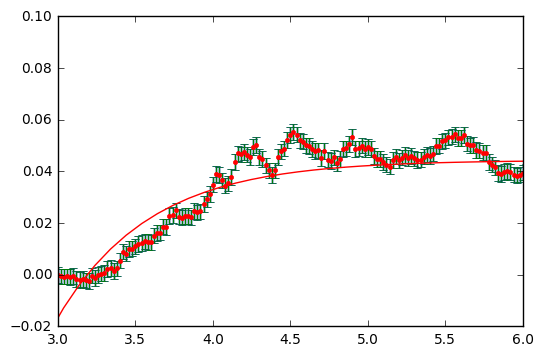

('K1 =', 9.3854359116054056, '+/-', inf)
('k2 =', 9.3410755228385032, '+/-', inf)
('tau_1 =', 0.59552991720053938, '+/-', inf)
('tau_2 =', 0.12144312392402309, '+/-', inf)


(-0.02, 0.1)

In [341]:
yaw_left_df = pd.read_csv('yaw_left_df_nrm.csv')
yaw_right_df = pd.read_csv('yaw_right_df_nrm.csv')
pitch_up_df = pd.read_csv('pitch_up_df_nrm.csv')
pitch_down_df = pd.read_csv('pitch_down_df_nrm.csv')
roll_cw_df = pd.read_csv('roll_cw_df_nrm.csv')
roll_ccw_df = pd.read_csv('roll_ccw_df_nrm.csv')


times = np.arange(350)*0.02
colors = times[150:350]

#plt.plot(times,yaw_left_df['i1_l'],clip_on = False,color = 'b')

x = times[150:350]
y = yaw_left_df['b2_r'][150:350]-(yaw_left_df['b2_r'][150])

plt.plot(x, y, '.')
plt.show()


def exponential_f(t, K1, K2, tau1, tau2):
    return K1*(1-math.e**(-t/tau1)) - K2*(1-math.e**(-(t)/tau2))
    #K1*(1-math.e**(-t/tau1)) - K2*(math.e**((t)/tau2))

e = np.repeat(0.003, len(y))
plt.errorbar(x, y, yerr=e, fmt="none")


popt, pcov = curve_fit(exponential_f, x, y, sigma=e, maxfev=100000)

print("K1 =", popt[0], "+/-", pcov[0,0]**0.5)
print("k2 =", popt[1], "+/-", pcov[1,1]**0.5)
print("tau_1 =", popt[2], "+/-", pcov[0,0]**0.5)
print("tau_2 =", popt[3], "+/-", pcov[1,1]**0.5)

plt.errorbar(x, y, yerr=e, fmt="none")
xfine = np.linspace(0.01, 10., 100)  # define values to plot the function for
plt.plot(xfine, exponential_f(xfine, popt[0], popt[1], popt[2], popt[3]), 'r-')
plt.xlim(3, 6)
plt.ylim(-0.02, 0.1)

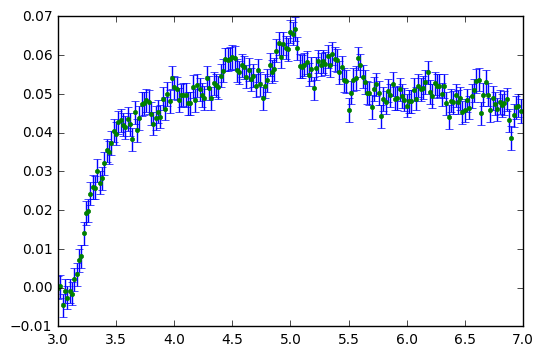

RuntimeError: Optimal parameters not found: Number of calls to function has reached maxfev = 10000.

In [102]:
yaw_left_df = pd.read_csv('yaw_left_df_nrm.csv')
yaw_right_df = pd.read_csv('yaw_right_df_nrm.csv')
pitch_up_df = pd.read_csv('pitch_up_df_nrm.csv')
pitch_down_df = pd.read_csv('pitch_down_df_nrm.csv')
roll_cw_df = pd.read_csv('roll_cw_df_nrm.csv')
roll_ccw_df = pd.read_csv('roll_ccw_df_nrm.csv')


times = np.arange(350)*0.02
colors = times[150:350]

#plt.plot(times,yaw_left_df['i1_l'],clip_on = False,color = 'b')

x = times[150:350]
y = yaw_left_df['b3_l'][150:350]-(yaw_left_df['b3_l'][150])

plt.plot(x, y, '.')
plt.show()


def exponential_f(t, K1, K2, tau1, tau2):
    return K1*(1-math.e**(-t/tau1)) - K2*(1-math.e**(-(t)/tau2))
    #K1*(1-math.e**(-t/tau1)) - K2*(math.e**((t)/tau2))

e = np.repeat(0.003, len(y))
plt.errorbar(x, y, yerr=e, fmt="none")


popt, pcov = curve_fit(exponential_f, x, y, sigma=e, maxfev=10000)

print("K1 =", popt[0], "+/-", pcov[0,0]**0.5)
print("k2 =", popt[1], "+/-", pcov[1,1]**0.5)
print("tau_1 =", popt[2], "+/-", pcov[0,0]**0.5)
print("tau_2 =", popt[3], "+/-", pcov[1,1]**0.5)

plt.errorbar(x, y, yerr=e, fmt="none")
xfine = np.linspace(0.01, 10., 100)  # define values to plot the function for
plt.plot(xfine, exponential_f(xfine, popt[0], popt[1], popt[2], popt[3]), 'r-')
plt.xlim(3, 6)
#plt.ylim(-0.02, 0.02)

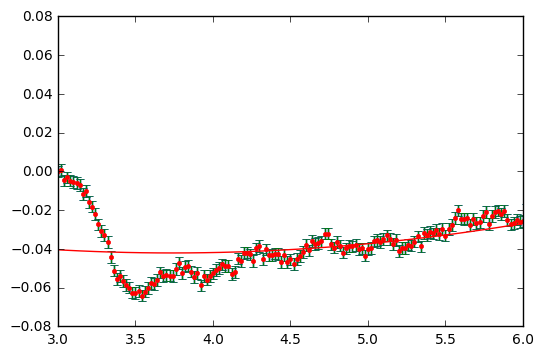

('K1 =', 1516.6121527507519, '+/-', 78362.149921030548)
('k2 =', 458.21331411278476, '+/-', 86708.557914544377)
('tau_1 =', 769.76115906712778, '+/-', 78362.149921030548)
('tau_2 =', 229.93127455801627, '+/-', 86708.557914544377)


(3, 6)

In [106]:
yaw_left_df = pd.read_csv('yaw_left_df_nrm.csv')
yaw_right_df = pd.read_csv('yaw_right_df_nrm.csv')
pitch_up_df = pd.read_csv('pitch_up_df_nrm.csv')
pitch_down_df = pd.read_csv('pitch_down_df_nrm.csv')
roll_cw_df = pd.read_csv('roll_cw_df_nrm.csv')
roll_ccw_df = pd.read_csv('roll_ccw_df_nrm.csv')


times = np.arange(350)*0.02
colors = times[150:350]

#plt.plot(times,yaw_left_df['i1_l'],clip_on = False,color = 'b')

x = times[150:350]
y = yaw_left_df['b3_r'][150:350]-(yaw_left_df['b3_r'][150])

plt.plot(x, y, '.')
plt.show()


def exponential_f(t, K1, K2, tau1, tau2):
    return K1*(1-math.e**(-t/tau1)) - K2*(1-math.e**(-(t)/tau2))
    #K1*(1-math.e**(-t/tau1)) - K2*(math.e**((t)/tau2))

e = np.repeat(0.003, len(y))
plt.errorbar(x, y, yerr=e, fmt="none")


popt, pcov = curve_fit(exponential_f, x, y, sigma=e, maxfev=100000)

print("K1 =", popt[0], "+/-", pcov[0,0]**0.5)
print("k2 =", popt[1], "+/-", pcov[1,1]**0.5)
print("tau_1 =", popt[2], "+/-", pcov[0,0]**0.5)
print("tau_2 =", popt[3], "+/-", pcov[1,1]**0.5)

plt.errorbar(x, y, yerr=e, fmt="none")
xfine = np.linspace(0.01, 10., 100)  # define values to plot the function for
plt.plot(xfine, exponential_f(xfine, popt[0], popt[1], popt[2], popt[3]), 'r-')
plt.xlim(3, 6)
#plt.ylim(-0.02, 0.02)

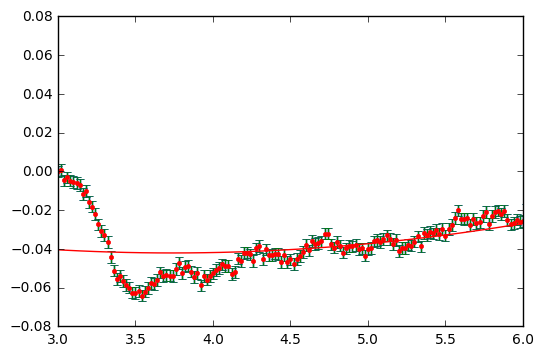

('K1 =', 452.03706177994115, '+/-', 92835.34960732609)
('k2 =', 1502.16979695237, '+/-', 79178.541398568559)
('tau_1 =', 228.56524207362429, '+/-', 92835.34960732609)
('tau_2 =', 768.32414922449891, '+/-', 79178.541398568559)


(3, 6)

In [107]:
yaw_left_df = pd.read_csv('yaw_left_df_nrm.csv')
yaw_right_df = pd.read_csv('yaw_right_df_nrm.csv')
pitch_up_df = pd.read_csv('pitch_up_df_nrm.csv')
pitch_down_df = pd.read_csv('pitch_down_df_nrm.csv')
roll_cw_df = pd.read_csv('roll_cw_df_nrm.csv')
roll_ccw_df = pd.read_csv('roll_ccw_df_nrm.csv')


times = np.arange(350)*0.02
colors = times[150:350]

#plt.plot(times,yaw_left_df['i1_l'],clip_on = False,color = 'b')

x = times[150:350]
y = yaw_left_df['b3_r'][150:350]-(yaw_left_df['b3_r'][150])

plt.plot(x, y, '.')
plt.show()


def exponential_f(t, K1, K2, tau1, tau2):
    return -(K1*(1-math.e**(-t/tau1)) - K2*(1-math.e**(-(t)/tau2)))
    #K1*(1-math.e**(-t/tau1)) - K2*(math.e**((t)/tau2))

e = np.repeat(0.003, len(y))
plt.errorbar(x, y, yerr=e, fmt="none")


popt, pcov = curve_fit(exponential_f, x, y, sigma=e, maxfev=100000)

print("K1 =", popt[0], "+/-", pcov[0,0]**0.5)
print("k2 =", popt[1], "+/-", pcov[1,1]**0.5)
print("tau_1 =", popt[2], "+/-", pcov[0,0]**0.5)
print("tau_2 =", popt[3], "+/-", pcov[1,1]**0.5)

plt.errorbar(x, y, yerr=e, fmt="none")
xfine = np.linspace(0.01, 10., 100)  # define values to plot the function for
plt.plot(xfine, exponential_f(xfine, popt[0], popt[1], popt[2], popt[3]), 'r-')
plt.xlim(3, 6)
#plt.ylim(-0.02, 0.02)

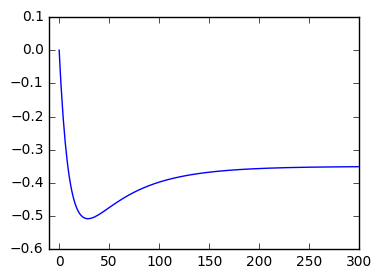

In [178]:
#y = K1*(1-e^(t/tau1)) - K2*(1-e(t/tau2))

plt.figure(1, figsize=(4, 3))
t = np.arange(0,300)
K1 = 0.7
K2 = 0.35
tau1 = 10.
tau2 = 50.
#y = K1*(1-math.e**(t/tau1)) - K2*(1-math.e**(t/tau2))
y = -(K1*(1-math.e**(-t/tau1)) - K2*(1-math.e**(-(t)/tau2)))
plt.plot(t, y)

plt.xlim(-10., 300.)
#plt.ylim(0., 1.0)

plt.show()

In [156]:
bounds=(0, [3., 1., 0.5])

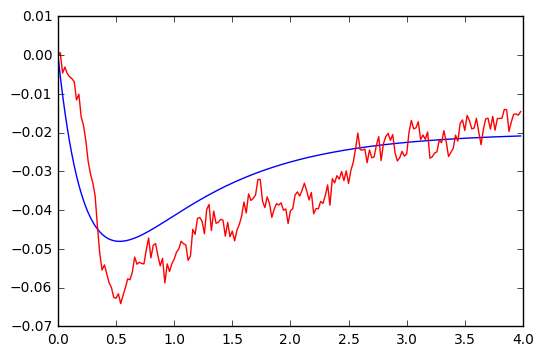

In [249]:

times = np.arange(350)*0.02
t = times[150:350]
x = t - times[150]

K1 = 0.09
K2 = 0.07
tau1 = .25
tau2 = .9
y= -(K1*(1-math.e**(-x/tau1)) - K2*(1-math.e**(-(x)/tau2)))
y_data =yaw_left_df['b3_r'][150:350]-(yaw_left_df['b3_r'][150])

plt.plot(x, y)
plt.plot(x, y_data, 'r')
plt.xlim(0, 4)
#plt.ylim(0, 0.1)

plt.show()

y= -(K1*(1-math.e**(-x/tau1)) - K2*(1-math.e**(-(x)/tau2)))

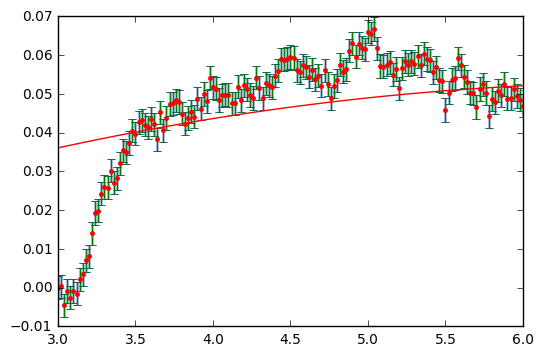

('K1 =', 638.63259789891117, '+/-', 261842.30061019733)
('k2 =', 2103.1777270819666, '+/-', 472289.36496532662)
('tau_1 =', 446.78275962333657, '+/-', 261842.30061019733)
('tau_2 =', 1487.3838771368175, '+/-', 472289.36496532662)


(3, 6)

In [253]:
yaw_left_df = pd.read_csv('yaw_left_df_nrm.csv')
yaw_right_df = pd.read_csv('yaw_right_df_nrm.csv')
pitch_up_df = pd.read_csv('pitch_up_df_nrm.csv')
pitch_down_df = pd.read_csv('pitch_down_df_nrm.csv')
roll_cw_df = pd.read_csv('roll_cw_df_nrm.csv')
roll_ccw_df = pd.read_csv('roll_ccw_df_nrm.csv')


times = np.arange(350)*0.02
colors = times[150:350]

#plt.plot(times,yaw_left_df['i1_l'],clip_on = False,color = 'b')

x = times[150:350]
y = yaw_left_df['b3_l'][150:350]-(yaw_left_df['b3_l'][150])

plt.plot(x, y, '.')
plt.show()


def exponential_f(t, K1, K2, tau1, tau2):
    return K1*(1-math.e**(-t/tau1)) - K2*(1-math.e**(-(t)/tau2))
    #K1*(1-math.e**(-t/tau1)) - K2*(math.e**((t)/tau2))

e = np.repeat(0.003, len(y))
plt.errorbar(x, y, yerr=e, fmt="none")


popt, pcov = curve_fit(exponential_f, x, y, sigma=e, maxfev=100000)

print("K1 =", popt[0], "+/-", pcov[0,0]**0.5)
print("k2 =", popt[1], "+/-", pcov[1,1]**0.5)
print("tau_1 =", popt[2], "+/-", pcov[0,0]**0.5)
print("tau_2 =", popt[3], "+/-", pcov[1,1]**0.5)

plt.errorbar(x, y, yerr=e, fmt="none")
xfine = np.linspace(0.01, 10., 100)  # define values to plot the function for
plt.plot(xfine, exponential_f(xfine, popt[0], popt[1], popt[2], popt[3]), 'r-')
plt.xlim(3, 6)
#plt.ylim(-0.02, 0.02)

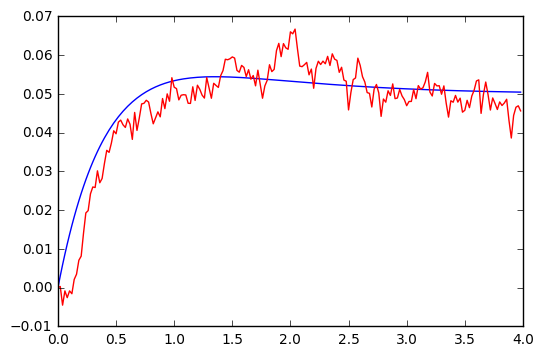

In [263]:

times = np.arange(350)*0.02
t = times[150:350]
x = t - times[150]

K1 = 0.09
K2 = 0.04
tau1 = .45
tau2 = .9
y= (K1*(1-math.e**(-x/tau1)) - K2*(1-math.e**(-(x)/tau2)))
y_data =yaw_left_df['b3_l'][150:350]-(yaw_left_df['b3_l'][150])

plt.plot(x, y)
plt.plot(x, y_data, 'r')
plt.xlim(0, 4)
#plt.ylim(0, 0.1)

plt.show()

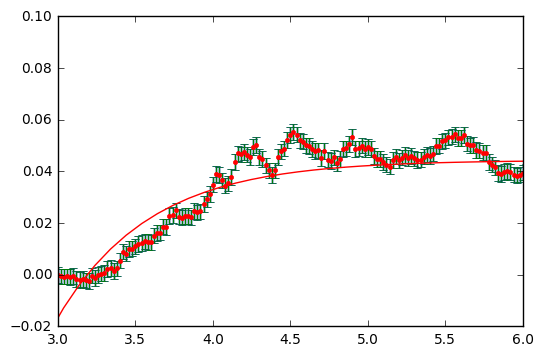

('K1 =', 9.3854359116054056, '+/-', inf)
('k2 =', 9.3410755228385032, '+/-', inf)
('tau_1 =', 0.59552991720053938, '+/-', inf)
('tau_2 =', 0.12144312392402309, '+/-', inf)


(-0.02, 0.1)

In [276]:
yaw_left_df = pd.read_csv('yaw_left_df_nrm.csv')
yaw_right_df = pd.read_csv('yaw_right_df_nrm.csv')
pitch_up_df = pd.read_csv('pitch_up_df_nrm.csv')
pitch_down_df = pd.read_csv('pitch_down_df_nrm.csv')
roll_cw_df = pd.read_csv('roll_cw_df_nrm.csv')
roll_ccw_df = pd.read_csv('roll_ccw_df_nrm.csv')


times = np.arange(350)*0.02
colors = times[150:350]

#plt.plot(times,yaw_left_df['i1_l'],clip_on = False,color = 'b')

x = times[150:350]
y = yaw_left_df['b2_r'][150:350]-(yaw_left_df['b2_r'][150])

plt.plot(x, y, '.')
plt.show()


def exponential_f(t, K1, K2, tau1, tau2):
    return K1*(1-math.e**(-t/tau1)) - K2*(1-math.e**(-(t)/tau2))
    #K1*(1-math.e**(-t/tau1)) - K2*(math.e**((t)/tau2))

e = np.repeat(0.003, len(y))
plt.errorbar(x, y, yerr=e, fmt="none")


popt, pcov = curve_fit(exponential_f, x, y, sigma=e, maxfev=100000)

print("K1 =", popt[0], "+/-", pcov[0,0]**0.5)
print("k2 =", popt[1], "+/-", pcov[1,1]**0.5)
print("tau_1 =", popt[2], "+/-", pcov[0,0]**0.5)
print("tau_2 =", popt[3], "+/-", pcov[1,1]**0.5)

plt.errorbar(x, y, yerr=e, fmt="none")
xfine = np.linspace(0.01, 10., 100)  # define values to plot the function for
plt.plot(xfine, exponential_f(xfine, popt[0], popt[1], popt[2], popt[3]), 'r-')
plt.xlim(3, 6)
plt.ylim(-0.02, 0.1)

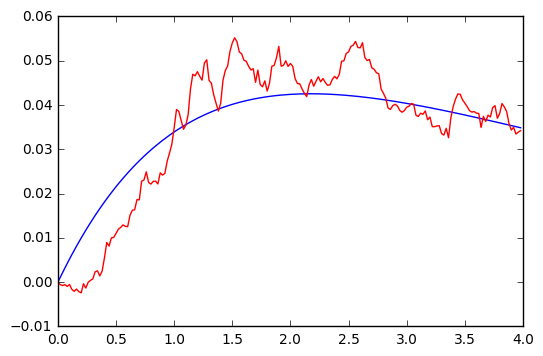

In [309]:

times = np.arange(350)*0.02
t = times[150:350]
x = t - times[150]

K1 = 0.16
K2 = 0.155
tau1 = 1.5
tau2 = 3
y= (K1*(1-math.e**(-x/tau1)) - K2*(1-math.e**(-(x)/tau2)))
y_data =yaw_left_df['b2_r'][150:350]-(yaw_left_df['b2_r'][150])

plt.plot(x, y)
plt.plot(x, y_data, 'r')
plt.xlim(0, 4)
#plt.ylim(0, 0.1)

plt.show()

y= (K1*(1-math.e**(-x/tau1)) - K2*(1-math.e**(-(x)/tau2)))

In [ ]:
Simple exponential, filter sliding along waveform 


In [269]:
import numpy as np
from scipy.optimize import curve_fit

In [271]:
%matplotlib inline
import numpy as np
import matplotlib.pyplot as plt
import pandas as pd

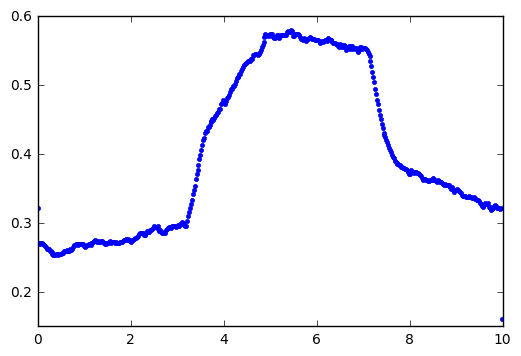

In [277]:
yaw_left_df = pd.read_csv('yaw_left_df_nrm.csv')
yaw_right_df = pd.read_csv('yaw_right_df_nrm.csv')
pitch_up_df = pd.read_csv('pitch_up_df_nrm.csv')
pitch_down_df = pd.read_csv('pitch_down_df_nrm.csv')
roll_cw_df = pd.read_csv('roll_cw_df_nrm.csv')
roll_ccw_df = pd.read_csv('roll_ccw_df_nrm.csv')


times = np.arange(500)*0.02
colors = times[150:350]

#plt.plot(times,yaw_left_df['i1_l'],clip_on = False,color = 'b')

plt.plot(times, yaw_left_df['i1_l'], '.')
plt.show()

x = times
y = yaw_left_df['i1_l']

In [278]:
def exponential_f(t, K1, K2, tau1, tau2):
    return K1*(1-math.e**(-t/tau1)) - K2*(math.e**((t)/tau2))

In [279]:
popt, pcov = curve_fit(exponential_f, x, y)

In [280]:
popt

array([ 0.66019056,  0.00374344,  2.87910997,  2.12030152])

<Container object of 3 artists>

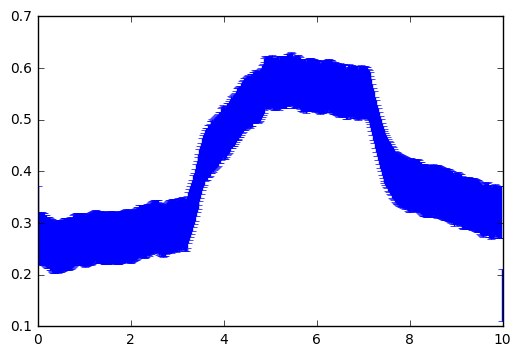

In [289]:
e = np.repeat(0.05, len(y))
plt.errorbar(x, y, yerr=e, fmt="none")

In [291]:
popt, pcov = curve_fit(exponential_f, x, y, sigma=e)

In [292]:
popt

array([ 0.66018769,  0.00374323,  2.87909607,  2.12027801])

In [297]:
print("K1 =", popt[0], "+/-", pcov[0,0]**0.5)
print("k2 =", popt[1], "+/-", pcov[1,1]**0.5)
print("tau_1 =", popt[2], "+/-", pcov[0,0]**0.5)
print("tau_2 =", popt[3], "+/-", pcov[1,1]**0.5)

('K1 =', 0.6601876892738382, '+/-', 0.058626413549035437)
('k2 =', 0.0037432254375404728, '+/-', 0.0040285727430118051)
('tau_1 =', 2.8790960667116523, '+/-', 0.058626413549035437)
('tau_2 =', 2.1202780094989921, '+/-', 0.0040285727430118051)


(-1.0, 10)

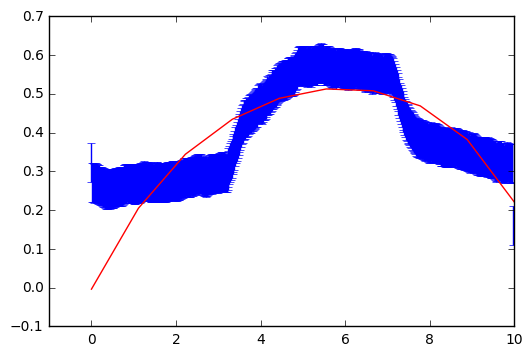

In [306]:
plt.errorbar(x, y, yerr=e, fmt="none")
xfine = np.linspace(0., 10., 10)  # define values to plot the function for
plt.plot(xfine, exponential_f(xfine, popt[0], popt[1], popt[2], popt[3]), 'r-')
plt.xlim(-1., 10)
plt.xlim(-1., 10)

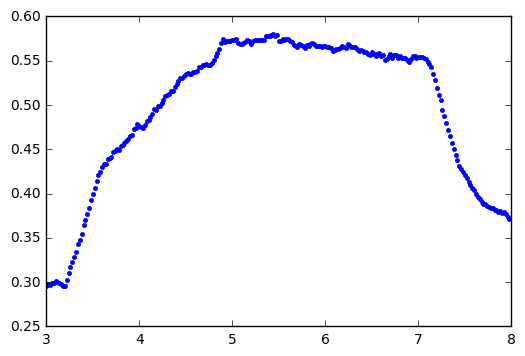

In [392]:
yaw_left_df = pd.read_csv('yaw_left_df_nrm.csv')
yaw_right_df = pd.read_csv('yaw_right_df_nrm.csv')
pitch_up_df = pd.read_csv('pitch_up_df_nrm.csv')
pitch_down_df = pd.read_csv('pitch_down_df_nrm.csv')
roll_cw_df = pd.read_csv('roll_cw_df_nrm.csv')
roll_ccw_df = pd.read_csv('roll_ccw_df_nrm.csv')


times = np.arange(500)*0.02
colors = times[150:350]

#plt.plot(times,yaw_left_df['i1_l'],clip_on = False,color = 'b')

x = times[150:400]
y = yaw_left_df['i1_l'][150:400]

plt.plot(x, y, '.')
plt.show()

In [394]:
def exponential_f(t, K1, K2, tau1, tau2):
    return K1*(1-math.e**(-t/tau1)) - K2*(1-math.e**(-(t)/tau2))

In [395]:
popt, pcov = curve_fit(exponential_f, x, y)

RuntimeError: Optimal parameters not found: Number of calls to function has reached maxfev = 1000.

<Container object of 3 artists>

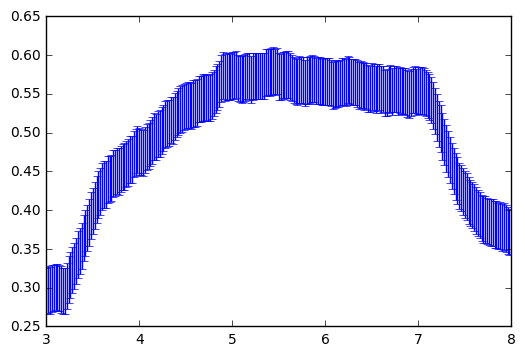

In [319]:
e = np.repeat(0.03, len(y))
plt.errorbar(x, y, yerr=e, fmt="none")

In [320]:
popt, pcov = curve_fit(exponential_f, x, y, sigma=e)

In [321]:
print("K1 =", popt[0], "+/-", pcov[0,0]**0.5)
print("k2 =", popt[1], "+/-", pcov[1,1]**0.5)
print("tau_1 =", popt[2], "+/-", pcov[0,0]**0.5)
print("tau_2 =", popt[3], "+/-", pcov[1,1]**0.5)

('K1 =', 9585.8856001840522, '+/-', 583857.78420422261)
('k2 =', 0.0033349100223061612, '+/-', 0.00082995615915445325)
('tau_1 =', 75079.851261628457, '+/-', 583857.78420422261)
('tau_2 =', 1.4936732188711859, '+/-', 0.00082995615915445325)


(0.1, 0.7)

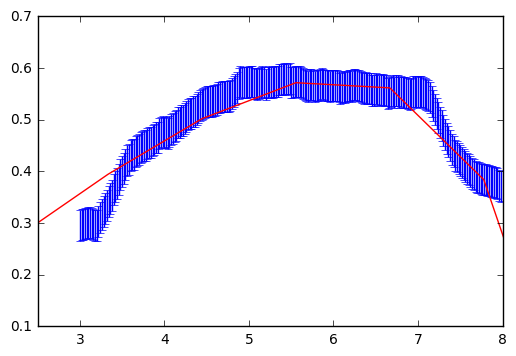

In [326]:
plt.errorbar(x, y, yerr=e, fmt="none")
xfine = np.linspace(0., 10., 10)  # define values to plot the function for
plt.plot(xfine, exponential_f(xfine, popt[0], popt[1], popt[2], popt[3]), 'r-')
plt.xlim(2.5, 8)
plt.ylim(0.1, 0.7)

Yaw left B2 Left

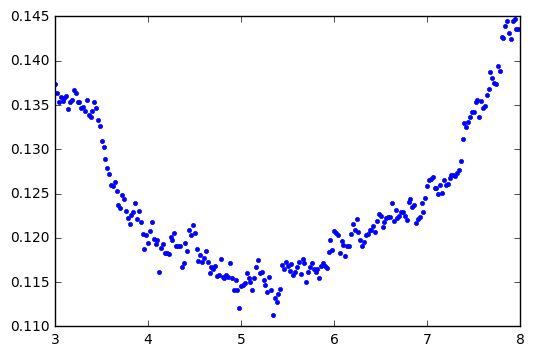

In [328]:
yaw_left_df = pd.read_csv('yaw_left_df_nrm.csv')
yaw_right_df = pd.read_csv('yaw_right_df_nrm.csv')
pitch_up_df = pd.read_csv('pitch_up_df_nrm.csv')
pitch_down_df = pd.read_csv('pitch_down_df_nrm.csv')
roll_cw_df = pd.read_csv('roll_cw_df_nrm.csv')
roll_ccw_df = pd.read_csv('roll_ccw_df_nrm.csv')


times = np.arange(500)*0.02
colors = times[150:350]

#plt.plot(times,yaw_left_df['i1_l'],clip_on = False,color = 'b')

x = times[150:400]
y = yaw_left_df['b2_l'][150:400]

plt.plot(x, y, '.')
plt.show()

In [329]:
def exponential_f(t, K1, K2, tau1, tau2):
    return K1*(1-math.e**(-t/tau1)) - K2*(math.e**((t)/tau2))

<Container object of 3 artists>

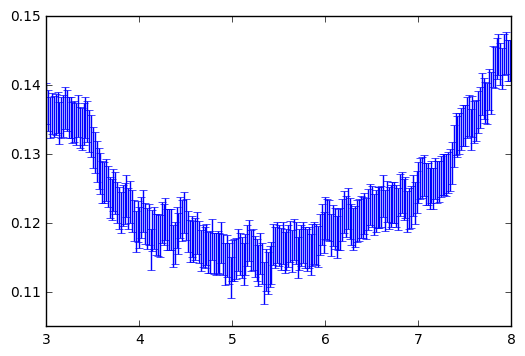

In [332]:
e = np.repeat(0.003, len(y))
plt.errorbar(x, y, yerr=e, fmt="none")

In [333]:
popt, pcov = curve_fit(exponential_f, x, y, sigma=e)

/home/imager/.local/lib/python2.7/site-packages/scipy/optimize/minpack.py:715: OptimizeWarning: Covariance of the parameters could not be estimated
  category=OptimizeWarning)


In [334]:
print("K1 =", popt[0], "+/-", pcov[0,0]**0.5)
print("k2 =", popt[1], "+/-", pcov[1,1]**0.5)
print("tau_1 =", popt[2], "+/-", pcov[0,0]**0.5)
print("tau_2 =", popt[3], "+/-", pcov[1,1]**0.5)

('K1 =', 0.12098660353132569, '+/-', inf)
('k2 =', -1.6805189548953564e-09, '+/-', inf)
('tau_1 =', 0.10938957269600436, '+/-', inf)
('tau_2 =', 0.47970244253232086, '+/-', inf)


(0.05, 0.2)

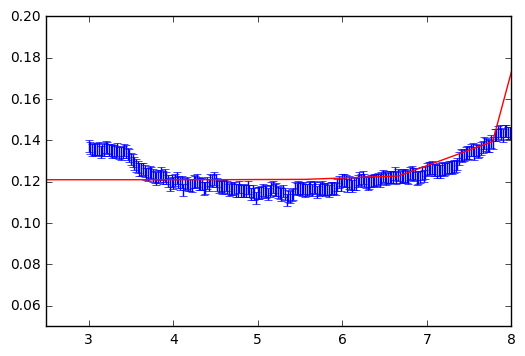

In [339]:
plt.errorbar(x, y, yerr=e, fmt="none")
xfine = np.linspace(0., 10., 10)  # define values to plot the function for
plt.plot(xfine, exponential_f(xfine, popt[0], popt[1], popt[2], popt[3]), 'r-')
plt.xlim(2.5, 8)
plt.ylim(0.05, 0.2)

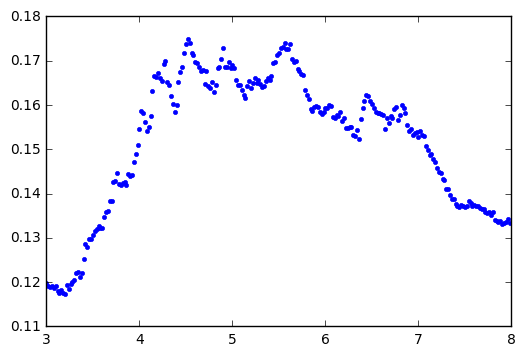

('K1 =', 0.93964197849309694, '+/-', 0.078648487044560025)
('k2 =', 0.61414487867098977, '+/-', 0.089001195964114946)
('tau_1 =', 1.6612561602054221, '+/-', 0.078648487044560025)
('tau_2 =', 29.924721756085969, '+/-', 0.089001195964114946)


(0.05, 0.2)

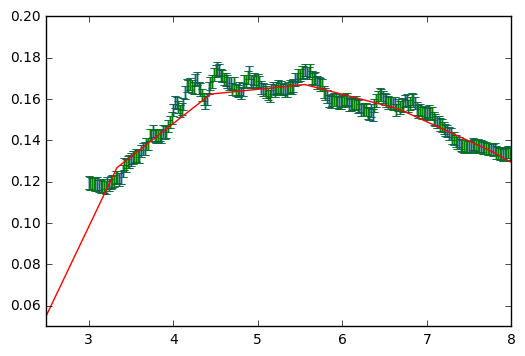

In [340]:
yaw_left_df = pd.read_csv('yaw_left_df_nrm.csv')
yaw_right_df = pd.read_csv('yaw_right_df_nrm.csv')
pitch_up_df = pd.read_csv('pitch_up_df_nrm.csv')
pitch_down_df = pd.read_csv('pitch_down_df_nrm.csv')
roll_cw_df = pd.read_csv('roll_cw_df_nrm.csv')
roll_ccw_df = pd.read_csv('roll_ccw_df_nrm.csv')


times = np.arange(500)*0.02
colors = times[150:350]

#plt.plot(times,yaw_left_df['i1_l'],clip_on = False,color = 'b')

x = times[150:400]
y = yaw_left_df['b2_r'][150:400]

plt.plot(x, y, '.')
plt.show()


def exponential_f(t, K1, K2, tau1, tau2):
    return K1*(1-math.e**(-t/tau1)) - K2*(math.e**((t)/tau2))

e = np.repeat(0.003, len(y))
plt.errorbar(x, y, yerr=e, fmt="none")


popt, pcov = curve_fit(exponential_f, x, y, sigma=e)

print("K1 =", popt[0], "+/-", pcov[0,0]**0.5)
print("k2 =", popt[1], "+/-", pcov[1,1]**0.5)
print("tau_1 =", popt[2], "+/-", pcov[0,0]**0.5)
print("tau_2 =", popt[3], "+/-", pcov[1,1]**0.5)

plt.errorbar(x, y, yerr=e, fmt="none")
xfine = np.linspace(0., 10., 10)  # define values to plot the function for
plt.plot(xfine, exponential_f(xfine, popt[0], popt[1], popt[2], popt[3]), 'r-')
plt.xlim(2.5, 8)
plt.ylim(0.05, 0.2)

In [ ]:
# shift and subtract these for starting point 

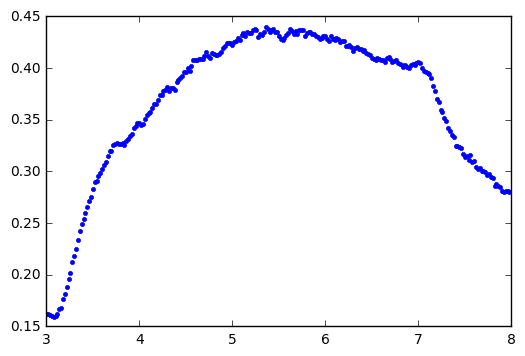

('K1 =', 7253.8812146991186, '+/-', 633472.76914814487)
('k2 =', 0.0011206193324891426, '+/-', 0.00043424270309461426)
('tau_1 =', 80806.726340683657, '+/-', 633472.76914814487)
('tau_2 =', 1.3156453925269034, '+/-', 0.00043424270309461426)


(0.1, 0.5)

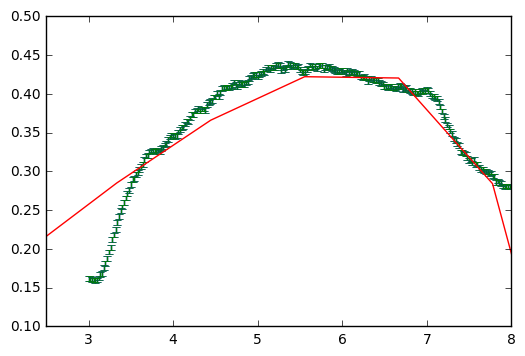

In [343]:
yaw_left_df = pd.read_csv('yaw_left_df_nrm.csv')
yaw_right_df = pd.read_csv('yaw_right_df_nrm.csv')
pitch_up_df = pd.read_csv('pitch_up_df_nrm.csv')
pitch_down_df = pd.read_csv('pitch_down_df_nrm.csv')
roll_cw_df = pd.read_csv('roll_cw_df_nrm.csv')
roll_ccw_df = pd.read_csv('roll_ccw_df_nrm.csv')


times = np.arange(500)*0.02
colors = times[150:350]

#plt.plot(times,yaw_left_df['i1_l'],clip_on = False,color = 'b')

x = times[150:400]
y = yaw_left_df['i2_l'][150:400]

plt.plot(x, y, '.')
plt.show()


def exponential_f(t, K1, K2, tau1, tau2):
    return K1*(1-math.e**(-t/tau1)) - K2*(math.e**((t)/tau2))

e = np.repeat(0.003, len(y))
plt.errorbar(x, y, yerr=e, fmt="none")


popt, pcov = curve_fit(exponential_f, x, y, sigma=e)

print("K1 =", popt[0], "+/-", pcov[0,0]**0.5)
print("k2 =", popt[1], "+/-", pcov[1,1]**0.5)
print("tau_1 =", popt[2], "+/-", pcov[0,0]**0.5)
print("tau_2 =", popt[3], "+/-", pcov[1,1]**0.5)

plt.errorbar(x, y, yerr=e, fmt="none")
xfine = np.linspace(0., 10., 10)  # define values to plot the function for
plt.plot(xfine, exponential_f(xfine, popt[0], popt[1], popt[2], popt[3]), 'r-')
plt.xlim(2.5, 8)
plt.ylim(0.1, 0.5)

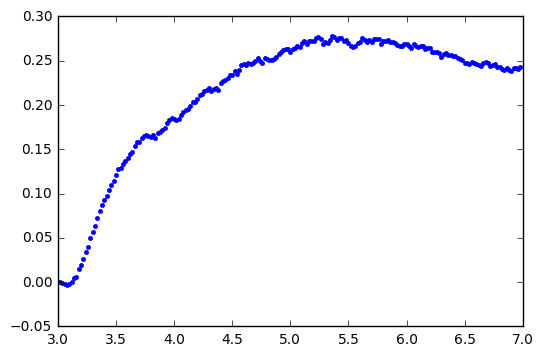

('K1 =', 24.084263766088341, '+/-', inf)
('k2 =', 23.817253849465285, '+/-', inf)
('tau_1 =', 0.68868648949133149, '+/-', inf)
('tau_2 =', 0.12339765490617498, '+/-', inf)


(0.0, 0.4)

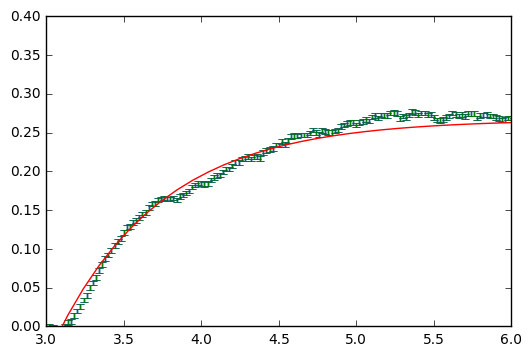

In [403]:
yaw_left_df = pd.read_csv('yaw_left_df_nrm.csv')
yaw_right_df = pd.read_csv('yaw_right_df_nrm.csv')
pitch_up_df = pd.read_csv('pitch_up_df_nrm.csv')
pitch_down_df = pd.read_csv('pitch_down_df_nrm.csv')
roll_cw_df = pd.read_csv('roll_cw_df_nrm.csv')
roll_ccw_df = pd.read_csv('roll_ccw_df_nrm.csv')


times = np.arange(350)*0.02
colors = times[150:350]

#plt.plot(times,yaw_left_df['i1_l'],clip_on = False,color = 'b')

x = times[150:400]
y = yaw_left_df['i2_l'][150:350]-(yaw_left_df['i2_l'][150])

plt.plot(x, y, '.')
plt.show()


def exponential_f(t, K1, K2, tau1, tau2):
    return K1*(1-math.e**(-t/tau1)) - K2*(1-math.e**(-(t)/tau2))
    #K1*(1-math.e**(-t/tau1)) - K2*(math.e**((t)/tau2))

e = np.repeat(0.003, len(y))
plt.errorbar(x, y, yerr=e, fmt="none")


popt, pcov = curve_fit(exponential_f, x, y, sigma=e)

print("K1 =", popt[0], "+/-", pcov[0,0]**0.5)
print("k2 =", popt[1], "+/-", pcov[1,1]**0.5)
print("tau_1 =", popt[2], "+/-", pcov[0,0]**0.5)
print("tau_2 =", popt[3], "+/-", pcov[1,1]**0.5)

plt.errorbar(x, y, yerr=e, fmt="none")
xfine = np.linspace(0.01, 10., 100)  # define values to plot the function for
plt.plot(xfine, exponential_f(xfine, popt[0], popt[1], popt[2], popt[3]), 'r-')
plt.xlim(3, 6)
plt.ylim(0.00, 0.4)

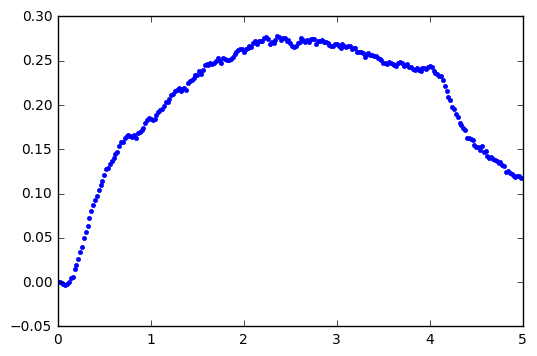

('K1 =', 0.3968040991693696, '+/-', 0.0077379239779209932)
('k2 =', 0.014306438882995324, '+/-', 0.0019903686446530581)
('tau_1 =', 1.298382008554295, '+/-', 0.0077379239779209932)
('tau_2 =', 1.663086278600175, '+/-', 0.0019903686446530581)


(0.0, 0.4)

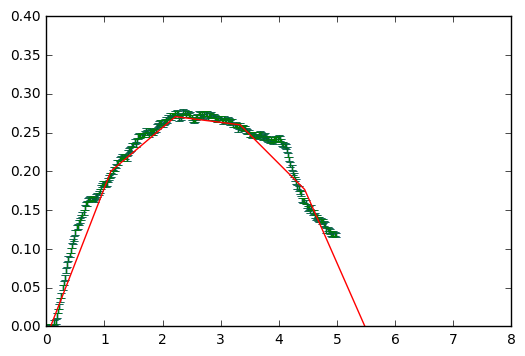

In [358]:
yaw_left_df = pd.read_csv('yaw_left_df_nrm.csv')
yaw_right_df = pd.read_csv('yaw_right_df_nrm.csv')
pitch_up_df = pd.read_csv('pitch_up_df_nrm.csv')
pitch_down_df = pd.read_csv('pitch_down_df_nrm.csv')
roll_cw_df = pd.read_csv('roll_cw_df_nrm.csv')
roll_ccw_df = pd.read_csv('roll_ccw_df_nrm.csv')


times = np.arange(500)*0.02
colors = times[150:350]

#plt.plot(times,yaw_left_df['i1_l'],clip_on = False,color = 'b')

x = times[150:400]-times[150]
y = yaw_left_df['i2_l'][150:400]-(yaw_left_df['i2_l'][150])
#y = K1*(1-math.e**(t/tau1)) - K2*(1-math.e**(t/tau2))

plt.plot(x, y, '.')
plt.show()


def exponential_f(t, K1, K2, tau1, tau2):
    return K1*(1-math.e**(-t/tau1)) - K2*(math.e**((t)/tau2))
    #K1*(1-math.e**(-t/tau1)) - K2*(math.e**((t)/tau2))
    #K1*(1-math.e**(t/tau1)) - K2*(1-math.e**(t/tau2))
    #y = K1*(1-math.e**(-t/tau1)) - K2*(math.e**((t)/tau2))
    

e = np.repeat(0.003, len(y))
plt.errorbar(x, y, yerr=e, fmt="none")


popt, pcov = curve_fit(exponential_f, x, y, sigma=e)

print("K1 =", popt[0], "+/-", pcov[0,0]**0.5)
print("k2 =", popt[1], "+/-", pcov[1,1]**0.5)
print("tau_1 =", popt[2], "+/-", pcov[0,0]**0.5)
print("tau_2 =", popt[3], "+/-", pcov[1,1]**0.5)

plt.errorbar(x, y, yerr=e, fmt="none")
xfine = np.linspace(0., 10., 10)  # define values to plot the function for
plt.plot(xfine, exponential_f(xfine, popt[0], popt[1], popt[2], popt[3]), 'r-')
plt.xlim(0, 8)
plt.ylim(0.00, 0.4)

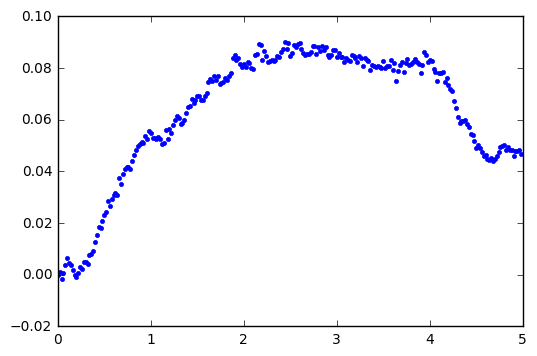

('K1 =', 0.16705666958047963, '+/-', 0.0041925201040326453)
('k2 =', 0.010251602640809931, '+/-', 0.0011190142582539226)
('tau_1 =', 1.9417326621711359, '+/-', 0.0041925201040326453)
('tau_2 =', 2.0523877870353995, '+/-', 0.0011190142582539226)


(0.0, 0.4)

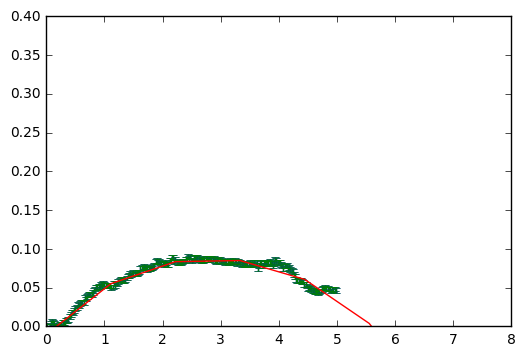

In [360]:
yaw_left_df = pd.read_csv('yaw_left_df_nrm.csv')
yaw_right_df = pd.read_csv('yaw_right_df_nrm.csv')
pitch_up_df = pd.read_csv('pitch_up_df_nrm.csv')
pitch_down_df = pd.read_csv('pitch_down_df_nrm.csv')
roll_cw_df = pd.read_csv('roll_cw_df_nrm.csv')
roll_ccw_df = pd.read_csv('roll_ccw_df_nrm.csv')


times = np.arange(500)*0.02
colors = times[150:350]

#plt.plot(times,yaw_left_df['i1_l'],clip_on = False,color = 'b')

x = times[150:400]-times[150]
y = yaw_left_df['iii1_l'][150:400]-(yaw_left_df['iii1_l'][150])
#y = K1*(1-math.e**(t/tau1)) - K2*(1-math.e**(t/tau2))

plt.plot(x, y, '.')
plt.show()


def exponential_f(t, K1, K2, tau1, tau2):
    return K1*(1-math.e**(-t/tau1)) - K2*(math.e**((t)/tau2))
    #K1*(1-math.e**(-t/tau1)) - K2*(math.e**((t)/tau2))
    #K1*(1-math.e**(t/tau1)) - K2*(1-math.e**(t/tau2))
    #y = K1*(1-math.e**(-t/tau1)) - K2*(math.e**((t)/tau2))
    

e = np.repeat(0.003, len(y))
plt.errorbar(x, y, yerr=e, fmt="none")


popt, pcov = curve_fit(exponential_f, x, y, sigma=e)

print("K1 =", popt[0], "+/-", pcov[0,0]**0.5)
print("k2 =", popt[1], "+/-", pcov[1,1]**0.5)
print("tau_1 =", popt[2], "+/-", pcov[0,0]**0.5)
print("tau_2 =", popt[3], "+/-", pcov[1,1]**0.5)

plt.errorbar(x, y, yerr=e, fmt="none")
xfine = np.linspace(0., 10., 10)  # define values to plot the function for
plt.plot(xfine, exponential_f(xfine, popt[0], popt[1], popt[2], popt[3]), 'r-')
plt.xlim(0, 8)
plt.ylim(0.00, 0.4)

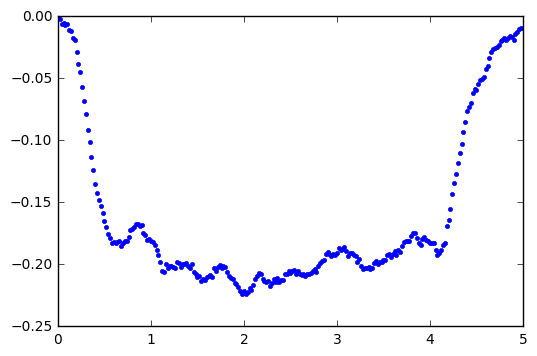

('K1 =', -0.2213107021722879, '+/-', 0.003071006289881213)
('k2 =', -0.00023409064490006594, '+/-', 8.4689969760243057e-05)
('tau_1 =', 0.50764845737251485, '+/-', 0.003071006289881213)
('tau_2 =', 0.71215627320912767, '+/-', 8.4689969760243057e-05)


(0, 8)

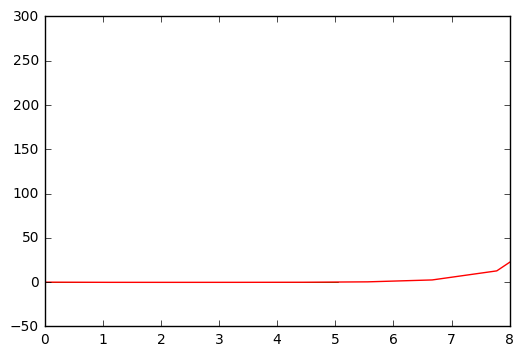

In [362]:
yaw_left_df = pd.read_csv('yaw_left_df_nrm.csv')
yaw_right_df = pd.read_csv('yaw_right_df_nrm.csv')
pitch_up_df = pd.read_csv('pitch_up_df_nrm.csv')
pitch_down_df = pd.read_csv('pitch_down_df_nrm.csv')
roll_cw_df = pd.read_csv('roll_cw_df_nrm.csv')
roll_ccw_df = pd.read_csv('roll_ccw_df_nrm.csv')


times = np.arange(500)*0.02
colors = times[150:350]

#plt.plot(times,yaw_left_df['i1_l'],clip_on = False,color = 'b')

x = times[150:400]-times[150]
y = yaw_left_df['iii3_l'][150:400]-(yaw_left_df['iii3_l'][150])
#y = K1*(1-math.e**(t/tau1)) - K2*(1-math.e**(t/tau2))

plt.plot(x, y, '.')
plt.show()


def exponential_f(t, K1, K2, tau1, tau2):
    return K1*(1-math.e**(-t/tau1)) - K2*(math.e**((t)/tau2))
    #K1*(1-math.e**(-t/tau1)) - K2*(math.e**((t)/tau2))
    #K1*(1-math.e**(t/tau1)) - K2*(1-math.e**(t/tau2))
    #y = K1*(1-math.e**(-t/tau1)) - K2*(math.e**((t)/tau2))
    

e = np.repeat(0.003, len(y))
plt.errorbar(x, y, yerr=e, fmt="none")


popt, pcov = curve_fit(exponential_f, x, y, sigma=e)

print("K1 =", popt[0], "+/-", pcov[0,0]**0.5)
print("k2 =", popt[1], "+/-", pcov[1,1]**0.5)
print("tau_1 =", popt[2], "+/-", pcov[0,0]**0.5)
print("tau_2 =", popt[3], "+/-", pcov[1,1]**0.5)

plt.errorbar(x, y, yerr=e, fmt="none")
xfine = np.linspace(0., 10., 10)  # define values to plot the function for
plt.plot(xfine, exponential_f(xfine, popt[0], popt[1], popt[2], popt[3]), 'r-')
plt.xlim(0, 8)
#plt.ylim(0.00, 0.4)

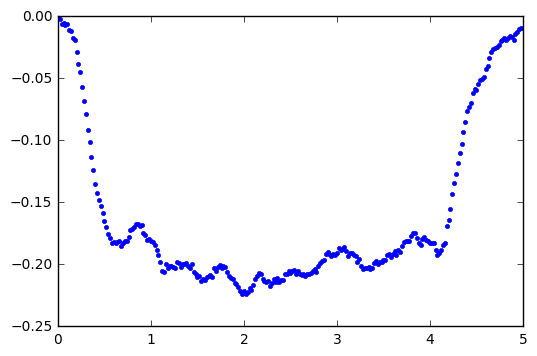

('K1 =', 0.22131029534549734, '+/-', 0.003071251099807232)
('k2 =', 0.00023407757126658787, '+/-', 8.4718673265754844e-05)
('tau_1 =', 0.50764585382392957, '+/-', 0.003071251099807232)
('tau_2 =', 0.71215049544720854, '+/-', 8.4718673265754844e-05)


(-0.2, 0.1)

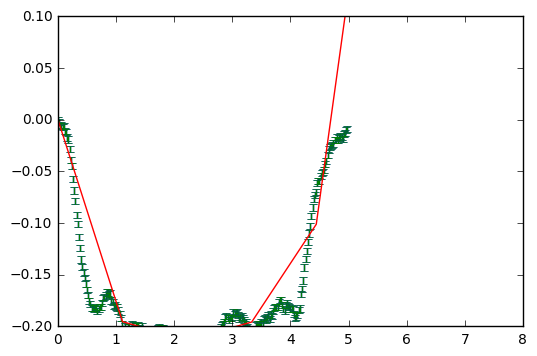

In [365]:
yaw_left_df = pd.read_csv('yaw_left_df_nrm.csv')
yaw_right_df = pd.read_csv('yaw_right_df_nrm.csv')
pitch_up_df = pd.read_csv('pitch_up_df_nrm.csv')
pitch_down_df = pd.read_csv('pitch_down_df_nrm.csv')
roll_cw_df = pd.read_csv('roll_cw_df_nrm.csv')
roll_ccw_df = pd.read_csv('roll_ccw_df_nrm.csv')


times = np.arange(500)*0.02
colors = times[150:350]

#plt.plot(times,yaw_left_df['i1_l'],clip_on = False,color = 'b')

x = times[150:400]-times[150]
y = yaw_left_df['iii3_l'][150:400]-(yaw_left_df['iii3_l'][150])
#y = K1*(1-math.e**(t/tau1)) - K2*(1-math.e**(t/tau2))

plt.plot(x, y, '.')
plt.show()


def exponential_f(t, K1, K2, tau1, tau2):
    return -(K1*(1-math.e**(-t/tau1)) - K2*(math.e**((t)/tau2)))
    #K1*(1-math.e**(-t/tau1)) - K2*(math.e**((t)/tau2))
    #K1*(1-math.e**(t/tau1)) - K2*(1-math.e**(t/tau2))
    #y = K1*(1-math.e**(-t/tau1)) - K2*(math.e**((t)/tau2))
    

e = np.repeat(0.003, len(y))
plt.errorbar(x, y, yerr=e, fmt="none")


popt, pcov = curve_fit(exponential_f, x, y, sigma=e)

print("K1 =", popt[0], "+/-", pcov[0,0]**0.5)
print("k2 =", popt[1], "+/-", pcov[1,1]**0.5)
print("tau_1 =", popt[2], "+/-", pcov[0,0]**0.5)
print("tau_2 =", popt[3], "+/-", pcov[1,1]**0.5)

plt.errorbar(x, y, yerr=e, fmt="none")
xfine = np.linspace(0., 10., 10)  # define values to plot the function for
plt.plot(xfine, exponential_f(xfine, popt[0], popt[1], popt[2], popt[3]), 'r-')
plt.xlim(0, 8)
plt.ylim(-.20, 0.1)

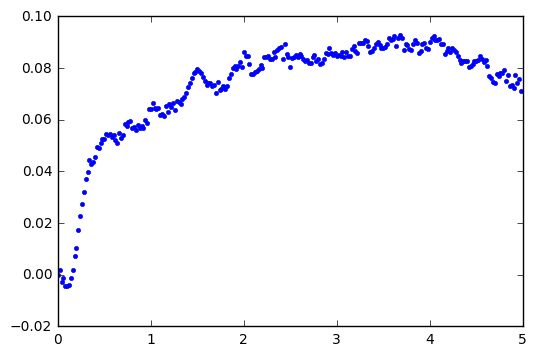

('K1 =', 0.08795467223782967, '+/-', 0.000654829143557177)
('k2 =', 6.9285454842991229e-09, '+/-', 2.1837430949504059e-08)
('tau_1 =', 0.76418633797306168, '+/-', 0.000654829143557177)
('tau_2 =', 0.33744907289320392, '+/-', 2.1837430949504059e-08)


(0.0, 0.15)

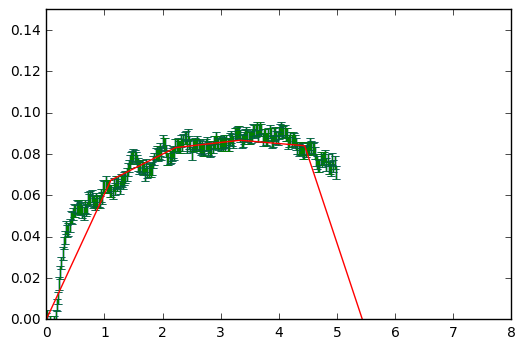

In [368]:
yaw_left_df = pd.read_csv('yaw_left_df_nrm.csv')
yaw_right_df = pd.read_csv('yaw_right_df_nrm.csv')
pitch_up_df = pd.read_csv('pitch_up_df_nrm.csv')
pitch_down_df = pd.read_csv('pitch_down_df_nrm.csv')
roll_cw_df = pd.read_csv('roll_cw_df_nrm.csv')
roll_ccw_df = pd.read_csv('roll_ccw_df_nrm.csv')


times = np.arange(500)*0.02
colors = times[150:350]

#plt.plot(times,yaw_left_df['i1_l'],clip_on = False,color = 'b')

x = times[150:400]-times[150]
y = yaw_left_df['iii3_r'][150:400]-(yaw_left_df['iii3_r'][150])
#y = K1*(1-math.e**(t/tau1)) - K2*(1-math.e**(t/tau2))

plt.plot(x, y, '.')
plt.show()


def exponential_f(t, K1, K2, tau1, tau2):
    return K1*(1-math.e**(-t/tau1)) - K2*(math.e**((t)/tau2))
    #K1*(1-math.e**(-t/tau1)) - K2*(math.e**((t)/tau2))
    #K1*(1-math.e**(t/tau1)) - K2*(1-math.e**(t/tau2))
    #y = K1*(1-math.e**(-t/tau1)) - K2*(math.e**((t)/tau2))
    

e = np.repeat(0.003, len(y))
plt.errorbar(x, y, yerr=e, fmt="none")


popt, pcov = curve_fit(exponential_f, x, y, sigma=e)

print("K1 =", popt[0], "+/-", pcov[0,0]**0.5)
print("k2 =", popt[1], "+/-", pcov[1,1]**0.5)
print("tau_1 =", popt[2], "+/-", pcov[0,0]**0.5)
print("tau_2 =", popt[3], "+/-", pcov[1,1]**0.5)

plt.errorbar(x, y, yerr=e, fmt="none")
xfine = np.linspace(0., 10., 10)  # define values to plot the function for
plt.plot(xfine, exponential_f(xfine, popt[0], popt[1], popt[2], popt[3]), 'r-')
plt.xlim(0, 8)
plt.ylim(0.00, 0.15)

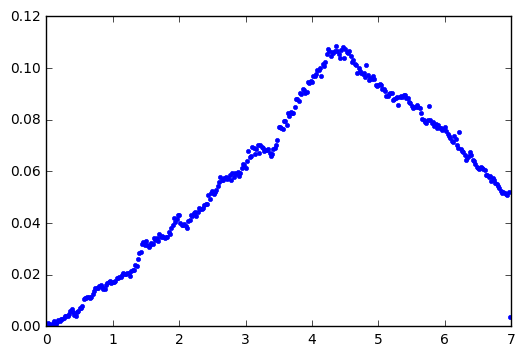

('K1 =', 1395.1886630793538, '+/-', 138993.55449434291)
('k2 =', 0.00080432842189686183, '+/-', 0.00026758914438334934)
('tau_1 =', 55852.44930086135, '+/-', 138993.55449434291)
('tau_2 =', 1.3531617209701514, '+/-', 0.00026758914438334934)


(0.0, 0.15)

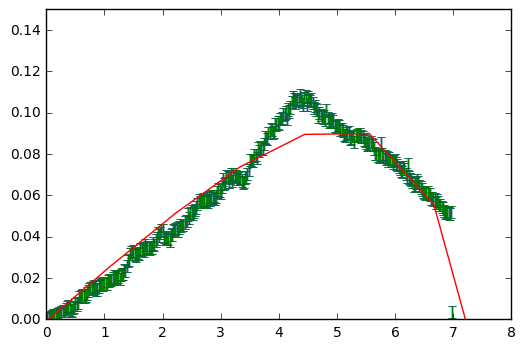

In [372]:
yaw_left_df = pd.read_csv('yaw_left_df_nrm.csv')
yaw_right_df = pd.read_csv('yaw_right_df_nrm.csv')
pitch_up_df = pd.read_csv('pitch_up_df_nrm.csv')
pitch_down_df = pd.read_csv('pitch_down_df_nrm.csv')
roll_cw_df = pd.read_csv('roll_cw_df_nrm.csv')
roll_ccw_df = pd.read_csv('roll_ccw_df_nrm.csv')


times = np.arange(500)*0.02
colors = times[150:350]

#plt.plot(times,yaw_left_df['i1_l'],clip_on = False,color = 'b')

x = times[150:550]-times[150]
y = yaw_left_df['hg3_l'][150:550]-(yaw_left_df['hg3_l'][150])
#y = K1*(1-math.e**(t/tau1)) - K2*(1-math.e**(t/tau2))

plt.plot(x, y, '.')
plt.show()


def exponential_f(t, K1, K2, tau1, tau2):
    return K1*(1-math.e**(-t/tau1)) - K2*(math.e**((t)/tau2))
    #K1*(1-math.e**(-t/tau1)) - K2*(math.e**((t)/tau2))
    #K1*(1-math.e**(t/tau1)) - K2*(1-math.e**(t/tau2))
    #y = K1*(1-math.e**(-t/tau1)) - K2*(math.e**((t)/tau2))
    

e = np.repeat(0.003, len(y))
plt.errorbar(x, y, yerr=e, fmt="none")


popt, pcov = curve_fit(exponential_f, x, y, sigma=e)

print("K1 =", popt[0], "+/-", pcov[0,0]**0.5)
print("k2 =", popt[1], "+/-", pcov[1,1]**0.5)
print("tau_1 =", popt[2], "+/-", pcov[0,0]**0.5)
print("tau_2 =", popt[3], "+/-", pcov[1,1]**0.5)

plt.errorbar(x, y, yerr=e, fmt="none")
xfine = np.linspace(0., 10., 10)  # define values to plot the function for
plt.plot(xfine, exponential_f(xfine, popt[0], popt[1], popt[2], popt[3]), 'r-')
plt.xlim(0, 8)
plt.ylim(0.00, 0.15)

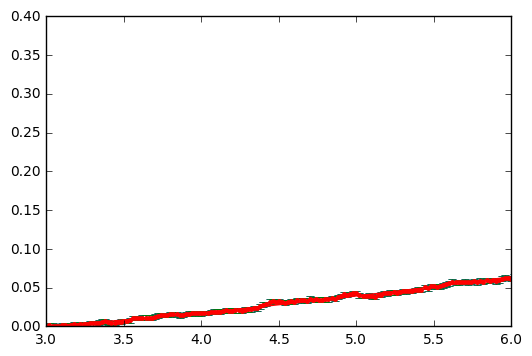

('K1 =', 306.18045198855253, '+/-', 54575.780626246713)
('k2 =', 0.13633921039628741, '+/-', 0.03255258835546624)
('tau_1 =', 9844.9138633134353, '+/-', 54575.780626246713)
('tau_2 =', 2.6194403573930969, '+/-', 0.03255258835546624)


(0.0, 0.4)

In [312]:
yaw_left_df = pd.read_csv('yaw_left_df_nrm.csv')
yaw_right_df = pd.read_csv('yaw_right_df_nrm.csv')
pitch_up_df = pd.read_csv('pitch_up_df_nrm.csv')
pitch_down_df = pd.read_csv('pitch_down_df_nrm.csv')
roll_cw_df = pd.read_csv('roll_cw_df_nrm.csv')
roll_ccw_df = pd.read_csv('roll_ccw_df_nrm.csv')


times = np.arange(350)*0.02
colors = times[150:350]

#plt.plot(times,yaw_left_df['i1_l'],clip_on = False,color = 'b')

x = times[150:350]
y = yaw_left_df['hg3_l'][150:350]-(yaw_left_df['hg3_l'][150])

plt.plot(x, y, '.')
plt.show()


def exponential_f(t, K1, K2, tau1, tau2):
    return K1*(1-math.e**(-t/tau1)) - K2*(1-math.e**(-(t)/tau2))
    #K1*(1-math.e**(-t/tau1)) - K2*(math.e**((t)/tau2))

e = np.repeat(0.003, len(y))
plt.errorbar(x, y, yerr=e, fmt="none")


popt, pcov = curve_fit(exponential_f, x, y, sigma=e, maxfev=100000)

print("K1 =", popt[0], "+/-", pcov[0,0]**0.5)
print("k2 =", popt[1], "+/-", pcov[1,1]**0.5)
print("tau_1 =", popt[2], "+/-", pcov[0,0]**0.5)
print("tau_2 =", popt[3], "+/-", pcov[1,1]**0.5)

plt.errorbar(x, y, yerr=e, fmt="none")
xfine = np.linspace(0.01, 10., 100)  # define values to plot the function for
plt.plot(xfine, exponential_f(xfine, popt[0], popt[1], popt[2], popt[3]), 'r-')
plt.xlim(3, 6)
plt.ylim(0.00, 0.4)

/home/imager/.local/lib/python2.7/site-packages/ipykernel/__main__.py:5: RuntimeWarning: divide by zero encountered in divide
/home/imager/.local/lib/python2.7/site-packages/ipykernel/__main__.py:5: RuntimeWarning: invalid value encountered in divide


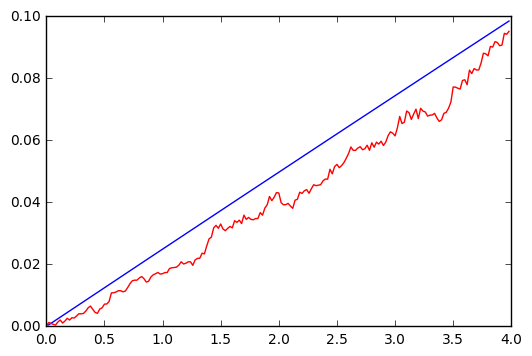

In [459]:

times = np.arange(350)*0.02
t = times[150:350]
x = t - times[150]
y= K1*(1-math.e**(-x/tau1)) - K2*(1-math.e**(-(x)/tau2))
y_data =yaw_left_df['hg3_l'][150:350]-(yaw_left_df['hg3_l'][150])
K1 = 5
K2 = 0
tau1 = 100
tau2 = 0

plt.plot(x, y)
plt.plot(x, y_data, 'r')
plt.xlim(0, 4)
plt.ylim(0, 0.1)

plt.show()

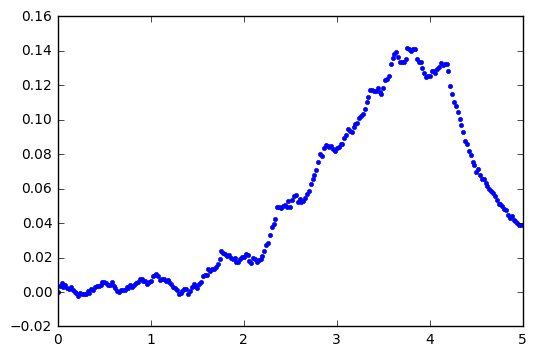

('K1 =', 3166.2600522100161, '+/-', 558118.56836240634)
('k2 =', 0.035363805064074175, '+/-', 0.0045973805096515422)
('tau_1 =', 49156.558112209605, '+/-', 558118.56836240634)
('tau_2 =', 2.5897751642411264, '+/-', 0.0045973805096515422)


(0.0, 0.15)

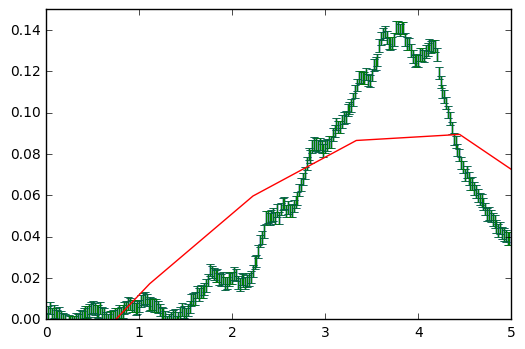

In [455]:
yaw_left_df = pd.read_csv('yaw_left_df_nrm.csv')
yaw_right_df = pd.read_csv('yaw_right_df_nrm.csv')
pitch_up_df = pd.read_csv('pitch_up_df_nrm.csv')
pitch_down_df = pd.read_csv('pitch_down_df_nrm.csv')
roll_cw_df = pd.read_csv('roll_cw_df_nrm.csv')
roll_ccw_df = pd.read_csv('roll_ccw_df_nrm.csv')


times = np.arange(500)*0.02
colors = times[150:350]

#plt.plot(times,yaw_left_df['i1_l'],clip_on = False,color = 'b')

x = times[150:400]-times[150]
y = pitch_up_df['b2_l'][150:400]-(pitch_up_df['b2_l'][150])
#y = K1*(1-math.e**(t/tau1)) - K2*(1-math.e**(t/tau2))

plt.plot(x, y, '.')
plt.show()


def exponential_f(t, K1, K2, tau1, tau2):
    return K1*(1-math.e**(-t/tau1)) - K2*(math.e**((t)/tau2))
    #K1*(1-math.e**(-t/tau1)) - K2*(math.e**((t)/tau2))
    #K1*(1-math.e**(t/tau1)) - K2*(1-math.e**(t/tau2))
    #y = K1*(1-math.e**(-t/tau1)) - K2*(math.e**((t)/tau2))
    

e = np.repeat(0.003, len(y))
plt.errorbar(x, y, yerr=e, fmt="none")


popt, pcov = curve_fit(exponential_f, x, y, sigma=e)

print("K1 =", popt[0], "+/-", pcov[0,0]**0.5)
print("k2 =", popt[1], "+/-", pcov[1,1]**0.5)
print("tau_1 =", popt[2], "+/-", pcov[0,0]**0.5)
print("tau_2 =", popt[3], "+/-", pcov[1,1]**0.5)

plt.errorbar(x, y, yerr=e, fmt="none")
xfine = np.linspace(0., 10., 10)  # define values to plot the function for
plt.plot(xfine, exponential_f(xfine, popt[0], popt[1], popt[2], popt[3]), 'r-')
plt.xlim(0, 5)
plt.ylim(0.00, 0.15)

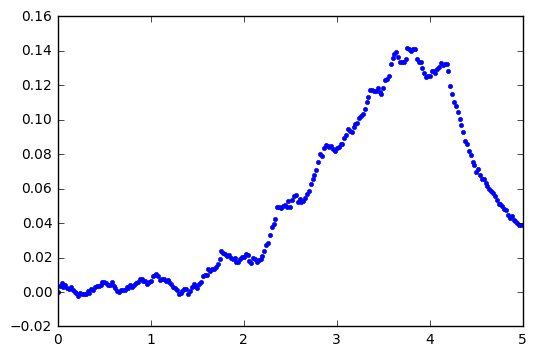

('K1 =', 3166.2600522100161, '+/-', 558118.56836240634)
('k2 =', 0.035363805064074175, '+/-', 0.0045973805096515422)
('tau_1 =', 49156.558112209605, '+/-', 558118.56836240634)
('tau_2 =', 2.5897751642411264, '+/-', 0.0045973805096515422)


(0.0, 0.15)

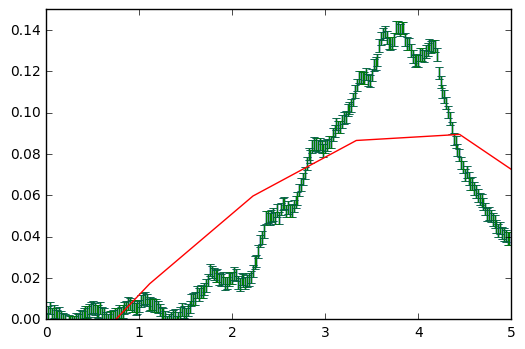

In [377]:
yaw_left_df = pd.read_csv('yaw_left_df_nrm.csv')
yaw_right_df = pd.read_csv('yaw_right_df_nrm.csv')
pitch_up_df = pd.read_csv('pitch_up_df_nrm.csv')
pitch_down_df = pd.read_csv('pitch_down_df_nrm.csv')
roll_cw_df = pd.read_csv('roll_cw_df_nrm.csv')
roll_ccw_df = pd.read_csv('roll_ccw_df_nrm.csv')


times = np.arange(500)*0.02
colors = times[150:350]

#plt.plot(times,yaw_left_df['i1_l'],clip_on = False,color = 'b')

x = times[150:400]-times[150]
y = pitch_up_df['b2_l'][150:400]-(pitch_up_df['b2_l'][150])
#y = K1*(1-math.e**(t/tau1)) - K2*(1-math.e**(t/tau2))

plt.plot(x, y, '.')
plt.show()


def exponential_f(t, K1, K2, tau1, tau2):
    return K1*(1-math.e**(-t/tau1)) - K2*(math.e**((t)/tau2))
    #K1*(1-math.e**(-t/tau1)) - K2*(math.e**((t)/tau2))
    #K1*(1-math.e**(t/tau1)) - K2*(1-math.e**(t/tau2))
    #y = K1*(1-math.e**(-t/tau1)) - K2*(math.e**((t)/tau2))
    

e = np.repeat(0.003, len(y))
plt.errorbar(x, y, yerr=e, fmt="none")


popt, pcov = curve_fit(exponential_f, x, y, sigma=e)

print("K1 =", popt[0], "+/-", pcov[0,0]**0.5)
print("k2 =", popt[1], "+/-", pcov[1,1]**0.5)
print("tau_1 =", popt[2], "+/-", pcov[0,0]**0.5)
print("tau_2 =", popt[3], "+/-", pcov[1,1]**0.5)

plt.errorbar(x, y, yerr=e, fmt="none")
xfine = np.linspace(0., 10., 10)  # define values to plot the function for
plt.plot(xfine, exponential_f(xfine, popt[0], popt[1], popt[2], popt[3]), 'r-')
plt.xlim(0, 5)
plt.ylim(0.00, 0.15)

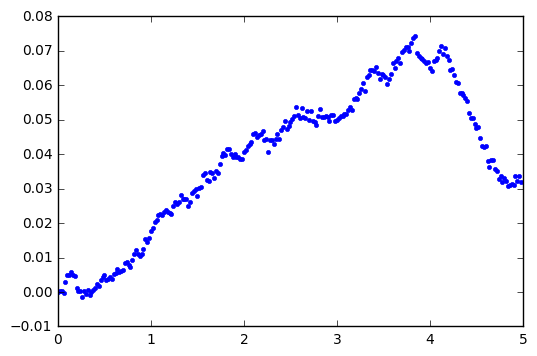

('K1 =', 1949.4679818673596, '+/-', 122366.7363489741)
('k2 =', 0.0079407838819628741, '+/-', 0.0010614560669526981)
('tau_1 =', 57729.272458073276, '+/-', 122366.7363489741)
('tau_2 =', 1.762959812076188, '+/-', 0.0010614560669526981)


(0.0, 0.15)

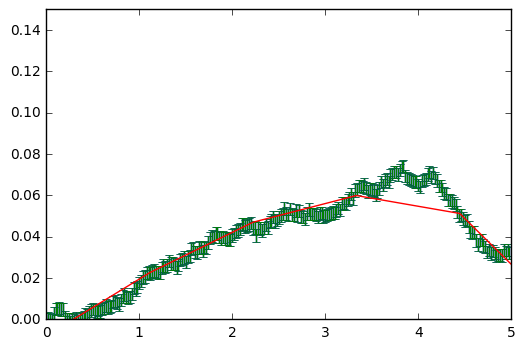

In [378]:
yaw_left_df = pd.read_csv('yaw_left_df_nrm.csv')
yaw_right_df = pd.read_csv('yaw_right_df_nrm.csv')
pitch_up_df = pd.read_csv('pitch_up_df_nrm.csv')
pitch_down_df = pd.read_csv('pitch_down_df_nrm.csv')
roll_cw_df = pd.read_csv('roll_cw_df_nrm.csv')
roll_ccw_df = pd.read_csv('roll_ccw_df_nrm.csv')


times = np.arange(500)*0.02
colors = times[150:350]

#plt.plot(times,yaw_left_df['i1_l'],clip_on = False,color = 'b')

x = times[150:400]-times[150]
y = pitch_up_df['hg2_l'][150:400]-(pitch_up_df['hg2_l'][150])
#y = K1*(1-math.e**(t/tau1)) - K2*(1-math.e**(t/tau2))

plt.plot(x, y, '.')
plt.show()


def exponential_f(t, K1, K2, tau1, tau2):
    return K1*(1-math.e**(-t/tau1)) - K2*(math.e**((t)/tau2))
    #K1*(1-math.e**(-t/tau1)) - K2*(math.e**((t)/tau2))
    #K1*(1-math.e**(t/tau1)) - K2*(1-math.e**(t/tau2))
    #y = K1*(1-math.e**(-t/tau1)) - K2*(math.e**((t)/tau2))
    

e = np.repeat(0.003, len(y))
plt.errorbar(x, y, yerr=e, fmt="none")


popt, pcov = curve_fit(exponential_f, x, y, sigma=e)

print("K1 =", popt[0], "+/-", pcov[0,0]**0.5)
print("k2 =", popt[1], "+/-", pcov[1,1]**0.5)
print("tau_1 =", popt[2], "+/-", pcov[0,0]**0.5)
print("tau_2 =", popt[3], "+/-", pcov[1,1]**0.5)

plt.errorbar(x, y, yerr=e, fmt="none")
xfine = np.linspace(0., 10., 10)  # define values to plot the function for
plt.plot(xfine, exponential_f(xfine, popt[0], popt[1], popt[2], popt[3]), 'r-')
plt.xlim(0, 5)
plt.ylim(0.00, 0.15)

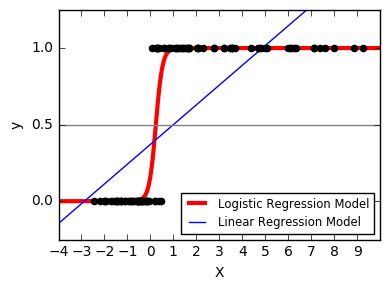

In [4]:
# General a toy dataset:s it's just a straight line with some Gaussian noise:
xmin, xmax = -5, 5
n_samples = 100
np.random.seed(0)
X = np.random.normal(size=n_samples)
y = (X > 0).astype(np.float)
X[X > 0] *= 4
X += .3 * np.random.normal(size=n_samples)

X = X[:, np.newaxis]

# Fit the classifier
clf = linear_model.LogisticRegression(C=1e5)
clf.fit(X, y)

# and plot the result
plt.figure(1, figsize=(4, 3))
plt.clf()
plt.scatter(X.ravel(), y, color='black', zorder=20)
X_test = np.linspace(-5, 10, 300)

loss = expit(X_test * clf.coef_ + clf.intercept_).ravel()
plt.plot(X_test, loss, color='red', linewidth=3)

ols = linear_model.LinearRegression()
ols.fit(X, y)
plt.plot(X_test, ols.coef_ * X_test + ols.intercept_, linewidth=1)
plt.axhline(.5, color='.5')

plt.ylabel('y')
plt.xlabel('X')
plt.xticks(range(-5, 10))
plt.yticks([0, 0.5, 1])
plt.ylim(-.25, 1.25)
plt.xlim(-4, 10)
plt.legend(('Logistic Regression Model', 'Linear Regression Model'),
           loc="lower right", fontsize='small')
plt.tight_layout()
plt.show()

In [11]:
# General a toy dataset:s it's just a straight line with some Gaussian noise:


import math

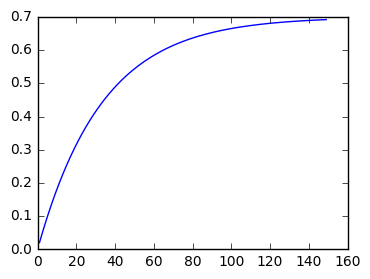

In [41]:
plt.figure(1, figsize=(4, 3))
x = np.arange(1,150)
M = 0.7
a =.03
y = M*(1-(math.e**(-a*x)))
#y = M(1− (np.exp(−ax)))
plt.plot(x, y)

plt.show()

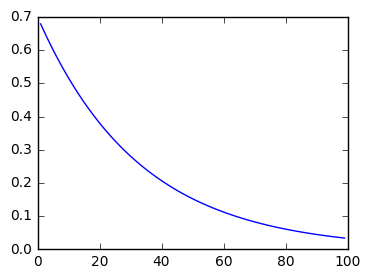

In [36]:
plt.figure(1, figsize=(4, 3))
x = np.arange(1,100)
b = 0.03
a =.7
y=a*(1-b)**x
#y = M(1− (np.exp(−ax)))
plt.plot(x, y)

plt.show()

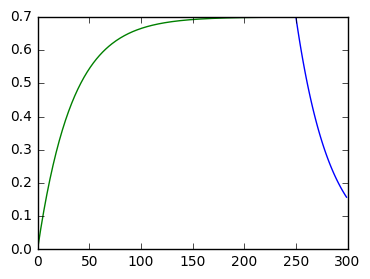

In [57]:
plt.figure(1, figsize=(4, 3))
x1 = np.arange(250,300)
b = 0.03
a =.7
y1=a*(1-b)**(x1-250)
#y = M(1− (np.exp(−ax)))
plt.plot(x1, y1)

x = np.arange(0,250)
M = 0.7
a2 =.03
y = M*(1-(math.e**(-a2*x)))
#y = M(1− (np.exp(−ax)))
plt.plot(x, y)

plt.xlim(0, 300)

plt.show()

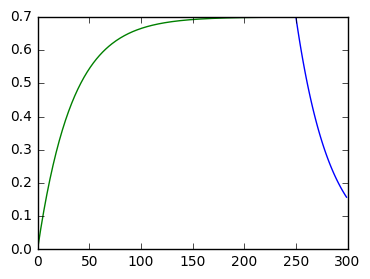

In [58]:
plt.figure(1, figsize=(4, 3))
x1 = np.arange(250,300)
b = 0.03
M =.7
y1=M*(1-b)**(x1-250)
#y = M(1− (np.exp(−ax)))
plt.plot(x1, y1)

x = np.arange(0,250)
M = 0.7
a2 =.03
y = M*(1-(math.e**(-a2*x)))
#y = M(1− (np.exp(−ax)))
plt.plot(x, y)

plt.xlim(0, 300)

plt.show()

In [60]:
import pandas as pd

/home/imager/.local/lib/python2.7/site-packages/pandas/core/computation/__init__.py:18: UserWarning: The installed version of numexpr 2.4.3 is not supported in pandas and will be not be used
The minimum supported version is 2.4.6

  ver=ver, min_ver=_MIN_NUMEXPR_VERSION), UserWarning)


In [70]:
yaw_left_df = pd.read_csv('yaw_left_df_nrm.csv')
yaw_right_df = pd.read_csv('yaw_right_df_nrm.csv')
pitch_up_df = pd.read_csv('pitch_up_df_nrm.csv')
pitch_down_df = pd.read_csv('pitch_down_df_nrm.csv')
roll_cw_df = pd.read_csv('roll_cw_df_nrm.csv')
roll_ccw_df = pd.read_csv('roll_ccw_df_nrm.csv')

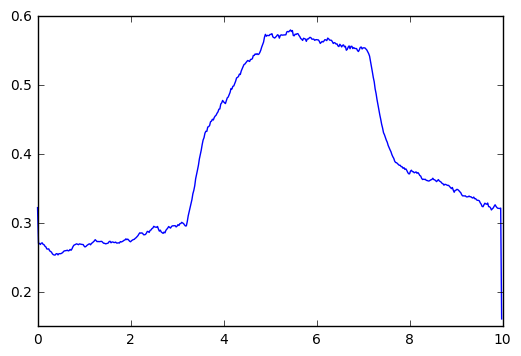

In [93]:

times = np.arange(500)*0.02
colors = times[150:350]

'''
x1= times[350:450]
b = 0.03
M =.55
y1=M*(1-b)**(x1-3)
#y = M(1− (np.exp(−ax)))
plt.plot(x1, y1)

x= times[150:350]
M = 0.55
a2 =.9
y = M*(1-(math.e**(-a2*x)))
#y = M(1− (np.exp(−ax)))
plt.plot(x, y)
'''
#plt.xlim(0, 300)

plt.plot(times,yaw_left_df['i1_l'],clip_on = False,color = 'b')


plt.show()

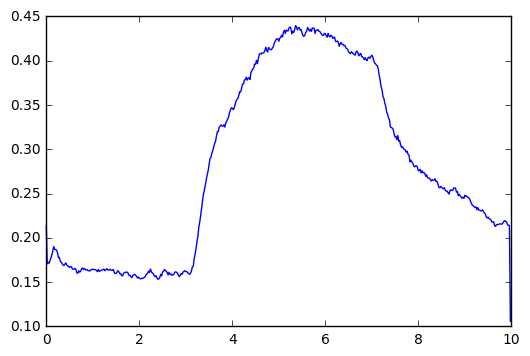

In [95]:

times = np.arange(500)*0.02
colors = times[150:350]

'''
x1= times[350:450]
b = 0.03
M =.55
y1=M*(1-b)**(x1-3)
#y = M(1− (np.exp(−ax)))
plt.plot(x1, y1)

x= times[150:350]
M = 0.55
a2 =.9
y = M*(1-(math.e**(-a2*x)))
#y = M(1− (np.exp(−ax)))
plt.plot(x, y)
'''
#plt.xlim(0, 300)

plt.plot(times,yaw_left_df['i2_l'],clip_on = False,color = 'b')


plt.show()

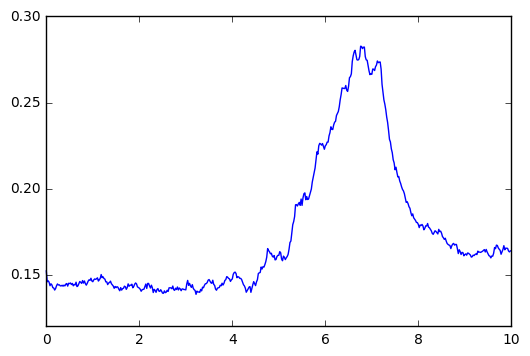

In [97]:

times = np.arange(500)*0.02
colors = times[150:350]

'''
x1= times[350:450]
b = 0.03
M =.55
y1=M*(1-b)**(x1-3)
#y = M(1− (np.exp(−ax)))
plt.plot(x1, y1)

x= times[150:350]
M = 0.55
a2 =.9
y = M*(1-(math.e**(-a2*x)))
#y = M(1− (np.exp(−ax)))
plt.plot(x, y)
'''
#plt.xlim(0, 300)

plt.plot(times,pitch_up_df['b2_l'],clip_on = False,color = 'b')


plt.show()

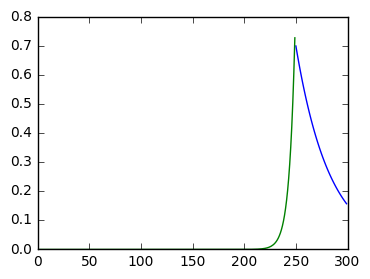

In [145]:
plt.figure(1, figsize=(4, 3))
x1 = np.arange(250,300)
b = 0.03
M =.7
y1=M*(1-b)**(x1-250)
#y = M(1− (np.exp(−ax)))
plt.plot(x1, y1)

x = np.arange(1,250)
M = .000000000000000000014
a2=1.2
y = M*(a2)**(x)
#y = M(1− (np.exp(−ax)))
plt.plot(x, y)

plt.xlim(0, 300)

plt.show()

In [2]:
x = time
den = x.max() - x.min()
x -= x.min()
y_points = rate
def func(x, a1, a2, a3):
    return  a1*sin(1*pi*x/den)+\
            a2*sin(2*pi*x/den)+\
            a3*sin(3*pi*x/den)
popt, pcov = curve_fit(func, x, y_points)
y = func(x, *popt)
plot(time,rate)
plot(x,y, color='r', linewidth=2.)
show()

NameError: name 'time' is not defined

In [1]:
data=pyfits.open('http://heasarc.gsfc.nasa.gov/docs/swift/results/transients/weak/GX304-1.orbit.lc.fits')
time  = data[1].data.field(0)/86400. + data[1].header['MJDREFF'] + data[1].header['MJDREFI']
rate  = data[1].data.field(1)
error = data[1].data.field(2)
data.close()

cond = ((time > 56200) & (time < 56220))
time=time[cond]
rate=rate[cond]
error=error[cond]

def expGauss(x, pos, wid, tConst, expMod = 0.5, amp = 1):
    expMod *= 1.0
    gNorm = amp * N.exp(-0.5*((x-pos)/(wid))**2)
    g = expBroaden(gNorm, tConst, expMod)
    return g, gNorm

def expBroaden(y, t, expMod):
    fy = F.fft(y)
    a = N.exp(-1*expMod*time/t)
    fa = F.fft(a)
    fy1 = fy*fa
    yb = (F.ifft(fy1).real)/N.sum(a)
    return yb

if __name__ == '__main__':

# Fit the first set
#p[0] -- amplitude, p[1] -- position, p[2] -- width
    fitfuncG = lambda p, x: p[0]*N.exp(-0.5*(x-p[1])**2/p[2]**2) # Target function
    errfuncG = lambda p, x, y: fitfuncG(p, x) - y # Distance to the target function
    p0 = [0.20, 56210, 2.0] # Initial guess for the parameters
    p1, success = optimize.leastsq(errfuncG, p0[:], args=(time, rate))
    p1G = fitfuncG(p1, time)
   # P.plot(rate,  'ro', alpha = 0.4, label = "Gaussian")
   # P.plot(p1G, label = 'G-Fit')

def expGauss(x, pos, wid, tConst, expMod = 0.5, amp = 1):
  #p[0] -- amplitude, p[1] -- position, p[2] -- width, p[3]--tConst, p[4] -- expMod  
    fitfuncExpG = lambda p, x: expGauss(x, p[1], p[2], p[3], p[4], p[0])[0]
    errfuncExpG = lambda p, x, y: fitfuncExpG(p, x) - y # Distance to the target function  
    p0a = [0.20, 56210, 2.0] # Initial guess for the parameters
    p1a, success = optimize.leastsq(errfuncExpG, p0a[:], args=(time, rate))
    p1aG = fitfuncExpG(p1a, time)
    print type(rate), type(time), len(rate), len(time)  
    P.plot(rate, 'go', alpha = 0.4, label = "ExpGaussian")  
    P.plot(p1aG, label = 'ExpG-Fit')

    P.legend()  
    P.show()

ImportError: No module named pyfits